# Problem statement and objective
* Air travel is increasing now a days also complex problem associated with that is also increasing now a days due tomany attributes. Consequence of flight delay impact on variables such as impacts carrier, Airport and passenger and may result in significant commercial loss or reputation loss to all the stakeholders and thus huge cost on the economy. Thus, problem on flight delay prediction plays a vital role from customer and management and time management perspective and carrier for retention of customer faith but also from Airport point of view for managing the traffic more efficiently to optimise the number of arriving flights by appropriate adjustment of schedules. One of the aspects for the flight delay is the contribution of weather conditions. 
  
* The historical data containing scheduled departure  and arrival times, date, origin, destination and also weather data is available  and the data scientists can predict if delay can happen or not  using the flight data and aviation weather data for a specific flight.


# Importing library

In [1]:
# importing libraries
import os
import re

import pandas as pd
import numpy as np

#Import libraries for plotting 
from matplotlib import pyplot as plt
import seaborn as sns
import plotly
from plotly.offline import iplot
import plotly.graph_objs as go

import datetime

# Importing libraries for feature selection by varianceThresholdmethod and chi2_contingency
from sklearn.feature_selection import VarianceThreshold
from scipy.stats import chi2_contingency
import statsmodels.api as sm

#Train test split
from sklearn.model_selection import train_test_split
# imputing for missing values
from sklearn.impute import SimpleImputer 
# Standerdisation of numeric attributes and dummification of cat features
from sklearn.preprocessing import StandardScaler, OneHotEncoder 
from category_encoders.target_encoder import TargetEncoder
from sklearn_pandas import DataFrameMapper

# importing performance metrics
from sklearn.metrics import accuracy_score,recall_score,precision_score,f1_score 
from sklearn.metrics import classification_report, confusion_matrix
# Compute ROC curve and ROC area for each class
from sklearn.metrics import roc_curve,roc_auc_score

# importing models
from sklearn.linear_model import LogisticRegression

from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.svm import SVC
from sklearn import svm
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import StratifiedShuffleSplit
from xgboost import XGBClassifier
from sklearn.decomposition import PCA
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import RidgeClassifier

# !pip install imblearn
from imblearn.over_sampling import SMOTE

from IPython.display import Image

import warnings
warnings.filterwarnings("ignore")

In [2]:
# Reading train data files
train_data_path = "20210322_Traindata/Train.csv"
train_data = pd.read_csv(train_data_path)

In [3]:
train_data.head()
# train_data.shape

,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,Distance,ActualArrivalTimeStamp
0,BOS_CLE_29089,2004,9,20,1,1000,1154,114,BOS,CLE,563,20/09/04 11:54
1,CLE_ATL_44346,2004,11,19,5,1440,1634,114,CLE,ATL,554,19/11/04 18:55
2,SNA_LAS_44378,2004,5,4,2,1800,1902,62,SNA,LAS,226,04/05/04 19:02
3,CLT_TPA_51502,2004,7,6,2,1400,1533,93,CLT,TPA,508,06/07/04 15:33
4,MSP_ORD_44884,2004,9,23,4,830,946,76,MSP,ORD,334,23/09/04 09:46


In [4]:
train_data["DayOfWeek"].value_counts()

4    1172
5    1157
3    1155
1    1141
2    1106
7    1066
6    1064
Name: DayOfWeek, dtype: int64

Conclusion: Day of week is in ISO Format

In [5]:
# it gives the shape, value_counts and uniqueness level in the data
def counts_and_value_counts(x):
    dataframe = pd.DataFrame(x)
    
    for col in dataframe.columns:
        print("shape of df ", dataframe.shape)
        print("no_of_rows in df", len(dataframe.index))
#         print(col, "count in", dataframe[col].count())
        print("colname:", col, ",", "their value count in", len(dataframe[col].value_counts()))
#         print(col, "Unique", (dataframe[col].nunique()))
        print("% unique at ", col, (dataframe[col].value_counts().count()/len(dataframe.index))*100,"%")
        print("---------------------------------------")
    

In [6]:
print("************Train data details ******************")
counts_and_value_counts(train_data)

************Train data details ******************
shape of df  (7861, 12)
no_of_rows in df 7861
colname: FlightNumber , their value count in 7861
% unique at  FlightNumber 100.0 %
---------------------------------------
shape of df  (7861, 12)
no_of_rows in df 7861
colname: Year , their value count in 1
% unique at  Year 0.012721027859051012 %
---------------------------------------
shape of df  (7861, 12)
no_of_rows in df 7861
colname: Month , their value count in 6
% unique at  Month 0.07632616715430607 %
---------------------------------------
shape of df  (7861, 12)
no_of_rows in df 7861
colname: DayofMonth , their value count in 31
% unique at  DayofMonth 0.3943518636305814 %
---------------------------------------
shape of df  (7861, 12)
no_of_rows in df 7861
colname: DayOfWeek , their value count in 7
% unique at  DayOfWeek 0.08904719501335707 %
---------------------------------------
shape of df  (7861, 12)
no_of_rows in df 7861
colname: ScheduledDepTime , their value count in 

## Reading and mering the different hourly weather data file and hourly ppt data file. These file are contacted 

In [7]:
hourly_200401hourly = pd.read_csv(r"20210322_weatherdatatoconsider/2004/200401hourly.txt", low_memory=False)
hourly_200403hourly = pd.read_csv(r"20210322_weatherdatatoconsider/2004/200403hourly.txt", low_memory=False)
hourly_200405hourly = pd.read_csv(r"20210322_weatherdatatoconsider/2004/200405hourly.txt", low_memory=False)
hourly_200407hourly = pd.read_csv(r"20210322_weatherdatatoconsider/2004/200407hourly.txt", low_memory=False)
hourly_200409hourly = pd.read_csv(r"20210322_weatherdatatoconsider/2004/200409hourly.txt", low_memory=False)
hourly_200411hourly = pd.read_csv(r"20210322_weatherdatatoconsider/2004/200411hourly.txt", low_memory=False)

In [8]:
hourly_200401hpd = pd.read_csv(r"20210322_weatherdatatoconsider/2004/200401hpd.txt")
hourly_200403hpd = pd.read_csv(r"20210322_weatherdatatoconsider/2004/200403hpd.txt")
hourly_200405hpd = pd.read_csv(r"20210322_weatherdatatoconsider/2004/200405hpd.txt")
hourly_200407hpd = pd.read_csv(r"20210322_weatherdatatoconsider/2004/200407hpd.txt")
hourly_200409hpd = pd.read_csv(r"20210322_weatherdatatoconsider/2004/200409hpd.txt")
hourly_200411hpd = pd.read_csv(r"20210322_weatherdatatoconsider/2004/200411hpd.txt")


* Conctation with respect to month wise rowbind

In [9]:
total_hourly_records = pd.concat([hourly_200401hourly, hourly_200403hourly, hourly_200405hourly,
                                  hourly_200407hourly, hourly_200409hourly, hourly_200411hourly], axis=0)

total_hpd_records = pd.concat([hourly_200401hpd, hourly_200403hpd, hourly_200405hpd,
                                  hourly_200407hpd, hourly_200409hpd, hourly_200411hpd], axis=0)

In [10]:
print("*********** total hourly records *************")
print("Shape of total hourly records ", total_hourly_records.shape)

total_hourly_records.head()

*********** total hourly records *************
Shape of total hourly records  (6485177, 12)


,WeatherStationID,YearMonthDay,Time,SkyConditions,Visibility,DBT,DewPointTemp,RelativeHumidityPercent,WindSpeed,WindDirection,WindGustValue,StationPressure
0,3034,20040101,10,OVC095,10SM,30.0,7.0,38.0,0,000,0.0,30.10
1,3035,20040101,10,SCT110,10SM,43.0,18.0,37.0,0,000,0.0,30.07
2,3039,20040101,10,OVC002,0.25SM,14.0,12.0,92.0,0,000,0.0,30.01
3,3040,20040101,10,CLR,10SM,30.0,21.0,69.0,9,250,0.0,29.82
4,4128,20040101,10,BKN001 BKN010 OVC024,4SM,NaN,NaN,NaN,0,000,0.0,29.80


In [11]:
print("*********** total hpd records *************")
print("shape of total hpd records ", total_hpd_records.shape)
total_hpd_records.head()

*********** total hpd records *************
shape of total hpd records  (7697386, 4)


,WeatherStationID,YearMonthDay,Time,HourlyPrecip
0,3034,20040101,10,0.0
1,3035,20040101,10,0.0
2,3039,20040101,10,0.0
3,3040,20040101,10,0.0
4,4128,20040101,10,0.0


## Explorator data analysis on the weather data and hpd data files
* Since Weather is playing cruicial role in delay of flight. EDA on Weather data is important 
- 1) Checking valuecounts, and counts and uniqueness in the datasets

In [12]:
print("****************Name of the dataframe : ", "total_hourly_records***********************")
print()
counts_and_value_counts(total_hourly_records)
print()
print("=" * 80)
print()
print("=" * 80)
print()
print("***************Name of the dataframe : ", "total_hpd_records**************************")
print()
counts_and_value_counts(total_hpd_records)

****************Name of the dataframe :  total_hourly_records***********************

shape of df  (6485177, 12)
no_of_rows in df 6485177
colname: WeatherStationID , their value count in 1447
% unique at  WeatherStationID 0.02231242107964054 %
---------------------------------------
shape of df  (6485177, 12)
no_of_rows in df 6485177
colname: YearMonthDay , their value count in 157
% unique at  YearMonthDay 0.002420905397030798 %
---------------------------------------
shape of df  (6485177, 12)
no_of_rows in df 6485177
colname: Time , their value count in 1428
% unique at  Time 0.022019445267261017 %
---------------------------------------
shape of df  (6485177, 12)
no_of_rows in df 6485177
colname: SkyConditions , their value count in 247019
% unique at  SkyConditions 3.8089785367461824 %
---------------------------------------
shape of df  (6485177, 12)
no_of_rows in df 6485177
colname: Visibility , their value count in 73
% unique at  Visibility 0.0011256439107213264 %
------------

* 2) Resetting the index

In [13]:
total_hourly_records = total_hourly_records.reset_index(drop=True)
total_hpd_records = total_hpd_records.reset_index(drop=True)

### checking any pattrens in total_hourly_records and total_hpd_records

In [14]:
# This function will check pattrents in the features. If there is any pattrents can be identified 
# and can be removed depending upon the attribute information
def symbols(x):
    other_symbols = dict()
    dataframe = pd.DataFrame(x)
    for col in dataframe.columns:
        for val in (dataframe[col]):
            result = (re.findall(r"[^0-9a-zA-Z]", str(val)))
            if result == None:
                other_symbols[col] = 0
            else:
                other_symbols[col] = result
    return other_symbols

In [15]:
print("*********** pattrents checking in total_hourly_records ****************")
symbols(total_hourly_records)

*********** pattrents checking in total_hourly_records ****************


{'WeatherStationID': [],
 'YearMonthDay': [],
 'Time': [],
 'SkyConditions': [],
 'Visibility': [],
 'DBT': ['.'],
 'DewPointTemp': ['.'],
 'RelativeHumidityPercent': ['.'],
 'WindSpeed': ['.'],
 'WindDirection': [],
 'WindGustValue': ['.'],
 'StationPressure': ['.']}

In [16]:
print("*********** pattrents checking in total_hpd_records ****************")
symbols(total_hpd_records)

*********** pattrents checking in total_hpd_records ****************


{'WeatherStationID': [], 'YearMonthDay': [], 'Time': [], 'HourlyPrecip': ['.']}

* 3) excrating of month, year, dayofmonth, dayof week information from both total_hourly_records and total_hpd_records since train data consist of daysofweek Month daysMonth records. 


In [17]:
total_hourly_records["YearMonthDay"] = pd.to_datetime(total_hourly_records["YearMonthDay"], format='%Y%m%d')

Year = pd.DatetimeIndex(total_hourly_records["YearMonthDay"]).year
Month = pd.DatetimeIndex(total_hourly_records["YearMonthDay"]).month
DayOfMonth = pd.DatetimeIndex(total_hourly_records["YearMonthDay"]).day
DayOfWeek = pd.DatetimeIndex(total_hourly_records["YearMonthDay"]).weekday

total_hourly_records["Year"] = Year
total_hourly_records["Month"] = Month
total_hourly_records["DayofMonth"] = DayOfMonth
total_hourly_records["DayOfWeek"] = DayOfWeek
total_hourly_records["DayOfWeek"] = total_hourly_records["DayOfWeek"] + 1  # since iso format of weekdays


total_hpd_records["YearMonthDay"] = pd.to_datetime(total_hpd_records["YearMonthDay"], format='%Y%m%d')
Year = pd.DatetimeIndex(total_hpd_records["YearMonthDay"]).year
Month = pd.DatetimeIndex(total_hpd_records["YearMonthDay"]).month
DayOfMonth = pd.DatetimeIndex(total_hpd_records["YearMonthDay"]).day
DayOfWeek = pd.DatetimeIndex(total_hpd_records["YearMonthDay"]).weekday

total_hpd_records["Year"] = Year
total_hpd_records["Month"] = Month
total_hpd_records["DayofMonth"] = DayOfMonth
total_hpd_records["DayOfWeek"] = DayOfWeek
total_hpd_records["DayOfWeek"] = total_hpd_records["DayOfWeek"] + 1 # since iso format of weekdays

In [18]:
total_hourly_records.head()

,WeatherStationID,YearMonthDay,Time,SkyConditions,Visibility,DBT,DewPointTemp,RelativeHumidityPercent,WindSpeed,WindDirection,WindGustValue,StationPressure,Year,Month,DayofMonth,DayOfWeek
0,3034,2004-01-01,10,OVC095,10SM,30.0,7.0,38.0,0,000,0.0,30.10,2004,1,1,4
1,3035,2004-01-01,10,SCT110,10SM,43.0,18.0,37.0,0,000,0.0,30.07,2004,1,1,4
2,3039,2004-01-01,10,OVC002,0.25SM,14.0,12.0,92.0,0,000,0.0,30.01,2004,1,1,4
3,3040,2004-01-01,10,CLR,10SM,30.0,21.0,69.0,9,250,0.0,29.82,2004,1,1,4
4,4128,2004-01-01,10,BKN001 BKN010 OVC024,4SM,NaN,NaN,NaN,0,000,0.0,29.80,2004,1,1,4


In [19]:
total_hpd_records.head()

,WeatherStationID,YearMonthDay,Time,HourlyPrecip,Year,Month,DayofMonth,DayOfWeek
0,3034,2004-01-01,10,0.0,2004,1,1,4
1,3035,2004-01-01,10,0.0,2004,1,1,4
2,3039,2004-01-01,10,0.0,2004,1,1,4
3,3040,2004-01-01,10,0.0,2004,1,1,4
4,4128,2004-01-01,10,0.0,2004,1,1,4


* Removing coulmn such as "YearMonthDay", "Time", "Year" in total_hpd_records, as it is extracted, also time details in total_hpd_records of the column is removed as the data in train is related to dayofweek and month and dayofmonth record. hourly records is not there. 

* Data is grouping and aggrigating with repect to train records and aggregation such as (min, max, sum, mean) is taken on remaining columns

In [20]:
total_hpd_records = total_hpd_records.drop(["YearMonthDay", "Time", "Year"], axis=1)
agg_total_hpd_records = total_hpd_records.groupby(["WeatherStationID","Month", "DayofMonth", "DayOfWeek"], as_index = False).aggregate({"HourlyPrecip" : ["min", "max", "sum", "mean"]})
agg_total_hpd_records.columns = ["".join(col) for col in agg_total_hpd_records.columns]
agg_total_hpd_records.head()

,WeatherStationID,Month,DayofMonth,DayOfWeek,HourlyPrecipmin,HourlyPrecipmax,HourlyPrecipsum,HourlyPrecipmean
0,3011,1,1,4,0.0,0.0,0.0,0.0
1,3011,1,2,5,0.0,0.0,0.0,0.0
2,3011,1,3,6,0.0,0.0,0.0,0.0
3,3011,1,4,7,0.0,0.0,0.0,0.0
4,3011,1,7,3,0.0,0.0,0.0,0.0


#### Data preprocessing for total total_hourly_records
* visbility column has SM, and pattren such as / chaning it to num after replacing SM to ""
* Wind direction has VRB records, when the mean wind speed is 3 knots or less, and a direction cannot be determined making VRB to 0 
* WindSpeed has many pattrens such as /, - etc, replacing with "" and converted to float. Some values are -ve
* WindDirection is converted to float
* Note VRB - Variable wind direction

In [21]:
# applying lambda function for removing SM
total_hourly_records["Visibility"] = total_hourly_records["Visibility"].apply(lambda x : str(x).replace("SM", ""))
# applying lambda function for removing /
total_hourly_records["Visibility"] = total_hourly_records["Visibility"].apply(lambda x : str(x).replace("/", ""))
## applying lambda function for VRB
total_hourly_records["WindDirection"] = total_hourly_records["WindDirection"].replace(to_replace = "VRB", value = "000")

## applying lambda function for windspped to remove /, -
total_hourly_records["WindSpeed"] = total_hourly_records["WindSpeed"].apply(lambda x : str(x).replace("/", ""))
total_hourly_records["WindSpeed"] = total_hourly_records["WindSpeed"].apply(lambda x : str(x).replace("-", ""))
total_hourly_records["WindSpeed"] = total_hourly_records["WindSpeed"].apply(lambda x : str(x))

# COnverting dtypes of visibility,windspeed, winddirection to float values
total_hourly_records["Visibility"] = total_hourly_records["Visibility"].astype("float64")
total_hourly_records["WindSpeed"] = total_hourly_records["WindSpeed"].astype("float64")
total_hourly_records["WindDirection"] = total_hourly_records["WindDirection"].astype("float64")

In [22]:
print("******** printing the headu after removing preprocessing***************")
total_hourly_records.head()

******** printing the headu after removing preprocessing***************


,WeatherStationID,YearMonthDay,Time,SkyConditions,Visibility,DBT,DewPointTemp,RelativeHumidityPercent,WindSpeed,WindDirection,WindGustValue,StationPressure,Year,Month,DayofMonth,DayOfWeek
0,3034,2004-01-01,10,OVC095,10.00,30.0,7.0,38.0,0.0,0.0,0.0,30.10,2004,1,1,4
1,3035,2004-01-01,10,SCT110,10.00,43.0,18.0,37.0,0.0,0.0,0.0,30.07,2004,1,1,4
2,3039,2004-01-01,10,OVC002,0.25,14.0,12.0,92.0,0.0,0.0,0.0,30.01,2004,1,1,4
3,3040,2004-01-01,10,CLR,10.00,30.0,21.0,69.0,9.0,250.0,0.0,29.82,2004,1,1,4
4,4128,2004-01-01,10,BKN001 BKN010 OVC024,4.00,NaN,NaN,NaN,0.0,0.0,0.0,29.80,2004,1,1,4


* Vibility of the column is left as its not giving any intution

In [23]:
get_max = lambda x: x.value_counts(dropna=False).index[0]
get_max.__name__ = "most frequent"

In [24]:
# Since the "YearMonthDay", "Time", "Year" already derived, deleting these records in the file
total_hourly_records = total_hourly_records.drop(["YearMonthDay", "Time", "Year"], axis=1)
# Since train data is consists of MONTH, DAYOFMONTH, DAYOFWEEK records, also WeatherStationID is the common key 
# for merging for hourly records and hpd records. need to do groupby with respect to these columns and 
# aggregation needs to be done for the remaing columns
agg_total_hourly_records = total_hourly_records.groupby(["WeatherStationID","Month", "DayofMonth", "DayOfWeek"], as_index = False).aggregate({"SkyConditions": [get_max],
                                                                                                            "Visibility":["min", "max", "sum", "mean"],
                                                                                                             "DBT" : ["min", "max", "sum", "mean"],
                                                                                                            "DewPointTemp" : ["min", "max", "sum", "mean"],
                                                                                                            "RelativeHumidityPercent" : ["min", "max", "sum", "mean"],
                                                                                                            "WindSpeed":["min", "max", "sum","mean"],
                                                                                                            "WindDirection" : ["min", "max", "sum","mean"],
                                                                                                            "WindGustValue" : ["min", "max", "sum", "mean"],
                                                                                                            "StationPressure" :["min", "max", "sum", "mean"]})

# Since it has two levels of columns so, it is contactinated using join operation   
agg_total_hourly_records.columns = ["".join(col) for col in agg_total_hourly_records.columns]
print("**********Print checking the head after grouping and aggregating the records of hourly data ********************")                                                                                                                                              
agg_total_hourly_records.head()

**********Print checking the head after grouping and aggregating the records of hourly data ********************


,WeatherStationID,Month,DayofMonth,DayOfWeek,SkyConditionsmost frequent,Visibilitymin,Visibilitymax,Visibilitysum,Visibilitymean,DBTmin,...,WindDirectionsum,WindDirectionmean,WindGustValuemin,WindGustValuemax,WindGustValuesum,WindGustValuemean,StationPressuremin,StationPressuremax,StationPressuresum,StationPressuremean
0,3011,1,1,4,BKN028 OVC033,9.00,10.00,29.00,9.666667,21.0,...,160.0,53.333333,0.0,0.0,0.0,0.00,30.05,30.06,90.17,30.056667
1,3011,1,2,5,SCT015 BKN020 OVC028,1.25,10.00,41.25,4.125000,25.0,...,520.0,52.000000,0.0,27.0,27.0,2.70,29.83,30.00,299.36,29.936000
2,3011,1,3,6,OVC006,0.50,10.00,59.00,3.277778,12.0,...,3140.0,157.000000,0.0,24.0,45.0,2.25,29.63,29.75,593.64,29.682000
3,3011,1,4,7,OVC004,1.25,1.25,1.25,1.250000,14.0,...,280.0,280.000000,0.0,0.0,0.0,0.00,29.79,29.79,29.79,29.790000
4,3011,3,1,1,OVC014,3.00,10.00,81.00,9.000000,10.0,...,1220.0,135.555556,0.0,0.0,0.0,0.00,29.88,29.93,269.11,29.901111


In [25]:
print("*********Shape of records*********************")
print()
agg_total_hourly_records.shape

*********Shape of records*********************



(204053, 37)

* Merging all aggregated records of hourly data and hpd data by inner join with respect "WeatherStationID", "Month", "DayOfWeek", "DayOfMonth" as train data is having the same features

In [26]:
# Merging all aggregated records of hourly data and hpd data by inner join
merged_agg_record_hpd_hourly = pd.merge(left = agg_total_hpd_records, right=agg_total_hourly_records, on = ["WeatherStationID", "Month","DayOfWeek", "DayofMonth"], how = "inner")

# For all station records analysis

In [27]:
# reading the data
all_station_records = pd.read_csv(r"20210322_weatherdatatoconsider/AllStationsData_PHD.txt", sep = "|")

In [28]:
# checking top 5 records of the data
print("************Checking all station records *************************")
all_station_records.head()

************Checking all station records *************************


,WeatherStationID,AirportID,GroundHeight,StationHeight,BarometerHeight,Latitude,Longitude,TimeZone
0,3011,TEX,0,0,0,37.57,-107.55,+7
1,3012,SKX,0,0,0,36.28,-105.40,+7
2,3013,LAA,3683,3703,3675,38.04,-102.41,+7
3,3014,4SL,0,6909,0,35.47,-107.14,+7
4,3016,RIL,5503,5544,5506,39.32,-107.44,+7


In [29]:
print("Checking the pattrens of all station records")
print()
symbols(all_station_records)

Checking the pattrens of all station records



{'WeatherStationID': [],
 'AirportID': [],
 'GroundHeight': [],
 'StationHeight': [],
 'BarometerHeight': [],
 'Latitude': ['.'],
 'Longitude': ['-', '.'],
 'TimeZone': ['+']}

In [30]:
print("*********** checking all station records data with respect to count, value count shape ******************")
print()
counts_and_value_counts(all_station_records)


*********** checking all station records data with respect to count, value count shape ******************

shape of df  (1744, 8)
no_of_rows in df 1744
colname: WeatherStationID , their value count in 1744
% unique at  WeatherStationID 100.0 %
---------------------------------------
shape of df  (1744, 8)
no_of_rows in df 1744
colname: AirportID , their value count in 1744
% unique at  AirportID 100.0 %
---------------------------------------
shape of df  (1744, 8)
no_of_rows in df 1744
colname: GroundHeight , their value count in 720
% unique at  GroundHeight 41.284403669724774 %
---------------------------------------
shape of df  (1744, 8)
no_of_rows in df 1744
colname: StationHeight , their value count in 919
% unique at  StationHeight 52.694954128440365 %
---------------------------------------
shape of df  (1744, 8)
no_of_rows in df 1744
colname: BarometerHeight , their value count in 730
% unique at  BarometerHeight 41.857798165137616 %
---------------------------------------
sh

* Since in all station records, datas are available for all station data, but the records such as houry records and precipitaion records of all stations records are not availabe. It is better to merged_agg_record_hpd_hourly and all station records are having common column WeatherStationID, Merging the data w.r.t inner join


In [31]:
# Merging operation w.r.t weatherstationID for merged data and all station recordsdata
inner_merged_asd = pd.merge(left = merged_agg_record_hpd_hourly, right=all_station_records, left_on= "WeatherStationID", right_on="WeatherStationID", how = "inner")

In [32]:
inner_merged_asd.to_csv("inner_merged_asd.csv")

In [33]:
# Checking top 5 records of the data
print("**********Checking top 5  records of the data ***********************")
inner_merged_asd.head()

**********Checking top 5  records of the data ***********************


,WeatherStationID,Month,DayofMonth,DayOfWeek,HourlyPrecipmin,HourlyPrecipmax,HourlyPrecipsum,HourlyPrecipmean,SkyConditionsmost frequent,Visibilitymin,...,StationPressuremax,StationPressuresum,StationPressuremean,AirportID,GroundHeight,StationHeight,BarometerHeight,Latitude,Longitude,TimeZone
0,3011,1,1,4,0.0,0.0,0.0,0.0,BKN028 OVC033,9.00,...,30.06,90.17,30.056667,TEX,0,0,0,37.57,-107.55,+7
1,3011,1,2,5,0.0,0.0,0.0,0.0,SCT015 BKN020 OVC028,1.25,...,30.00,299.36,29.936000,TEX,0,0,0,37.57,-107.55,+7
2,3011,1,3,6,0.0,0.0,0.0,0.0,OVC006,0.50,...,29.75,593.64,29.682000,TEX,0,0,0,37.57,-107.55,+7
3,3011,1,4,7,0.0,0.0,0.0,0.0,OVC004,1.25,...,29.79,29.79,29.790000,TEX,0,0,0,37.57,-107.55,+7
4,3011,3,1,1,0.0,0.0,0.0,0.0,OVC014,3.00,...,29.93,269.11,29.901111,TEX,0,0,0,37.57,-107.55,+7


In [34]:
print("******* checking the shape of inner_merged_asd after mering with all station record data*************")
inner_merged_asd.shape

******* checking the shape of inner_merged_asd after mering with all station record data*************


(203799, 48)

In [35]:
inner_merged_asd.to_csv("inner_merged_asd.csv")

# Train data Analysis

In [36]:
# Reading train data records
train_data_path = "20210322_Traindata/Train.csv"
# test_data_path = "20210328_Testdata/Test.csv"

In [37]:
train_data = pd.read_csv(train_data_path)
# test_data = pd.read_csv(test_data_path)
train_data.head()

,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,Distance,ActualArrivalTimeStamp
0,BOS_CLE_29089,2004,9,20,1,1000,1154,114,BOS,CLE,563,20/09/04 11:54
1,CLE_ATL_44346,2004,11,19,5,1440,1634,114,CLE,ATL,554,19/11/04 18:55
2,SNA_LAS_44378,2004,5,4,2,1800,1902,62,SNA,LAS,226,04/05/04 19:02
3,CLT_TPA_51502,2004,7,6,2,1400,1533,93,CLT,TPA,508,06/07/04 15:33
4,MSP_ORD_44884,2004,9,23,4,830,946,76,MSP,ORD,334,23/09/04 09:46


In [38]:
print("************ Checking train data records**************")
print()
counts_and_value_counts(train_data)

************ Checking train data records**************

shape of df  (7861, 12)
no_of_rows in df 7861
colname: FlightNumber , their value count in 7861
% unique at  FlightNumber 100.0 %
---------------------------------------
shape of df  (7861, 12)
no_of_rows in df 7861
colname: Year , their value count in 1
% unique at  Year 0.012721027859051012 %
---------------------------------------
shape of df  (7861, 12)
no_of_rows in df 7861
colname: Month , their value count in 6
% unique at  Month 0.07632616715430607 %
---------------------------------------
shape of df  (7861, 12)
no_of_rows in df 7861
colname: DayofMonth , their value count in 31
% unique at  DayofMonth 0.3943518636305814 %
---------------------------------------
shape of df  (7861, 12)
no_of_rows in df 7861
colname: DayOfWeek , their value count in 7
% unique at  DayOfWeek 0.08904719501335707 %
---------------------------------------
shape of df  (7861, 12)
no_of_rows in df 7861
colname: ScheduledDepTime , their value cou

In [39]:
print("***********Checking any pattrens in the data*****************")
symbols(train_data)

***********Checking any pattrens in the data*****************


{'FlightNumber': ['_', '_'],
 'Year': [],
 'Month': [],
 'DayofMonth': [],
 'DayOfWeek': [],
 'ScheduledDepTime': [],
 'ScheduledArrTime': [],
 'ScheduledTravelTime': [],
 'Origin': [],
 'Destination': [],
 'Distance': [],
 'ActualArrivalTimeStamp': ['/', '/', ' ', ':']}

In [40]:
print("Checking out the univate stats of the data for numeric attributes**************")
train_data.describe()

Checking out the univate stats of the data for numeric attributes**************


,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Distance
count,7861.0,7861.00000,7861.000000,7861.000000,7861.000000,7861.000000,7861.000000,7861.000000
mean,2004.0,7.12085,15.441292,3.960946,1198.225417,1412.232922,129.623839,743.764025
std,0.0,2.82233,9.049019,1.980921,354.923067,369.739052,63.272072,522.629372
min,2004.0,1.00000,1.000000,1.000000,215.000000,553.000000,61.000000,69.000000
25%,2004.0,5.00000,7.000000,2.000000,900.000000,1111.000000,83.000000,368.000000
50%,2004.0,7.00000,15.000000,4.000000,1215.000000,1430.000000,112.000000,595.000000
75%,2004.0,9.00000,23.000000,6.000000,1518.000000,1728.000000,155.000000,951.000000
max,2004.0,11.00000,31.000000,7.000000,1800.000000,2300.000000,562.000000,4962.000000


* Since records are need to be merged with respect to origin and desitnation from train records to Airport id of inner meged record is by inner join operation. Along with that other column such as Month dayofmonth dayofweek is also need to be taken care while merging

In [41]:
# merging the train records with inner merged data through inner join operations
origin_train_data = pd.merge(left = train_data, right=inner_merged_asd, left_on= ["Month","DayofMonth","DayOfWeek","Origin"], right_on=["Month","DayofMonth","DayOfWeek","AirportID"], how = "inner")

In [42]:
# Similar merging operations is done for destination data 
destination_train_data = pd.merge(left = train_data, right=inner_merged_asd, left_on= ["Month","DayofMonth","DayOfWeek","Destination"], right_on=["Month","DayofMonth","DayOfWeek","AirportID"], how = "inner")

In [43]:
print("******** printing shape of origin_train_data *********")
origin_train_data.shape

******** printing shape of origin_train_data *********


(7861, 57)

In [44]:
# Checking head for the top 5 records for origin data
origin_train_data.head()

,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,...,StationPressuremax,StationPressuresum,StationPressuremean,AirportID,GroundHeight,StationHeight,BarometerHeight,Latitude,Longitude,TimeZone
0,BOS_CLE_29089,2004,9,20,1,1000,1154,114,BOS,CLE,...,30.33,725.92,30.246667,BOS,19,30,180,42.22,-71.01,+5
1,CLE_ATL_44346,2004,11,19,5,1440,1634,114,CLE,ATL,...,29.31,701.95,29.247917,CLE,802,805,805,41.24,-81.51,+5
2,CLE_ATL_26139,2004,11,19,5,1650,1843,113,CLE,ATL,...,29.31,701.95,29.247917,CLE,802,805,805,41.24,-81.51,+5
3,CLE_MDT_40168,2004,11,19,5,1615,1717,62,CLE,MDT,...,29.31,701.95,29.247917,CLE,802,805,805,41.24,-81.51,+5
4,SNA_LAS_44378,2004,5,4,2,1800,1902,62,SNA,LAS,...,29.87,716.02,29.834167,SNA,49,55,52,33.41,-117.52,+8


In [45]:
# Checking head for the top 5 records for destination data
destination_train_data.head()

,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,...,StationPressuremax,StationPressuresum,StationPressuremean,AirportID,GroundHeight,StationHeight,BarometerHeight,Latitude,Longitude,TimeZone
0,BOS_CLE_29089,2004,9,20,1,1000,1154,114,BOS,CLE,...,29.55,707.85,29.493750,CLE,802,805,805,41.24,-81.51,+5
1,PVD_CLE_36894,2004,9,20,1,1745,1940,115,PVD,CLE,...,29.55,707.85,29.493750,CLE,802,805,805,41.24,-81.51,+5
2,CVG_CLE_50694,2004,9,20,1,905,1007,62,CVG,CLE,...,29.55,707.85,29.493750,CLE,802,805,805,41.24,-81.51,+5
3,CLE_ATL_44346,2004,11,19,5,1440,1634,114,CLE,ATL,...,29.15,698.14,29.089167,ATL,971,1026,974,33.38,-84.26,+5
4,ATW_ATL_45150,2004,11,19,5,1746,2056,130,ATW,ATL,...,29.15,698.14,29.089167,ATL,971,1026,974,33.38,-84.26,+5


In [46]:
print("******* checking shape for destination_train_data **************")
destination_train_data.shape

******* checking shape for destination_train_data **************


(7861, 57)

# Exploratory analysis on both origin train data and destination train data

In [47]:
# Checking top 5  records for origin data
origin_train_data.head()

,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,...,StationPressuremax,StationPressuresum,StationPressuremean,AirportID,GroundHeight,StationHeight,BarometerHeight,Latitude,Longitude,TimeZone
0,BOS_CLE_29089,2004,9,20,1,1000,1154,114,BOS,CLE,...,30.33,725.92,30.246667,BOS,19,30,180,42.22,-71.01,+5
1,CLE_ATL_44346,2004,11,19,5,1440,1634,114,CLE,ATL,...,29.31,701.95,29.247917,CLE,802,805,805,41.24,-81.51,+5
2,CLE_ATL_26139,2004,11,19,5,1650,1843,113,CLE,ATL,...,29.31,701.95,29.247917,CLE,802,805,805,41.24,-81.51,+5
3,CLE_MDT_40168,2004,11,19,5,1615,1717,62,CLE,MDT,...,29.31,701.95,29.247917,CLE,802,805,805,41.24,-81.51,+5
4,SNA_LAS_44378,2004,5,4,2,1800,1902,62,SNA,LAS,...,29.87,716.02,29.834167,SNA,49,55,52,33.41,-117.52,+8


In [48]:
print("******** checking details on origin_train_data *********")
print()
counts_and_value_counts(origin_train_data)

******** checking details on origin_train_data *********

shape of df  (7861, 57)
no_of_rows in df 7861
colname: FlightNumber , their value count in 7861
% unique at  FlightNumber 100.0 %
---------------------------------------
shape of df  (7861, 57)
no_of_rows in df 7861
colname: Year , their value count in 1
% unique at  Year 0.012721027859051012 %
---------------------------------------
shape of df  (7861, 57)
no_of_rows in df 7861
colname: Month , their value count in 6
% unique at  Month 0.07632616715430607 %
---------------------------------------
shape of df  (7861, 57)
no_of_rows in df 7861
colname: DayofMonth , their value count in 31
% unique at  DayofMonth 0.3943518636305814 %
---------------------------------------
shape of df  (7861, 57)
no_of_rows in df 7861
colname: DayOfWeek , their value count in 7
% unique at  DayOfWeek 0.08904719501335707 %
---------------------------------------
shape of df  (7861, 57)
no_of_rows in df 7861
colname: ScheduledDepTime , their value c

colname: TimeZone , their value count in 7
% unique at  TimeZone 0.08904719501335707 %
---------------------------------------


In [49]:
print("*********Checking column and dtypes of the data frame*************")
print()
origin_train_data.info()

*********Checking column and dtypes of the data frame*************

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7861 entries, 0 to 7860
Data columns (total 57 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   FlightNumber                 7861 non-null   object 
 1   Year                         7861 non-null   int64  
 2   Month                        7861 non-null   int64  
 3   DayofMonth                   7861 non-null   int64  
 4   DayOfWeek                    7861 non-null   int64  
 5   ScheduledDepTime             7861 non-null   int64  
 6   ScheduledArrTime             7861 non-null   int64  
 7   ScheduledTravelTime          7861 non-null   int64  
 8   Origin                       7861 non-null   object 
 9   Destination                  7861 non-null   object 
 10  Distance                     7861 non-null   int64  
 11  ActualArrivalTimeStamp       7861 non-null   object 
 12  WeatherS

#### checking statistics for origin_train_data

In [50]:
# statics of origin_train_data
origin_train_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,7861.0,2004.000000,0.000000,2004.000000,2004.000000,2004.000000,2004.000000,2004.000000
Month,7861.0,7.120850,2.822330,1.000000,5.000000,7.000000,9.000000,11.000000
DayofMonth,7861.0,15.441292,9.049019,1.000000,7.000000,15.000000,23.000000,31.000000
DayOfWeek,7861.0,3.960946,1.980921,1.000000,2.000000,4.000000,6.000000,7.000000
ScheduledDepTime,7861.0,1198.225417,354.923067,215.000000,900.000000,1215.000000,1518.000000,1800.000000
ScheduledArrTime,7861.0,1412.232922,369.739052,553.000000,1111.000000,1430.000000,1728.000000,2300.000000
ScheduledTravelTime,7861.0,129.623839,63.272072,61.000000,83.000000,112.000000,155.000000,562.000000
Distance,7861.0,743.764025,522.629372,69.000000,368.000000,595.000000,951.000000,4962.000000
WeatherStationID,7861.0,29694.178730,31350.978593,3017.000000,13739.000000,14739.000000,23293.000000,94860.000000
HourlyPrecipmin,7861.0,0.000032,0.000563,0.000000,0.000000,0.000000,0.000000,0.010000


##### destination data

In [51]:
# Checking top 5 records for destination records
print("********* checking top 5 records************")
destination_train_data.head()

********* checking top 5 records************


,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,...,StationPressuremax,StationPressuresum,StationPressuremean,AirportID,GroundHeight,StationHeight,BarometerHeight,Latitude,Longitude,TimeZone
0,BOS_CLE_29089,2004,9,20,1,1000,1154,114,BOS,CLE,...,29.55,707.85,29.493750,CLE,802,805,805,41.24,-81.51,+5
1,PVD_CLE_36894,2004,9,20,1,1745,1940,115,PVD,CLE,...,29.55,707.85,29.493750,CLE,802,805,805,41.24,-81.51,+5
2,CVG_CLE_50694,2004,9,20,1,905,1007,62,CVG,CLE,...,29.55,707.85,29.493750,CLE,802,805,805,41.24,-81.51,+5
3,CLE_ATL_44346,2004,11,19,5,1440,1634,114,CLE,ATL,...,29.15,698.14,29.089167,ATL,971,1026,974,33.38,-84.26,+5
4,ATW_ATL_45150,2004,11,19,5,1746,2056,130,ATW,ATL,...,29.15,698.14,29.089167,ATL,971,1026,974,33.38,-84.26,+5


In [52]:
print("******** checking details on origin_train_data *********")
print()
counts_and_value_counts(destination_train_data)


******** checking details on origin_train_data *********

shape of df  (7861, 57)
no_of_rows in df 7861
colname: FlightNumber , their value count in 7861
% unique at  FlightNumber 100.0 %
---------------------------------------
shape of df  (7861, 57)
no_of_rows in df 7861
colname: Year , their value count in 1
% unique at  Year 0.012721027859051012 %
---------------------------------------
shape of df  (7861, 57)
no_of_rows in df 7861
colname: Month , their value count in 6
% unique at  Month 0.07632616715430607 %
---------------------------------------
shape of df  (7861, 57)
no_of_rows in df 7861
colname: DayofMonth , their value count in 31
% unique at  DayofMonth 0.3943518636305814 %
---------------------------------------
shape of df  (7861, 57)
no_of_rows in df 7861
colname: DayOfWeek , their value count in 7
% unique at  DayOfWeek 0.08904719501335707 %
---------------------------------------
shape of df  (7861, 57)
no_of_rows in df 7861
colname: ScheduledDepTime , their value c

colname: TimeZone , their value count in 7
% unique at  TimeZone 0.08904719501335707 %
---------------------------------------


In [53]:
print("*********Checking column and dtypes of the data frame*************")
print()
destination_train_data.info()


*********Checking column and dtypes of the data frame*************

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7861 entries, 0 to 7860
Data columns (total 57 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   FlightNumber                 7861 non-null   object 
 1   Year                         7861 non-null   int64  
 2   Month                        7861 non-null   int64  
 3   DayofMonth                   7861 non-null   int64  
 4   DayOfWeek                    7861 non-null   int64  
 5   ScheduledDepTime             7861 non-null   int64  
 6   ScheduledArrTime             7861 non-null   int64  
 7   ScheduledTravelTime          7861 non-null   int64  
 8   Origin                       7861 non-null   object 
 9   Destination                  7861 non-null   object 
 10  Distance                     7861 non-null   int64  
 11  ActualArrivalTimeStamp       7861 non-null   object 
 12  WeatherS

In [54]:
# Checking statistics of destination record
destination_train_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,7861.0,2004.000000,0.000000,2004.000000,2004.000000,2004.000000,2004.000000,2004.000000
Month,7861.0,7.120850,2.822330,1.000000,5.000000,7.000000,9.000000,11.000000
DayofMonth,7861.0,15.441292,9.049019,1.000000,7.000000,15.000000,23.000000,31.000000
DayOfWeek,7861.0,3.960946,1.980921,1.000000,2.000000,4.000000,6.000000,7.000000
ScheduledDepTime,7861.0,1198.225417,354.923067,215.000000,900.000000,1215.000000,1518.000000,1800.000000
ScheduledArrTime,7861.0,1412.232922,369.739052,553.000000,1111.000000,1430.000000,1728.000000,2300.000000
ScheduledTravelTime,7861.0,129.623839,63.272072,61.000000,83.000000,112.000000,155.000000,562.000000
Distance,7861.0,743.764025,522.629372,69.000000,368.000000,595.000000,951.000000,4962.000000
WeatherStationID,7861.0,30346.915405,31699.932666,3017.000000,13739.000000,14739.000000,23293.000000,94860.000000
HourlyPrecipmin,7861.0,0.000029,0.000540,0.000000,0.000000,0.000000,0.000000,0.010000


## Deriving target attributes for both origin and destination format

* Deriving target attribute. Since the information is schedule arrival and actual arrival time. Diff between them will 
* give the actual delay of the flight 
* Since as per the records provided scheduled delay is in integer format and and if it 1154. then it becomes 11:54. Need to develop customised function

In [55]:
# This function converts number into date and time for as per our requirement
def date_time(z):
    new_z = []
    for value in z:
        value = str(value)
        length = len(value)
        if length == 4:
            new_z.append(value[0:2] + ":" + value[2:])

        if length == 3:
            new_z.append("0" + value[0:1] + ":" + value[1:])

        if length == 2:
            # new_z.append(+00+":" + value[0:length])
            new_z.append("00" + ":" +value[0:])
        if length == 1:
            # new_z.append( ":" + value[0:length])
            new_z.append("00" + ":" +"0" +value[0:])
            
    return pd.Series(new_z)



### deriving target column for origin data 

* used customised function and arrived to required format 

In [56]:
# Created new column such for scheduledDepTime and scheduledArrTime. converting no to hr and minutes format 
# using customised function
origin_train_data["newScheduledDepTime"] = date_time(origin_train_data["ScheduledDepTime"])
origin_train_data["newScheduledArrTime"] = date_time(origin_train_data["ScheduledArrTime"])
origin_train_data.head()

,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,...,StationPressuremean,AirportID,GroundHeight,StationHeight,BarometerHeight,Latitude,Longitude,TimeZone,newScheduledDepTime,newScheduledArrTime
0,BOS_CLE_29089,2004,9,20,1,1000,1154,114,BOS,CLE,...,30.246667,BOS,19,30,180,42.22,-71.01,+5,10:00,11:54
1,CLE_ATL_44346,2004,11,19,5,1440,1634,114,CLE,ATL,...,29.247917,CLE,802,805,805,41.24,-81.51,+5,14:40,16:34
2,CLE_ATL_26139,2004,11,19,5,1650,1843,113,CLE,ATL,...,29.247917,CLE,802,805,805,41.24,-81.51,+5,16:50,18:43
3,CLE_MDT_40168,2004,11,19,5,1615,1717,62,CLE,MDT,...,29.247917,CLE,802,805,805,41.24,-81.51,+5,16:15,17:17
4,SNA_LAS_44378,2004,5,4,2,1800,1902,62,SNA,LAS,...,29.834167,SNA,49,55,52,33.41,-117.52,+8,18:00,19:02


* Spliing the Actual arrival timestamp column and deleting date column and keeping only time column after getting the Time stamp. it is againg splitted into hour and minute coulmn . So that entire Time stamp hour min is converted to min

In [57]:
# Splitting the ActualArrivalTimeStamp to newActualArrivalDate, newActualArrivalDate
origin_train_data[["newActualArrivalDate", "newActualArrivalTimeStamp"]] = origin_train_data["ActualArrivalTimeStamp"].str.split(" ", expand = True)
# Droping newActualArrivalDate column as we require time as major column
origin_train_data = origin_train_data.drop(["newActualArrivalDate"], axis = 1)

# Splitting the Time column to hour and min for newscheduledArrTime , newScheduledDepTime and newActualArrivalTimeStamp
origin_train_data[["newScheduledArrTime_hour", "newScheduledArrTime_min"]] = origin_train_data["newScheduledArrTime"].str.split(":", expand = True)
origin_train_data[["newScheduledDepTime_hour", "newScheduledDepTime_min"]] = origin_train_data["newScheduledDepTime"].str.split(":", expand = True)
origin_train_data[["newActualArrivalTimeStamp_hour", "newActualArrivalTimeStamp_min"]] = origin_train_data["newActualArrivalTimeStamp"].str.split(":", expand = True)

In [58]:
# Checking top 5 records for origin data
origin_train_data.head()

,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,...,TimeZone,newScheduledDepTime,newScheduledArrTime,newActualArrivalTimeStamp,newScheduledArrTime_hour,newScheduledArrTime_min,newScheduledDepTime_hour,newScheduledDepTime_min,newActualArrivalTimeStamp_hour,newActualArrivalTimeStamp_min
0,BOS_CLE_29089,2004,9,20,1,1000,1154,114,BOS,CLE,...,+5,10:00,11:54,11:54,11,54,10,00,11,54
1,CLE_ATL_44346,2004,11,19,5,1440,1634,114,CLE,ATL,...,+5,14:40,16:34,18:55,16,34,14,40,18,55
2,CLE_ATL_26139,2004,11,19,5,1650,1843,113,CLE,ATL,...,+5,16:50,18:43,20:57,18,43,16,50,20,57
3,CLE_MDT_40168,2004,11,19,5,1615,1717,62,CLE,MDT,...,+5,16:15,17:17,19:03,17,17,16,15,19,03
4,SNA_LAS_44378,2004,5,4,2,1800,1902,62,SNA,LAS,...,+8,18:00,19:02,19:02,19,02,18,00,19,02


In [59]:
# Converting hour min dtype str to integer for minutes calculation for derived columns
origin_train_data["newScheduledArrTime_hour"] = origin_train_data["newScheduledArrTime_hour"].astype("int64")
origin_train_data["newScheduledArrTime_min"] = origin_train_data["newScheduledArrTime_min"].astype("int64")

origin_train_data["newScheduledDepTime_hour"] = origin_train_data["newScheduledDepTime_hour"].astype("int64")
origin_train_data["newScheduledDepTime_min"] = origin_train_data["newScheduledDepTime_min"].astype("int64")

origin_train_data["newActualArrivalTimeStamp_hour"] = origin_train_data["newActualArrivalTimeStamp_hour"].astype("int64")
origin_train_data["newActualArrivalTimeStamp_min"] = origin_train_data["newActualArrivalTimeStamp_min"].astype("int64")


Total time calculation in minutes  = Hour * 60 + minutes

In [60]:
# Calculating Total time minutes for derived column and assigning to new variable totalActualTimeMinute, 
# totalScheduledArrTimeMinute totalScheduledDepTimeMinute
origin_train_data["totalActualTimeMinute"] = origin_train_data["newActualArrivalTimeStamp_hour"] * 60 + origin_train_data["newActualArrivalTimeStamp_min"]

origin_train_data["totalScheduledArrTimeMinute"] = origin_train_data["newScheduledArrTime_hour"] * 60 + origin_train_data["newScheduledArrTime_min"]

origin_train_data["totalScheduledDepTimeMinute"] = origin_train_data["newScheduledDepTime_hour"] * 60 + origin_train_data["newScheduledDepTime_min"]

In [61]:
# Checking top 5 records
print("Afte converting checking the top 5 recods in origin_train_data")
origin_train_data.head()

Afte converting checking the top 5 recods in origin_train_data


,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,...,newActualArrivalTimeStamp,newScheduledArrTime_hour,newScheduledArrTime_min,newScheduledDepTime_hour,newScheduledDepTime_min,newActualArrivalTimeStamp_hour,newActualArrivalTimeStamp_min,totalActualTimeMinute,totalScheduledArrTimeMinute,totalScheduledDepTimeMinute
0,BOS_CLE_29089,2004,9,20,1,1000,1154,114,BOS,CLE,...,11:54,11,54,10,0,11,54,714,714,600
1,CLE_ATL_44346,2004,11,19,5,1440,1634,114,CLE,ATL,...,18:55,16,34,14,40,18,55,1135,994,880
2,CLE_ATL_26139,2004,11,19,5,1650,1843,113,CLE,ATL,...,20:57,18,43,16,50,20,57,1257,1123,1010
3,CLE_MDT_40168,2004,11,19,5,1615,1717,62,CLE,MDT,...,19:03,17,17,16,15,19,3,1143,1037,975
4,SNA_LAS_44378,2004,5,4,2,1800,1902,62,SNA,LAS,...,19:02,19,2,18,0,19,2,1142,1142,1080


* Deriving target column for origin_train_data
* First taking a difference between totalActualTimeMinute and totalScheduledTimeMinute and assigning it to new column  DelayInMin
* Applying condition using np.where function and derving targed attribute "FlightDelayStatus" using conidtion more than  15 minutes then FlightDelayStatus is “1” else “2”

In [62]:
# Doing calcluation for difference in delay and added to the new column DelayINMin
origin_train_data["DelayInMin"] = np.abs(origin_train_data["totalActualTimeMinute"] - origin_train_data["totalScheduledArrTimeMinute"])
# Based on the delay diff, if it is greater than 15 min delay predicting it as 1 or else 2
origin_train_data["FlightDelayStatus"] = np.where(origin_train_data["DelayInMin"] > 15, "1", "2")

In [63]:
print("**************After deriving the target feature checking the top 5 records of the data *******************")
origin_train_data.head()

**************After deriving the target feature checking the top 5 records of the data *******************


,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,...,newScheduledArrTime_min,newScheduledDepTime_hour,newScheduledDepTime_min,newActualArrivalTimeStamp_hour,newActualArrivalTimeStamp_min,totalActualTimeMinute,totalScheduledArrTimeMinute,totalScheduledDepTimeMinute,DelayInMin,FlightDelayStatus
0,BOS_CLE_29089,2004,9,20,1,1000,1154,114,BOS,CLE,...,54,10,0,11,54,714,714,600,0,2
1,CLE_ATL_44346,2004,11,19,5,1440,1634,114,CLE,ATL,...,34,14,40,18,55,1135,994,880,141,1
2,CLE_ATL_26139,2004,11,19,5,1650,1843,113,CLE,ATL,...,43,16,50,20,57,1257,1123,1010,134,1
3,CLE_MDT_40168,2004,11,19,5,1615,1717,62,CLE,MDT,...,17,16,15,19,3,1143,1037,975,106,1
4,SNA_LAS_44378,2004,5,4,2,1800,1902,62,SNA,LAS,...,2,18,0,19,2,1142,1142,1080,0,2


In [64]:
# Cheking distribution of data for FlightDelayStatus
origin_train_data["FlightDelayStatus"].value_counts(normalize = True)

2    0.806768
1    0.193232
Name: FlightDelayStatus, dtype: float64

In [65]:
print("***************Oring Train data columns*******************")
print(origin_train_data.columns)

***************Oring Train data columns*******************
Index(['FlightNumber', 'Year', 'Month', 'DayofMonth', 'DayOfWeek',
       'ScheduledDepTime', 'ScheduledArrTime', 'ScheduledTravelTime', 'Origin',
       'Destination', 'Distance', 'ActualArrivalTimeStamp', 'WeatherStationID',
       'HourlyPrecipmin', 'HourlyPrecipmax', 'HourlyPrecipsum',
       'HourlyPrecipmean', 'SkyConditionsmost frequent', 'Visibilitymin',
       'Visibilitymax', 'Visibilitysum', 'Visibilitymean', 'DBTmin', 'DBTmax',
       'DBTsum', 'DBTmean', 'DewPointTempmin', 'DewPointTempmax',
       'DewPointTempsum', 'DewPointTempmean', 'RelativeHumidityPercentmin',
       'RelativeHumidityPercentmax', 'RelativeHumidityPercentsum',
       'RelativeHumidityPercentmean', 'WindSpeedmin', 'WindSpeedmax',
       'WindSpeedsum', 'WindSpeedmean', 'WindDirectionmin', 'WindDirectionmax',
       'WindDirectionsum', 'WindDirectionmean', 'WindGustValuemin',
       'WindGustValuemax', 'WindGustValuesum', 'WindGustValuemean',
  

In [66]:
# List of actual time stamps columns
actual_time_related_columns = ['ActualArrivalTimeStamp', 'newActualArrivalTimeStamp', 
                               'newActualArrivalTimeStamp_hour','newActualArrivalTimeStamp_min',
                               'totalActualTimeMinute', 'DelayInMin']

* Since test data is not having the column of Actualarrivaltimestamp. We are deleting the columns of actualarriavltimestamps and the related derved variable from the train data

In [67]:
# Droping the above columns
origin_train_data = origin_train_data.drop(actual_time_related_columns, axis=1)

# Exporting to csv format
origin_train_data.to_csv("origin_train_data.csv")


In [68]:
print("******Checking the shape of the columns after removing actual time stamps and related columns ********")
print()
print(origin_train_data.shape)
print()
print("*****************Checking coulumns in the origin_train_records******************")
print()
print(origin_train_data.columns)
print()
print("********Checking the head top 5 records of the data****************")
print()
origin_train_data.head()


******Checking the shape of the columns after removing actual time stamps and related columns ********

(7861, 65)

*****************Checking coulumns in the origin_train_records******************

Index(['FlightNumber', 'Year', 'Month', 'DayofMonth', 'DayOfWeek',
       'ScheduledDepTime', 'ScheduledArrTime', 'ScheduledTravelTime', 'Origin',
       'Destination', 'Distance', 'WeatherStationID', 'HourlyPrecipmin',
       'HourlyPrecipmax', 'HourlyPrecipsum', 'HourlyPrecipmean',
       'SkyConditionsmost frequent', 'Visibilitymin', 'Visibilitymax',
       'Visibilitysum', 'Visibilitymean', 'DBTmin', 'DBTmax', 'DBTsum',
       'DBTmean', 'DewPointTempmin', 'DewPointTempmax', 'DewPointTempsum',
       'DewPointTempmean', 'RelativeHumidityPercentmin',
       'RelativeHumidityPercentmax', 'RelativeHumidityPercentsum',
       'RelativeHumidityPercentmean', 'WindSpeedmin', 'WindSpeedmax',
       'WindSpeedsum', 'WindSpeedmean', 'WindDirectionmin', 'WindDirectionmax',
       'WindDirectionsum'

,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,...,TimeZone,newScheduledDepTime,newScheduledArrTime,newScheduledArrTime_hour,newScheduledArrTime_min,newScheduledDepTime_hour,newScheduledDepTime_min,totalScheduledArrTimeMinute,totalScheduledDepTimeMinute,FlightDelayStatus
0,BOS_CLE_29089,2004,9,20,1,1000,1154,114,BOS,CLE,...,+5,10:00,11:54,11,54,10,0,714,600,2
1,CLE_ATL_44346,2004,11,19,5,1440,1634,114,CLE,ATL,...,+5,14:40,16:34,16,34,14,40,994,880,1
2,CLE_ATL_26139,2004,11,19,5,1650,1843,113,CLE,ATL,...,+5,16:50,18:43,18,43,16,50,1123,1010,1
3,CLE_MDT_40168,2004,11,19,5,1615,1717,62,CLE,MDT,...,+5,16:15,17:17,17,17,16,15,1037,975,1
4,SNA_LAS_44378,2004,5,4,2,1800,1902,62,SNA,LAS,...,+8,18:00,19:02,19,2,18,0,1142,1080,2


### deriving target column for destination data 

In [69]:
# Created new column such for scheduledDepTime and scheduledArrTime . converting no to hr and minutes format 
# using customised function
destination_train_data["newScheduledDepTime"] = date_time(destination_train_data["ScheduledDepTime"])
destination_train_data["newScheduledArrTime"] = date_time(destination_train_data["ScheduledArrTime"])
destination_train_data.head()

,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,...,StationPressuremean,AirportID,GroundHeight,StationHeight,BarometerHeight,Latitude,Longitude,TimeZone,newScheduledDepTime,newScheduledArrTime
0,BOS_CLE_29089,2004,9,20,1,1000,1154,114,BOS,CLE,...,29.493750,CLE,802,805,805,41.24,-81.51,+5,10:00,11:54
1,PVD_CLE_36894,2004,9,20,1,1745,1940,115,PVD,CLE,...,29.493750,CLE,802,805,805,41.24,-81.51,+5,17:45,19:40
2,CVG_CLE_50694,2004,9,20,1,905,1007,62,CVG,CLE,...,29.493750,CLE,802,805,805,41.24,-81.51,+5,09:05,10:07
3,CLE_ATL_44346,2004,11,19,5,1440,1634,114,CLE,ATL,...,29.089167,ATL,971,1026,974,33.38,-84.26,+5,14:40,16:34
4,ATW_ATL_45150,2004,11,19,5,1746,2056,130,ATW,ATL,...,29.089167,ATL,971,1026,974,33.38,-84.26,+5,17:46,20:56


* Spliing the Actual arrival timestamp column and deleting date column and keeping only time column after getting the Time stamp. it is againg splitted into hour and minute coulmn . So that entire Time stamp hour min is converted to min

In [70]:
destination_train_data[["newActualArrivalDate", "newActualArrivalTimeStamp"]] = destination_train_data["ActualArrivalTimeStamp"].str.split(" ", expand = True)
destination_train_data = destination_train_data.drop(["newActualArrivalDate"], axis = 1)

destination_train_data[["newScheduledArrTime_hour", "newScheduledArrTime_min"]] = destination_train_data["newScheduledArrTime"].str.split(":", expand = True)
destination_train_data[["newScheduledDepTime_hour", "newScheduledDepTime_min"]] = destination_train_data["newScheduledDepTime"].str.split(":", expand = True)
destination_train_data[["newActualArrivalTimeStamp_hour", "newActualArrivalTimeStamp_min"]] = destination_train_data["newActualArrivalTimeStamp"].str.split(":", expand = True)

In [71]:
# Checking top5 records
destination_train_data.head()

,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,...,TimeZone,newScheduledDepTime,newScheduledArrTime,newActualArrivalTimeStamp,newScheduledArrTime_hour,newScheduledArrTime_min,newScheduledDepTime_hour,newScheduledDepTime_min,newActualArrivalTimeStamp_hour,newActualArrivalTimeStamp_min
0,BOS_CLE_29089,2004,9,20,1,1000,1154,114,BOS,CLE,...,+5,10:00,11:54,11:54,11,54,10,00,11,54
1,PVD_CLE_36894,2004,9,20,1,1745,1940,115,PVD,CLE,...,+5,17:45,19:40,19:40,19,40,17,45,19,40
2,CVG_CLE_50694,2004,9,20,1,905,1007,62,CVG,CLE,...,+5,09:05,10:07,10:07,10,07,09,05,10,07
3,CLE_ATL_44346,2004,11,19,5,1440,1634,114,CLE,ATL,...,+5,14:40,16:34,18:55,16,34,14,40,18,55
4,ATW_ATL_45150,2004,11,19,5,1746,2056,130,ATW,ATL,...,+5,17:46,20:56,22:18,20,56,17,46,22,18


In [72]:
# Converting hour min dtype str to integer for minutes calculation
destination_train_data["newScheduledArrTime_hour"] = destination_train_data["newScheduledArrTime_hour"].astype("int64")
destination_train_data["newScheduledArrTime_min"] = destination_train_data["newScheduledArrTime_min"].astype("int64")

destination_train_data["newScheduledDepTime_hour"] = destination_train_data["newScheduledDepTime_hour"].astype("int64")
destination_train_data["newScheduledDepTime_min"] = destination_train_data["newScheduledDepTime_min"].astype("int64")

destination_train_data["newActualArrivalTimeStamp_hour"] = destination_train_data["newActualArrivalTimeStamp_hour"].astype("int64")
destination_train_data["newActualArrivalTimeStamp_min"] = destination_train_data["newActualArrivalTimeStamp_min"].astype("int64")


Total time calculation in minutes  = Hour * 60 + minutes

In [73]:
destination_train_data["totalActualTimeMinute"] = destination_train_data["newActualArrivalTimeStamp_hour"] * 60 + destination_train_data["newActualArrivalTimeStamp_min"]

destination_train_data["totalScheduledArrTimeMinute"] = destination_train_data["newScheduledArrTime_hour"] * 60 + destination_train_data["newScheduledArrTime_min"]

destination_train_data["totalScheduledDepTimeMinute"] = destination_train_data["newScheduledDepTime_hour"] * 60 + destination_train_data["newScheduledDepTime_min"]

In [74]:
# Checking top 5 records
destination_train_data.head()

,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,...,newActualArrivalTimeStamp,newScheduledArrTime_hour,newScheduledArrTime_min,newScheduledDepTime_hour,newScheduledDepTime_min,newActualArrivalTimeStamp_hour,newActualArrivalTimeStamp_min,totalActualTimeMinute,totalScheduledArrTimeMinute,totalScheduledDepTimeMinute
0,BOS_CLE_29089,2004,9,20,1,1000,1154,114,BOS,CLE,...,11:54,11,54,10,0,11,54,714,714,600
1,PVD_CLE_36894,2004,9,20,1,1745,1940,115,PVD,CLE,...,19:40,19,40,17,45,19,40,1180,1180,1065
2,CVG_CLE_50694,2004,9,20,1,905,1007,62,CVG,CLE,...,10:07,10,7,9,5,10,7,607,607,545
3,CLE_ATL_44346,2004,11,19,5,1440,1634,114,CLE,ATL,...,18:55,16,34,14,40,18,55,1135,994,880
4,ATW_ATL_45150,2004,11,19,5,1746,2056,130,ATW,ATL,...,22:18,20,56,17,46,22,18,1338,1256,1066


* Deriving target column for destination_train_data
* First taking a difference between totalActualTimeMinute and totalScheduledTimeMinute and assigning it to new column  DelayInMin
* Applying condition using np.where function and derving targed attribute "FlightDelayStatus" using conidtion more than  15 minutes then FlightDelayStatus is “1” else “2”

In [75]:
# Taking the diff w.r.t the actual and schduled time
destination_train_data["DelayInMin"] = np.abs(destination_train_data["totalActualTimeMinute"] - destination_train_data["totalScheduledArrTimeMinute"]) 
# deriving new features w.r.t Delayinmin columns
destination_train_data["FlightDelayStatus"] = np.where(destination_train_data["DelayInMin"] > 15, "1", "2")

In [76]:
print("********After deriving checking the top 5 records************")
destination_train_data.head()

********After deriving checking the top 5 records************


,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,...,newScheduledArrTime_min,newScheduledDepTime_hour,newScheduledDepTime_min,newActualArrivalTimeStamp_hour,newActualArrivalTimeStamp_min,totalActualTimeMinute,totalScheduledArrTimeMinute,totalScheduledDepTimeMinute,DelayInMin,FlightDelayStatus
0,BOS_CLE_29089,2004,9,20,1,1000,1154,114,BOS,CLE,...,54,10,0,11,54,714,714,600,0,2
1,PVD_CLE_36894,2004,9,20,1,1745,1940,115,PVD,CLE,...,40,17,45,19,40,1180,1180,1065,0,2
2,CVG_CLE_50694,2004,9,20,1,905,1007,62,CVG,CLE,...,7,9,5,10,7,607,607,545,0,2
3,CLE_ATL_44346,2004,11,19,5,1440,1634,114,CLE,ATL,...,34,14,40,18,55,1135,994,880,141,1
4,ATW_ATL_45150,2004,11,19,5,1746,2056,130,ATW,ATL,...,56,17,46,22,18,1338,1256,1066,82,1


In [77]:
# Checking the distribution of the target variable
destination_train_data.FlightDelayStatus.value_counts(normalize = True)

2    0.806768
1    0.193232
Name: FlightDelayStatus, dtype: float64

In [78]:
# Noticed that in test data actualtimestamps is not give, So After derving the target variable, droping the columns
# related to actualtimestamps

# List of actual time stamps columns
actual_time_related_columns = ['ActualArrivalTimeStamp', 'newActualArrivalTimeStamp', 
                               'newActualArrivalTimeStamp_hour','newActualArrivalTimeStamp_min',
                               'totalActualTimeMinute', 'DelayInMin']
# Droping the above columns
destination_train_data = destination_train_data.drop(actual_time_related_columns, axis=1)

# Exporting to csv format
destination_train_data.to_csv("destination_train_data.csv")


In [79]:
print("******Checking the shape of the columns after removing actual time stamps and related columns ********")
print()
print(destination_train_data.shape)
print()
print("*****************Checking coulumns in the destination_train_data******************")
print()
print(destination_train_data.columns)
print()
print("********Checking the head top 5 records of the data****************")
print()
destination_train_data.head()

******Checking the shape of the columns after removing actual time stamps and related columns ********

(7861, 65)

*****************Checking coulumns in the destination_train_data******************

Index(['FlightNumber', 'Year', 'Month', 'DayofMonth', 'DayOfWeek',
       'ScheduledDepTime', 'ScheduledArrTime', 'ScheduledTravelTime', 'Origin',
       'Destination', 'Distance', 'WeatherStationID', 'HourlyPrecipmin',
       'HourlyPrecipmax', 'HourlyPrecipsum', 'HourlyPrecipmean',
       'SkyConditionsmost frequent', 'Visibilitymin', 'Visibilitymax',
       'Visibilitysum', 'Visibilitymean', 'DBTmin', 'DBTmax', 'DBTsum',
       'DBTmean', 'DewPointTempmin', 'DewPointTempmax', 'DewPointTempsum',
       'DewPointTempmean', 'RelativeHumidityPercentmin',
       'RelativeHumidityPercentmax', 'RelativeHumidityPercentsum',
       'RelativeHumidityPercentmean', 'WindSpeedmin', 'WindSpeedmax',
       'WindSpeedsum', 'WindSpeedmean', 'WindDirectionmin', 'WindDirectionmax',
       'WindDirectionsu

,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,...,TimeZone,newScheduledDepTime,newScheduledArrTime,newScheduledArrTime_hour,newScheduledArrTime_min,newScheduledDepTime_hour,newScheduledDepTime_min,totalScheduledArrTimeMinute,totalScheduledDepTimeMinute,FlightDelayStatus
0,BOS_CLE_29089,2004,9,20,1,1000,1154,114,BOS,CLE,...,+5,10:00,11:54,11,54,10,0,714,600,2
1,PVD_CLE_36894,2004,9,20,1,1745,1940,115,PVD,CLE,...,+5,17:45,19:40,19,40,17,45,1180,1065,2
2,CVG_CLE_50694,2004,9,20,1,905,1007,62,CVG,CLE,...,+5,09:05,10:07,10,7,9,5,607,545,2
3,CLE_ATL_44346,2004,11,19,5,1440,1634,114,CLE,ATL,...,+5,14:40,16:34,16,34,14,40,994,880,1
4,ATW_ATL_45150,2004,11,19,5,1746,2056,130,ATW,ATL,...,+5,17:46,20:56,20,56,17,46,1256,1066,1


## Combining both origin and destination data

In [80]:
# combining the data w.r.t origin and destination and saving to csv
train_comined_origin_destination_data = pd.concat([origin_train_data, destination_train_data], axis= 0)
train_comined_origin_destination_data.to_csv("train_comined_origin_destination_data.csv")

In [81]:
print("**************Cheking the shapes of the combined data**************")
train_comined_origin_destination_data.shape

**************Cheking the shapes of the combined data**************


(15722, 65)

# Exploratory data analysis and visualization

In [82]:
print("************Checking counts and value counts for origin data********************")
print()
counts_and_value_counts(origin_train_data)

************Checking counts and value counts for origin data********************

shape of df  (7861, 65)
no_of_rows in df 7861
colname: FlightNumber , their value count in 7861
% unique at  FlightNumber 100.0 %
---------------------------------------
shape of df  (7861, 65)
no_of_rows in df 7861
colname: Year , their value count in 1
% unique at  Year 0.012721027859051012 %
---------------------------------------
shape of df  (7861, 65)
no_of_rows in df 7861
colname: Month , their value count in 6
% unique at  Month 0.07632616715430607 %
---------------------------------------
shape of df  (7861, 65)
no_of_rows in df 7861
colname: DayofMonth , their value count in 31
% unique at  DayofMonth 0.3943518636305814 %
---------------------------------------
shape of df  (7861, 65)
no_of_rows in df 7861
colname: DayOfWeek , their value count in 7
% unique at  DayOfWeek 0.08904719501335707 %
---------------------------------------
shape of df  (7861, 65)
no_of_rows in df 7861
colname: Schedule

% unique at  newScheduledArrTime 11.601577407454522 %
---------------------------------------
shape of df  (7861, 65)
no_of_rows in df 7861
colname: newScheduledArrTime_hour , their value count in 19
% unique at  newScheduledArrTime_hour 0.24169952932196923 %
---------------------------------------
shape of df  (7861, 65)
no_of_rows in df 7861
colname: newScheduledArrTime_min , their value count in 60
% unique at  newScheduledArrTime_min 0.7632616715430607 %
---------------------------------------
shape of df  (7861, 65)
no_of_rows in df 7861
colname: newScheduledDepTime_hour , their value count in 16
% unique at  newScheduledDepTime_hour 0.2035364457448162 %
---------------------------------------
shape of df  (7861, 65)
no_of_rows in df 7861
colname: newScheduledDepTime_min , their value count in 60
% unique at  newScheduledDepTime_min 0.7632616715430607 %
---------------------------------------
shape of df  (7861, 65)
no_of_rows in df 7861
colname: totalScheduledArrTimeMinute , thei

In [83]:
print("************Checking any pattrens in origin_train_data ***************")
print()
symbols(origin_train_data)

************Checking any pattrens in origin_train_data ***************



{'FlightNumber': ['_', '_'],
 'Year': [],
 'Month': [],
 'DayofMonth': [],
 'DayOfWeek': [],
 'ScheduledDepTime': [],
 'ScheduledArrTime': [],
 'ScheduledTravelTime': [],
 'Origin': [],
 'Destination': [],
 'Distance': [],
 'WeatherStationID': [],
 'HourlyPrecipmin': ['.'],
 'HourlyPrecipmax': ['.'],
 'HourlyPrecipsum': ['.'],
 'HourlyPrecipmean': ['.'],
 'SkyConditionsmost frequent': [],
 'Visibilitymin': ['.'],
 'Visibilitymax': ['.'],
 'Visibilitysum': ['.'],
 'Visibilitymean': ['.'],
 'DBTmin': ['.'],
 'DBTmax': ['.'],
 'DBTsum': ['.'],
 'DBTmean': ['.'],
 'DewPointTempmin': ['.'],
 'DewPointTempmax': ['.'],
 'DewPointTempsum': ['.'],
 'DewPointTempmean': ['.'],
 'RelativeHumidityPercentmin': ['.'],
 'RelativeHumidityPercentmax': ['.'],
 'RelativeHumidityPercentsum': ['.'],
 'RelativeHumidityPercentmean': ['.'],
 'WindSpeedmin': ['.'],
 'WindSpeedmax': ['.'],
 'WindSpeedsum': ['.'],
 'WindSpeedmean': ['.'],
 'WindDirectionmin': ['.'],
 'WindDirectionmax': ['.'],
 'WindDirectionsum'

In [84]:
origin_train_data.head().T

,0,1,2,3,4
FlightNumber,BOS_CLE_29089,CLE_ATL_44346,CLE_ATL_26139,CLE_MDT_40168,SNA_LAS_44378
Year,2004,2004,2004,2004,2004
Month,9,11,11,11,5
DayofMonth,20,19,19,19,4
DayOfWeek,1,5,5,5,2
...,...,...,...,...,...
newScheduledDepTime_hour,10,14,16,16,18
newScheduledDepTime_min,0,40,50,15,0
totalScheduledArrTimeMinute,714,994,1123,1037,1142
totalScheduledDepTimeMinute,600,880,1010,975,1080


#### Columns which are not relevent are removing at the first place
    1) FLightNumber -  as it has 100% unique records also not able to useful in the model
    2) Year column -  as data is given only for 1 year 
    3) ScheduledDepTime -  As the newscolumns are derved from this. Not keeping this column in our dataset
    4) ScheduledArrTime - As the newscolumns are derved from this. Not keeping this column in our dataset
    6) newScheduledDepTime - As the newscolumns are derved from this. Not keeping this column in our dataset
    7) newScheduledArrTime - As the newscolumns are derved from this. Not keeping this column in our dataset
   

### Univariate statistical analysis on origin_train_data

In [85]:
list_of_dropping_column = ["FlightNumber", "Year", "ScheduledDepTime", "ScheduledArrTime", "newScheduledDepTime", "newScheduledArrTime"]
origin_train_data = origin_train_data.drop(list_of_dropping_column, axis=1)

In [86]:
origin_train_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7861 entries, 0 to 7860
Data columns (total 59 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Month                        7861 non-null   int64  
 1   DayofMonth                   7861 non-null   int64  
 2   DayOfWeek                    7861 non-null   int64  
 3   ScheduledTravelTime          7861 non-null   int64  
 4   Origin                       7861 non-null   object 
 5   Destination                  7861 non-null   object 
 6   Distance                     7861 non-null   int64  
 7   WeatherStationID             7861 non-null   int64  
 8   HourlyPrecipmin              7861 non-null   float64
 9   HourlyPrecipmax              7861 non-null   float64
 10  HourlyPrecipsum              7861 non-null   float64
 11  HourlyPrecipmean             7861 non-null   float64
 12  SkyConditionsmost frequent   7859 non-null   object 
 13  Visibilitymin     

In [87]:
print("************Changing the weather station id before convertion ***********************")
print(origin_train_data["WeatherStationID"].dtype)

origin_train_data["WeatherStationID"] = origin_train_data["WeatherStationID"].astype("object")
      
print("************Changing the weather station id as obejct***********************")
print(origin_train_data["WeatherStationID"].dtype)

************Changing the weather station id before convertion ***********************
int64
************Changing the weather station id as obejct***********************
object


In [88]:
# Get columns that are of non numeric types
non_numeric_column = origin_train_data.dtypes.loc[(origin_train_data.dtypes != "int64") & (origin_train_data.dtypes != "float64") ].index.tolist()
# Get all column names that are numeric
numeric_column = origin_train_data.dtypes.loc[(origin_train_data.dtypes == "int64") | (origin_train_data.dtypes == "float64")].index.tolist()

print("*************non numeric columns***************")
print(non_numeric_column)
print()
print("*************numeric columns***************")
print(numeric_column)

*************non numeric columns***************
['Origin', 'Destination', 'WeatherStationID', 'SkyConditionsmost frequent', 'AirportID', 'TimeZone', 'FlightDelayStatus']

*************numeric columns***************
['Month', 'DayofMonth', 'DayOfWeek', 'ScheduledTravelTime', 'Distance', 'HourlyPrecipmin', 'HourlyPrecipmax', 'HourlyPrecipsum', 'HourlyPrecipmean', 'Visibilitymin', 'Visibilitymax', 'Visibilitysum', 'Visibilitymean', 'DBTmin', 'DBTmax', 'DBTsum', 'DBTmean', 'DewPointTempmin', 'DewPointTempmax', 'DewPointTempsum', 'DewPointTempmean', 'RelativeHumidityPercentmin', 'RelativeHumidityPercentmax', 'RelativeHumidityPercentsum', 'RelativeHumidityPercentmean', 'WindSpeedmin', 'WindSpeedmax', 'WindSpeedsum', 'WindSpeedmean', 'WindDirectionmin', 'WindDirectionmax', 'WindDirectionsum', 'WindDirectionmean', 'WindGustValuemin', 'WindGustValuemax', 'WindGustValuesum', 'WindGustValuemean', 'StationPressuremin', 'StationPressuremax', 'StationPressuresum', 'StationPressuremean', 'GroundHeigh

In [89]:
# Changing datatypes of the columns of object to category
for col in non_numeric_column:
    origin_train_data[col] = origin_train_data[col].astype("category")

In [90]:
origin_train_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7861 entries, 0 to 7860
Data columns (total 59 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   Month                        7861 non-null   int64   
 1   DayofMonth                   7861 non-null   int64   
 2   DayOfWeek                    7861 non-null   int64   
 3   ScheduledTravelTime          7861 non-null   int64   
 4   Origin                       7861 non-null   category
 5   Destination                  7861 non-null   category
 6   Distance                     7861 non-null   int64   
 7   WeatherStationID             7861 non-null   category
 8   HourlyPrecipmin              7861 non-null   float64 
 9   HourlyPrecipmax              7861 non-null   float64 
 10  HourlyPrecipsum              7861 non-null   float64 
 11  HourlyPrecipmean             7861 non-null   float64 
 12  SkyConditionsmost frequent   7859 non-null   category
 13  Vis

In [91]:
# univariate Stats functions gives the statistics such as as count, missing value, and quantile, mean, std, var, IQR etc.
#  helps to get more information from the data
def stats(x):
    x = pd.Series(x)
    count = x.count() 
    nmiss = len(x) - count
    Sum = x.sum() 
    mean = x.mean()
    std = x.std()
    var = x.var()
    Min = x.min()
    p5 = x.quantile([0.05]).iloc[0] # its giving series using iloc[0] gives the values for 5%.
    p10 = x.quantile([0.1]).iloc[0]
    p25 = x.quantile([0.25]).iloc[0]
    p50 = x.quantile([0.5]).iloc[0]
    p75 = x.quantile([0.75]).iloc[0]
    p90 = x.quantile([0.9]).iloc[0]
    p95 = x.quantile([0.95]).iloc[0]
    p99 = x.quantile([0.99]).iloc[0]
    Max = x.max()
    #-------------------------------
    # Outlier flag
    #-------------------------------
    IQR = p75 - p25
    LC = p25 - 1.5*IQR
    UC = p75 + 1.5*IQR
    nout = len(x.loc[(x < LC) | (x > UC)])
    outlier = np.where(nout == 0,0,1)
    #outlier = 0
    #-------------------------------

    res = [count,nmiss,Sum,mean,std,var,Min,p5,p10,p25,p50,p75,p90,p95,p99,Max,outlier]
    ix = ["count","nmiss","Sum","mean","std","var","Min","p5","p10","p25","p50","p75","p90","p95","p99","Max","outlier"]
    res = pd.Series(res,index=ix)
    return res

### Univariate analysis of numeric data

In [92]:
# getting numeric data of the from the origin_train_data
numeric_origin_train_data = origin_train_data[numeric_column]

# getting non-numeric data of the from the origin_train_data
nonnumeric_origin_train_data = origin_train_data[non_numeric_column]

#Univariate analysis of numeric data
Univariate_Stats = numeric_origin_train_data.apply(stats)

# restting the index of numeric data 
numeric_origin_train_data = numeric_origin_train_data.reset_index(drop = True)

# restting the index of non-numeric data 
nonnumeric_origin_train_data = nonnumeric_origin_train_data.reset_index(drop = True)

In [93]:
Univariate_Stats.T

,count,nmiss,Sum,mean,std,var,Min,p5,p10,p25,p50,p75,p90,p95,p99,Max,outlier
Month,7861,0,55977,7.12085,2.82233,7.96555,1,3,3,5,7,9,11,11,11,11,0
DayofMonth,7861,0,121384,15.4413,9.04902,81.8848,1,2,3,7,15,23,28,30,31,31,0
DayOfWeek,7861,0,31137,3.96095,1.98092,3.92405,1,1,1,2,4,6,7,7,7,7,0
ScheduledTravelTime,7861,0,1018973,129.624,63.2721,4003.36,61,65,70,83,112,155,215,260,349,562,1
Distance,7861,0,5846729,743.764,522.629,273141,69,221,258,368,595,951,1456,1829,2496,4962,1
HourlyPrecipmin,7861,0,0.25,3.18026e-05,0.000563076,3.17055e-07,0,0,0,0,0,0,0,0,0,0.01,1
HourlyPrecipmax,7861,0,649.98,0.0826841,0.223045,0.0497489,0,0,0,0,0,0.04,0.25,0.51,1.114,2.83,1
HourlyPrecipsum,7861,0,1489.2,0.189442,0.5474,0.299647,0,0,0,0,0,0.07,0.61,1.16,2.586,6.35,1
HourlyPrecipmean,7861,0,73.1524,0.00930574,0.0273341,0.000747153,0,0,0,0,0,0.00347826,0.0290909,0.0547619,0.12287,0.334211,1
Visibilitymin,7860,1,46356.7,5.8978,3.7729,14.2348,0,0.25,0.5,2,7,10,10,10,10,10,0


Obesrvation:
*      Univariate statistics helps us to identify the missing value, outliers and quantiles of 5% to 99%. etc
       From this plot based on the variance it can be oberved that some attributes such as Hourlymin, hourlymax, hourlysum is 
       less importance as it vaiance is very close to mean. Keeping that column is irrelevant to the model

# Visualization

In [94]:
# Visualization for target variable
def generate_layout_bar(col_name):
    layout_bar = go.Layout(
        autosize=False, # auto size the graph? use False if you are specifying the height and width
        width=800, # height of the figure in pixels
        height=600, # height of the figure in pixels
        title = "Distribution of {} column".format(col_name), # title of the figure
        # more granular control on the title font 
        titlefont=dict( 
            family='Courier New, monospace', # font family
            size=14, # size of the font
            color='black' # color of the font
        ),
        # granular control on the axes objects 
        xaxis=dict( 
        tickfont=dict(
            family='Courier New, monospace', # font family
            size=14, # size of ticks displayed on the x axis
            color='black'  # color of the font
            )
        ),
        yaxis=dict(
            title='Percentage',
            titlefont=dict(
                size=14,
                color='black'
            ),
        tickfont=dict(
            family='Courier New, monospace', # font family
            size=14, # size of ticks displayed on the y axis
            color='black' # color of the font
            )
        ),
        font = dict(
            family='Courier New, monospace', # font family
            color = "white",# color of the font
            size = 12 # size of the font displayed on the bar
                )  
        )
    return layout_bar


def plot_bar(col_name, hr_data):
    # create a table with value counts
    temp = hr_data[col_name].value_counts()
    # creating a Bar chart object of plotly
    data = [go.Bar(
            x=temp.index.astype(str), # x axis values
            y=np.round(temp.values.astype(float)/temp.values.sum(),4)*100, # y axis values
            text = ['{}%'.format(i) for i in np.round(temp.values.astype(float)/temp.values.sum(),4)*100],
        # text to be displayed on the bar, we are doing this to display the '%' symbol along with the number on the bar
            textposition = 'auto', # specify at which position on the bar the text should appear
        marker = dict(color = '#0047AB'),)] # change color of the bar
    # color used here Cobalt Blue
     
    layout_bar = generate_layout_bar(col_name=col_name)

    fig = go.Figure(data=data, layout=layout_bar)
    return fig.show()
    

### visulaization of graph with respect to plotly library

### Univariate plots

In [95]:
plot_bar("FlightDelayStatus", origin_train_data)
print("Distribution of taget variable")
print(origin_train_data["FlightDelayStatus"].value_counts(normalize = True) * 100)

Distribution of taget variable
2    80.676759
1    19.323241
Name: FlightDelayStatus, dtype: float64


Observation : 
    The distribution of target variable with respect to 1 is 19.32% and with respect 2 is 80.67%

In [96]:
plot_bar("TimeZone", origin_train_data)
print("Distribution of timezone variable")
print(origin_train_data["TimeZone"].value_counts(normalize = True) * 100)

Distribution of timezone variable
+5     45.948353
+6     29.614553
+8     14.425646
+7      9.120977
+9      0.381631
+4      0.343468
+10     0.165373
Name: TimeZone, dtype: float64


### Checking the distributions of numerical columns of the origin_train_data

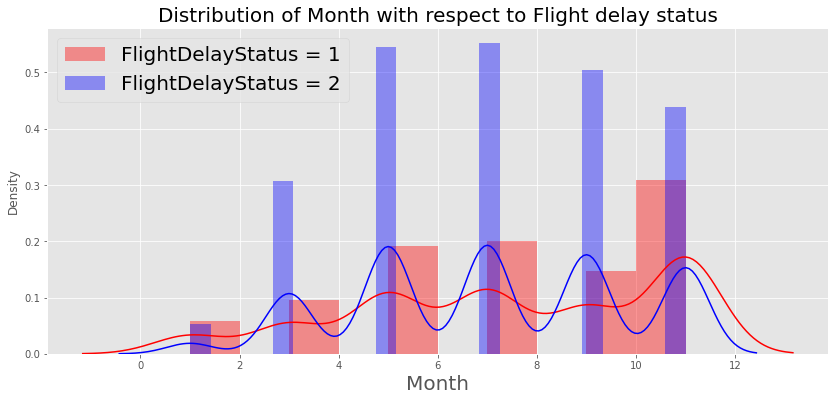

**********************************************************************************************


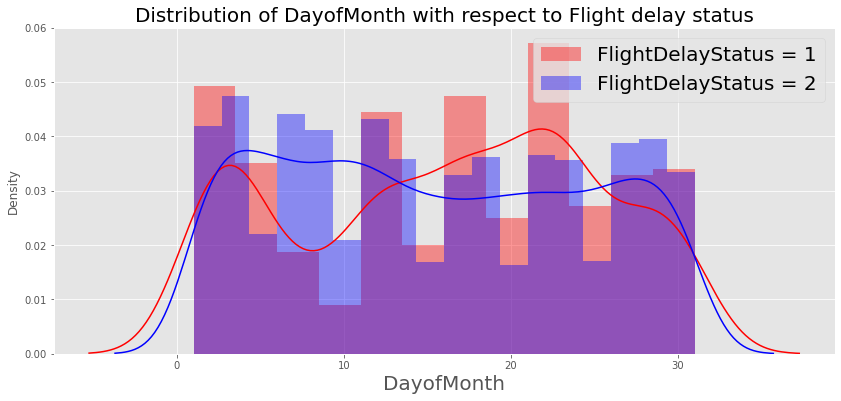

**********************************************************************************************


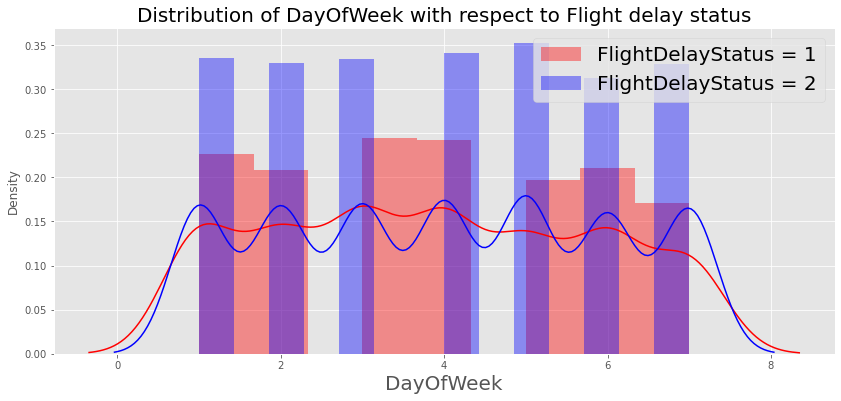

**********************************************************************************************


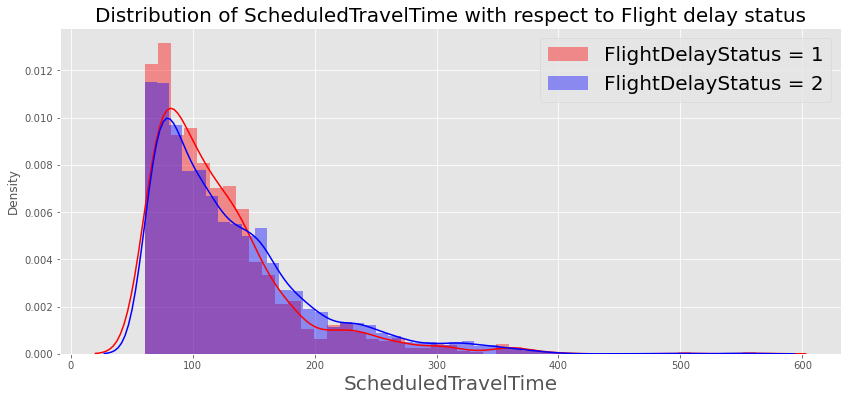

**********************************************************************************************


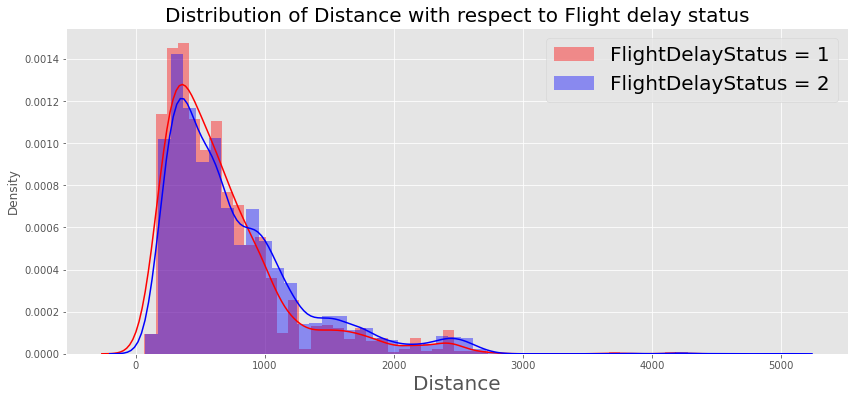

**********************************************************************************************


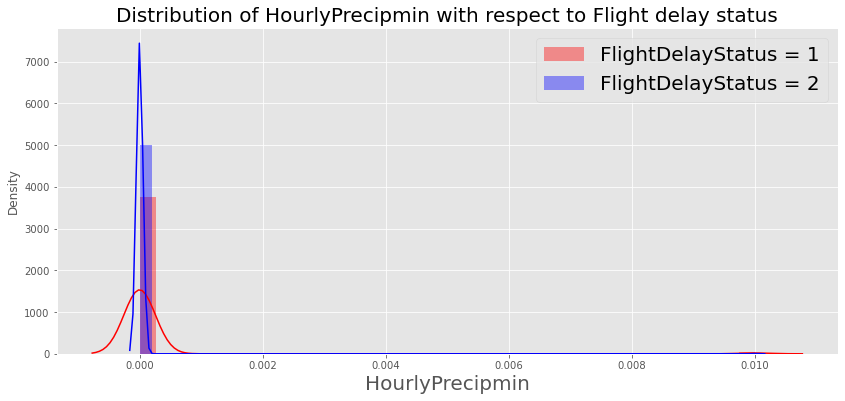

**********************************************************************************************


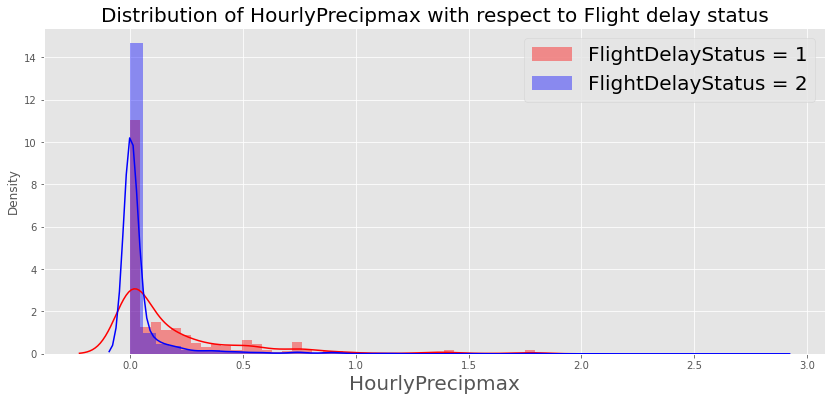

**********************************************************************************************


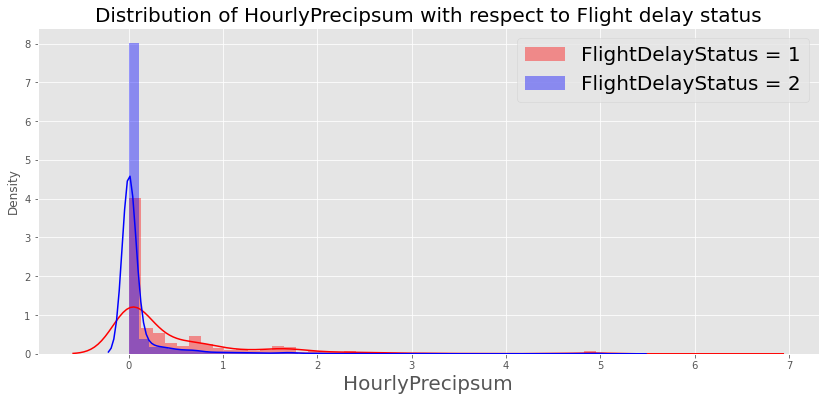

**********************************************************************************************


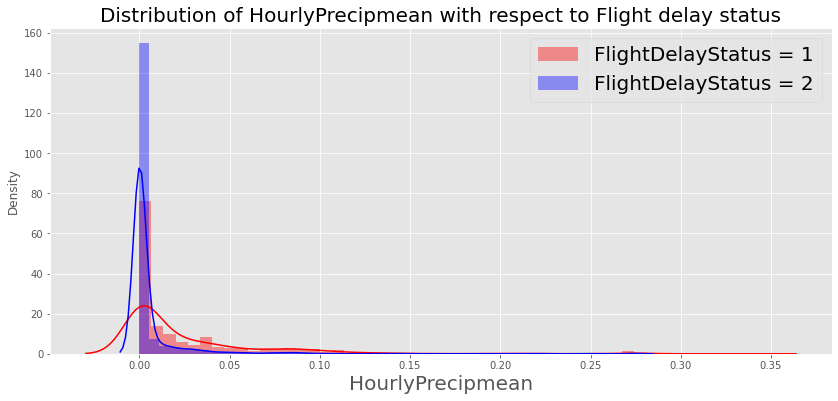

**********************************************************************************************


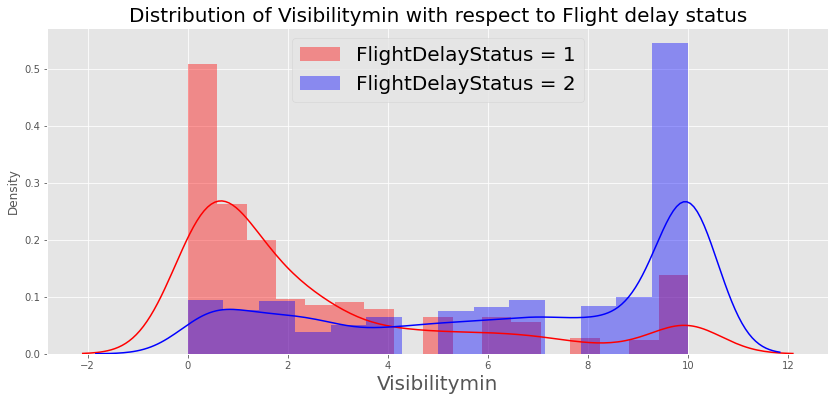

**********************************************************************************************


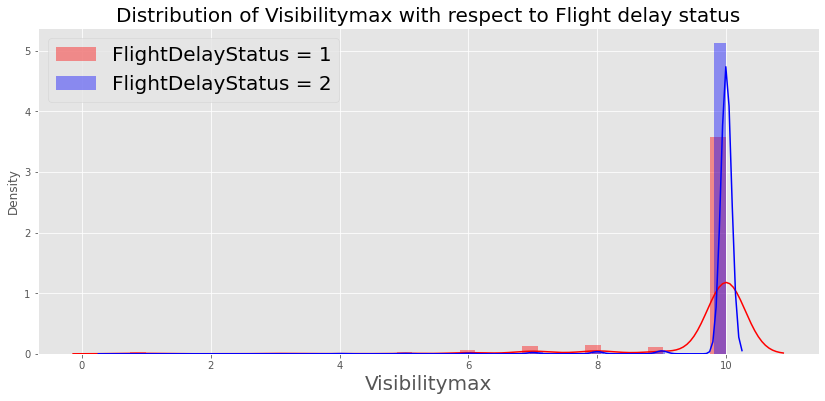

**********************************************************************************************


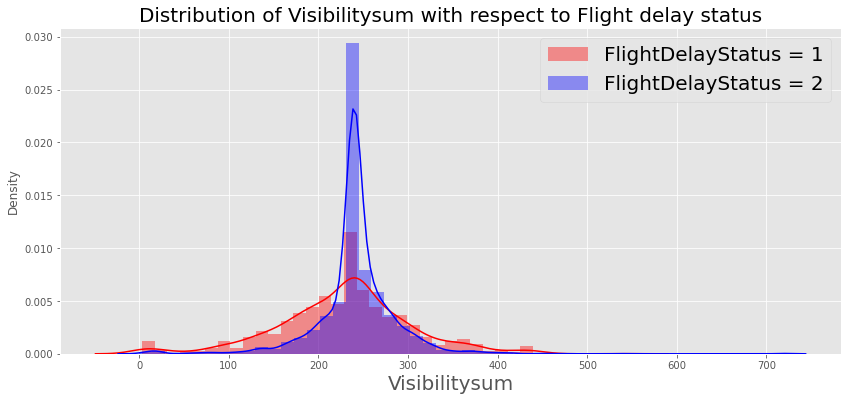

**********************************************************************************************


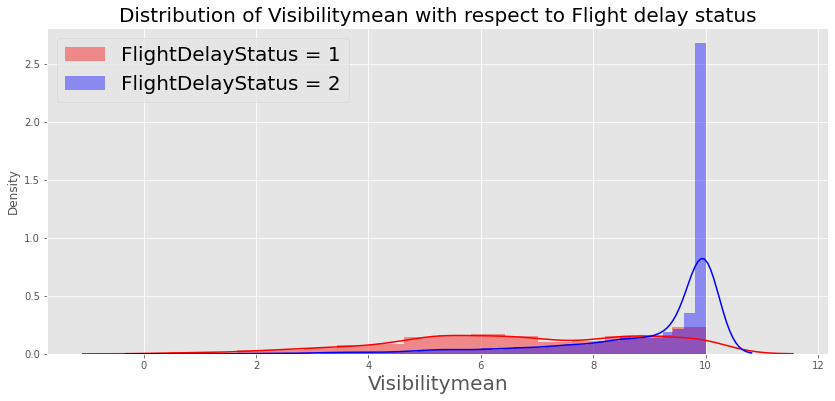

**********************************************************************************************


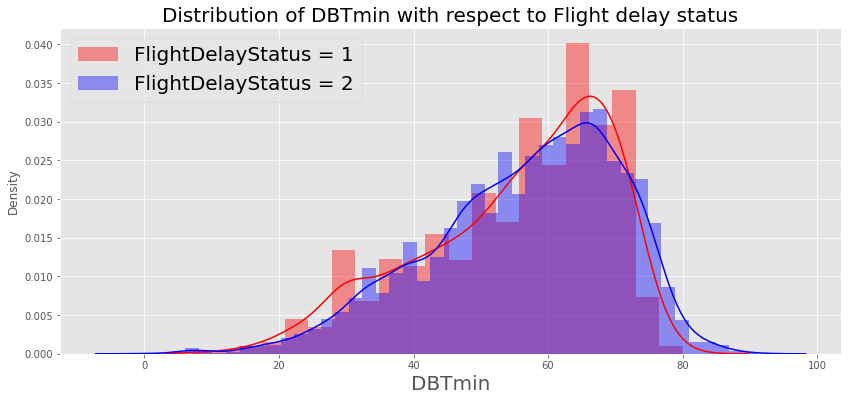

**********************************************************************************************


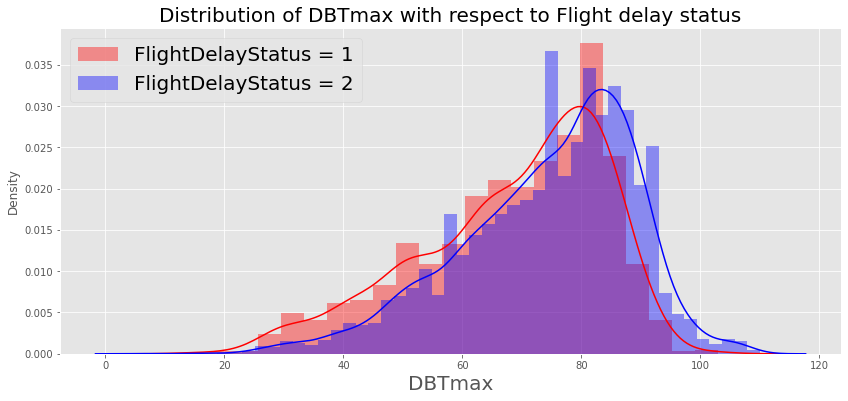

**********************************************************************************************


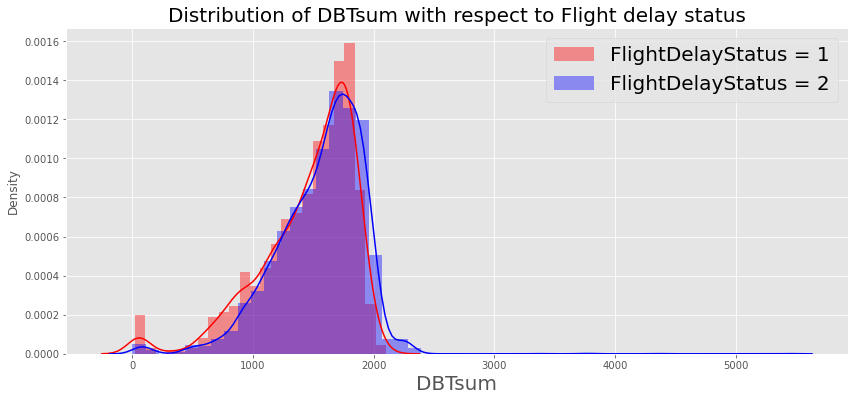

**********************************************************************************************


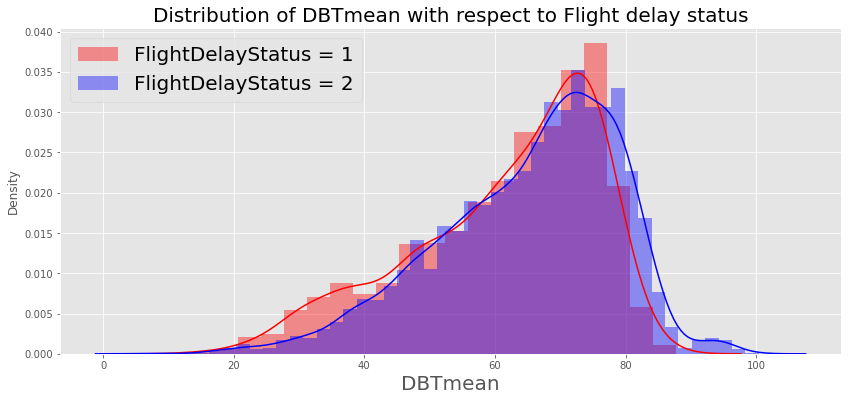

**********************************************************************************************


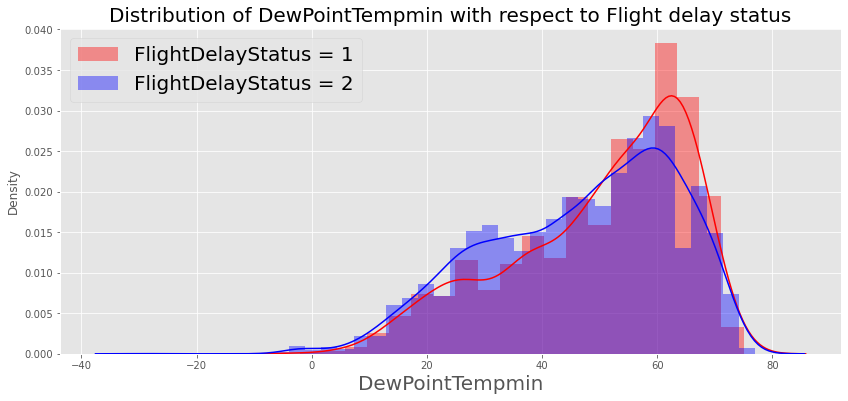

**********************************************************************************************


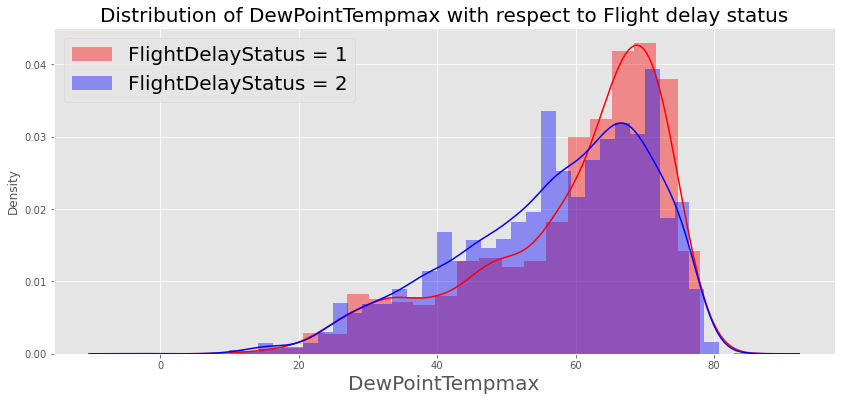

**********************************************************************************************


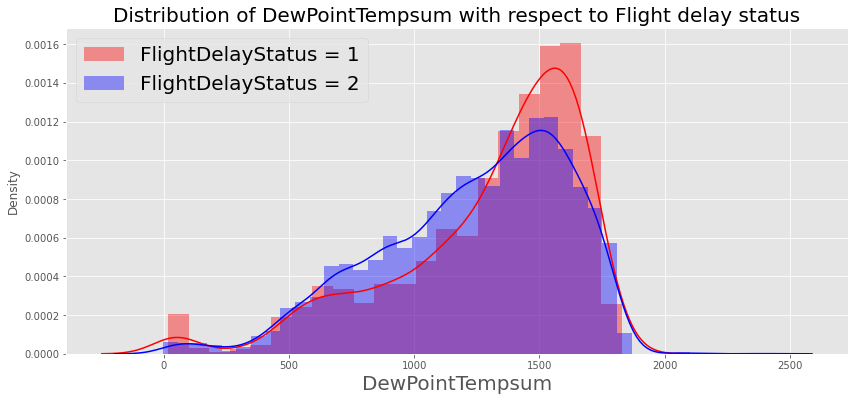

**********************************************************************************************


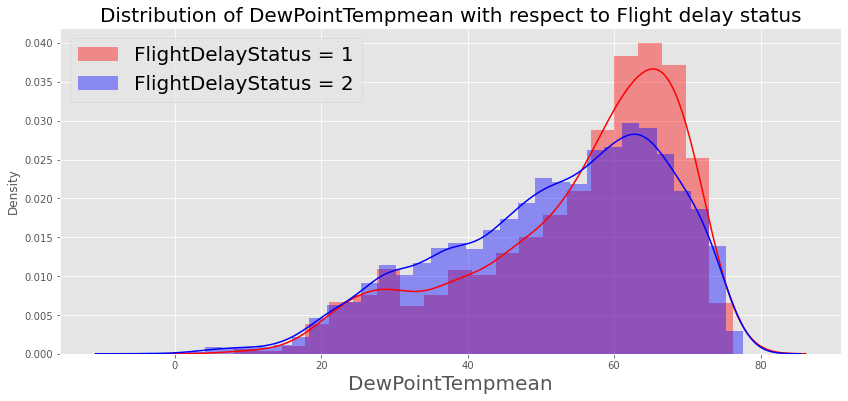

**********************************************************************************************


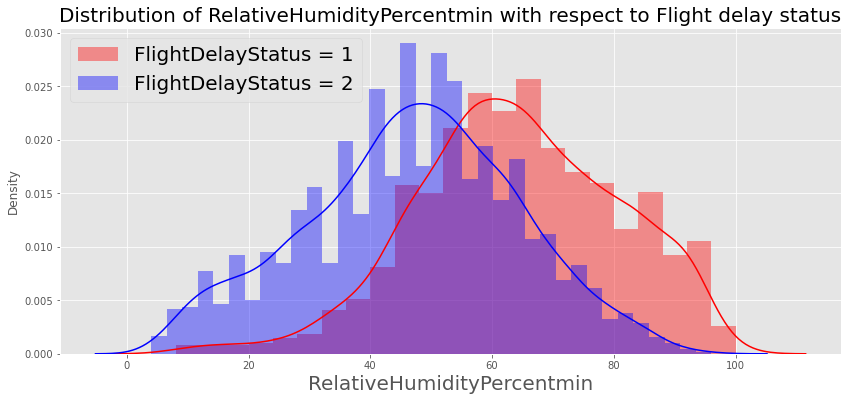

**********************************************************************************************


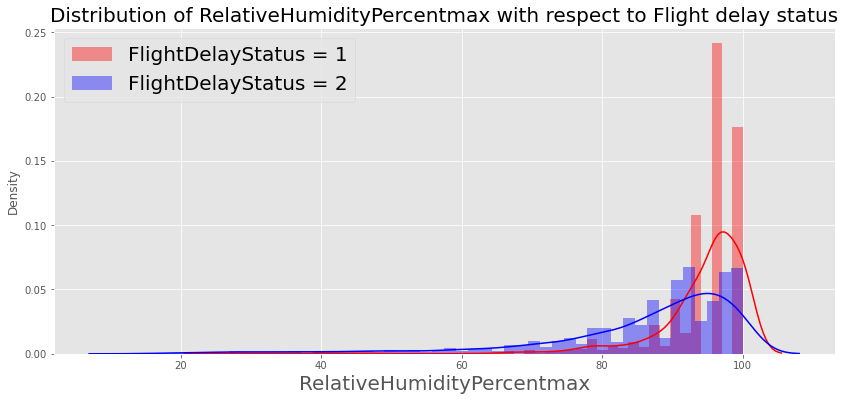

**********************************************************************************************


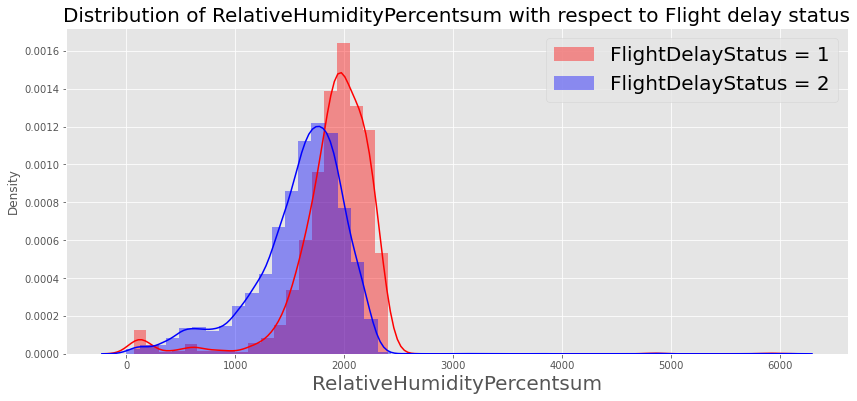

**********************************************************************************************


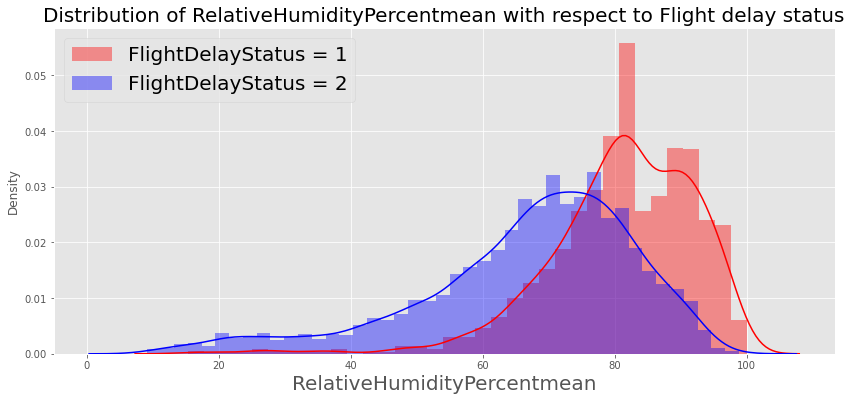

**********************************************************************************************


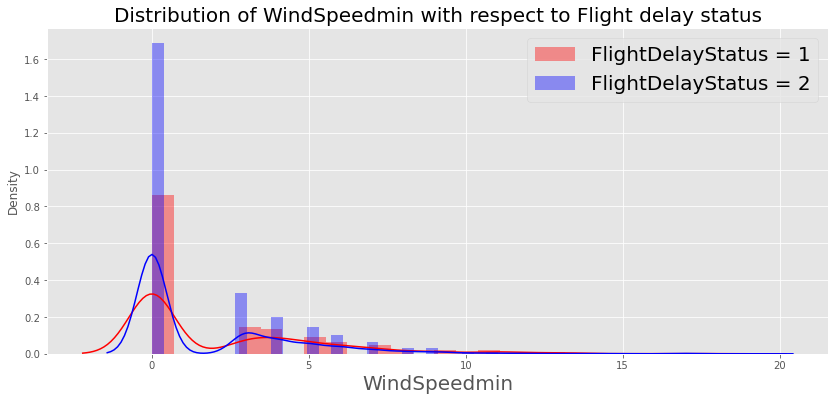

**********************************************************************************************


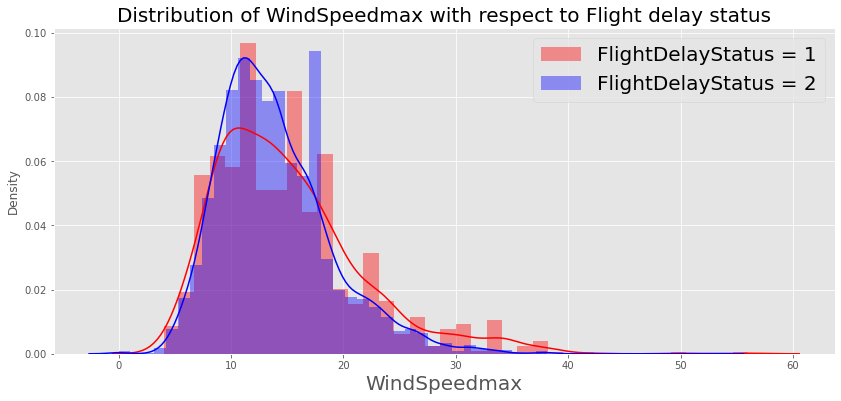

**********************************************************************************************


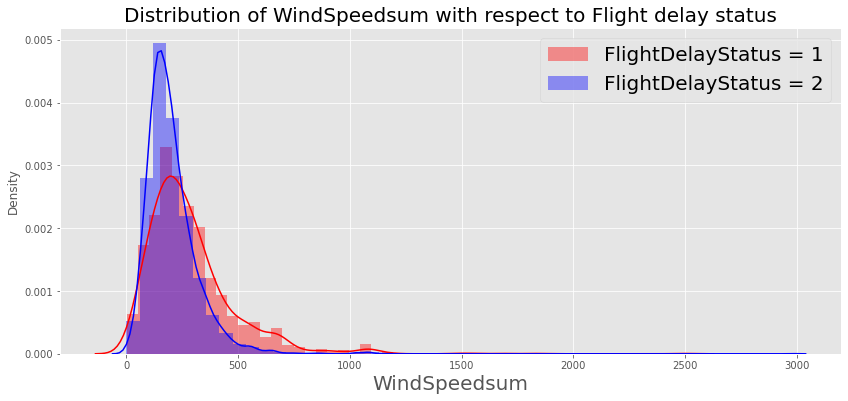

**********************************************************************************************


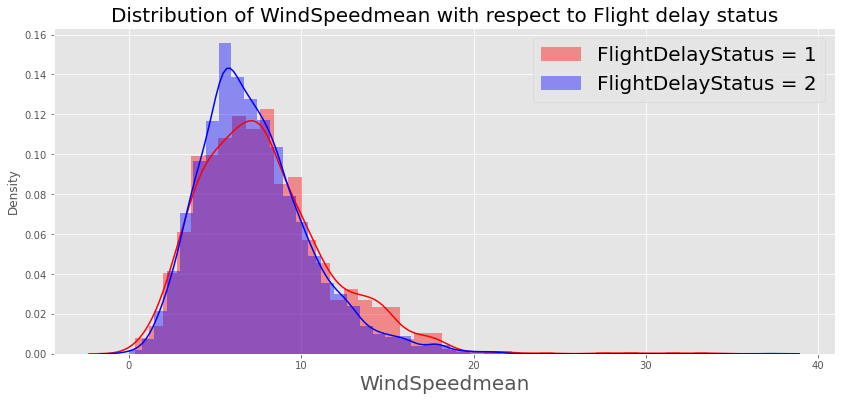

**********************************************************************************************


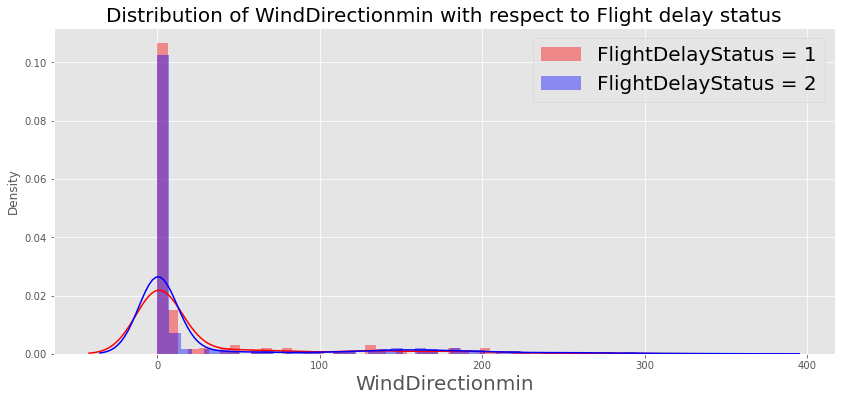

**********************************************************************************************


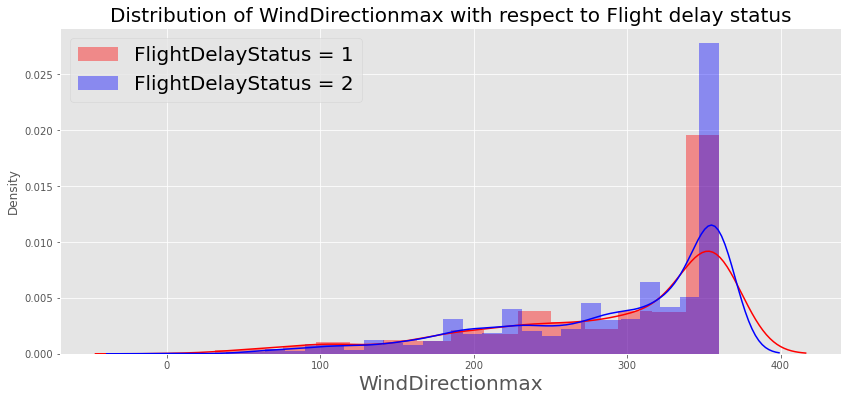

**********************************************************************************************


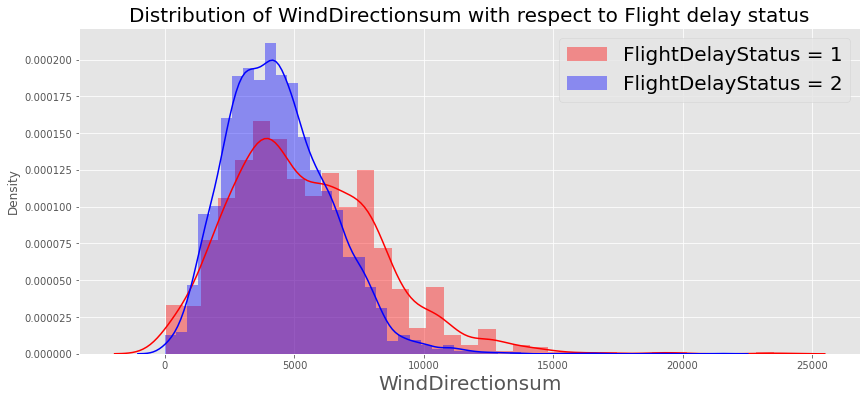

**********************************************************************************************


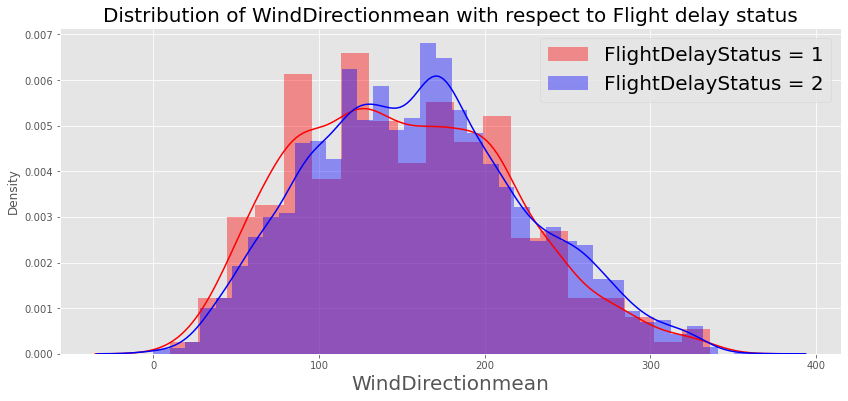

**********************************************************************************************


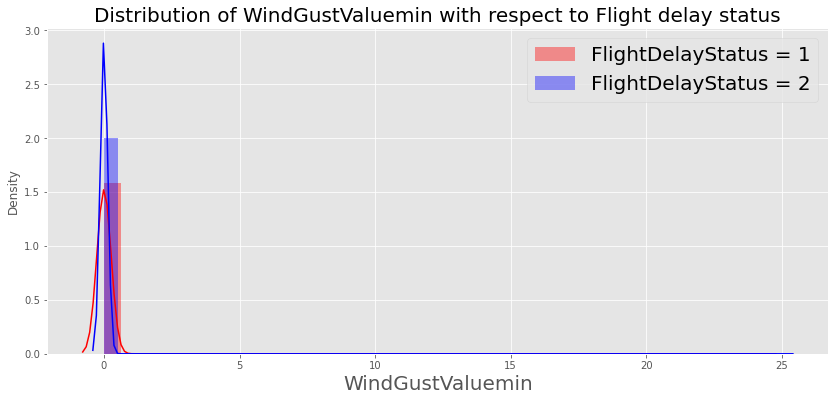

**********************************************************************************************


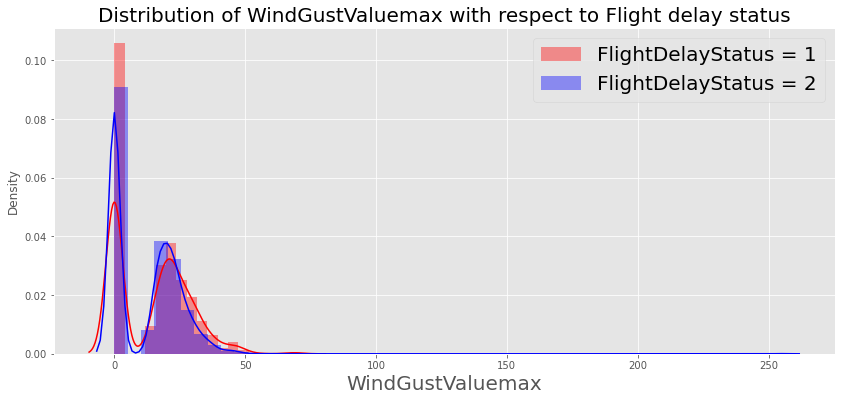

**********************************************************************************************


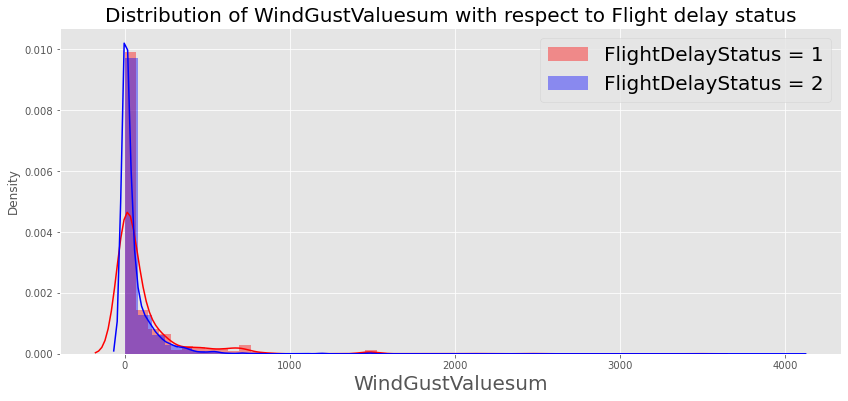

**********************************************************************************************


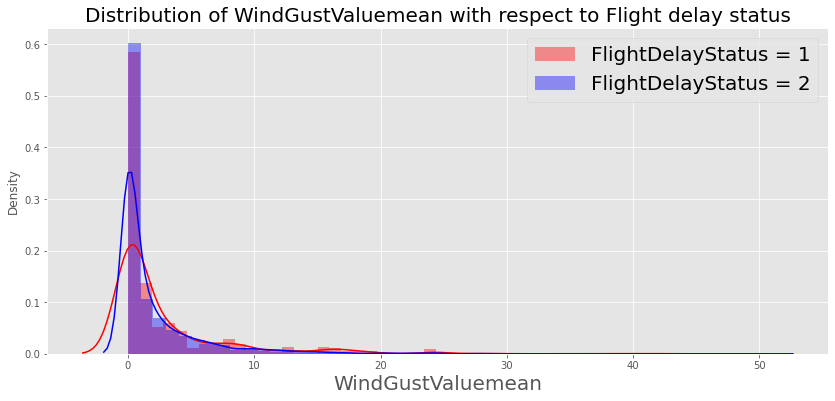

**********************************************************************************************


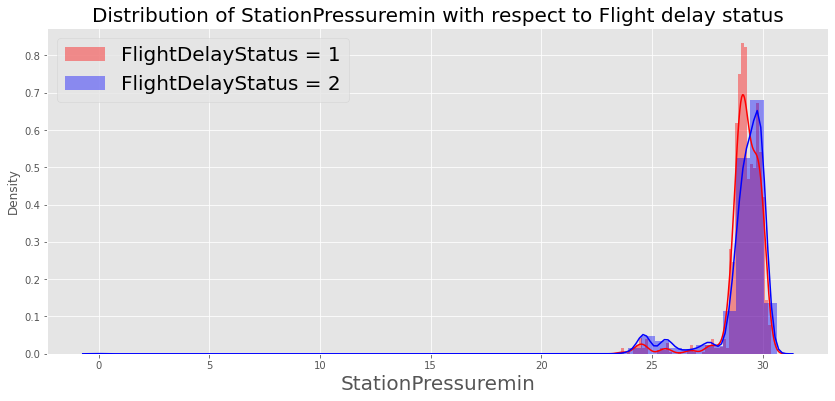

**********************************************************************************************


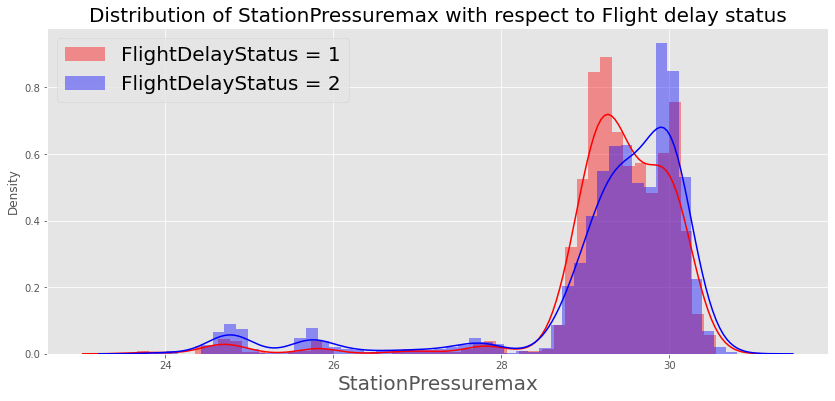

**********************************************************************************************


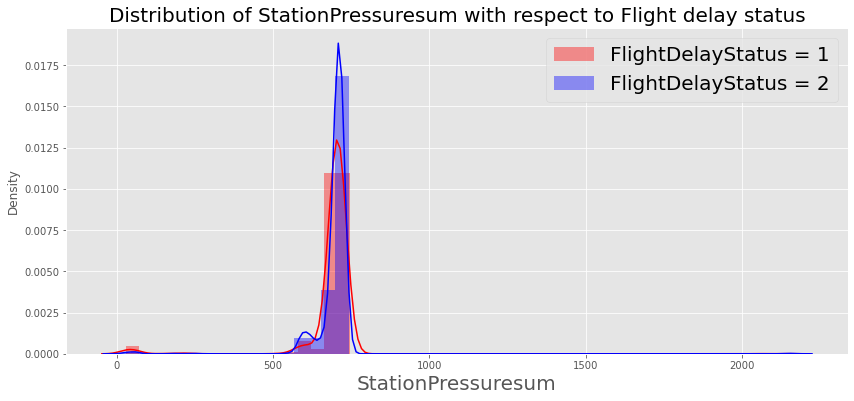

**********************************************************************************************


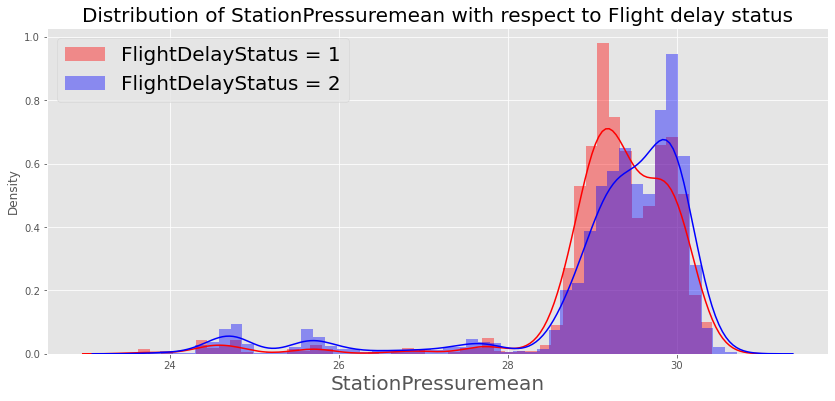

**********************************************************************************************


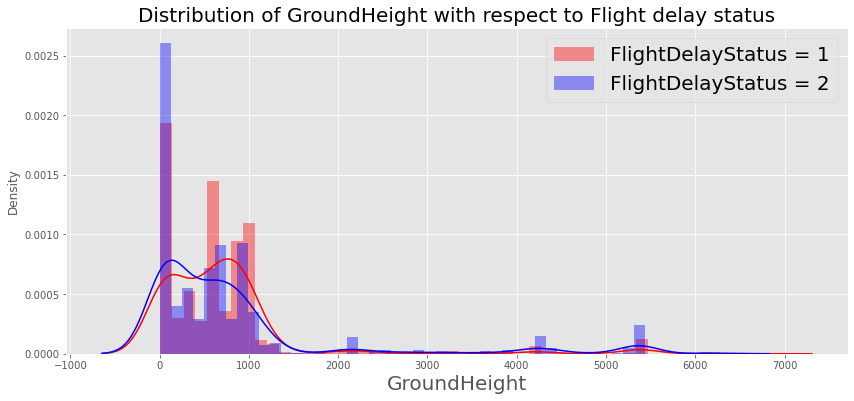

**********************************************************************************************


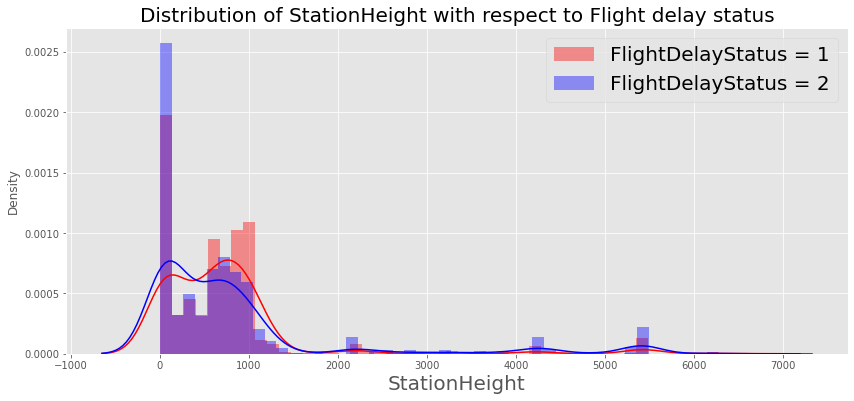

**********************************************************************************************


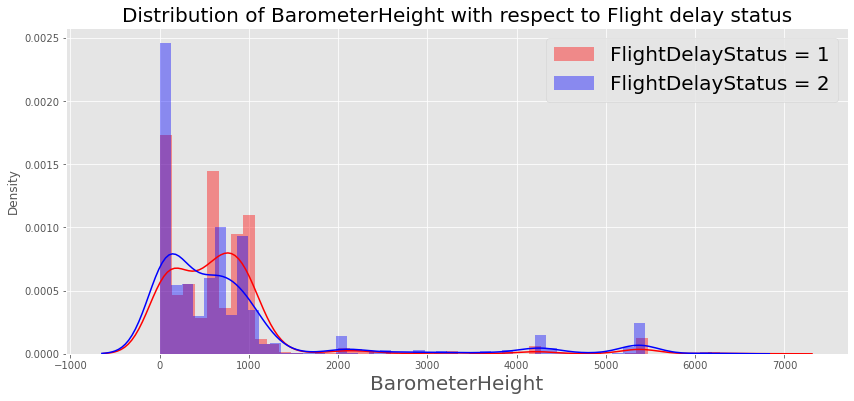

**********************************************************************************************


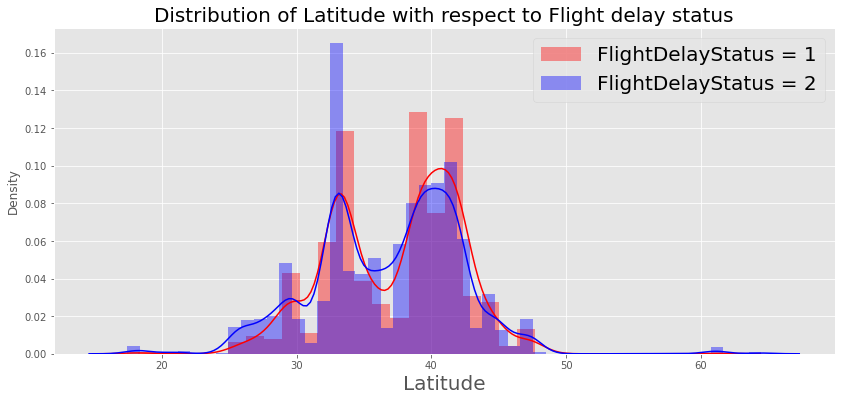

**********************************************************************************************


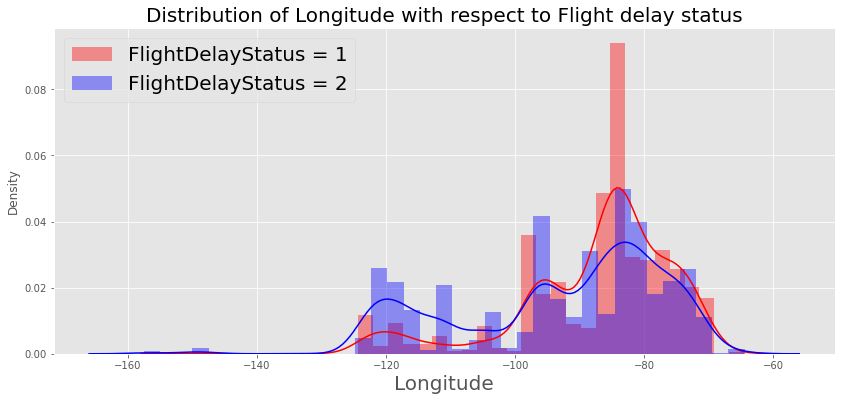

**********************************************************************************************


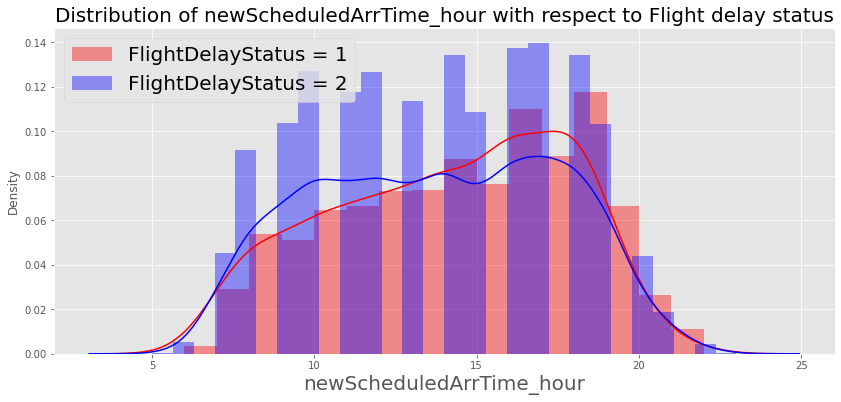

**********************************************************************************************


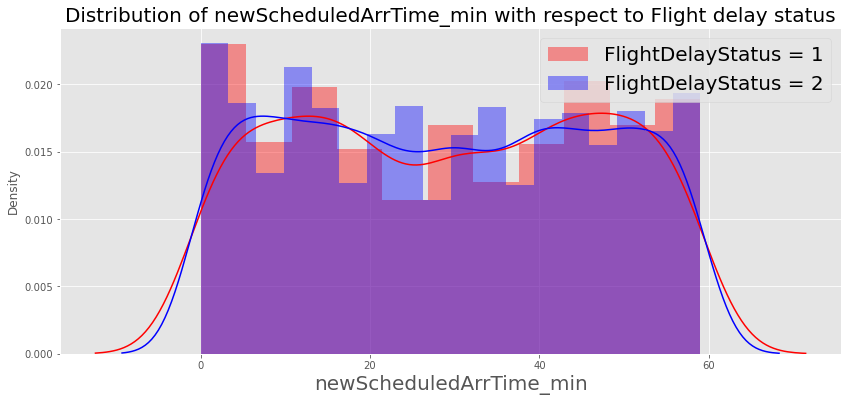

**********************************************************************************************


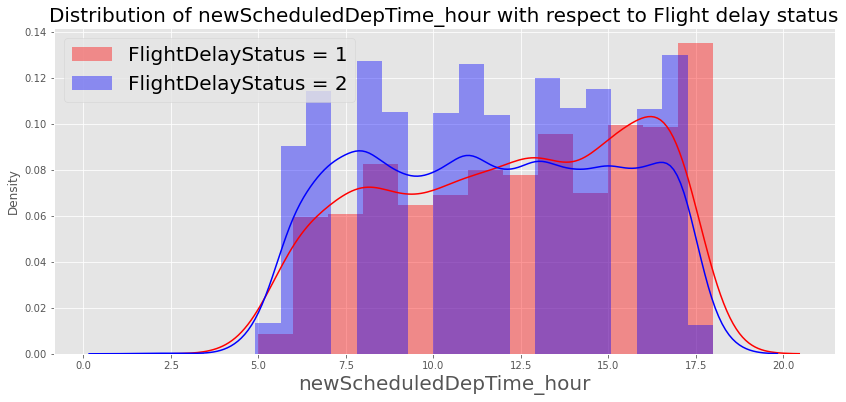

**********************************************************************************************


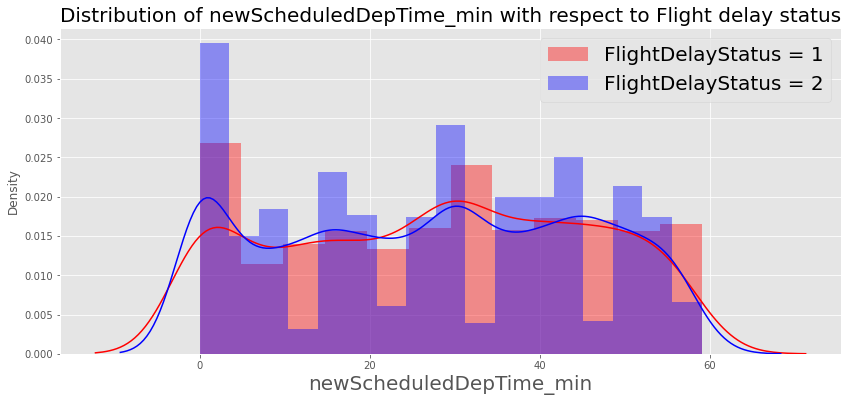

**********************************************************************************************


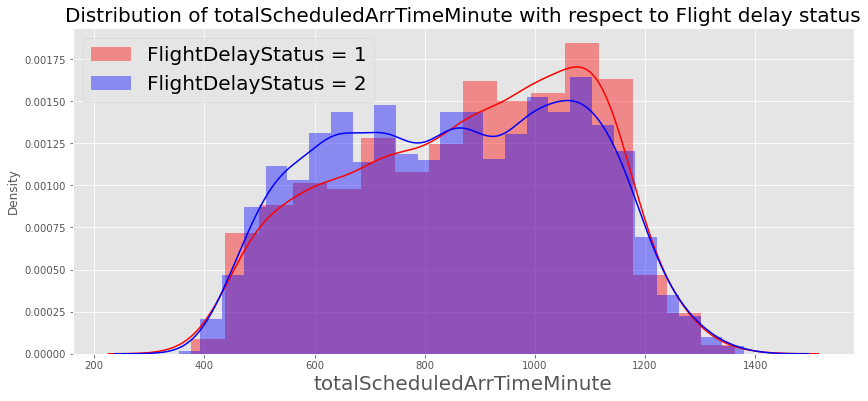

**********************************************************************************************


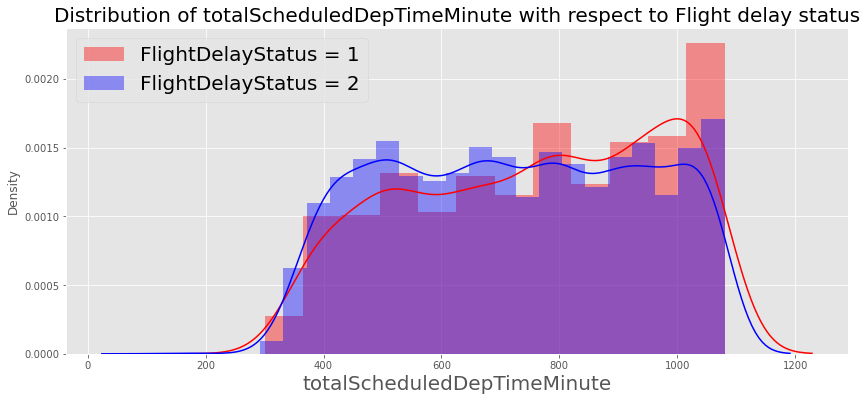

**********************************************************************************************


In [97]:
# this plots shws the distribution of individual numerical column for FlightStatus 1 and 2
for col in numeric_column:
    plt.style.use("ggplot") # using the ggplot style
    plt.figure(figsize=(14,6)) # Fixing the figure size
    # sns.distplot has a function which shows ths distribution of the numerical variable. 
    # Here distribution is plotted W.r.t Flightdelaystatus = 1 and 2
    sns.distplot(origin_train_data[col][origin_train_data['FlightDelayStatus']=="1"], color='r', label='FlightDelayStatus = 1')
    sns.distplot(origin_train_data[col][origin_train_data['FlightDelayStatus']=="2"], color='b', label='FlightDelayStatus = 2')
    # Displayng the tittle
    plt.title("Distribution of" +" "+col +" "+"with respect to Flight delay status", fontsize=20)
    #Displaying Xlabel
    plt.xlabel(col, fontsize=20)
    # displaying the legend with repect to Flight delay status 1 and 2
    plt.legend(fontsize = 20)
    plt.show()
    print("**********************************************************************************************")

Observation : 

*    Scheduled Travel time - If the schedule travel time is more delay is likely to be less. 
*    But however most of the travel time of the flighe within a range of 0 - 250
*    There within the range the distribution is same for delay and for not delay
*    Month - More num of flights can be seen betweek 2 to 11 months and , deslay stust is increasing with respect to month
*    DayOfMonth - distribution is uniform with respect to dayofmonth
*    DayOfWeek - Similar observation is made for the day of week
*    Distance - Most of the flights distance covered is between 10 to 3000km range and delay status and not delay status is   
     almost having same distribution
*    Precipitation leads for some flight to delay
*    Visibility causes the delay of the flight
*    DBTmin(Dry bulb temperature) also causes delay and it is in(between 40 - 80 Celcius)
*    DBTmax(Dry bulb temperature) also causes delay and it is in(between 40 - 100 Celcius)
*    Distribution of DewPoint temp also leads to Flight delay and it is in range between(20 - 80)
*    Distribution of Relative humidity temp also leads to Flight delay and it is in range between(20 - 80)
*    Windspeed, windgust, station pressure are have impact in delay of flight

conclusion: These univariate plot are not helping to know which attributes are import

# Bivariate plots

In [98]:
# This plot function provides the information of bar plot whic are highly cardinal. 
def barplot(column1, column2, df):
    plt.style.use("ggplot") # using style of ggplot
    fig, ax = plt.subplots(figsize=(20, 100)) # creat empty subplot
    bars = ax.barh(df[column1], df[column2]) # create horizontal bar graph
    for bar in bars:
      width = bar.get_width() #For every obersevation in the bar get width
      label_y_pos = bar.get_y() + bar.get_height() / 2
      ax.text(width, label_y_pos, s=f'{width}', va='center') # text placements
    for tick in ax.yaxis.get_major_ticks():
      tick.label.set_fontsize(14)
    for bar in bars[::2]:
      bar.set_color('g')
    plt.title("No of Flights " + " "+ "with respect to "+ column1, fontsize=30) # Provides the tittle of the plot
    plt.xlabel('Counts', fontsize=30) # Xlabel
    plt.ylabel(column1, fontsize=30) #ylabel
    plt.show()

** Total Number of Flights count with respect to AirportID********


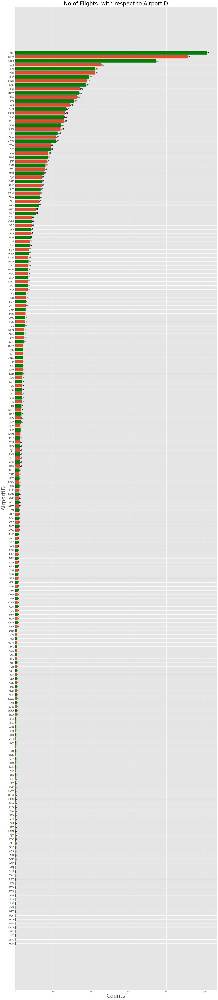

,AirportID,FlightDelayStatus_count
0,KOA,1
1,CDC,1
2,SIT,1
3,STX,1
4,DRO,1


In [99]:
# Befor plotting the barg graph group by function is used applied for the particular column(AirportID) and aggregation is
# is used on the remaining column
print("** Total Number of Flights count with respect to AirportID********")

# grouping the data with respect to AirportID
temp = origin_train_data.groupby("AirportID")
# aggregarting on FLightDelayStatus column and sorted according to Flightdelaystatus count
temp = temp[["FlightDelayStatus"]].count().add_suffix("_count").sort_values("FlightDelayStatus_count", ascending = True).reset_index()
#plotting the barplot with respect to AirportID and FlightDelaystatus column
barplot("AirportID", "FlightDelayStatus_count", temp)
# Checking the head
temp.head()

** Total Number of Flights count with respect to Origin ********


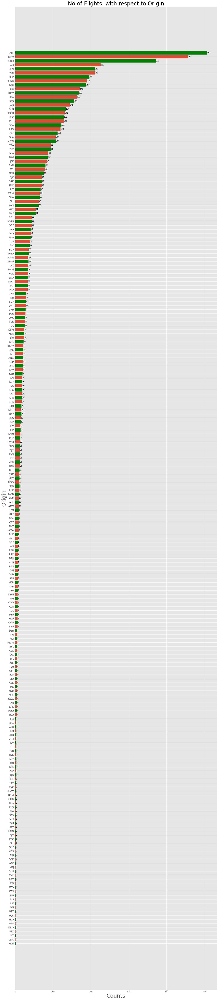

,Origin,FlightDelayStatus_count
0,KOA,1
1,CDC,1
2,SIT,1
3,STX,1
4,DRO,1


In [100]:
# Befor plotting the barg graph group by function is used applied for the particular column(AirportID) and aggregation is
# is used on the remaining column

print("** Total Number of Flights count with respect to Origin ********")

# grouping the data with respect to Origin
temp = origin_train_data.groupby("Origin")
# aggregarting on FLightDelayStatus column and sorted according to Flightdelaystatus count
temp = temp[["FlightDelayStatus"]].count().add_suffix("_count").sort_values("FlightDelayStatus_count", ascending = True).reset_index()
# plotting the barplot with respect to Origin and FlightDelaystatus column
barplot("Origin", "FlightDelayStatus_count", temp)
# Checking the head
temp.head()

** Total Number of Flights count with respect to Destination ********


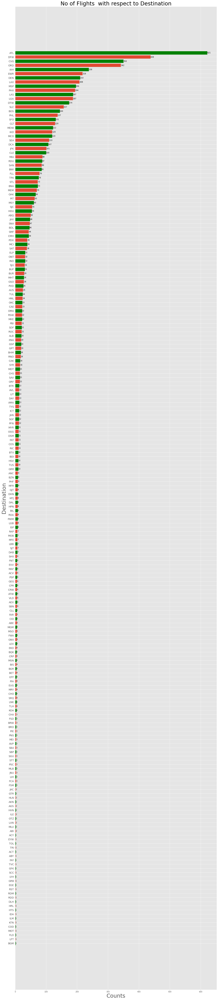

,Destination,FlightDelayStatus_count
0,BGM,1
1,LFT,1
2,FLO,1
3,MOT,1
4,COD,1


In [101]:
print("** Total Number of Flights count with respect to Destination ********")

# grouping the data with respect to Destination
temp = origin_train_data.groupby("Destination")
# aggregarting on FLightDelayStatus column and sorted according to Flightdelaystatus count
temp = temp[["FlightDelayStatus"]].count().add_suffix("_count").sort_values("FlightDelayStatus_count", ascending = True).reset_index()
# plotting the barplot with respect to Destination and FlightDelaystatus column
barplot("Destination", "FlightDelayStatus_count", temp)
# Checking the head
temp.head()

In [102]:
# print("** Total Number of Flights count with respect to SkyConditionsmost frequent ********")

# # grouping the data with respect to Destination
# temp = origin_train_data.groupby("SkyConditionsmost frequent")
# # aggregarting on FLightDelayStatus column and sorted according to Flightdelaystatus count
# temp = temp[["FlightDelayStatus"]].count().add_suffix("_count").sort_values("FlightDelayStatus_count", ascending = True).reset_index()
# # plotting the barplot with respect to Destination and FlightDelaystatus column
# barplot("SkyConditionsmost frequent", "FlightDelayStatus_count", temp)
# # Checking the head
# temp.head()

Observation:
    Figure shows the Total flight counts with respect to airportID, Origin and destination. But Plot doesnot give the Flight
    delaystatus with repect to = "1".

### Bar plot observation with Respect to FlightDelayStatus == 1

In [103]:
FlightStatusDelay_data = origin_train_data[origin_train_data["FlightDelayStatus"] == "1"]

** Total Number of Delay of Flights count with respect to AirportID********


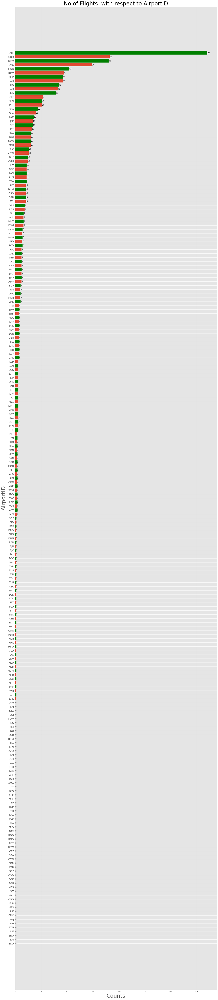

,AirportID,FlightDelayStatus_count
0,EKO,0
1,ILM,0
2,SRQ,0
3,ILE,0
4,BZN,0


In [104]:
# Befor plotting the barg graph group by function is used applied for the particular column(AirportID) and aggregation is
# is used on the remaining column
print("** Total Number of Delay of Flights count with respect to AirportID********")

# grouping the data with respect to AirportID
temp = FlightStatusDelay_data.groupby("AirportID")
# aggregarting on FLightDelayStatus column and sorted according to Flightdelaystatus count
temp = temp[["FlightDelayStatus"]].count().add_suffix("_count").sort_values("FlightDelayStatus_count", ascending = True).reset_index()
#plotting the barplot with respect to AirportID and FlightDelaystatus column
barplot("AirportID", "FlightDelayStatus_count", temp)
# Checking the head
temp.head()

************ Total Number of Flight Delay count with respect to Origin **************


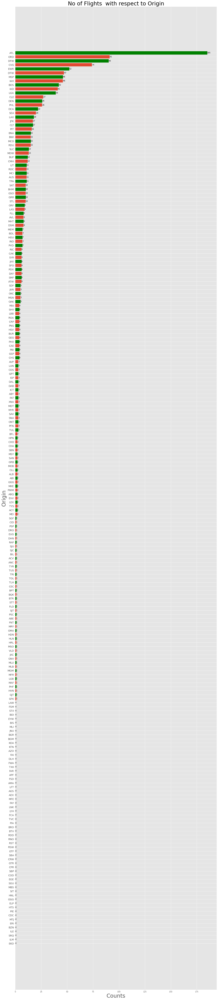

,Origin,FlightDelayStatus_count
0,EKO,0
1,ILM,0
2,SRQ,0
3,ILE,0
4,BZN,0


In [105]:
# Befor plotting the barg graph group by function is used applied for the particular column(AirportID) and aggregation is
# is used on the remaining column

print("************ Total Number of Flight Delay count with respect to Origin **************")

# grouping the data with respect to Origin
temp = FlightStatusDelay_data.groupby("Origin")
# aggregarting on FLightDelayStatus column and sorted according to Flightdelaystatus count
temp = temp[["FlightDelayStatus"]].count().add_suffix("_count").sort_values("FlightDelayStatus_count", ascending = True).reset_index()
# plotting the barplot with respect to Origin and FlightDelaystatus column
barplot("Origin", "FlightDelayStatus_count", temp)
# Checking the head
temp.head()

** Total Number of Flights delay count with respect to Destination data ********


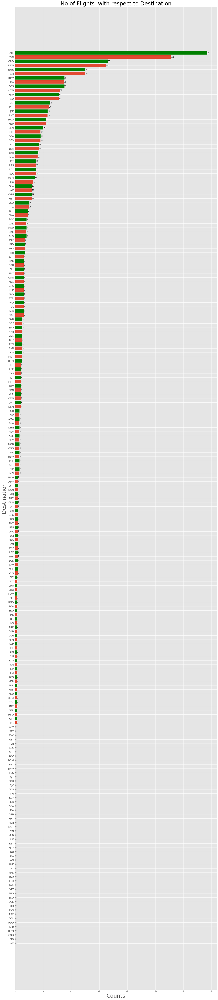

,Destination,FlightDelayStatus_count
0,JAC,0
1,CID,0
2,COD,0
3,RDM,0
4,CPR,0


In [106]:
print("** Total Number of Flights delay count with respect to Destination data ********")

# grouping the data with respect to Destination
temp = FlightStatusDelay_data.groupby("Destination")
# aggregarting on FLightDelayStatus column and sorted according to Flightdelaystatus count
temp = temp[["FlightDelayStatus"]].count().add_suffix("_count").sort_values("FlightDelayStatus_count", ascending = True).reset_index()
# plotting the barplot with respect to Destination and FlightDelaystatus column
barplot("Destination", "FlightDelayStatus_count", temp)
# Checking the head
temp.head()

In [107]:
# print("** Total Number of Flights delay count with respect to SkyConditionsmost frequent ********")

# # grouping the data with respect to Destination
# temp = FlightStatusDelay_data.groupby("SkyConditionsmost frequent")
# # aggregarting on FLightDelayStatus column and sorted according to Flightdelaystatus count
# temp = temp[["FlightDelayStatus"]].count().add_suffix("_count").sort_values("FlightDelayStatus_count", ascending = True).reset_index()
# # plotting the barplot with respect to Destination and FlightDelaystatus column
# barplot("SkyConditionsmost frequent", "FlightDelayStatus_count", temp)
# # Checking the head
# temp.head()

Observation :
    The above figure shows since most of th Flight is moving to ATL, CVG etc. In earlier barplot. Total no of delay of 
    Flightdelaystatus == 1 with respect to flights are not able to count it. But here we can see that total no of actual delay 
    of flights can be seen with respect AirportID, Origin, Destination

### Bivariate plots for numeric data and target column

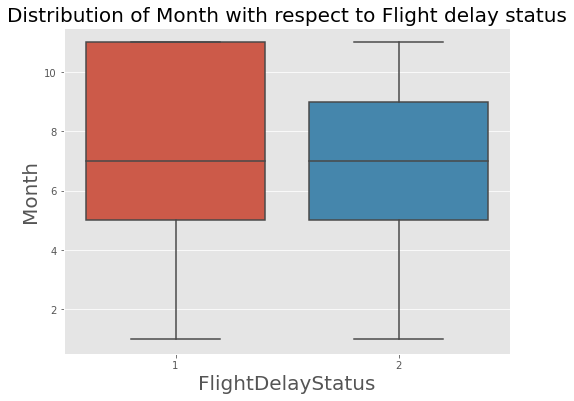

**********************************************************************************************


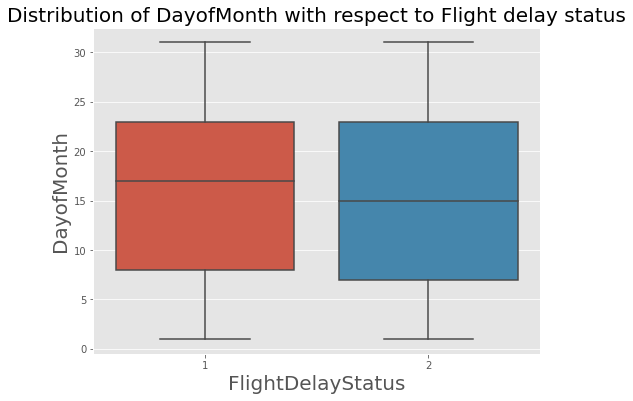

**********************************************************************************************


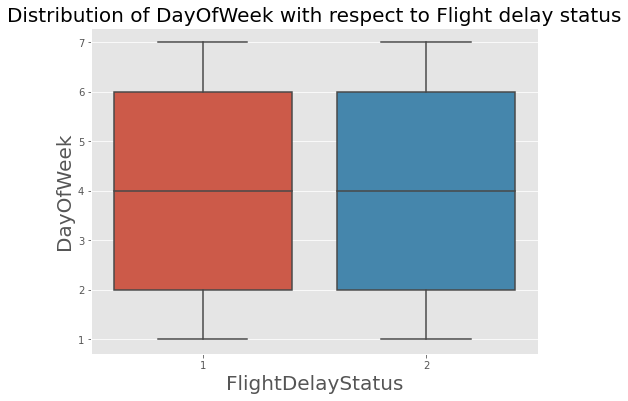

**********************************************************************************************


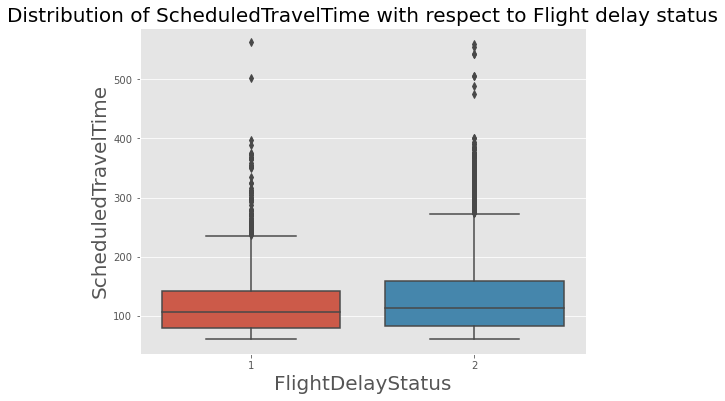

**********************************************************************************************


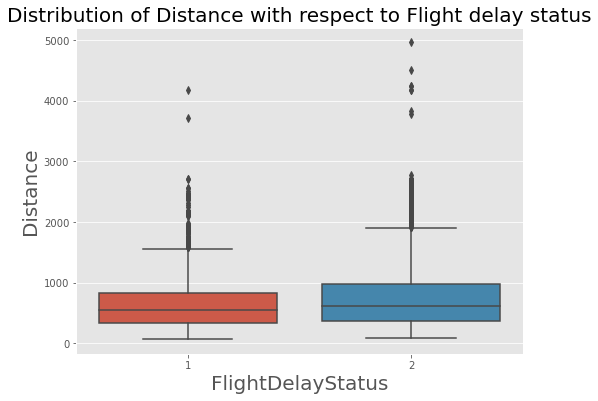

**********************************************************************************************


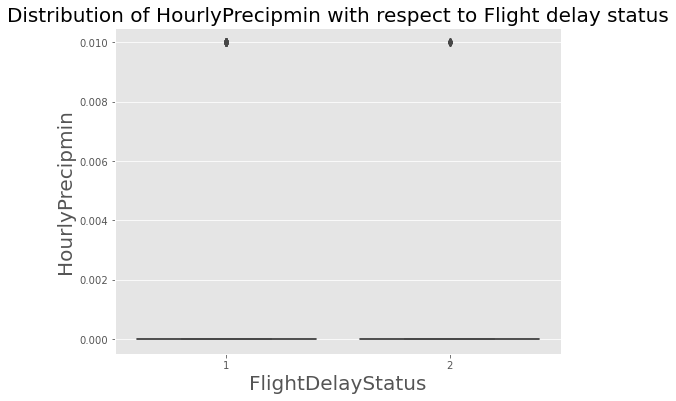

**********************************************************************************************


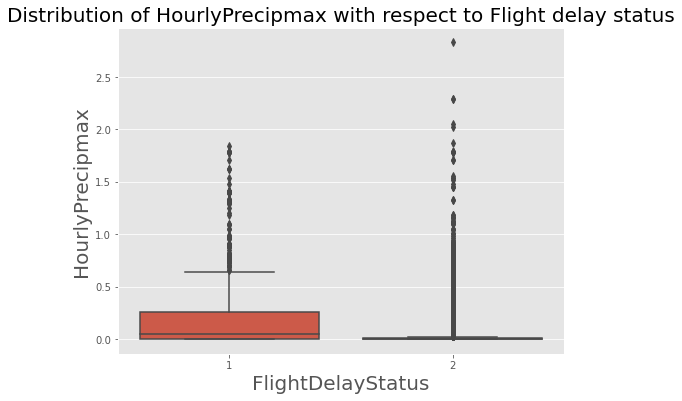

**********************************************************************************************


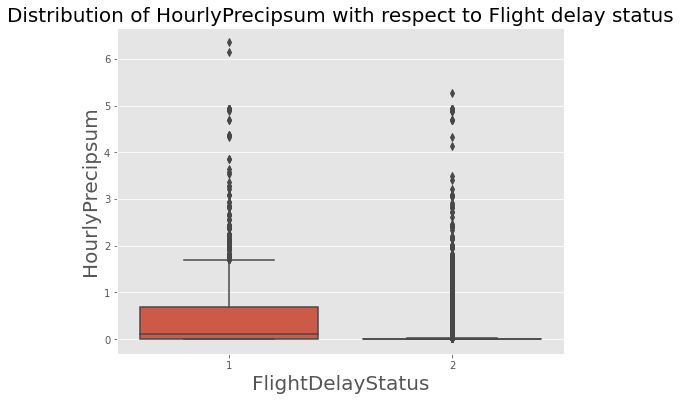

**********************************************************************************************


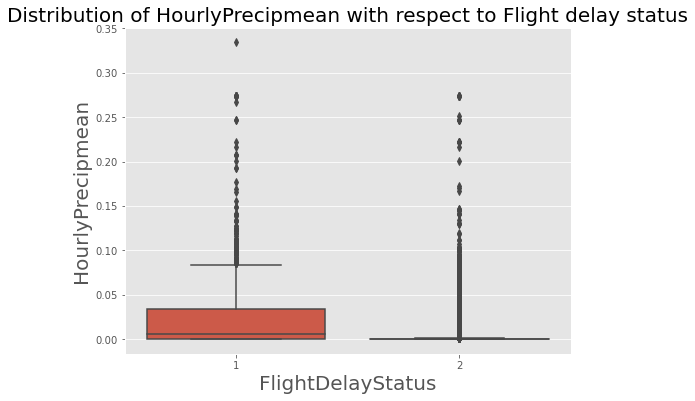

**********************************************************************************************


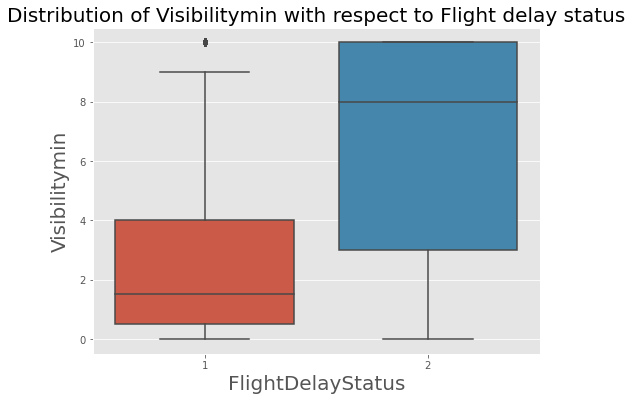

**********************************************************************************************


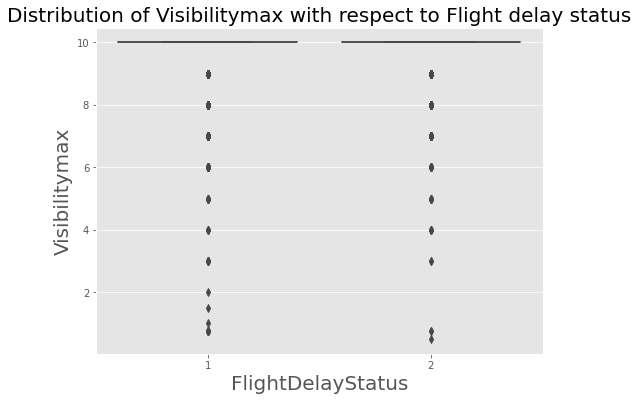

**********************************************************************************************


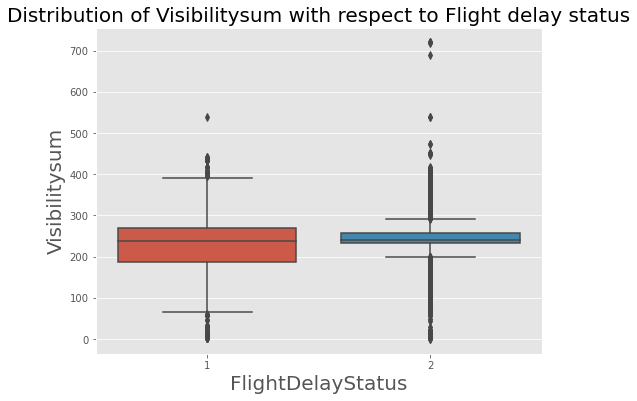

**********************************************************************************************


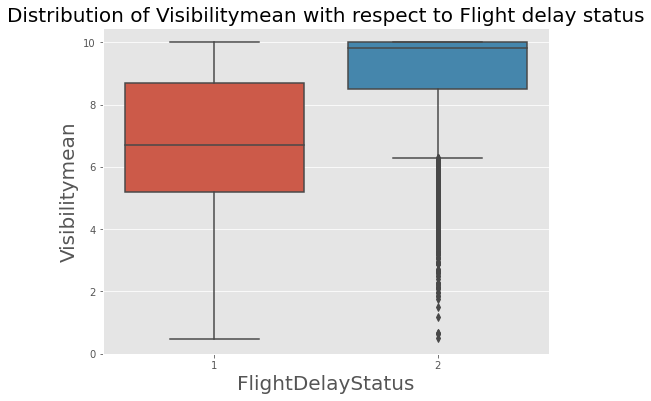

**********************************************************************************************


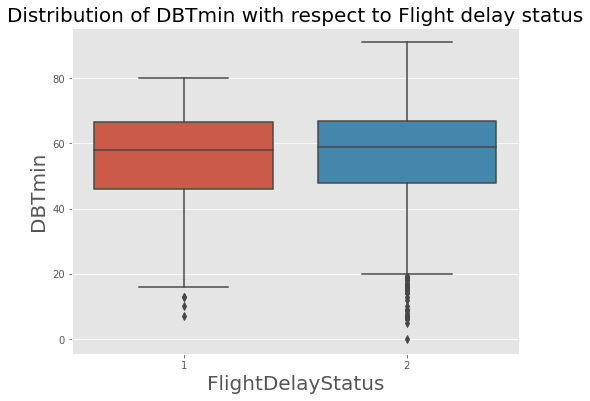

**********************************************************************************************


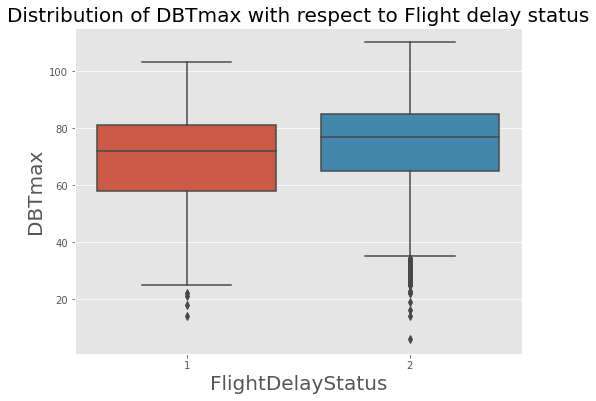

**********************************************************************************************


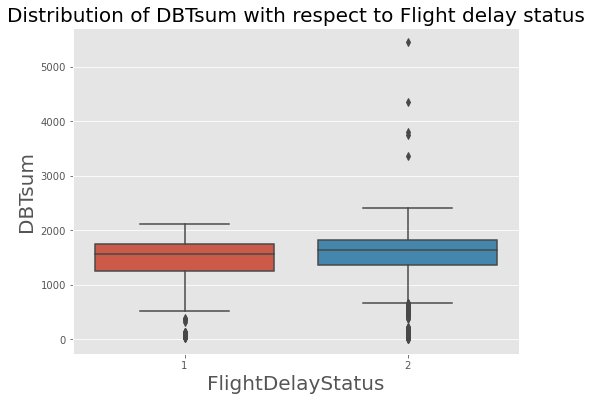

**********************************************************************************************


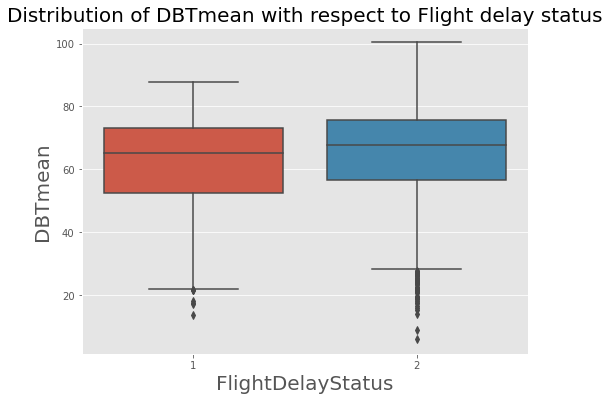

**********************************************************************************************


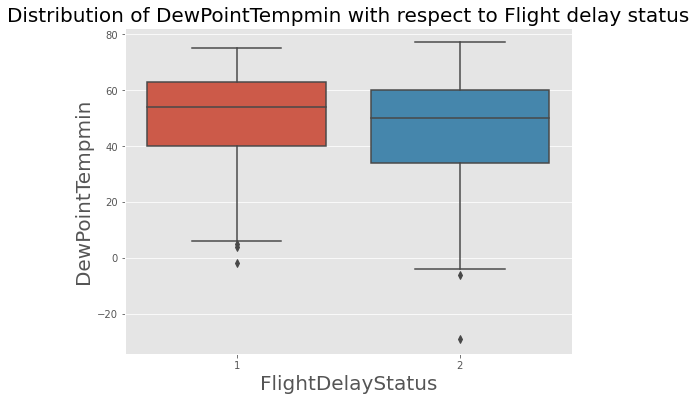

**********************************************************************************************


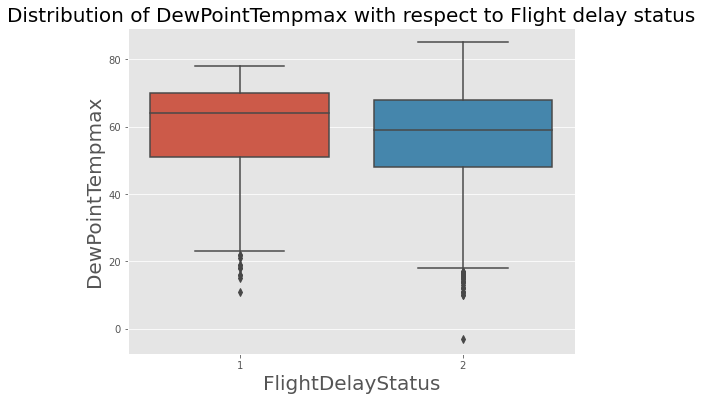

**********************************************************************************************


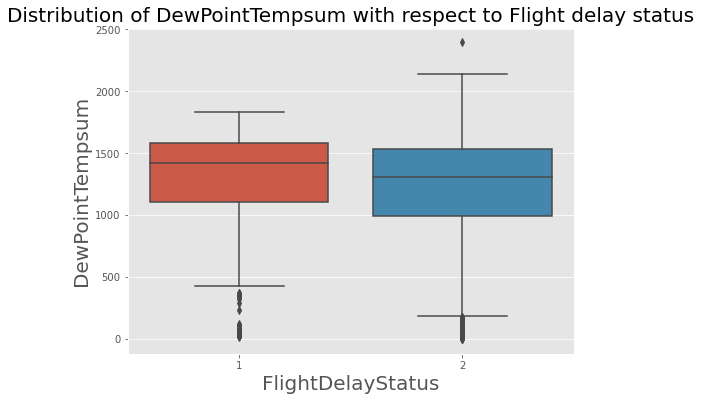

**********************************************************************************************


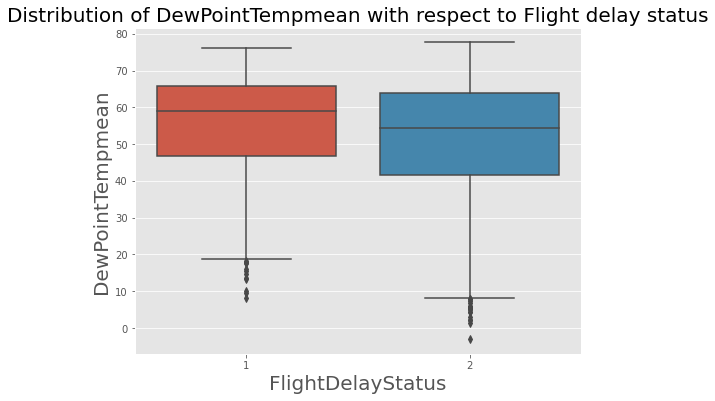

**********************************************************************************************


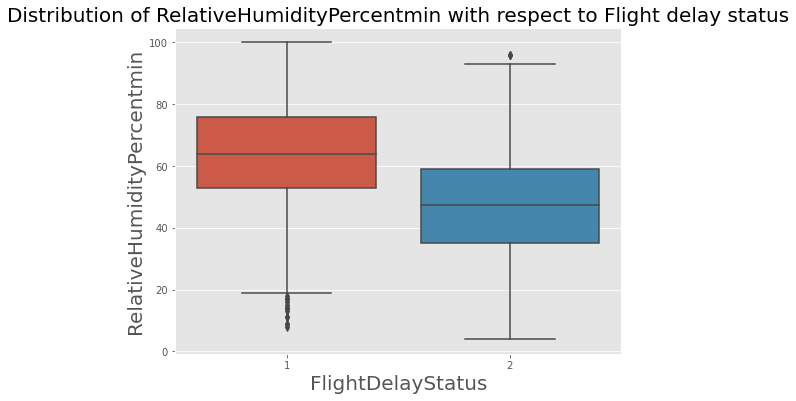

**********************************************************************************************


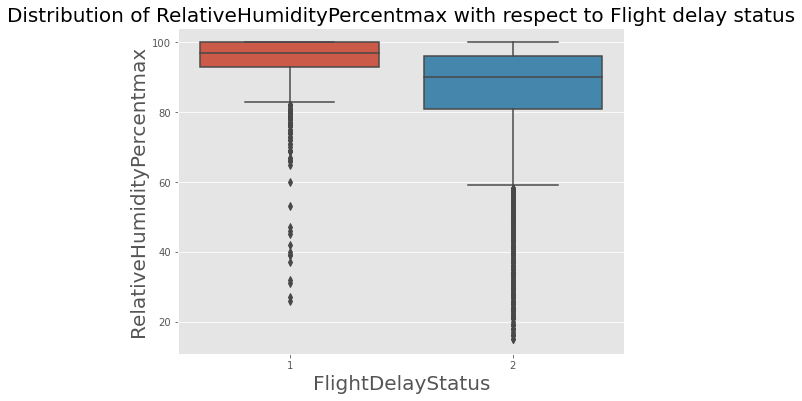

**********************************************************************************************


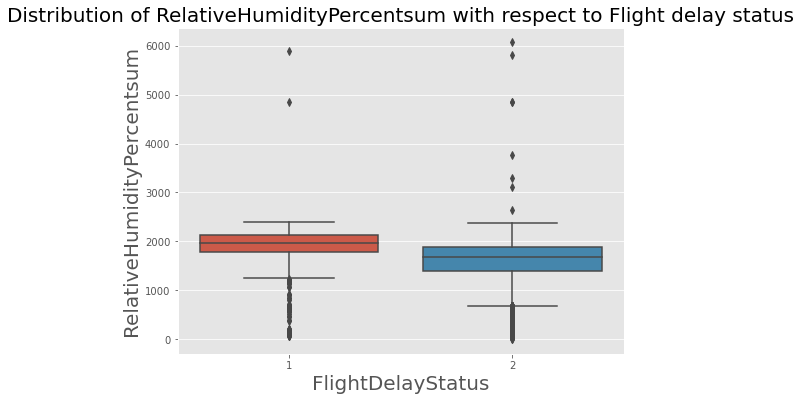

**********************************************************************************************


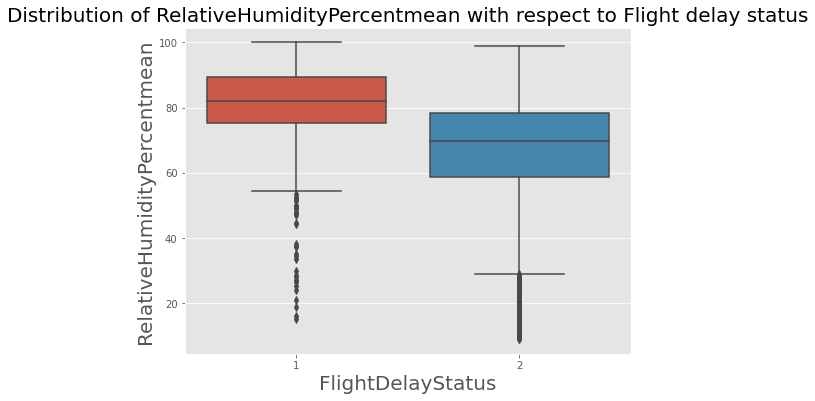

**********************************************************************************************


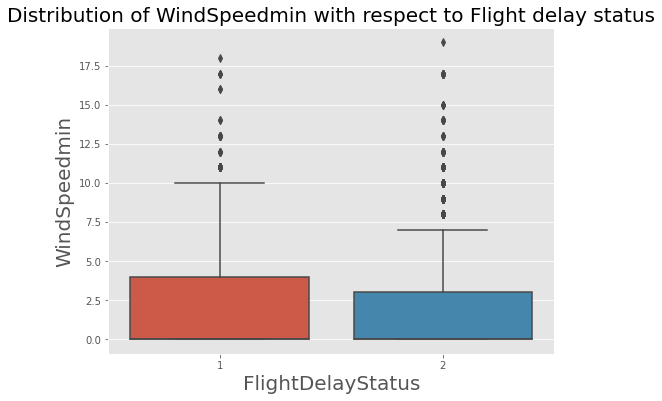

**********************************************************************************************


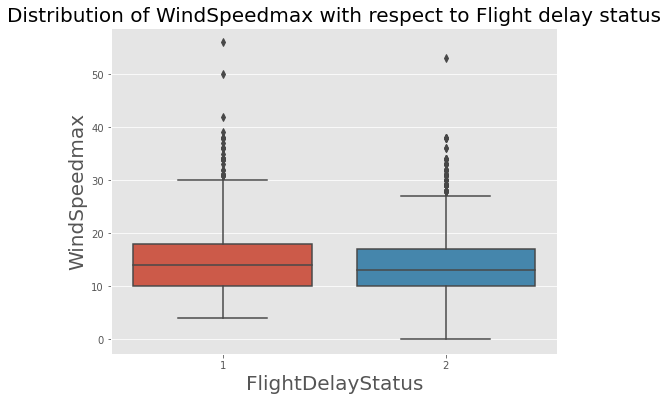

**********************************************************************************************


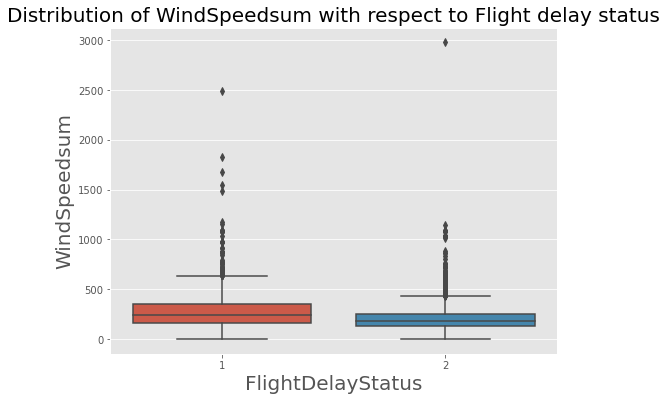

**********************************************************************************************


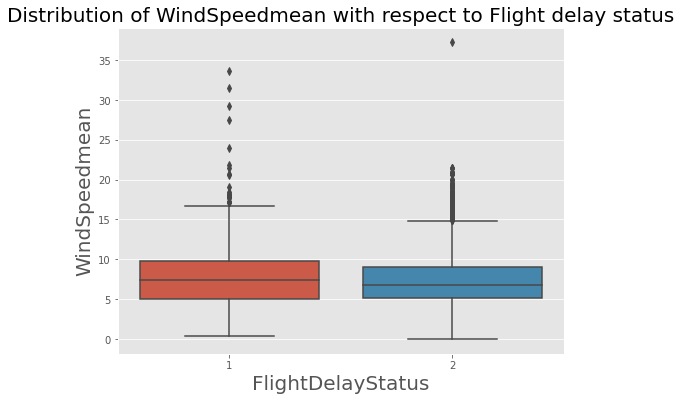

**********************************************************************************************


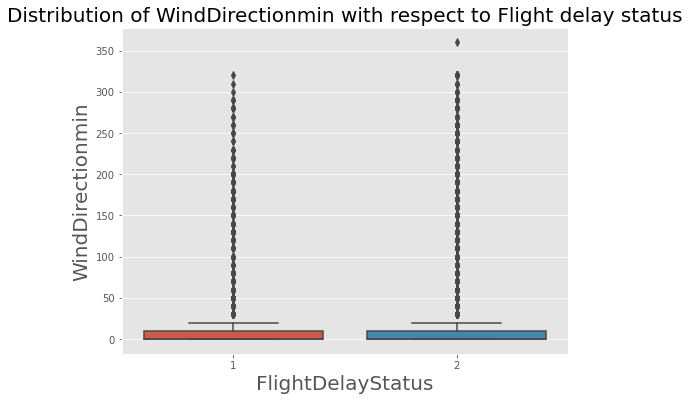

**********************************************************************************************


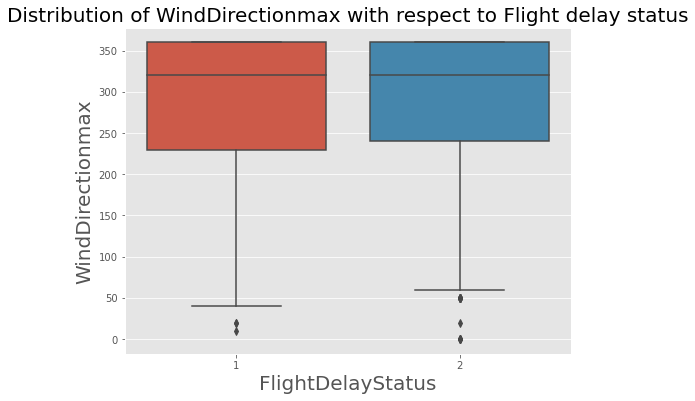

**********************************************************************************************


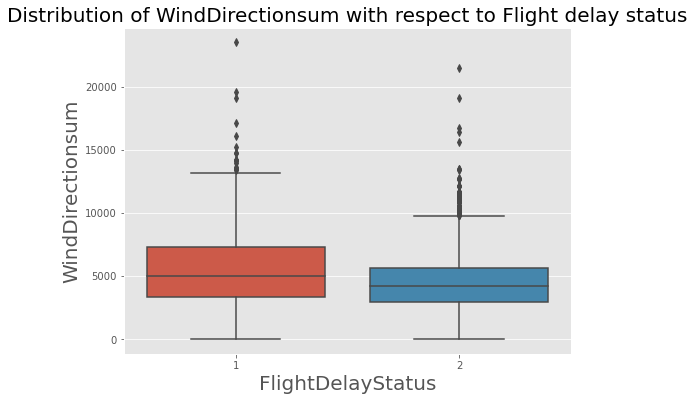

**********************************************************************************************


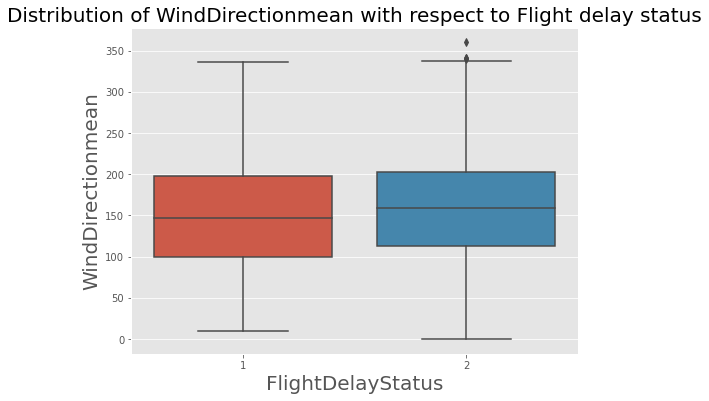

**********************************************************************************************


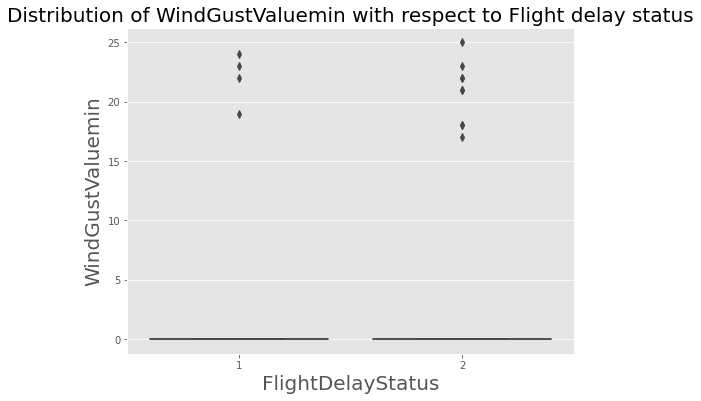

**********************************************************************************************


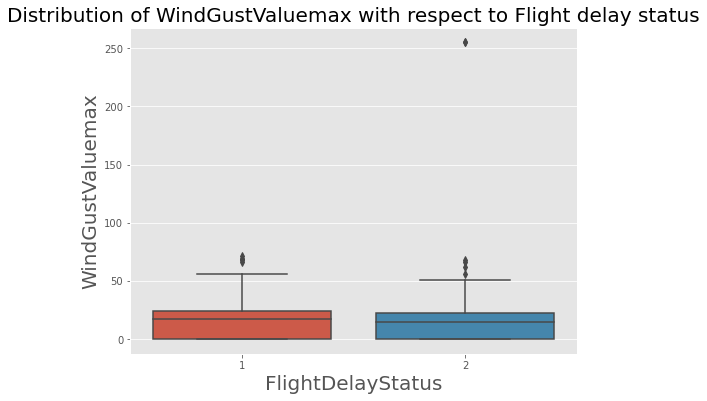

**********************************************************************************************


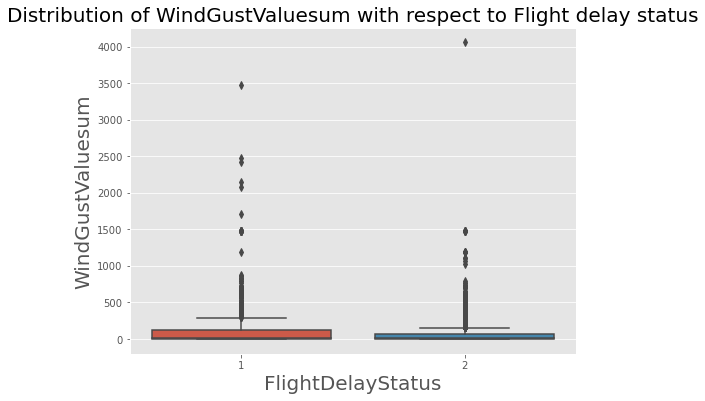

**********************************************************************************************


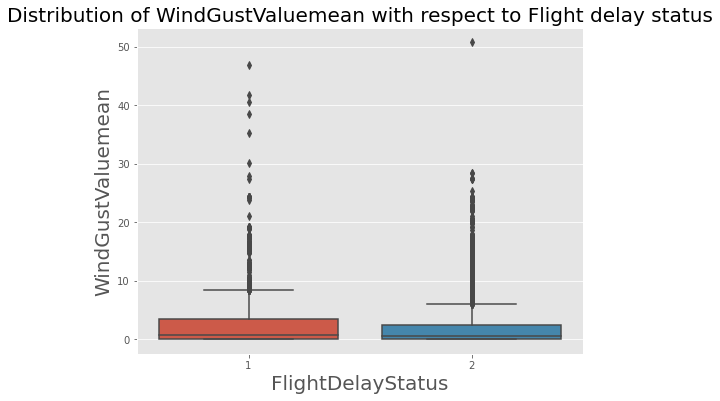

**********************************************************************************************


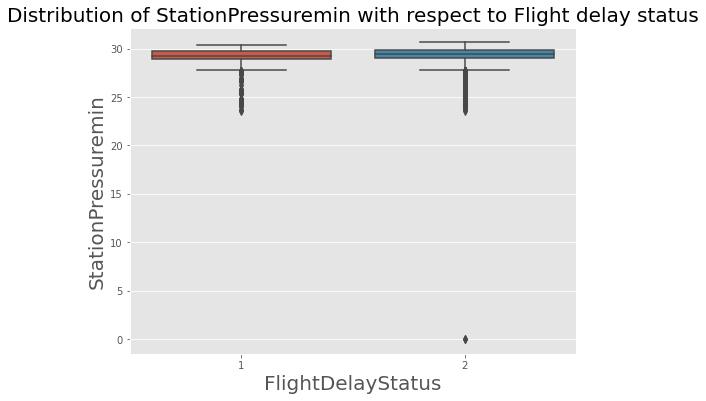

**********************************************************************************************


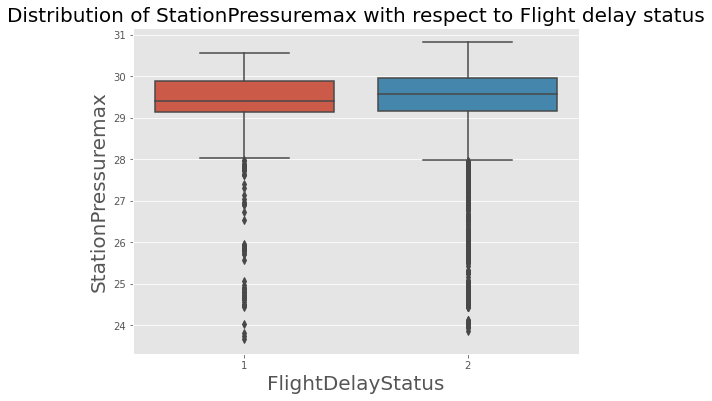

**********************************************************************************************


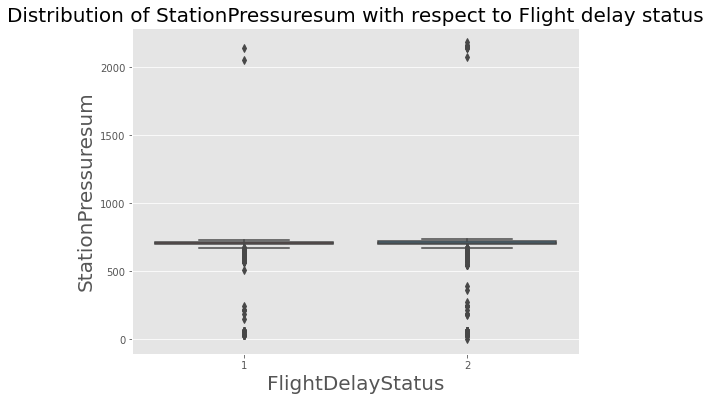

**********************************************************************************************


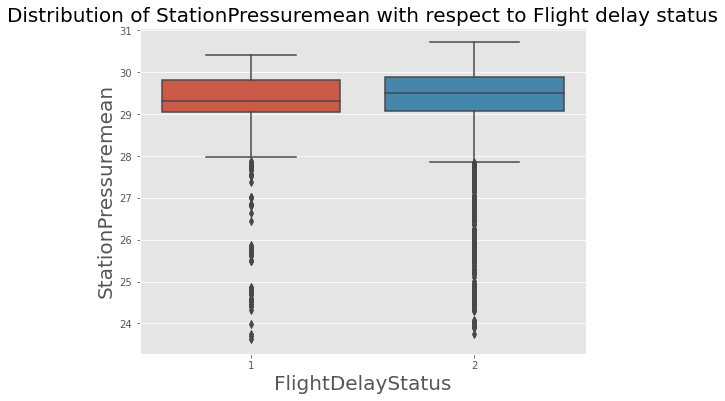

**********************************************************************************************


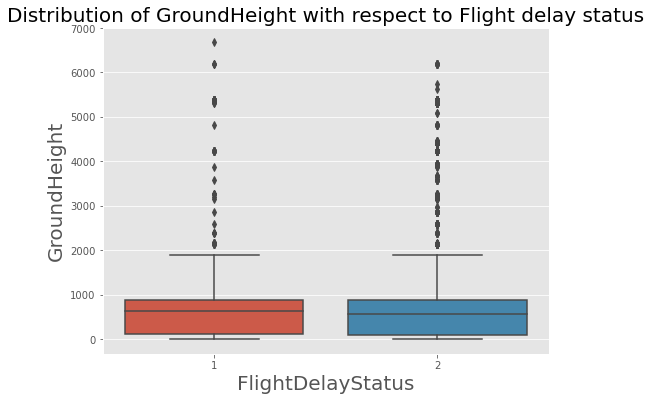

**********************************************************************************************


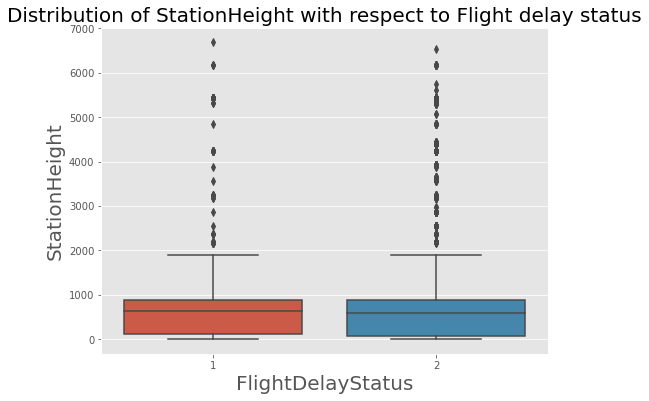

**********************************************************************************************


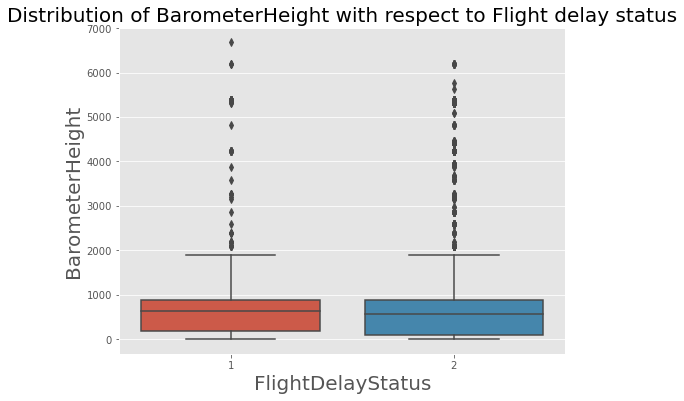

**********************************************************************************************


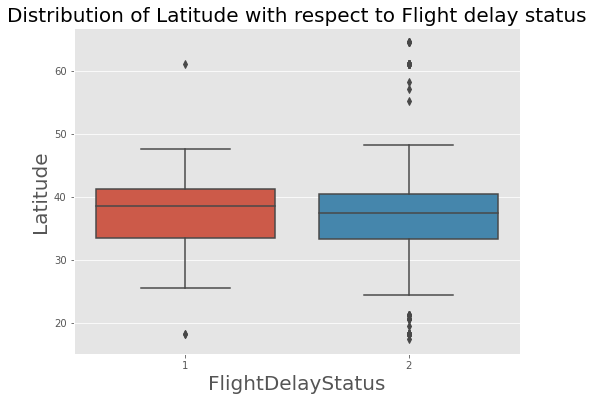

**********************************************************************************************


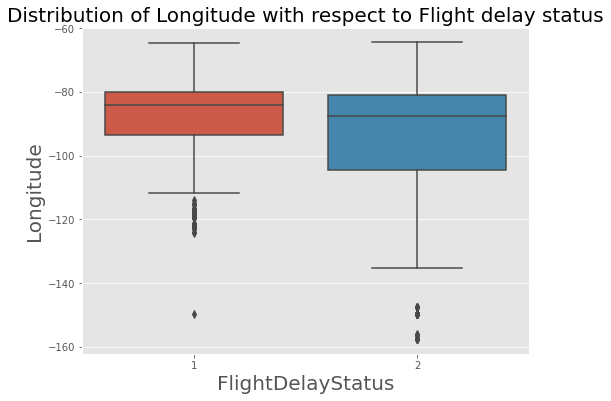

**********************************************************************************************


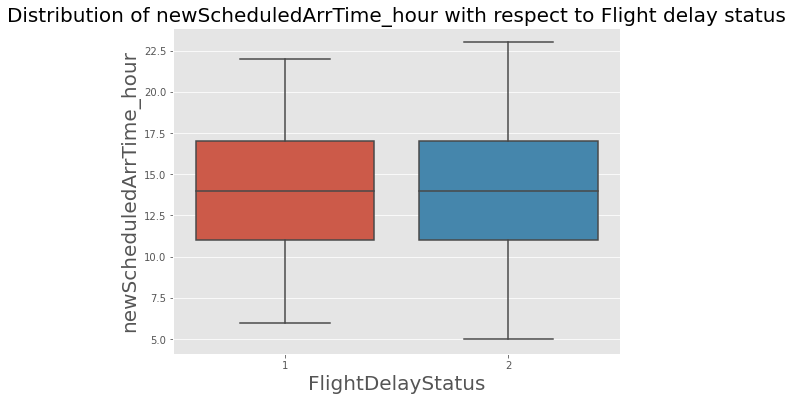

**********************************************************************************************


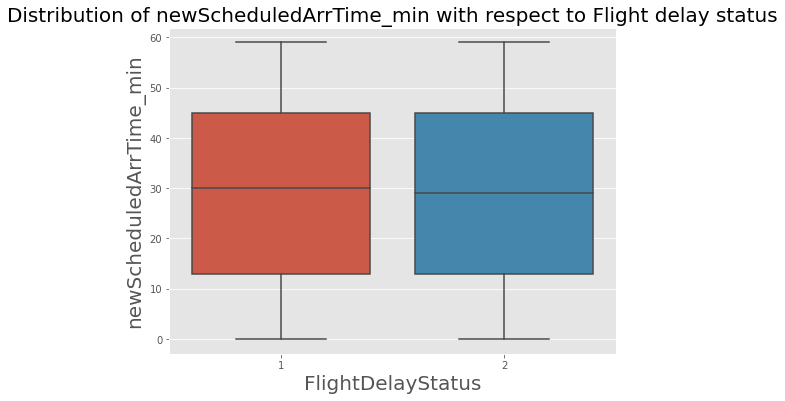

**********************************************************************************************


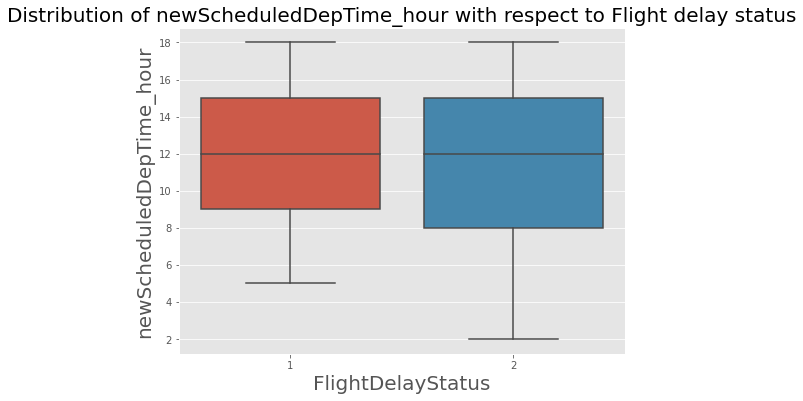

**********************************************************************************************


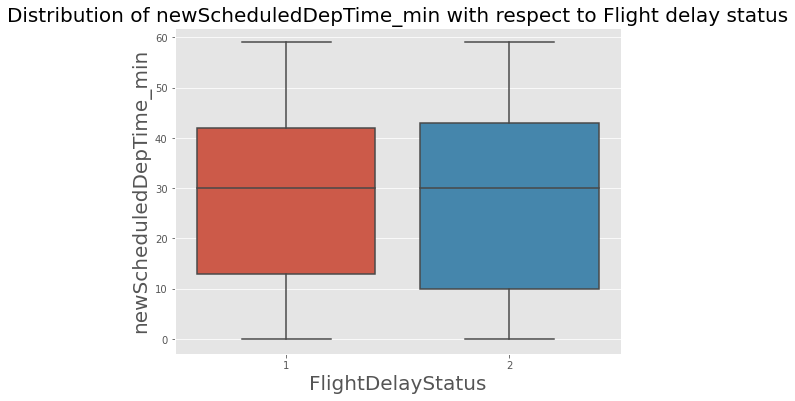

**********************************************************************************************


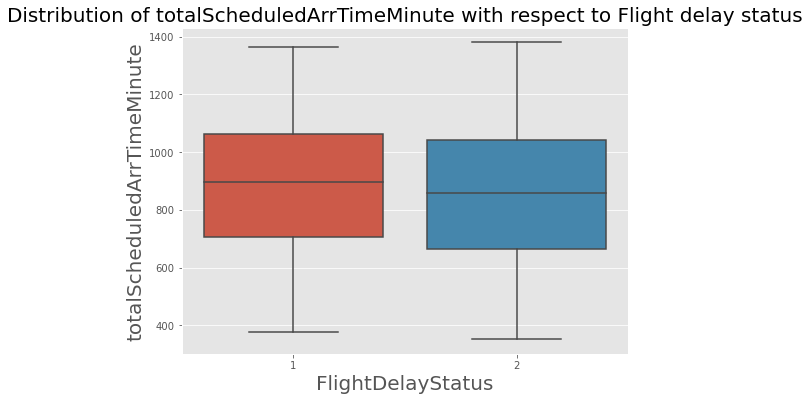

**********************************************************************************************


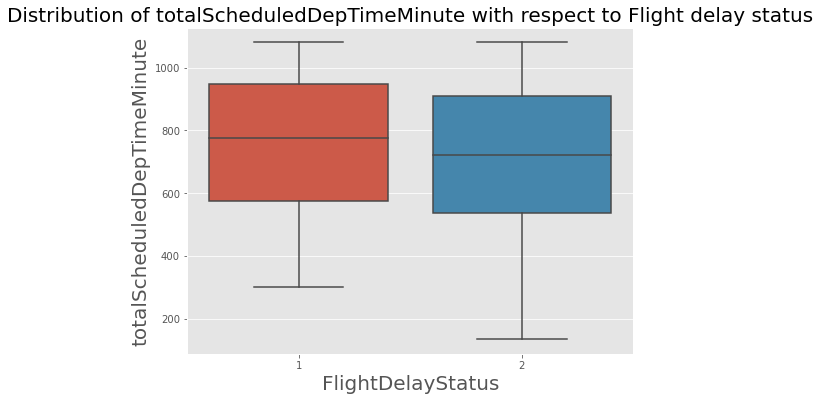

**********************************************************************************************


In [108]:
for col in numeric_column:
    plt.style.use("ggplot")
    plt.figure(figsize=(8,6))
    sns.boxplot(data =origin_train_data,  y = col, x ="FlightDelayStatus")
    plt.title("Distribution of" +" "+ col +" "+"with respect to Flight delay status", fontsize=20)
    plt.xlabel("FlightDelayStatus", fontsize=20)
    plt.ylabel(col, fontsize = 20)
    plt.show()
    print("**********************************************************************************************")

Observation: 
     Boxplot shows the distribution of data with respect to flight delay status:

*    Month -  It can be seen that from 4 month onwards delay can be obsever 
*    DayOfmonth and DayofWeek shows equal distribution of with respect to flight delay status. Lets covert this to categorical      and look for the obeservartion
*    Delay is most likey to be obseved when the distance is within an range of 0 - 1500kms and for scheduled travel time of - 0      - 150min
*    ScheduledTraveltime - between 50 to 200 delay is observed
*    Visbility causes the delay of the flight
*    There is no distribution can be seen for Hourly precip data 
*    Visbility, DBT, DewpointTemp, Ground height, Relative humidity, station height, windspeed are important attributes

Conclusion - For the various stats univariate analysis and from the boxplot Hourly precip is not an important attributes

# Feature Engineering - Statisical tests for important attributes

There are many statistical tests are available for finding out the important attributes for the model.
*    For categorical Feature Chi-Square test can be used
*    For Numberical variable Variance_Threshold, Select k best, Recursive feature elimination methods are available to select 
     the important features

#### Test for categorical attributes - ChiSquare test


In [109]:
# Chi-Square tells you which categorical attributes are more important with respect to target variable
def find_chi2_independence(cat_col, target, df, alpha=0.05): 
    data = df[[target, cat_col]] # creating dataframe of target and categorical col
    tab = sm.stats.Table.from_data(data)
    tab = tab.table_orig.to_numpy()
    print(f"---------------{target} Vs {cat_col} Chi Square Test of Independence -------------------")
    print(f"\n Contingency table :\n")
    print(tab)
    
    stat, p, dof, expected = chi2_contingency(tab)# creating contigency table
    print(f"\n Expected table :\n")
    print(expected)
    
    print(f"The p value returned = {p} and degrees of freedom returned = {dof}")
    
    # interpret p-value
    print('significance(alpha) = %.3f' % (alpha))

    if p <= alpha:
        print('Dependent (reject H0)') # If the value of p-less than 0.05 reject the the null hypothesis 
    else:
        print('Independent (fail to reject H0)')

In [110]:
for col in non_numeric_column:
    find_chi2_independence(col, "FlightDelayStatus", origin_train_data)

---------------FlightDelayStatus Vs Origin Chi Square Test of Independence -------------------

 Contingency table :

[[  1   2   2   3   1   2   0   0   2   0   1   0 185   6  11   8   3   0
    7   2   0   0  10   1   0  15   0  42   1   1   0   1   0  12   4  15
    0   4   6   0   1   2   2   4   1  27   2  17  12   0   3   0   4   0
   74   3   3   6  22  26  90   1   0   1   8  47   0   0   0   0   1   2
   52   0   0   0   3   0   0   8   1   1   0   0   0   4   1   2   1   1
    3   2  10  10   4   0   0   1   1   0   7   2   1   4   0   1  41  46
    3   0   0   7   3   1   5   6  17   0   0   0   3   9   0  18   4   2
    0  39   1  11   0   0   1   0  11  15   3  13   2   7   0   1   1   8
    4   2   1   0   1   2   1   5   1  46   2   0   3   5   0   5   1   3
   91   9   4   6   3   1  26   4   0   0  16   4   1   1   7   2   1   0
   15   6   0   4  11   0   0   2  10   3   0   2   0   5  20   6   1   0
    4   0   1   1   1  13   6   3   0  10   1   0   6   1   1  11   

---------------FlightDelayStatus Vs WeatherStationID Chi Square Test of Independence -------------------

 Contingency table :

[[ 26   3   8   0   3   4   0   4   3   2   2  90   3   5  11   0   0   0
    3   6   0   1   1  15   1   3   0   1   4  11   4   8   0   0   0   0
    1   2   1   7   0  10   4   0  46   3  15  10   0   9  26   6   4  22
    1   0   1   2   0   3 185  10   1   4  17   2   4   6   2   7   2   1
   15   4  11   1   4   3   2  11   0   5   3   1   1   0   0  10   1   0
    8   3  39  12  52   2   1  42   7   0   1   2   7  11   6   3  13  27
   12   1   0   3   5   2   0   0   2   0   0   6   2   0   0   1  46   0
    0   8   0   1   0   1   0   0   0   1   1   4   0   0   2   0   1   1
    4   2   1   9  18   4   0   0   2   0   5   6   1   1   0   1   0   0
    1   0  13   0   0   0   1   0   1   4   1   1   1   1   6  20   0   1
    1   0   0   0   0   1   1   0   3   1   0   3   0   1   3   3   0   6
   15   2   2  41   0   1   1  74   6   2   7   2   5   1 

---------------FlightDelayStatus Vs SkyConditionsmost frequent Chi Square Test of Independence -------------------

 Contingency table :

[[0 1 0 ... 0 4 0]
 [2 4 1 ... 1 3 1]]

 Expected table :

[[0.38656318 0.96640794 0.19328159 ... 0.19328159 1.35297112 0.19328159]
 [1.61343682 4.03359206 0.80671841 ... 0.80671841 5.64702888 0.80671841]]
The p value returned = 9.902580066378626e-117 and degrees of freedom returned = 1090
significance(alpha) = 0.050
Dependent (reject H0)
---------------FlightDelayStatus Vs AirportID Chi Square Test of Independence -------------------

 Contingency table :

[[  1   2   2   3   1   2   0   0   2   0   1   0 185   6  11   8   3   0
    7   2   0   0  10   1   0  15   0  42   1   1   0   1   0  12   4  15
    0   4   6   0   1   2   2   4   1  27   2  17  12   0   3   0   4   0
   74   3   3   6  22  26  90   1   0   1   8  47   0   0   0   0   1   2
   52   0   0   0   3   0   0   8   1   1   0   0   0   4   1   2   1   1
    3   2  10  10   4   0   0 

---------------FlightDelayStatus Vs FlightDelayStatus Chi Square Test of Independence -------------------

 Contingency table :

[[1519    0]
 [   0 6342]]

 Expected table :

[[ 293.52003562 1225.47996438]
 [1225.47996438 5116.52003562]]
The p value returned = 0.0 and degrees of freedom returned = 1
significance(alpha) = 0.050
Dependent (reject H0)


Observation and conclusion : 
*    P-value< 0.05 reject the null hypothesis saying that (cat_features and target variables are independent) or else fail to reject the null hypothesis,
*    From the above test alll categorical attributes such as Origin, Destination, WeatherStationID, AirportID, TimeZone are important features


# Feature selection by Vaiance_Threshold method

In [111]:
print("******************drop numerical var based on minimum variance**********************")
print("***********Before apply of variance threshold***********************")
print()
print(numeric_origin_train_data.shape)
print()
print(numeric_origin_train_data.columns)


# defing function
def variance_threshold_selector(data, threshold=1):
    selector = VarianceThreshold(threshold)
    selector.fit(data)
    return data[data.columns[selector.get_support(indices=True)]] #Provides the NZV column apart from threshold 

# Applying this statistics on numeric data
numeric_origin_train_data_nzv = variance_threshold_selector(numeric_origin_train_data, threshold=1)

print("****** After the apply of variance threshold, the shape data shape and columns ***********")
print()
print(numeric_origin_train_data_nzv.shape)
print()
print(numeric_origin_train_data_nzv.columns)




******************drop numerical var based on minimum variance**********************
***********Before apply of variance threshold***********************

(7861, 52)

Index(['Month', 'DayofMonth', 'DayOfWeek', 'ScheduledTravelTime', 'Distance',
       'HourlyPrecipmin', 'HourlyPrecipmax', 'HourlyPrecipsum',
       'HourlyPrecipmean', 'Visibilitymin', 'Visibilitymax', 'Visibilitysum',
       'Visibilitymean', 'DBTmin', 'DBTmax', 'DBTsum', 'DBTmean',
       'DewPointTempmin', 'DewPointTempmax', 'DewPointTempsum',
       'DewPointTempmean', 'RelativeHumidityPercentmin',
       'RelativeHumidityPercentmax', 'RelativeHumidityPercentsum',
       'RelativeHumidityPercentmean', 'WindSpeedmin', 'WindSpeedmax',
       'WindSpeedsum', 'WindSpeedmean', 'WindDirectionmin', 'WindDirectionmax',
       'WindDirectionsum', 'WindDirectionmean', 'WindGustValuemin',
       'WindGustValuemax', 'WindGustValuesum', 'WindGustValuemean',
       'StationPressuremin', 'StationPressuremax', 'StationPressuresum',


Observation: 
*    For Numerical attributes Variance threshold is applied. and threshold of variance is 1 is given. Based on this. If the    
     variance of the attribute is very less(close to mean). then the importance of the attribute is very less for explaining for the target  variable.
*    In this case 'HourlyPrecipmin', 'HourlyPrecipmax', 'HourlyPrecipsum', 'Visibilitymax', 'WindGustValuemin' are not an   
     important attributes for our model

In [112]:
print("************after droping the variables based on variance threshold**************")
numeric_origin_train_data_nzv.head()

************after droping the variables based on variance threshold**************


,Month,DayofMonth,DayOfWeek,ScheduledTravelTime,Distance,Visibilitymin,Visibilitysum,Visibilitymean,DBTmin,DBTmax,...,StationHeight,BarometerHeight,Latitude,Longitude,newScheduledArrTime_hour,newScheduledArrTime_min,newScheduledDepTime_hour,newScheduledDepTime_min,totalScheduledArrTimeMinute,totalScheduledDepTimeMinute
0,9,20,1,114,563,10.0,240.0000,10.000000,49.0,69.0,...,30,180,42.22,-71.01,11,54,10,0,714,600
1,11,19,5,114,554,0.0,132.6875,3.491776,51.0,55.0,...,805,805,41.24,-81.51,16,34,14,40,994,880
2,11,19,5,113,554,0.0,132.6875,3.491776,51.0,55.0,...,805,805,41.24,-81.51,18,43,16,50,1123,1010
3,11,19,5,62,280,0.0,132.6875,3.491776,51.0,55.0,...,805,805,41.24,-81.51,17,17,16,15,1037,975
4,5,4,2,62,226,6.0,200.0000,8.333333,64.0,81.0,...,55,52,33.41,-117.52,19,2,18,0,1142,1080


In [113]:
# Concating non zero variance(nzv) colmn along with all categorical important column
origin_train_data_nzv = pd.concat([numeric_origin_train_data_nzv, nonnumeric_origin_train_data], axis=1)
# Resetting the index
origin_train_data_nzv = origin_train_data_nzv.reset_index(drop = True)

In [114]:
print("*************Checking the shape of the dataframe**********************")
print()
print(origin_train_data_nzv.shape)
print()
#checking top5 records
origin_train_data_nzv.head()

*************Checking the shape of the dataframe**********************

(7861, 53)



,Month,DayofMonth,DayOfWeek,ScheduledTravelTime,Distance,Visibilitymin,Visibilitysum,Visibilitymean,DBTmin,DBTmax,...,newScheduledDepTime_min,totalScheduledArrTimeMinute,totalScheduledDepTimeMinute,Origin,Destination,WeatherStationID,SkyConditionsmost frequent,AirportID,TimeZone,FlightDelayStatus
0,9,20,1,114,563,10.0,240.0000,10.000000,49.0,69.0,...,0,714,600,BOS,CLE,14739,CLR,BOS,+5,2
1,11,19,5,114,554,0.0,132.6875,3.491776,51.0,55.0,...,40,994,880,CLE,ATL,14820,OVC002,CLE,+5,1
2,11,19,5,113,554,0.0,132.6875,3.491776,51.0,55.0,...,50,1123,1010,CLE,ATL,14820,OVC002,CLE,+5,1
3,11,19,5,62,280,0.0,132.6875,3.491776,51.0,55.0,...,15,1037,975,CLE,MDT,14820,OVC002,CLE,+5,1
4,5,4,2,62,226,6.0,200.0000,8.333333,64.0,81.0,...,0,1142,1080,SNA,LAS,93184,CLR,SNA,+8,2


## Data exploration on numerical column and getting to know about insites

In [115]:
# This custom function gives the probablity of flight delay staus = 1 with respect to required column 
def getProbOfNoShow(col, target, df, forGraph=True):
    crosstab = pd.crosstab(index = df[col], columns = df[target]) # gives the cross tab of column with targetfeatures status
    crosstab.columns = pd.Index(list(crosstab.columns))
    crosstab = crosstab.reset_index() 
    crosstab['TotalCount'] = crosstab['1'] + crosstab['2'] # getting total counts
    crosstab['probFlightDelayStatus_1'] = crosstab['1'] / crosstab['TotalCount'] # calculating probabilty count of flightdelay status=1
    
    print(crosstab.head())
    if forGraph:
        return crosstab[[col, 'probFlightDelayStatus_1']]
    else:
        return crosstab[[col, 'TotalCount', 'probFlightDelayStatus_1']]

   Month    1     2  TotalCount  probFlightDelayStatus_1
0      1   89   141         230                 0.386957
1      3  145   810         955                 0.151832
2      5  290  1442        1732                 0.167436
3      7  304  1459        1763                 0.172433
4      9  223  1332        1555                 0.143408


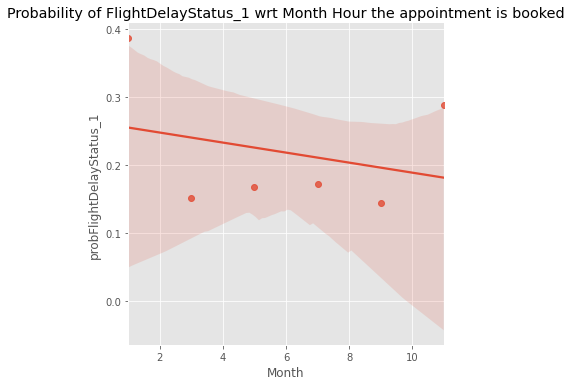

*****************************************************************************************
   DayofMonth    1    2  TotalCount  probFlightDelayStatus_1
0           1   76  200         276                 0.275362
1           2   55  242         297                 0.185185
2           3   56  264         320                 0.175000
3           4  106  238         344                 0.308140
4           5   27  232         259                 0.104247


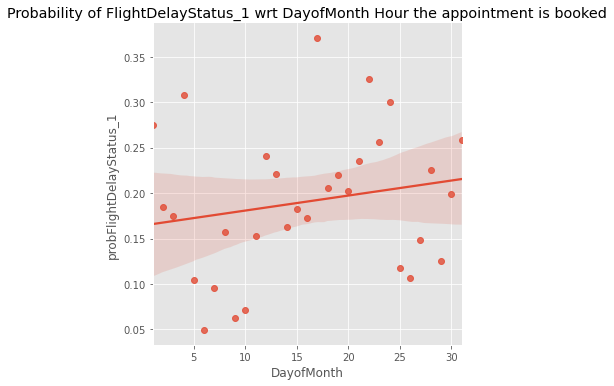

*****************************************************************************************
   DayOfWeek    1    2  TotalCount  probFlightDelayStatus_1
0          1  229  912        1141                 0.200701
1          2  211  895        1106                 0.190778
2          3  248  907        1155                 0.214719
3          4  245  927        1172                 0.209044
4          5  200  957        1157                 0.172861


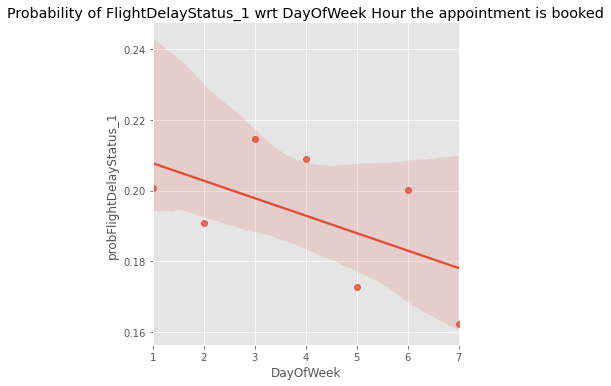

*****************************************************************************************
   newScheduledArrTime_hour   1    2  TotalCount  probFlightDelayStatus_1
0                         5   0    1           1                 0.000000
1                         6   5   21          26                 0.192308
2                         7  44  184         228                 0.192982
3                         8  82  373         455                 0.180220
4                         9  78  423         501                 0.155689


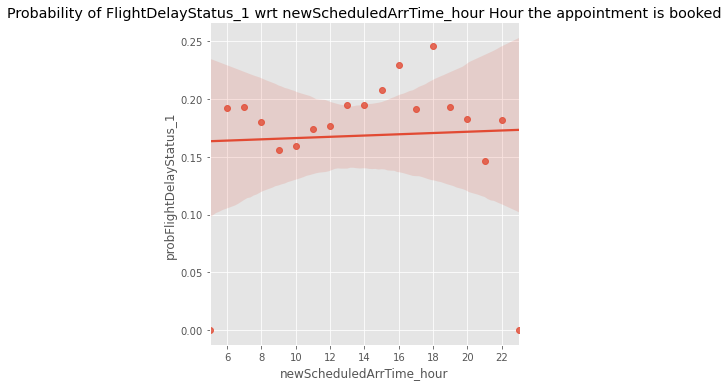

*****************************************************************************************
   newScheduledArrTime_min   1    2  TotalCount  probFlightDelayStatus_1
0                        0  57  226         283                 0.201413
1                        1  13   79          92                 0.141304
2                        2  24   90         114                 0.210526
3                        3  24   84         108                 0.222222
4                        4  22   89         111                 0.198198


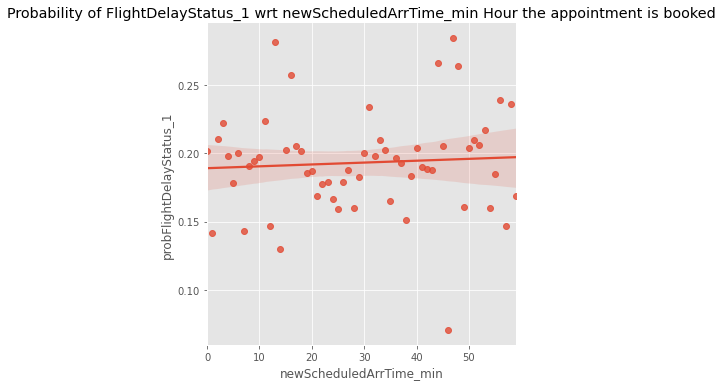

*****************************************************************************************
   newScheduledDepTime_hour   1    2  TotalCount  probFlightDelayStatus_1
0                         2   0    2           2                 0.000000
1                         3   0    1           1                 0.000000
2                         5  13   61          74                 0.175676
3                         6  90  417         507                 0.177515
4                         7  92  527         619                 0.148627


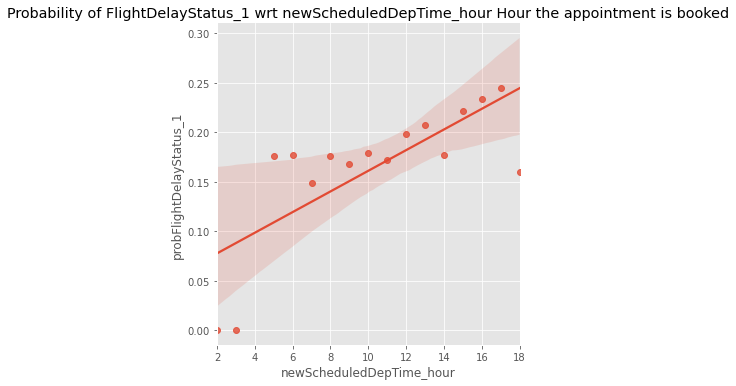

*****************************************************************************************
   newScheduledDepTime_min    1    2  TotalCount  probFlightDelayStatus_1
0                        0  167  786         953                 0.175236
1                        1    6   31          37                 0.162162
2                        2    9   28          37                 0.243243
3                        3   11   25          36                 0.305556
4                        4    7   17          24                 0.291667


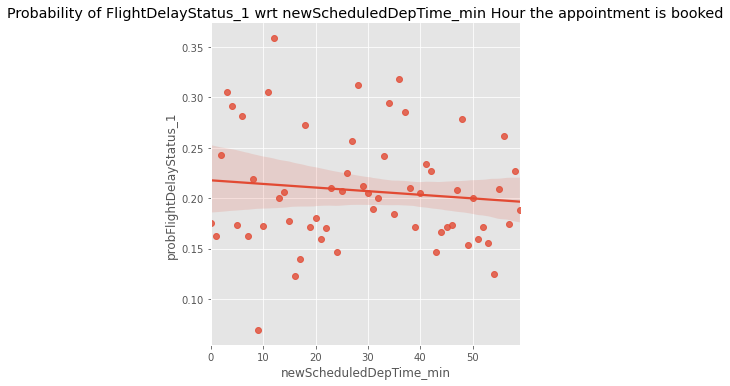

*****************************************************************************************
   totalScheduledArrTimeMinute  1  2  TotalCount  probFlightDelayStatus_1
0                          353  0  1           1                      0.0
1                          360  0  1           1                      0.0
2                          370  0  1           1                      0.0
3                          376  1  0           1                      1.0
4                          380  1  0           1                      1.0


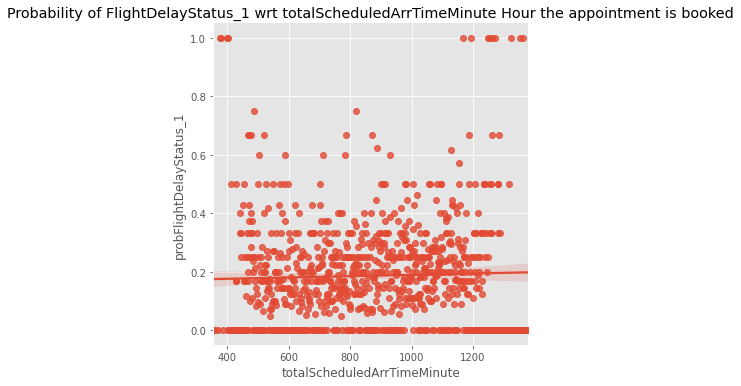

*****************************************************************************************
   totalScheduledDepTimeMinute  1  2  TotalCount  probFlightDelayStatus_1
0                          135  0  1           1                      0.0
1                          159  0  1           1                      0.0
2                          195  0  1           1                      0.0
3                          300  1  4           5                      0.2
4                          310  0  1           1                      0.0


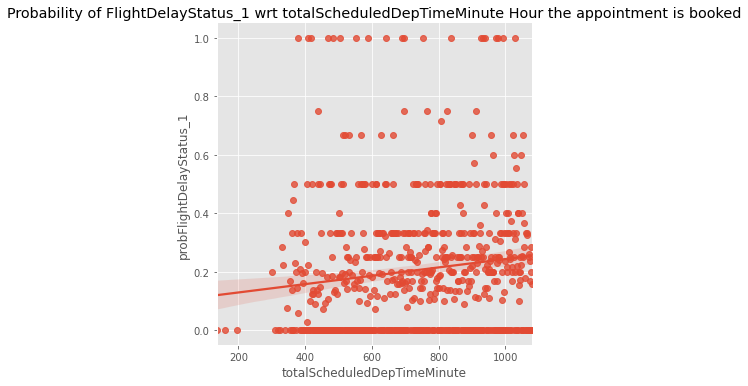

*****************************************************************************************


In [116]:
# Analysis of Target Flight delay status = 1, with respect to month day of month, day of week and time columns

# Selecting the columns
list_of_columns = ["Month" , "DayofMonth" , "DayOfWeek" , "newScheduledArrTime_hour", "newScheduledArrTime_min", 
                   "newScheduledDepTime_hour", "newScheduledDepTime_min","totalScheduledArrTimeMinute", 
                   "totalScheduledDepTimeMinute"]

# for every columns get the probablity score of flightdelay staus and analye it
for column in list_of_columns:
    data = getProbOfNoShow(column, "FlightDelayStatus", origin_train_data_nzv)
    data
    sns.lmplot(data = data, x = column, y = 'probFlightDelayStatus_1', fit_reg = True)
    # plt.xticks(np.arange(np.min(df['dayOfmonth']), np.max(df['DayofMonth']), 10))
    plt.title('Probability of FlightDelayStatus_1 wrt ' + column +' Hour the appointment is booked')
    plt.show()
    print("*****************************************************************************************")

observation:
*    From plot show the probabilty of numeric col w.r.t to flight delay status 1, There is no such pattren
*    is comming from the these plot. Lets bin all the columns and do the analysis

## Customised function for binning the numerical attributes

In [117]:
#Function gives the binning of for the hour 
def get_hr(x):
    if x < 8:
        return 'EarlyMorning'
    elif (x >= 8) and (x < 12 ):
        return 'Morning'
    elif (x >= 12) and (x < 16):
        return'Noon'
    elif (x >= 16) and (x < 20) :
        return 'Eve'
    elif (x >= 20) and (x < 24):
        return'Night'
    
#Function gives the binning for the Totaltime = hour and min 
def get_Totaltimemin(x):
    if x < 480:
        return 'EarlyMorning'
    elif (x >= 480) and (x < 720 ):
        return 'Morning'
    elif (x >= 720) and (x < 960):
        return'Noon'
    elif (x >= 960) and (x < 1200) :
        return 'Eve'
    elif (x >= 1200) and (x < 1440):
        return'Night'
    
#Function gives the binning for the min 
def get_min(x):
    if x < 15:
        return '15min_delay'
    elif (x >= 15) and (x < 30):
        return '30min_delay'
    elif (x >= 30) and (x < 45):
        return'45min_delay'
    elif (x >= 45) and (x < 60) :
        return '60min_delay'
    
#Function gives the binning for the DayOfMOnth column and is convert to 1st,2nd,3rd,4th and 5th week.
def get_week(x):
    if x <= 7:
        return '1st_week'
    elif (x > 7) and (x <= 14):
        return '2nd_week'
    elif (x > 14) and (x <= 21):
        return'3rd_week'
    elif (x > 21) and (x <= 28) :
        return '4th_week'
    elif (x > 28):
        return '5th_week'

### Converting the above numeric columns into binning 

In [118]:
list_of_coumn = ["Month" , "DayofMonth" , "DayOfWeek" , "newScheduledArrTime_hour", "newScheduledArrTime_min", 
                 "newScheduledDepTime_hour", "newScheduledDepTime_min","totalScheduledArrTimeMinute", 
                 "totalScheduledDepTimeMinute"]

# DayofMonth is binned using customised function
origin_train_data_nzv["DayofMonth_bin"] = origin_train_data_nzv["DayofMonth"].apply(get_week)
origin_train_data_nzv = origin_train_data_nzv.drop("DayofMonth", axis=1)

# Day of week numbers are replaced with Intitutive days, Since ISO format of the date is give, 1 becomes Monday and so on 
origin_train_data_nzv["DayOfWeek"] = origin_train_data_nzv["DayOfWeek"].replace(to_replace = [1,2,3,4,5,6,7], 
                                           value = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"])

# Similary newScheduledArrTime_hour_bin are binneed using customised function
origin_train_data_nzv["newScheduledArrTime_hour_bin"] = origin_train_data_nzv["newScheduledArrTime_hour"].apply(get_hr)
origin_train_data_nzv = origin_train_data_nzv.drop("newScheduledArrTime_hour", axis=1)
origin_train_data_nzv["newScheduledArrTime_min_bin"] = origin_train_data_nzv["newScheduledArrTime_min"].apply(get_min)
origin_train_data_nzv = origin_train_data_nzv.drop("newScheduledArrTime_min", axis=1)

# newScheduledDepTime_hour_bin are binned using customised function
origin_train_data_nzv["newScheduledDepTime_hour_bin"] = origin_train_data_nzv["newScheduledDepTime_hour"].apply(get_hr)
origin_train_data_nzv = origin_train_data_nzv.drop("newScheduledDepTime_hour", axis=1)
origin_train_data_nzv["newScheduledDepTime_min_bin"] = origin_train_data_nzv["newScheduledDepTime_min"].apply(get_min)
origin_train_data_nzv = origin_train_data_nzv.drop("newScheduledDepTime_min", axis=1)


# newActualArrivalTimeStamp_hour_bin are binned using customised function
# origin_train_data_nzv["newActualArrivalTimeStamp_hour_bin"] = origin_train_data_nzv["newActualArrivalTimeStamp_hour"].apply(get_hr)
# origin_train_data_nzv = origin_train_data_nzv.drop("newActualArrivalTimeStamp_hour", axis=1)
# origin_train_data_nzv["newActualArrivalTimeStamp_min_bin"] = origin_train_data_nzv["newActualArrivalTimeStamp_min"].apply(get_min)
# origin_train_data_nzv = origin_train_data_nzv.drop("newActualArrivalTimeStamp_min", axis=1)

# totalActualTimeMinute_bin are binned using customised function
# origin_train_data_nzv["totalActualTimeMinute_bin"] = origin_train_data_nzv["totalActualTimeMinute"].apply(get_Totaltimemin)
# origin_train_data_nzv = origin_train_data_nzv.drop("totalActualTimeMinute", axis=1)

# totalScheduledArrTimeMinute_bin binned using customised data
origin_train_data_nzv["totalScheduledArrTimeMinute_bin"] = origin_train_data_nzv["totalScheduledArrTimeMinute"].apply(get_Totaltimemin)
origin_train_data_nzv = origin_train_data_nzv.drop("totalScheduledArrTimeMinute", axis=1)

# totalScheduledDepTimeMinute_bin binned using customised data
origin_train_data_nzv["totalScheduledDepTimeMinute_bin"] = origin_train_data_nzv["totalScheduledDepTimeMinute"].apply(get_Totaltimemin)
origin_train_data_nzv = origin_train_data_nzv.drop("totalScheduledDepTimeMinute", axis=1)


In [119]:
print("***********After converting it into bins***********")
origin_train_data_nzv.head()

***********After converting it into bins***********


,Month,DayOfWeek,ScheduledTravelTime,Distance,Visibilitymin,Visibilitysum,Visibilitymean,DBTmin,DBTmax,DBTsum,...,AirportID,TimeZone,FlightDelayStatus,DayofMonth_bin,newScheduledArrTime_hour_bin,newScheduledArrTime_min_bin,newScheduledDepTime_hour_bin,newScheduledDepTime_min_bin,totalScheduledArrTimeMinute_bin,totalScheduledDepTimeMinute_bin
0,9,Monday,114,563,10.0,240.0000,10.000000,49.0,69.0,1432.0,...,BOS,+5,2,3rd_week,Morning,60min_delay,Morning,15min_delay,Morning,Morning
1,11,Friday,114,554,0.0,132.6875,3.491776,51.0,55.0,1281.0,...,CLE,+5,1,3rd_week,Eve,45min_delay,Noon,45min_delay,Eve,Noon
2,11,Friday,113,554,0.0,132.6875,3.491776,51.0,55.0,1281.0,...,CLE,+5,1,3rd_week,Eve,45min_delay,Eve,60min_delay,Eve,Eve
3,11,Friday,62,280,0.0,132.6875,3.491776,51.0,55.0,1281.0,...,CLE,+5,1,3rd_week,Eve,30min_delay,Eve,30min_delay,Eve,Eve
4,5,Tuesday,62,226,6.0,200.0000,8.333333,64.0,81.0,1698.0,...,SNA,+8,2,1st_week,Eve,15min_delay,Eve,15min_delay,Eve,Eve


### Converting all the binned column into category

In [120]:
origin_train_data_nzv["Month"] = origin_train_data_nzv["Month"].astype("category")

origin_train_data_nzv["DayofMonth_bin"] = origin_train_data_nzv["DayofMonth_bin"].astype("category")
origin_train_data_nzv["DayOfWeek"] = origin_train_data_nzv["DayOfWeek"].astype("category")

origin_train_data_nzv["newScheduledArrTime_hour_bin"] = origin_train_data_nzv["newScheduledArrTime_hour_bin"].astype("category")
origin_train_data_nzv["newScheduledArrTime_min_bin"] = origin_train_data_nzv["newScheduledArrTime_min_bin"].astype("category")

origin_train_data_nzv["newScheduledDepTime_hour_bin"] =origin_train_data_nzv["newScheduledDepTime_hour_bin"].astype("category")
origin_train_data_nzv["newScheduledDepTime_min_bin"] = origin_train_data_nzv["newScheduledDepTime_min_bin"].astype("category")

# origin_train_data_nzv["newActualArrivalTimeStamp_hour_bin"] = origin_train_data_nzv["newActualArrivalTimeStamp_hour_bin"].astype("category")
# origin_train_data_nzv["newActualArrivalTimeStamp_min_bin"] = origin_train_data_nzv["newActualArrivalTimeStamp_min_bin"].astype("category")
# origin_train_data_nzv["totalActualTimeMinute_bin"] = origin_train_data_nzv["totalActualTimeMinute_bin"].astype("category")

origin_train_data_nzv["totalScheduledArrTimeMinute_bin"] = origin_train_data_nzv["totalScheduledArrTimeMinute_bin"].astype("category")
origin_train_data_nzv["totalScheduledDepTimeMinute_bin"] = origin_train_data_nzv["totalScheduledDepTimeMinute_bin"].astype("category")

### Getting more insits into the data using more plots

In [121]:
def barplot(column,df):
    plt.style.use("ggplot")
    plt.figure(figsize=(8,6))
    bar_plot1 = sns.countplot(x=column, data=df)
    
    total = len(df[column])
    for p in bar_plot1.patches:
        percentage = '{:.2f}%'.format(100 * p.get_height()/total)
        height = p.get_height()
        bar_plot1.text(p.get_x()+ p.get_width()/2, height * 1, percentage, ha="center")

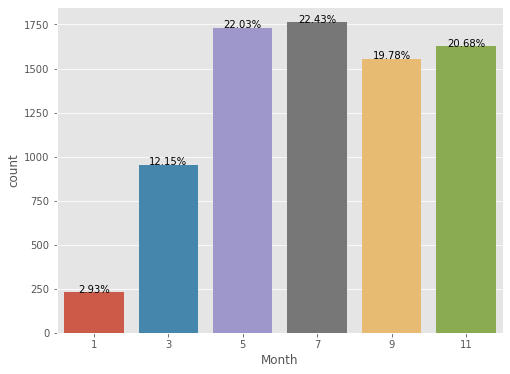

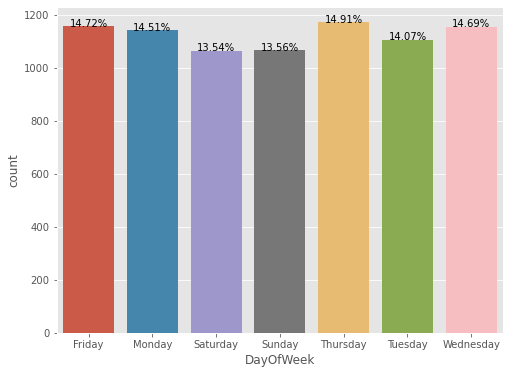

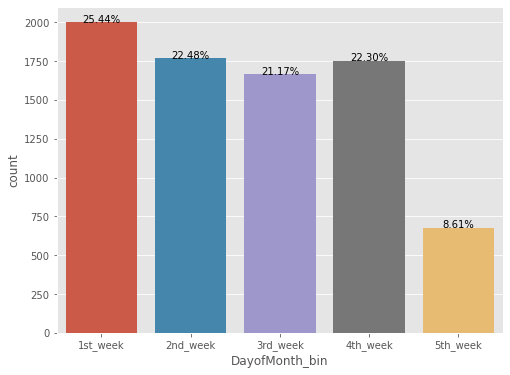

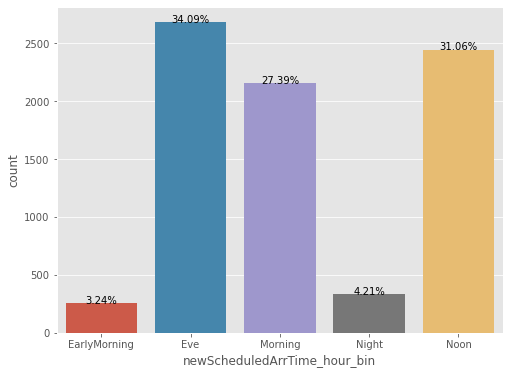

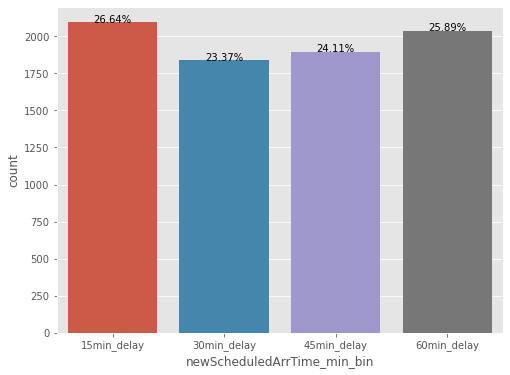

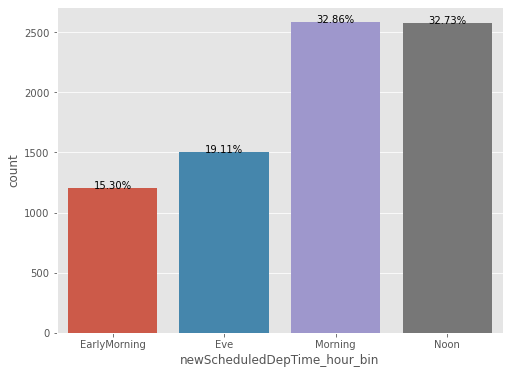

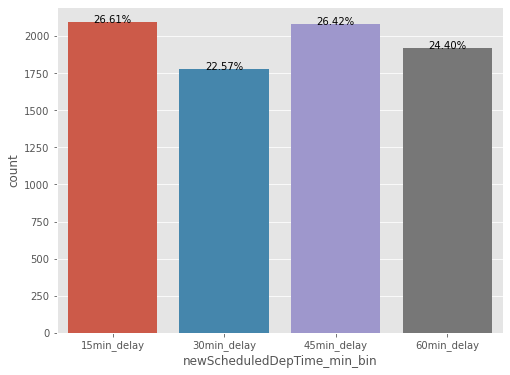

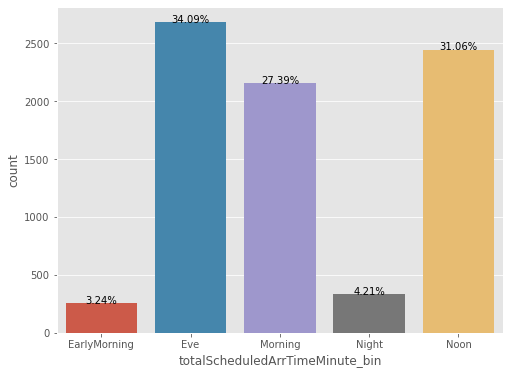

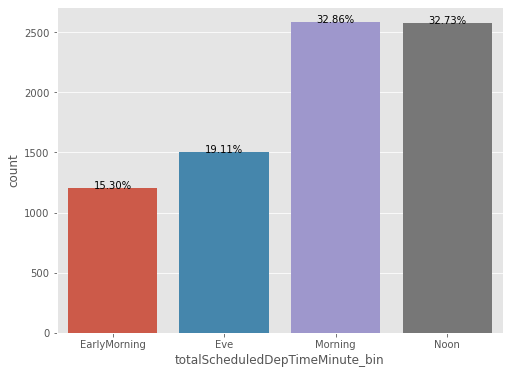

In [122]:
list_of_columns = ['Month','DayOfWeek','DayofMonth_bin','newScheduledArrTime_hour_bin','newScheduledArrTime_min_bin',
                   'newScheduledDepTime_hour_bin','newScheduledDepTime_min_bin','totalScheduledArrTimeMinute_bin',
                   'totalScheduledDepTimeMinute_bin']


for col in list_of_columns:
    barplot(col, origin_train_data_nzv)

Obsevation :
    Data shows the ditribution of flights with respect to various categorical feature, but using this plot it very
    to tell the important features

### lets do the prbablistic approach for some more plots for the Flight delay status = 1

In [123]:
def probStatusCategorical(col, df):
    rows = []
    for level in df[col].unique():
        row = {'Condition': col}
        ## Finding count of rows with that level in categorical column
        total = len(df[df[col] == level])
        ## Finding count of rows where level and Yes in No-show match
        n = len(df[(df[col] == level) & (df['FlightDelayStatus'] == '1')])
        row.update({'Level': level, 'Probability': n / total})
#             print(row)
        rows.append(row)
    return pd.DataFrame(rows)

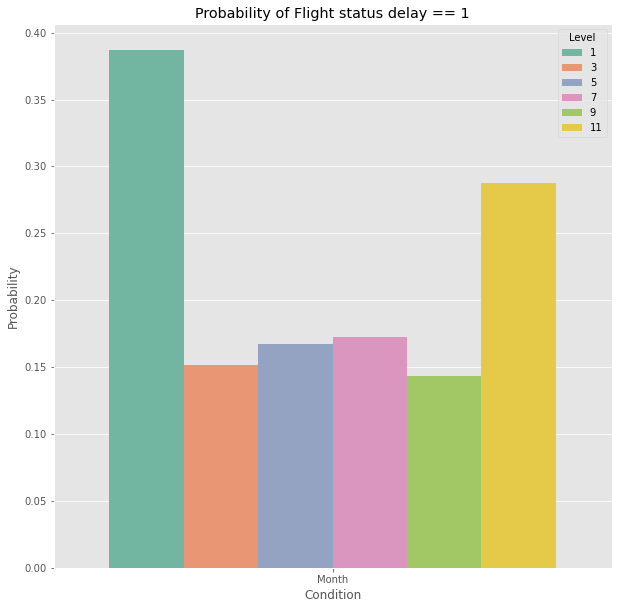

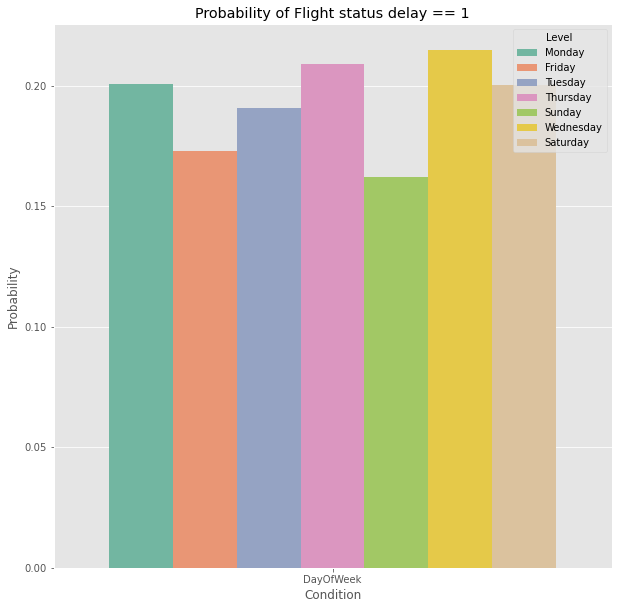

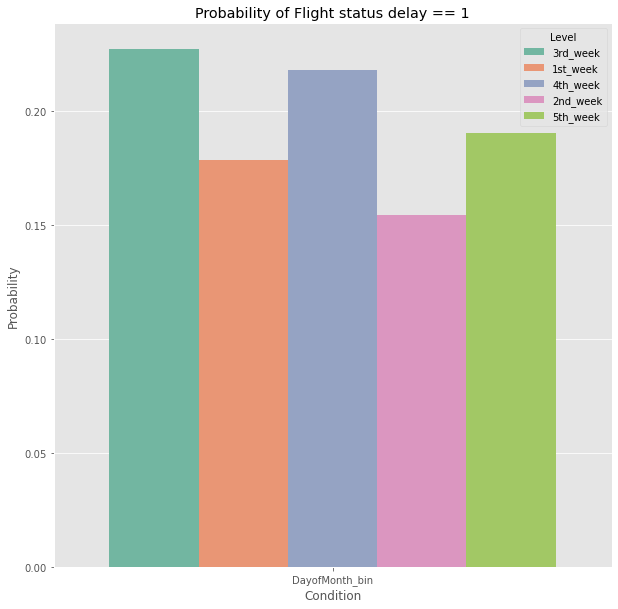

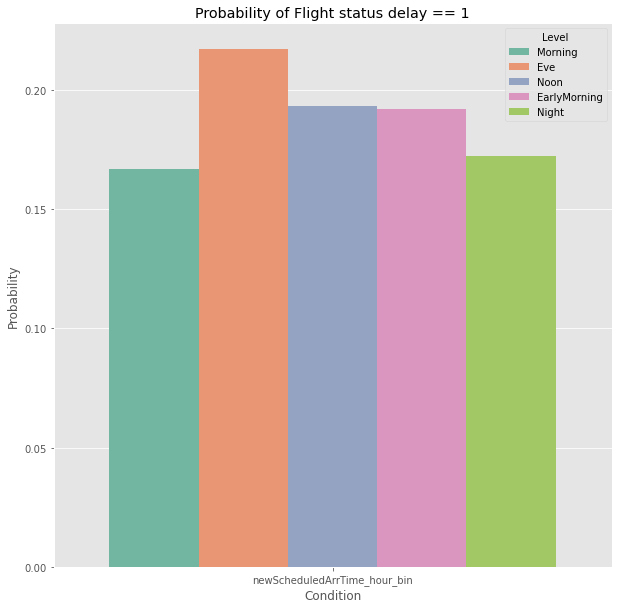

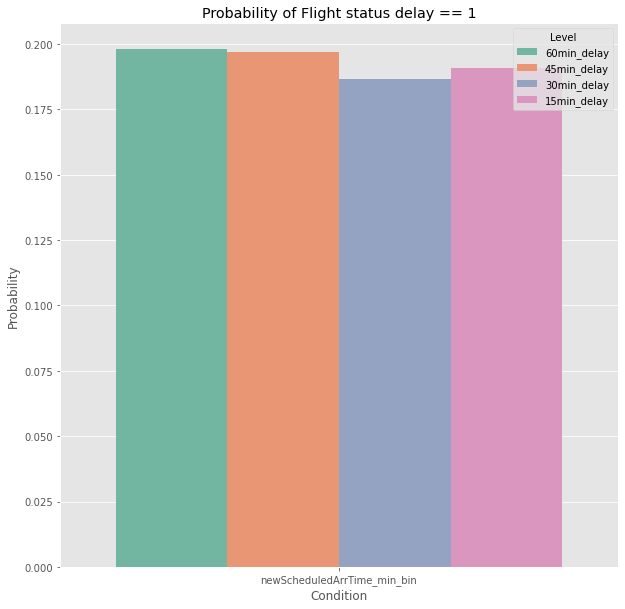

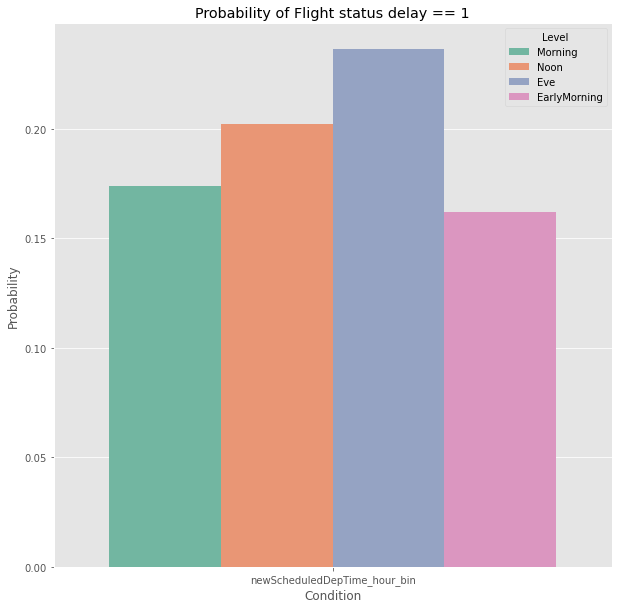

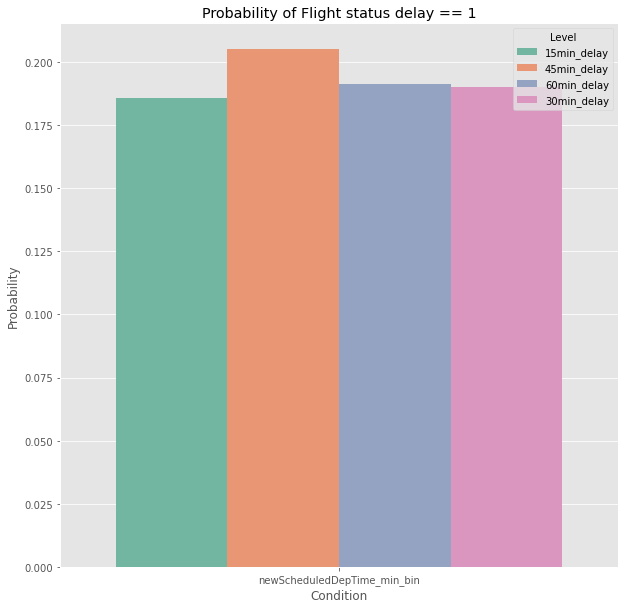

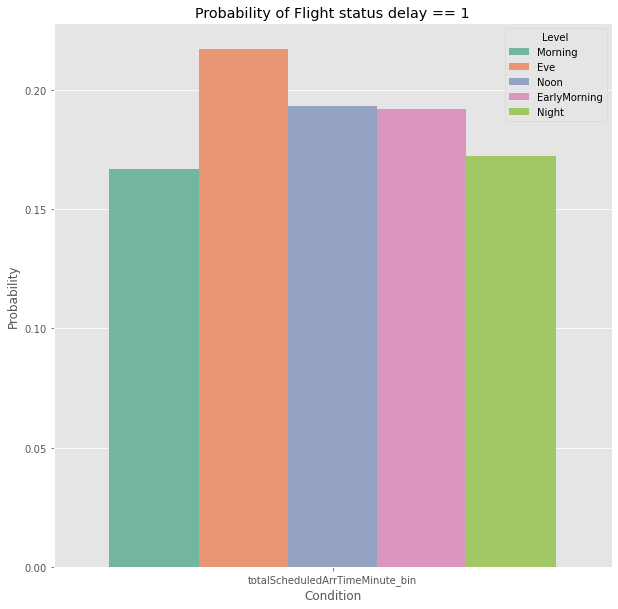

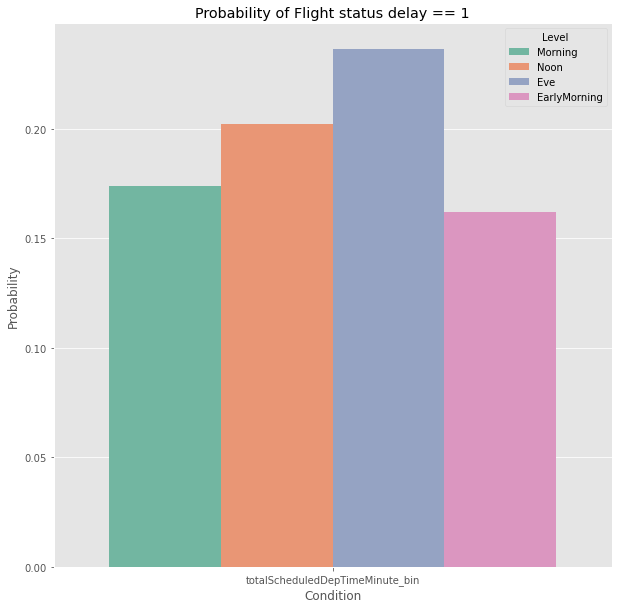

In [124]:
list_of_columns = ['Month','DayOfWeek','DayofMonth_bin','newScheduledArrTime_hour_bin','newScheduledArrTime_min_bin',
                   'newScheduledDepTime_hour_bin','newScheduledDepTime_min_bin','totalScheduledArrTimeMinute_bin',
                   'totalScheduledDepTimeMinute_bin']

for col in list_of_columns:
    plt.figure(figsize=(10,10))
    sns.barplot(data = probStatusCategorical(col, origin_train_data_nzv),
                x = 'Condition', y = 'Probability', hue = 'Level', palette = 'Set2')
    plt.title('Probability of Flight status delay == 1')
    plt.ylabel('Probability')
    plt.show()

### Checking the important features of new categorical variable with respect to target variable using chi-square distribution

In [125]:
for col in list_of_columns:
    find_chi2_independence(col, "FlightDelayStatus", origin_train_data_nzv)

---------------FlightDelayStatus Vs Month Chi Square Test of Independence -------------------

 Contingency table :

[[  89  145  290  304  223  468]
 [ 141  810 1442 1459 1332 1158]]

 Expected table :

[[  44.44345503  184.53695459  334.67853963  340.66874443  300.47640249
   314.19590383]
 [ 185.55654497  770.46304541 1397.32146037 1422.33125557 1254.52359751
  1311.80409617]]
The p value returned = 1.8114465213032047e-40 and degrees of freedom returned = 5
significance(alpha) = 0.050
Dependent (reject H0)
---------------FlightDelayStatus Vs DayOfWeek Chi Square Test of Independence -------------------

 Contingency table :

[[200 229 213 173 245 211 248]
 [957 912 851 893 927 895 907]]

 Expected table :

[[223.56990205 220.47818344 205.59928762 205.98575245 226.46838825
  213.71504898 223.18343722]
 [933.43009795 920.52181656 858.40071238 860.01424755 945.53161175
  892.28495102 931.81656278]]
The p value returned = 0.015406426174983093 and degrees of freedom returned = 6
signific

observation: 
    based on the chisquare and the distribution plot with respect to Flightstatusdelay==1, the columns such as can
    be removed newScheduledArrTime_min_bin, newScheduledDepTime_min_bin

In [126]:
# droping due no importance to the target attribute
origin_train_data_nzv = origin_train_data_nzv.drop(["newScheduledArrTime_min_bin", "newScheduledDepTime_min_bin"], axis=1)

In [127]:
print("*************shape of the dataframe********************")
print()
print(origin_train_data_nzv.shape)
print()
origin_train_data_nzv.head()

*************shape of the dataframe********************

(7861, 51)



,Month,DayOfWeek,ScheduledTravelTime,Distance,Visibilitymin,Visibilitysum,Visibilitymean,DBTmin,DBTmax,DBTsum,...,WeatherStationID,SkyConditionsmost frequent,AirportID,TimeZone,FlightDelayStatus,DayofMonth_bin,newScheduledArrTime_hour_bin,newScheduledDepTime_hour_bin,totalScheduledArrTimeMinute_bin,totalScheduledDepTimeMinute_bin
0,9,Monday,114,563,10.0,240.0000,10.000000,49.0,69.0,1432.0,...,14739,CLR,BOS,+5,2,3rd_week,Morning,Morning,Morning,Morning
1,11,Friday,114,554,0.0,132.6875,3.491776,51.0,55.0,1281.0,...,14820,OVC002,CLE,+5,1,3rd_week,Eve,Noon,Eve,Noon
2,11,Friday,113,554,0.0,132.6875,3.491776,51.0,55.0,1281.0,...,14820,OVC002,CLE,+5,1,3rd_week,Eve,Eve,Eve,Eve
3,11,Friday,62,280,0.0,132.6875,3.491776,51.0,55.0,1281.0,...,14820,OVC002,CLE,+5,1,3rd_week,Eve,Eve,Eve,Eve
4,5,Tuesday,62,226,6.0,200.0000,8.333333,64.0,81.0,1698.0,...,93184,CLR,SNA,+8,2,1st_week,Eve,Eve,Eve,Eve


In [128]:
# Converting targeting variables to int format
origin_train_data_nzv["FlightDelayStatus"] = origin_train_data_nzv["FlightDelayStatus"].astype("int64")

In [129]:
# more_cardinal_columns = ["WeatherStationID", "AirportID", "Origin", "Destination"]  
# more_cardinal_df = origin_train_data_nzv[more_cardinal_columns]
# more_cardinal_df.head()

In [130]:
# less_cardinal_columns = origin_train_data_nzv.columns.difference(more_cardinal_columns)
# less_cardinal_df = origin_train_data_nzv[less_cardinal_columns]
# less_cardinal_df.head()

# Modelling part

In [131]:
# Customised function for getting classification report and confusion matrix of the data

def get_CR_CM(train_actual,train_predicted,test_actual,test_predicted):
    print('''
         ========================================
           CLASSIFICATION REPORT FOR TRAIN DATA
         ========================================
        ''')
    print(classification_report(train_actual, train_predicted, digits=4))

    print('''
             =============================================
               CLASSIFICATION REPORT FOR VALIDATION DATA
             =============================================
            ''')
    print(classification_report(test_actual, test_predicted, digits=4))

    print('''
             ========================================
               Confusion Matrix FOR TRAIN DATA
             ========================================
            ''')
    print(confusion_matrix(train_actual, train_predicted))

    print('''
             =============================================
               Confusion matrix FOR VALIDATION DATA
             =============================================
            ''')
    print(confusion_matrix(test_actual, test_predicted))
    


In [132]:
# getting all the performane metrics and stored it in a dataframe

scores = pd.DataFrame(columns=['Model','Train_Accuracy','Train_Recall','Train_Precision','Train_F1_Score','Test_Accuracy','Test_Recall','Test_Precision','Test_F1_Score'])

def get_metrics(train_actual,train_predicted,test_actual,test_predicted,model_description,dataframe):
    get_CR_CM(train_actual,train_predicted,test_actual,test_predicted)
    train_accuracy = accuracy_score(train_actual,train_predicted)
    train_recall   = recall_score(train_actual,train_predicted)
    train_precision= precision_score(train_actual,train_predicted)
    train_f1score  = f1_score(train_actual,train_predicted)
    test_accuracy = accuracy_score(test_actual,test_predicted)
    test_recall   = recall_score(test_actual,test_predicted)
    test_precision= precision_score(test_actual,test_predicted)
    test_f1score  = f1_score(test_actual,test_predicted)
    dataframe = dataframe.append(pd.Series([model_description, train_accuracy,train_recall,train_precision,train_f1score,
                                            test_accuracy,test_recall,test_precision,test_f1score],
                                           index=scores.columns ), ignore_index=True)
    return(dataframe)

In [133]:
#Seperating target and numerical features for train data
y=origin_train_data_nzv["FlightDelayStatus"]
X=origin_train_data_nzv.drop('FlightDelayStatus', axis=1)

# Splitting the train data into train and validation and startify = y means should get equal distribution of taget variable
# in both train and validation part
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.20,random_state=123, stratify=y)

In [134]:
print("**********Checking the ditributing of train data************")
print(X_train.shape)
print(y_train.shape)

print("**********Checking the ditributing of test data************")
print(X_val.shape)
print(y_val.shape)

**********Checking the ditributing of train data************
(6288, 50)
(6288,)
**********Checking the ditributing of test data************
(1573, 50)
(1573,)


In [135]:
# Slecting numeric attributes/ columns using select_dtypes function 
num_attr=X_train.select_dtypes(['int64' , 'float64']).columns
print(X_train[num_attr].shape)
num_attr

(6288, 37)


Index(['ScheduledTravelTime', 'Distance', 'Visibilitymin', 'Visibilitysum',
       'Visibilitymean', 'DBTmin', 'DBTmax', 'DBTsum', 'DBTmean',
       'DewPointTempmin', 'DewPointTempmax', 'DewPointTempsum',
       'DewPointTempmean', 'RelativeHumidityPercentmin',
       'RelativeHumidityPercentmax', 'RelativeHumidityPercentsum',
       'RelativeHumidityPercentmean', 'WindSpeedmin', 'WindSpeedmax',
       'WindSpeedsum', 'WindSpeedmean', 'WindDirectionmin', 'WindDirectionmax',
       'WindDirectionsum', 'WindDirectionmean', 'WindGustValuemax',
       'WindGustValuesum', 'WindGustValuemean', 'StationPressuremin',
       'StationPressuremax', 'StationPressuresum', 'StationPressuremean',
       'GroundHeight', 'StationHeight', 'BarometerHeight', 'Latitude',
       'Longitude'],
      dtype='object')

In [136]:
cat_attr=X_train.select_dtypes('category').columns
print(X_train[cat_attr].shape)
cat_attr

(6288, 13)


Index(['Month', 'DayOfWeek', 'Origin', 'Destination', 'WeatherStationID',
       'SkyConditionsmost frequent', 'AirportID', 'TimeZone', 'DayofMonth_bin',
       'newScheduledArrTime_hour_bin', 'newScheduledDepTime_hour_bin',
       'totalScheduledArrTimeMinute_bin', 'totalScheduledDepTimeMinute_bin'],
      dtype='object')

In [137]:
#Selecting catogorical attributes using select_dtypes function
cat_less_cardinal_columns = ['Month', 'DayOfWeek','TimeZone', 'DayofMonth_bin',
                               'newScheduledArrTime_hour_bin', 'newScheduledDepTime_hour_bin',
                               'totalScheduledArrTimeMinute_bin', 'totalScheduledDepTimeMinute_bin']

cat_more_cardinal_columns = ['AirportID', 'Origin', 'Destination', 'WeatherStationID', 'SkyConditionsmost frequent']

print(X_train[cat_less_cardinal_columns].shape)
print(cat_less_cardinal_columns)

print(X_train[cat_more_cardinal_columns].shape)
print(cat_more_cardinal_columns)


(6288, 8)
['Month', 'DayOfWeek', 'TimeZone', 'DayofMonth_bin', 'newScheduledArrTime_hour_bin', 'newScheduledDepTime_hour_bin', 'totalScheduledArrTimeMinute_bin', 'totalScheduledDepTimeMinute_bin']
(6288, 5)
['AirportID', 'Origin', 'Destination', 'WeatherStationID', 'SkyConditionsmost frequent']


In [138]:
print("*******Checking null values in train data***************")
print()
print(X_train.isnull().sum())
print("====================================================================================")
print("*******Checking null values in validation data*******************")
print()
print(X_val.isnull().sum())

*******Checking null values in train data***************

Month                              0
DayOfWeek                          0
ScheduledTravelTime                0
Distance                           0
Visibilitymin                      1
Visibilitysum                      0
Visibilitymean                     1
DBTmin                             2
DBTmax                             2
DBTsum                             0
DBTmean                            2
DewPointTempmin                    2
DewPointTempmax                    2
DewPointTempsum                    0
DewPointTempmean                   2
RelativeHumidityPercentmin         2
RelativeHumidityPercentmax         2
RelativeHumidityPercentsum         0
RelativeHumidityPercentmean        2
WindSpeedmin                       1
WindSpeedmax                       1
WindSpeedsum                       0
WindSpeedmean                      1
WindDirectionmin                   1
WindDirectionmax                   1
WindDirectionsum 

In [139]:
#To fill the null varialues imputer function is used and strategy using here is the median
# Impute the missing values for numeric data using fit method and aplly tranformation on train and 
# validation data 
imputer_num = SimpleImputer(strategy='median')
imputer_num = imputer_num.fit(X_train[num_attr])

X_train[num_attr] = imputer_num.transform(X_train[num_attr])
X_val[num_attr] = imputer_num.transform(X_val[num_attr])

In [140]:
print("*******Checking null values in train data after the imputation ***************")
print()
print(X_train.isnull().sum())
print("====================================================================================")
print()
print("*******Checking null values in validation data after the imputation*******************")
print()
print(X_val.isnull().sum())

*******Checking null values in train data after the imputation ***************

Month                              0
DayOfWeek                          0
ScheduledTravelTime                0
Distance                           0
Visibilitymin                      0
Visibilitysum                      0
Visibilitymean                     0
DBTmin                             0
DBTmax                             0
DBTsum                             0
DBTmean                            0
DewPointTempmin                    0
DewPointTempmax                    0
DewPointTempsum                    0
DewPointTempmean                   0
RelativeHumidityPercentmin         0
RelativeHumidityPercentmax         0
RelativeHumidityPercentsum         0
RelativeHumidityPercentmean        0
WindSpeedmin                       0
WindSpeedmax                       0
WindSpeedsum                       0
WindSpeedmean                      0
WindDirectionmin                   0
WindDirectionmax                

In [141]:
print("*******Checking null values in train data after the imputation ***************")
print()
print(X_train[cat_less_cardinal_columns].isnull().sum())
print("====================================================================================")
print(X_train[cat_more_cardinal_columns].isnull().sum())
print("====================================================================================")
print()
print("*******Checking null values in validation data after the imputation*******************")
print()
print(X_val[cat_less_cardinal_columns].isnull().sum())
print("====================================================================================")
print(X_val[cat_more_cardinal_columns].isnull().sum())

*******Checking null values in train data after the imputation ***************

Month                              0
DayOfWeek                          0
TimeZone                           0
DayofMonth_bin                     0
newScheduledArrTime_hour_bin       0
newScheduledDepTime_hour_bin       0
totalScheduledArrTimeMinute_bin    0
totalScheduledDepTimeMinute_bin    0
dtype: int64
AirportID                     0
Origin                        0
Destination                   0
WeatherStationID              0
SkyConditionsmost frequent    2
dtype: int64

*******Checking null values in validation data after the imputation*******************

Month                              0
DayOfWeek                          0
TimeZone                           0
DayofMonth_bin                     0
newScheduledArrTime_hour_bin       0
newScheduledDepTime_hour_bin       0
totalScheduledArrTimeMinute_bin    0
totalScheduledDepTimeMinute_bin    0
dtype: int64
AirportID                     0
Origin  

In [142]:
#To fill the null varialues imputer function is used and strategy using here is the most-frequent
# Impute the missing values for cat data using fit method and aplly tranformation on train and 
# validation data 

# This is for less cardinal data
imputer_less_cat = SimpleImputer(strategy='most_frequent')
imputer_less_cat = imputer_less_cat.fit(X_train[cat_less_cardinal_columns])

X_train[cat_less_cardinal_columns] = imputer_less_cat.transform(X_train[cat_less_cardinal_columns])
X_val[cat_less_cardinal_columns] = imputer_less_cat.transform(X_val[cat_less_cardinal_columns])

# This is for high cardinal data
imputer_more_cat = SimpleImputer(strategy='most_frequent')
imputer_more_cat = imputer_more_cat.fit(X_train[cat_more_cardinal_columns])

X_train[cat_more_cardinal_columns] = imputer_more_cat.transform(X_train[cat_more_cardinal_columns])
X_val[cat_more_cardinal_columns] = imputer_more_cat.transform(X_val[cat_more_cardinal_columns])

In [143]:
print("*******Checking null values in train data after the imputation ***************")
print()
print(X_train[cat_less_cardinal_columns].isnull().sum())
print("====================================================================================")
print(X_train[cat_more_cardinal_columns].isnull().sum())
print("====================================================================================")
print()
print("*******Checking null values in validation data after the imputation*******************")
print()
print(X_val[cat_less_cardinal_columns].isnull().sum())
print("====================================================================================")
print(X_val[cat_more_cardinal_columns].isnull().sum())

*******Checking null values in train data after the imputation ***************

Month                              0
DayOfWeek                          0
TimeZone                           0
DayofMonth_bin                     0
newScheduledArrTime_hour_bin       0
newScheduledDepTime_hour_bin       0
totalScheduledArrTimeMinute_bin    0
totalScheduledDepTimeMinute_bin    0
dtype: int64
AirportID                     0
Origin                        0
Destination                   0
WeatherStationID              0
SkyConditionsmost frequent    0
dtype: int64

*******Checking null values in validation data after the imputation*******************

Month                              0
DayOfWeek                          0
TimeZone                           0
DayofMonth_bin                     0
newScheduledArrTime_hour_bin       0
newScheduledDepTime_hour_bin       0
totalScheduledArrTimeMinute_bin    0
totalScheduledDepTimeMinute_bin    0
dtype: int64
AirportID                     0
Origin  

### Standerdising Numerical column 

In [144]:
# Standerd scaler
scalar = StandardScaler()
# Fit the scalar to numeric data
scalar = scalar.fit(X_train[num_attr])

# Transforming X_train
X_train_std_num = pd.DataFrame(scalar.transform(X_train[num_attr]), columns=num_attr).reset_index(drop=True)

# Transforming X_val
X_val_std_num = pd.DataFrame(scalar.transform(X_val[num_attr]), columns=num_attr).reset_index(drop=True)

### one hot encoder Numerical column 

In [145]:
# one hot encoder initialising
one_hot_encoder = OneHotEncoder(handle_unknown = 'ignore')
# Fitting the categorical col
one_hot_encoder.fit(X_train[cat_less_cardinal_columns])

columns_ohe = list(one_hot_encoder.get_feature_names(cat_less_cardinal_columns))

X_train_less_cat = one_hot_encoder.transform(X_train[cat_less_cardinal_columns]).toarray()
X_train_less_cat = pd.DataFrame(X_train_less_cat, columns=columns_ohe).reset_index(drop = True)

# Transforming X_val
X_val_less_cat  = one_hot_encoder.transform(X_val[cat_less_cardinal_columns]).toarray()
X_val_less_cat = pd.DataFrame(X_val_less_cat, columns=columns_ohe).reset_index(drop=True)

### target encoder Numerical column 

In [146]:
# target encoder initializater for more levels of category
tar_encoder = TargetEncoder(cols=cat_more_cardinal_columns,return_df=True,handle_missing='value',
                        handle_unknown='value', smoothing=1)

# using fit function converting more cat_levels to intergers using target variable
tar_encoder.fit(X_train[cat_more_cardinal_columns], y_train)

# Transforming X_train
X_train_more_cat = tar_encoder.transform(X_train[cat_more_cardinal_columns]).reset_index(drop = True)

# Transforming X_val
X_val_more_cat = tar_encoder.transform(X_val[cat_more_cardinal_columns]).reset_index(drop = True)


In [147]:
X_train_final = pd.concat([X_train_std_num,X_train_more_cat, X_train_less_cat], axis=1).reset_index(drop=True)
X_val_final = pd.concat([X_val_std_num, X_val_more_cat, X_val_less_cat], axis=1).reset_index(drop=True)

In [148]:
print("*****Checking the shape of train data***********")
print(X_train_final.shape)
print("*****Checking the columns of train data***********")
X_train_final.columns

*****Checking the shape of train data***********
(6288, 85)
*****Checking the columns of train data***********


Index(['ScheduledTravelTime', 'Distance', 'Visibilitymin', 'Visibilitysum',
       'Visibilitymean', 'DBTmin', 'DBTmax', 'DBTsum', 'DBTmean',
       'DewPointTempmin', 'DewPointTempmax', 'DewPointTempsum',
       'DewPointTempmean', 'RelativeHumidityPercentmin',
       'RelativeHumidityPercentmax', 'RelativeHumidityPercentsum',
       'RelativeHumidityPercentmean', 'WindSpeedmin', 'WindSpeedmax',
       'WindSpeedsum', 'WindSpeedmean', 'WindDirectionmin', 'WindDirectionmax',
       'WindDirectionsum', 'WindDirectionmean', 'WindGustValuemax',
       'WindGustValuesum', 'WindGustValuemean', 'StationPressuremin',
       'StationPressuremax', 'StationPressuresum', 'StationPressuremean',
       'GroundHeight', 'StationHeight', 'BarometerHeight', 'Latitude',
       'Longitude', 'AirportID', 'Origin', 'Destination', 'WeatherStationID',
       'SkyConditionsmost frequent', 'Month_1', 'Month_3', 'Month_5',
       'Month_7', 'Month_9', 'Month_11', 'DayOfWeek_Friday',
       'DayOfWeek_Monday', '

In [149]:
print("cheking top 5 records of train data")
X_train_final.head()

cheking top 5 records of train data


,ScheduledTravelTime,Distance,Visibilitymin,Visibilitysum,Visibilitymean,DBTmin,DBTmax,DBTsum,DBTmean,DewPointTempmin,...,newScheduledDepTime_hour_bin_Noon,totalScheduledArrTimeMinute_bin_EarlyMorning,totalScheduledArrTimeMinute_bin_Eve,totalScheduledArrTimeMinute_bin_Morning,totalScheduledArrTimeMinute_bin_Night,totalScheduledArrTimeMinute_bin_Noon,totalScheduledDepTimeMinute_bin_EarlyMorning,totalScheduledDepTimeMinute_bin_Eve,totalScheduledDepTimeMinute_bin_Morning,totalScheduledDepTimeMinute_bin_Noon
0,2.725586,3.251978,-1.299999,2.642786,-0.353492,-0.899794,-1.488683,-1.205794,-1.206198,-0.277918,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
1,-0.708276,-0.773298,-1.299999,-2.210114,-2.480697,0.681771,0.905342,0.835972,0.886754,0.896634,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.676333,-0.633895,-0.902640,0.472129,-0.013303,-0.468458,-0.956677,-0.691247,-0.786304,-0.216099,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.697212,0.746587,0.289438,-0.034676,0.497940,0.034767,0.506338,0.348794,0.353055,0.463904,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0.345840,0.256739,0.024532,-0.837915,-0.202529,0.681771,0.971843,0.887974,0.943722,0.649360,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [150]:
print("cheking top 5 records of validation")
X_val_final.head()

cheking top 5 records of validation


,ScheduledTravelTime,Distance,Visibilitymin,Visibilitysum,Visibilitymean,DBTmin,DBTmax,DBTsum,DBTmean,DewPointTempmin,...,newScheduledDepTime_hour_bin_Noon,totalScheduledArrTimeMinute_bin_EarlyMorning,totalScheduledArrTimeMinute_bin_Eve,totalScheduledArrTimeMinute_bin_Morning,totalScheduledArrTimeMinute_bin_Night,totalScheduledArrTimeMinute_bin_Noon,totalScheduledDepTimeMinute_bin_EarlyMorning,totalScheduledDepTimeMinute_bin_Eve,totalScheduledDepTimeMinute_bin_Morning,totalScheduledDepTimeMinute_bin_Noon
0,0.425697,0.411632,1.084157,0.003573,0.746382,0.322324,0.240335,0.258475,0.254110,0.216630,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,-0.229132,-0.194386,1.084157,-4.395115,0.746382,1.113106,-0.092168,-4.027591,0.523958,0.896634,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
2,-1.075619,-0.997893,0.024532,-0.761416,-0.116264,0.537992,0.506338,0.422692,0.434009,0.463904,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.010439,-0.093706,1.084157,0.577315,0.746382,0.178546,-0.225170,-0.012483,-0.042723,0.216630,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,-0.899933,-0.980467,-0.902640,-1.488156,-1.634520,-0.612236,-1.555184,-1.003260,-1.128112,-0.339736,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


# MODEL BUILDING

### 1. Logistic Regression
*    Since the target variable is binary very base model such as logistic regression is applied and cheking the model    performance

In [151]:
# Defining the model
log_mod = LogisticRegression(random_state=123)

In [152]:
# fitting it on train data
log_mod.fit(X_train_final, y_train)

LogisticRegression(random_state=123)

In [153]:
# predicting it on train and validation data
y_pred_train = log_mod.predict(X_train_final)
y_pred_val = log_mod.predict(X_val_final)

In [154]:
# Used a customised function for getting reports
scores = get_metrics(y_train,y_pred_train,y_val,y_pred_val,"LogisticRegression",scores)
scores


           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     0.6903    0.4568    0.5498      1215
           2     0.8796    0.9509    0.9139      5073

    accuracy                         0.8554      6288
   macro avg     0.7850    0.7039    0.7318      6288
weighted avg     0.8431    0.8554    0.8435      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.6364    0.3914    0.4847       304
           2     0.8665    0.9464    0.9047      1269

    accuracy                         0.8392      1573
   macro avg     0.7514    0.6689    0.6947      1573
weighted avg     0.8220    0.8392    0.8235      1573


               Confusion Matrix FOR TRAIN DATA
            
[[ 555  660]
 [ 249 4824]]

               Confusion matrix FOR VALIDATION DATA
            
[[ 119  185]
 [  68 1201]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.45679,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725


obervation:
    Even the accuracy is good with respect to base model f1 score is failing 

### Based on the cutoff- ROC and AUC curve for logistic regression


In [155]:
# predicting it on train and validation data
y_pred_train = log_mod.predict_proba(X_train_final)
y_pred_val = log_mod.predict_proba(X_val_final)

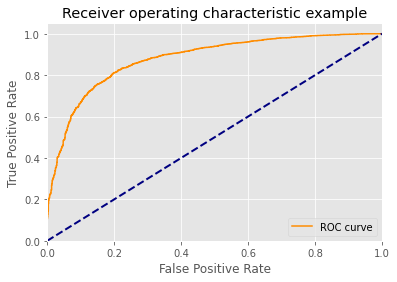

In [156]:
fpr, tpr, thresholds = roc_curve(y_train,y_pred_train[0:,1], pos_label=2)

def plot_roc(tpr,fpr):
    plt.figure()
    lw = 2
    plt.plot(fpr,tpr, color='darkorange', label='ROC curve')
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()
plot_roc(tpr,fpr)

* cut off is found to be around 0.25 - 0.4. Choosen k = 0.35 and anlysed the f1-score

In [157]:
y_pred_train = pd.Series(y_pred_train[:,0]).apply(lambda x: 1 if x > 0.35 else 2)

In [158]:
y_pred_val = pd.Series(y_pred_val[:,0]).apply(lambda x: 1 if x > 0.35 else 2)

In [159]:
# Used a customised function for getting reports
scores = get_metrics(y_train,y_pred_train,y_val,y_pred_val,"LogisticRegression_roc_AUC",scores)
scores


           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     0.6121    0.6091    0.6106      1215
           2     0.9065    0.9075    0.9070      5073

    accuracy                         0.8499      6288
   macro avg     0.7593    0.7583    0.7588      6288
weighted avg     0.8496    0.8499    0.8497      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.5780    0.5362    0.5563       304
           2     0.8908    0.9062    0.8984      1269

    accuracy                         0.8347      1573
   macro avg     0.7344    0.7212    0.7274      1573
weighted avg     0.8303    0.8347    0.8323      1573


               Confusion Matrix FOR TRAIN DATA
            
[[ 740  475]
 [ 469 4604]]

               Confusion matrix FOR VALIDATION DATA
            
[[ 163  141]
 [ 119 1150]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314


# Logistic regression liblinear

* Algorithm to use in the optimization problem For small datasets, 'liblinear' is a good choice

In [160]:
logreg = LogisticRegression(solver="liblinear")
logreg.fit(X_train_final, y_train)

LogisticRegression(solver='liblinear')

In [161]:
# predicting it on train and validation data
y_pred_train = logreg.predict(X_train_final)
y_pred_val = logreg.predict(X_val_final)

In [162]:
# Used a customised function for getting reports
scores = get_metrics(y_train,y_pred_train,y_val,y_pred_val,"LogisticRegression_liblinear",scores)
scores


           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     0.6896    0.4535    0.5472      1215
           2     0.8790    0.9511    0.9137      5073

    accuracy                         0.8550      6288
   macro avg     0.7843    0.7023    0.7304      6288
weighted avg     0.8424    0.8550    0.8428      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.6455    0.4013    0.4949       304
           2     0.8685    0.9472    0.9061      1269

    accuracy                         0.8417      1573
   macro avg     0.7570    0.6743    0.7005      1573
weighted avg     0.8254    0.8417    0.8267      1573


               Confusion Matrix FOR TRAIN DATA
            
[[ 551  664]
 [ 248 4825]]

               Confusion matrix FOR VALIDATION DATA
            
[[ 122  182]
 [  67 1202]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314
2,LogisticRegression_liblinear,0.854962,0.453498,0.689612,0.547170,0.841704,0.401316,0.645503,0.494929


# PCA for numeric and applying logistic model

* Applying PCA and building models on PCA data

In [163]:
pca = PCA()
X_train1 = pca.fit_transform(X_train_final)
pca.explained_variance_ratio_

array([2.16423354e-01, 1.40889200e-01, 1.26741230e-01, 9.31501933e-02,
       5.36375091e-02, 4.63901085e-02, 3.61359723e-02, 2.88449720e-02,
       2.34687081e-02, 2.33340558e-02, 1.87294212e-02, 1.84014758e-02,
       1.69665631e-02, 1.30740032e-02, 1.13696613e-02, 1.12820726e-02,
       9.56797581e-03, 8.51338988e-03, 7.54268771e-03, 7.35700748e-03,
       6.62835512e-03, 5.69316002e-03, 5.12461333e-03, 5.07001494e-03,
       4.96445067e-03, 4.86003493e-03, 4.30885936e-03, 3.62588468e-03,
       3.53954664e-03, 3.46062275e-03, 3.42217891e-03, 3.38255487e-03,
       3.23813715e-03, 3.18848679e-03, 3.13500915e-03, 3.03046226e-03,
       2.26000429e-03, 2.13704369e-03, 2.08990998e-03, 1.82573234e-03,
       1.73353892e-03, 1.48349953e-03, 1.18398849e-03, 1.13304180e-03,
       9.37933870e-04, 8.82594025e-04, 7.27647734e-04, 6.84655634e-04,
       5.99122931e-04, 5.78541430e-04, 5.04535142e-04, 4.70528755e-04,
       4.18458249e-04, 3.55965450e-04, 3.18796917e-04, 2.44900764e-04,
      

In [164]:
# get the pricncipal componet with 90% variation 
cumsum = np.cumsum(pca.explained_variance_ratio_)
dim = np.argmax(cumsum >= 0.90) + 1
print('The number of dimensions required to preserve 90% of variance is',dim)

The number of dimensions required to preserve 90% of variance is 19


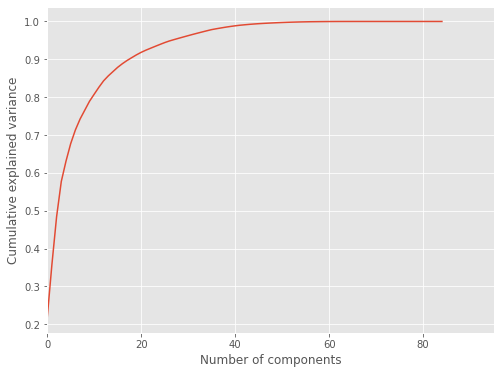

In [165]:
plt.figure(figsize=(8,6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlim(0,95,1)
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
plt.show()

In [166]:
# Get the No of component of 19 in both train and validation data and stored it in X_train_pca, X_val_pca
X_train_pca=X_train1[: ,0:19]
X_val_pca=pca.transform(X_val_final)[:,0:19]
print(X_train_pca.shape)
print(X_val_pca.shape)

(6288, 19)
(1573, 19)


#### logistic model with weight balanced, provide equal weightage for target variable and performing it on pca data

In [167]:
# Defining the model
log_mod_pca = LogisticRegression(solver="liblinear",class_weight='balanced')

# fitting it on train data
log_mod_pca.fit(X_train_pca, y_train)

# predicting it on train and validation data
y_pred_train = log_mod_pca.predict(X_train_pca)
y_pred_val = log_mod_pca.predict(X_val_pca)

# Used a customised function for getting reports
scores = get_metrics(y_train,y_pred_train,y_val,y_pred_val,"LogisticRegression_PCA",scores)
scores


           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     0.4471    0.7646    0.5642      1215
           2     0.9321    0.7735    0.8454      5073

    accuracy                         0.7718      6288
   macro avg     0.6896    0.7691    0.7048      6288
weighted avg     0.8384    0.7718    0.7911      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.4211    0.7105    0.5288       304
           2     0.9170    0.7660    0.8347      1269

    accuracy                         0.7552      1573
   macro avg     0.6690    0.7382    0.6817      1573
weighted avg     0.8211    0.7552    0.7756      1573


               Confusion Matrix FOR TRAIN DATA
            
[[ 929  286]
 [1149 3924]]

               Confusion matrix FOR VALIDATION DATA
            
[[216  88]
 [297 972]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314
2,LogisticRegression_liblinear,0.854962,0.453498,0.689612,0.547170,0.841704,0.401316,0.645503,0.494929
3,LogisticRegression_PCA,0.771788,0.764609,0.447064,0.564227,0.755245,0.710526,0.421053,0.528764


# GaussianNB model

* It's specifically used when the features have continuous values. It's also assumed that all the features are following a gaussian distribution i.e, normal distribution

In [168]:
nb_model = GaussianNB()
nb_model.fit(X_train_final,y_train)

GaussianNB()

In [169]:
# predicting it on train and validation data
y_pred_train = nb_model.predict(X_train_final)
y_pred_val = nb_model.predict(X_val_final)

# Used a customised function for getting reports
scores = get_metrics(y_train,y_pred_train,y_val,y_pred_val,"GaussianNB",scores)
scores


           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     0.2916    0.9128    0.4420      1215
           2     0.9573    0.4690    0.6295      5073

    accuracy                         0.5547      6288
   macro avg     0.6245    0.6909    0.5358      6288
weighted avg     0.8287    0.5547    0.5933      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.2887    0.9211    0.4396       304
           2     0.9602    0.4563    0.6186      1269

    accuracy                         0.5461      1573
   macro avg     0.6244    0.6887    0.5291      1573
weighted avg     0.8304    0.5461    0.5840      1573


               Confusion Matrix FOR TRAIN DATA
            
[[1109  106]
 [2694 2379]]

               Confusion matrix FOR VALIDATION DATA
            
[[280  24]
 [690 579]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314
2,LogisticRegression_liblinear,0.854962,0.453498,0.689612,0.547170,0.841704,0.401316,0.645503,0.494929
3,LogisticRegression_PCA,0.771788,0.764609,0.447064,0.564227,0.755245,0.710526,0.421053,0.528764
4,GaussianNB,0.554707,0.912757,0.291612,0.442009,0.546090,0.921053,0.288660,0.439560


# Ridge Regression

* L2 norm is applied if there is presence of multicollinearity. And also peanalises the coffecients of the model`

In [170]:
ridgereg = RidgeClassifier()
ridgereg.fit(X_train_final,y_train)

y_pred_train=ridgereg.predict(X_train_final)
y_pred_val = ridgereg.predict(X_val_final)


# Used a customised function for getting reports
scores = get_metrics(y_train,y_pred_train,y_val,y_pred_val,"ridgereg",scores)
scores



           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     0.6862    0.4428    0.5383      1215
           2     0.8770    0.9515    0.9127      5073

    accuracy                         0.8532      6288
   macro avg     0.7816    0.6972    0.7255      6288
weighted avg     0.8401    0.8532    0.8404      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.6573    0.3849    0.4855       304
           2     0.8659    0.9519    0.9069      1269

    accuracy                         0.8423      1573
   macro avg     0.7616    0.6684    0.6962      1573
weighted avg     0.8256    0.8423    0.8255      1573


               Confusion Matrix FOR TRAIN DATA
            
[[ 538  677]
 [ 246 4827]]

               Confusion matrix FOR VALIDATION DATA
            
[[ 117  187]
 [  61 1208]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314
2,LogisticRegression_liblinear,0.854962,0.453498,0.689612,0.547170,0.841704,0.401316,0.645503,0.494929
3,LogisticRegression_PCA,0.771788,0.764609,0.447064,0.564227,0.755245,0.710526,0.421053,0.528764
4,GaussianNB,0.554707,0.912757,0.291612,0.442009,0.546090,0.921053,0.288660,0.439560
5,ridgereg,0.853212,0.442798,0.686224,0.538269,0.842339,0.384868,0.657303,0.485477


# Ridge Classifier class weight balanced

* Similary ridge regression is applied on the weight balanced data

In [171]:
ridgereg = RidgeClassifier( class_weight='balanced')
ridgereg.fit(X_train_final,y_train)

y_pred_train=ridgereg.predict(X_train_final)
y_pred_test = ridgereg.predict(X_val_final)


# Used a customised function for getting reports
scores = get_metrics(y_train,y_pred_train,y_val,y_pred_val,"ridgereg_classweight",scores)
scores


           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     0.5215    0.7778    0.6244      1215
           2     0.9397    0.8291    0.8809      5073

    accuracy                         0.8192      6288
   macro avg     0.7306    0.8034    0.7527      6288
weighted avg     0.8589    0.8192    0.8314      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.6573    0.3849    0.4855       304
           2     0.8659    0.9519    0.9069      1269

    accuracy                         0.8423      1573
   macro avg     0.7616    0.6684    0.6962      1573
weighted avg     0.8256    0.8423    0.8255      1573


               Confusion Matrix FOR TRAIN DATA
            
[[ 945  270]
 [ 867 4206]]

               Confusion matrix FOR VALIDATION DATA
            
[[ 117  187]
 [  61 1208]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314
2,LogisticRegression_liblinear,0.854962,0.453498,0.689612,0.547170,0.841704,0.401316,0.645503,0.494929
3,LogisticRegression_PCA,0.771788,0.764609,0.447064,0.564227,0.755245,0.710526,0.421053,0.528764
4,GaussianNB,0.554707,0.912757,0.291612,0.442009,0.546090,0.921053,0.288660,0.439560
5,ridgereg,0.853212,0.442798,0.686224,0.538269,0.842339,0.384868,0.657303,0.485477
6,ridgereg_classweight,0.819179,0.777778,0.521523,0.624381,0.842339,0.384868,0.657303,0.485477


# Decision_Tree_classsifier

* Since none of the classification is not giving good result. base model of Desicion tree classification is applied

In [172]:
# Create Decision Tree classifer object
clf_dt = DecisionTreeClassifier(random_state=123)

# Train Decision Tree Classifer
clf_dt.fit(X_train_final,y_train)

y_pred_train = clf_dt.predict(X_train_final)
y_pred_val = clf_dt.predict(X_val_final)

scores = get_metrics(y_train,y_pred_train,y_val,y_pred_val,"DecisionTree",scores)
scores


           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     1.0000    1.0000    1.0000      1215
           2     1.0000    1.0000    1.0000      5073

    accuracy                         1.0000      6288
   macro avg     1.0000    1.0000    1.0000      6288
weighted avg     1.0000    1.0000    1.0000      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.4476    0.4638    0.4556       304
           2     0.8704    0.8629    0.8666      1269

    accuracy                         0.7858      1573
   macro avg     0.6590    0.6633    0.6611      1573
weighted avg     0.7887    0.7858    0.7872      1573


               Confusion Matrix FOR TRAIN DATA
            
[[1215    0]
 [   0 5073]]

               Confusion matrix FOR VALIDATION DATA
            
[[ 141  163]
 [ 174 1095]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314
2,LogisticRegression_liblinear,0.854962,0.453498,0.689612,0.547170,0.841704,0.401316,0.645503,0.494929
3,LogisticRegression_PCA,0.771788,0.764609,0.447064,0.564227,0.755245,0.710526,0.421053,0.528764
4,GaussianNB,0.554707,0.912757,0.291612,0.442009,0.546090,0.921053,0.288660,0.439560
5,ridgereg,0.853212,0.442798,0.686224,0.538269,0.842339,0.384868,0.657303,0.485477
6,ridgereg_classweight,0.819179,0.777778,0.521523,0.624381,0.842339,0.384868,0.657303,0.485477
7,DecisionTree,1.000000,1.000000,1.000000,1.000000,0.785760,0.463816,0.447619,0.455574


obsevation : Decision tree always tends to overfitting problem . and can be handled by cv. with parameter tuning

# Decision Tree with Grid-Search CV - Hyper-parameter Tuning

In [173]:
# set of parameters to test
param_grid = {"class_weight":['balanced', None],
              "criterion": ["gini", "entropy"],
              "max_depth": [3, 5, 6],
              "min_samples_leaf": [2, 5, 10],
               "max_leaf_nodes": [None, 5, 10, 20]
              }

In [174]:
dt = tree.DecisionTreeClassifier(random_state=123)
clf_dt_grid = GridSearchCV(dt, param_grid,cv=5,scoring='f1')
clf_dt_grid.fit(X_train_final, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=123),
             param_grid={'class_weight': ['balanced', None],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [3, 5, 6],
                         'max_leaf_nodes': [None, 5, 10, 20],
                         'min_samples_leaf': [2, 5, 10]},
             scoring='f1')

In [175]:
print(clf_dt_grid.best_params_)

y_pred_train = clf_dt_grid.predict(X_train_final)
y_pred_val = clf_dt_grid.predict(X_val_final)

scores = get_metrics(y_train,y_pred_train,y_val,y_pred_val,"DecisionTree_BestParameters",scores)
scores

{'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 6, 'max_leaf_nodes': 20, 'min_samples_leaf': 2}

           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     0.4517    0.8807    0.5971      1215
           2     0.9630    0.7439    0.8394      5073

    accuracy                         0.7704      6288
   macro avg     0.7073    0.8123    0.7183      6288
weighted avg     0.8642    0.7704    0.7926      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.3825    0.7763    0.5125       304
           2     0.9289    0.6998    0.7982      1269

    accuracy                         0.7146      1573
   macro avg     0.6557    0.7380    0.6553      1573
weighted avg     0.8233    0.7146    0.7430      1573


               Confusion Matrix FOR TRAIN DATA
            
[[1070  145]
 [1299 3774]]

              

,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314
2,LogisticRegression_liblinear,0.854962,0.453498,0.689612,0.547170,0.841704,0.401316,0.645503,0.494929
3,LogisticRegression_PCA,0.771788,0.764609,0.447064,0.564227,0.755245,0.710526,0.421053,0.528764
4,GaussianNB,0.554707,0.912757,0.291612,0.442009,0.546090,0.921053,0.288660,0.439560
5,ridgereg,0.853212,0.442798,0.686224,0.538269,0.842339,0.384868,0.657303,0.485477
6,ridgereg_classweight,0.819179,0.777778,0.521523,0.624381,0.842339,0.384868,0.657303,0.485477
7,DecisionTree,1.000000,1.000000,1.000000,1.000000,0.785760,0.463816,0.447619,0.455574
8,DecisionTree_BestParameters,0.770356,0.880658,0.451667,0.597098,0.714558,0.776316,0.382496,0.512486


# Decision Tree with weight balanced and ccp_alpha_tuning

* also ccp-alpha is found out to avoid overfitting on Decision-tree model

In [176]:
dtc_imb = DecisionTreeClassifier(class_weight = 'balanced')

# Train Decision Tree Classifer
dtc_imb.fit(X_train_final,y_train)

y_pred_train = dtc_imb.predict(X_train_final)
y_pred_val = dtc_imb.predict(X_val_final)


In [177]:
path = dtc_imb.cost_complexity_pruning_path(X_train_final, y_train)
alphas = path["ccp_alphas"]
alphas

array([0.00000000e+00, 6.56548211e-20, 1.09424702e-19, 1.09424702e-19,
       1.09424702e-19, 1.37064571e-19, 1.37064571e-19, 1.37064571e-19,
       1.82752761e-19, 1.82752761e-19, 1.82752761e-19, 1.82752761e-19,
       1.82752761e-19, 1.82752761e-19, 1.82752761e-19, 1.82752761e-19,
       1.82752761e-19, 1.82752761e-19, 1.82752761e-19, 1.82752761e-19,
       1.82752761e-19, 1.82752761e-19, 1.82752761e-19, 1.82752761e-19,
       1.82752761e-19, 1.82752761e-19, 1.82752761e-19, 1.82752761e-19,
       2.18849404e-19, 2.40734344e-19, 2.74129142e-19, 2.74129142e-19,
       3.28274105e-19, 3.65505523e-19, 3.65505523e-19, 3.65505523e-19,
       3.65505523e-19, 3.65505523e-19, 3.65505523e-19, 3.65505523e-19,
       3.93928927e-19, 4.11193713e-19, 4.11193713e-19, 4.11193713e-19,
       4.11193713e-19, 4.11193713e-19, 4.11193713e-19, 4.11193713e-19,
       4.11193713e-19, 5.48258284e-19, 6.85322855e-19, 6.85322855e-19,
       6.85322855e-19, 6.85322855e-19, 6.85322855e-19, 6.85322855e-19,
      

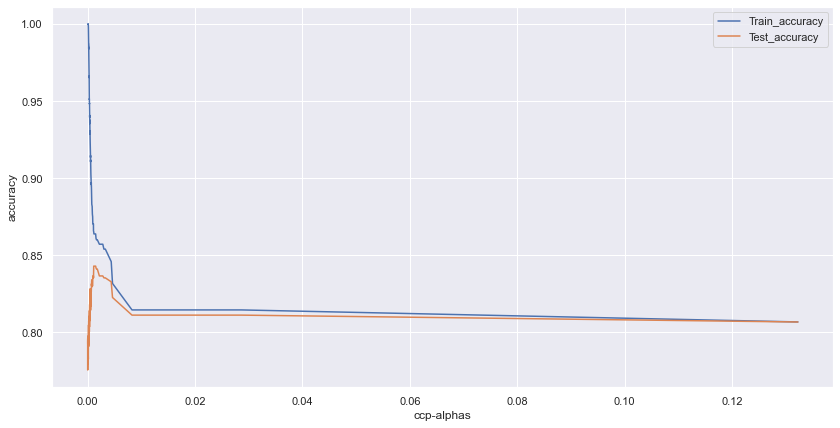

In [178]:
accuracy_train, accuracy_test =  [], []

for i in alphas:
    tree = DecisionTreeClassifier(ccp_alpha = i)
    tree.fit(X_train_final, y_train)
    y_train_pred = tree.predict(X_train_final)
    y_test_pred = tree.predict(X_val_final)
    
    accuracy_train.append(accuracy_score(y_train, y_train_pred))
    accuracy_test.append(accuracy_score(y_val, y_test_pred))
    
sns.set()
plt.figure(figsize=(14,7))
sns.lineplot(y = accuracy_train, x = alphas, label = "Train_accuracy")
sns.lineplot(y = accuracy_test, x = alphas, label = "Test_accuracy")
plt.xlabel("ccp-alphas")
plt.ylabel("accuracy")
plt.show()

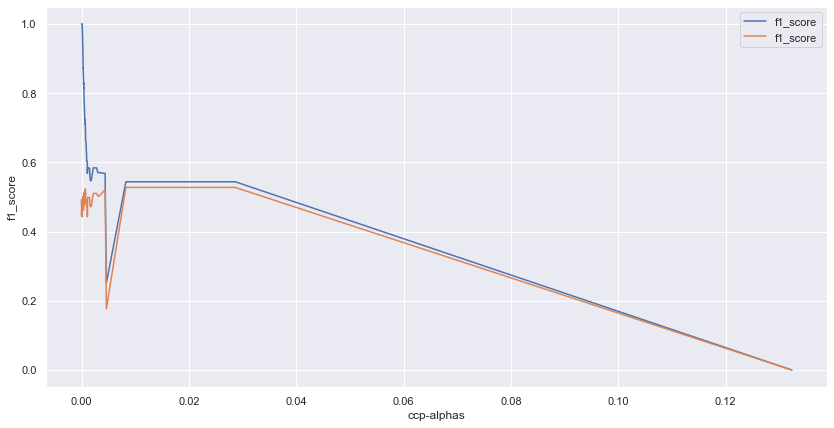

In [179]:
train_f1, test_f1 =  [], []

for i in alphas:
    tree = DecisionTreeClassifier(ccp_alpha = i)
    tree.fit(X_train_final, y_train)
    y_train_pred = tree.predict(X_train_final)
    y_test_pred = tree.predict(X_val_final)
    
    train_f1.append(f1_score(y_train, y_train_pred))
    test_f1.append(f1_score(y_val, y_test_pred))
    
sns.set()
plt.figure(figsize=(14,7))
sns.lineplot(y = train_f1, x = alphas, label = "f1_score")
sns.lineplot(y = test_f1, x = alphas, label = "f1_score")
plt.xlabel("ccp-alphas")
plt.ylabel("f1_score")
plt.show()

observation : from both the plots ccp-alpha is find out and iis applied with best-parameters

# Model with best parameter and ccp-alpa

In [299]:
class_weight = {1:1, 2:0.4}

# params = {'criterion': 'entropy','max_depth': 5,'max_leaf_nodes': 10,'min_samples_leaf': 2}
dtc_imb = DecisionTreeClassifier(class_weight =class_weight,max_depth= 5, ccp_alpha = 0.008, criterion = 'entropy',
                                max_leaf_nodes =10, min_samples_leaf = 2)

# Train Decision Tree Classifer
dtc_imb.fit(X_train_final,y_train)

y_pred_train = dtc_imb.predict(X_train_final)
y_pred_val = dtc_imb.predict(X_val_final)


scores = get_metrics(y_train,y_pred_train,y_val,y_pred_val,"DecisionTree_best_parameter_ccpalpha",scores)
scores


           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     0.5073    0.7679    0.6110      1215
           2     0.9366    0.8214    0.8752      5073

    accuracy                         0.8111      6288
   macro avg     0.7220    0.7947    0.7431      6288
weighted avg     0.8537    0.8111    0.8242      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.4426    0.6974    0.5415       304
           2     0.9159    0.7896    0.8481      1269

    accuracy                         0.7718      1573
   macro avg     0.6792    0.7435    0.6948      1573
weighted avg     0.8244    0.7718    0.7888      1573


               Confusion Matrix FOR TRAIN DATA
            
[[ 933  282]
 [ 906 4167]]

               Confusion matrix FOR VALIDATION DATA
            
[[ 212   92]
 [ 267 1002]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314
2,LogisticRegression_liblinear,0.854962,0.453498,0.689612,0.547170,0.841704,0.401316,0.645503,0.494929
3,LogisticRegression_PCA,0.771788,0.764609,0.447064,0.564227,0.755245,0.710526,0.421053,0.528764
4,GaussianNB,0.554707,0.912757,0.291612,0.442009,0.546090,0.921053,0.288660,0.439560
5,ridgereg,0.853212,0.442798,0.686224,0.538269,0.842339,0.384868,0.657303,0.485477
6,ridgereg_classweight,0.819179,0.777778,0.521523,0.624381,0.842339,0.384868,0.657303,0.485477
7,DecisionTree,1.000000,1.000000,1.000000,1.000000,0.785760,0.463816,0.447619,0.455574
8,DecisionTree_BestParameters,0.770356,0.880658,0.451667,0.597098,0.714558,0.776316,0.382496,0.512486
9,DecisionTree_best_parameter_ccpalpha,0.811069,0.767901,0.507341,0.611002,0.771774,0.697368,0.442589,0.541507


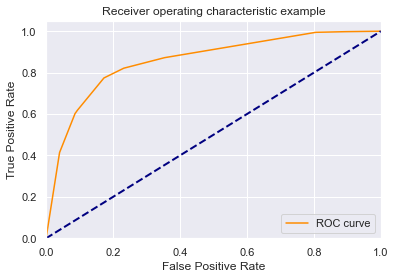

In [181]:
y_pred_train = dtc_imb.predict_proba(X_train_final)
y_pred_val = dtc_imb.predict_proba(X_val_final)
fpr, tpr, thresholds = roc_curve(y_train,y_pred_train[0:,1], pos_label=2)
plot_roc(tpr,fpr)

In [182]:
y_pred_train = pd.Series(y_pred_train[:,0]).apply(lambda x: 1 if x > 0.28 else 2)
y_pred_val = pd.Series(y_pred_val[:,0]).apply(lambda x: 1 if x > 0.28 else 2)

scores = get_metrics(y_train,y_pred_train,y_val,y_pred_val,"DecisionTree_best_parameter_ccpalpha_roc",scores)
scores


           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     0.4674    0.8272    0.5973      1215
           2     0.9493    0.7743    0.8529      5073

    accuracy                         0.7845      6288
   macro avg     0.7083    0.8007    0.7251      6288
weighted avg     0.8562    0.7845    0.8035      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.3909    0.7368    0.5108       304
           2     0.9200    0.7250    0.8109      1269

    accuracy                         0.7273      1573
   macro avg     0.6555    0.7309    0.6609      1573
weighted avg     0.8178    0.7273    0.7529      1573


               Confusion Matrix FOR TRAIN DATA
            
[[1005  210]
 [1145 3928]]

               Confusion matrix FOR VALIDATION DATA
            
[[224  80]
 [349 920]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314
2,LogisticRegression_liblinear,0.854962,0.453498,0.689612,0.547170,0.841704,0.401316,0.645503,0.494929
3,LogisticRegression_PCA,0.771788,0.764609,0.447064,0.564227,0.755245,0.710526,0.421053,0.528764
4,GaussianNB,0.554707,0.912757,0.291612,0.442009,0.546090,0.921053,0.288660,0.439560
5,ridgereg,0.853212,0.442798,0.686224,0.538269,0.842339,0.384868,0.657303,0.485477
6,ridgereg_classweight,0.819179,0.777778,0.521523,0.624381,0.842339,0.384868,0.657303,0.485477
7,DecisionTree,1.000000,1.000000,1.000000,1.000000,0.785760,0.463816,0.447619,0.455574
8,DecisionTree_BestParameters,0.770356,0.880658,0.451667,0.597098,0.714558,0.776316,0.382496,0.512486
9,DecisionTree_best_parameter_ccpalpha,0.811069,0.767901,0.507341,0.611002,0.771774,0.697368,0.442589,0.541507


observation : Even with Desicion tree classier not able to find the best f1-score. So moving forward with bag of models approach

### Random forest classifier

* Base random forest classifier is applied

In [183]:
rfc = RandomForestClassifier(random_state = 1)
rfc.fit(X_train_final,y_train)
y_pred_train=rfc.predict(X_train_final)
y_pred_val = rfc.predict(X_val_final)

scores = get_metrics(y_train,y_pred_train,y_val,y_pred_val,"randomforestclassifer",scores)
scores


           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     1.0000    1.0000    1.0000      1215
           2     1.0000    1.0000    1.0000      5073

    accuracy                         1.0000      6288
   macro avg     1.0000    1.0000    1.0000      6288
weighted avg     1.0000    1.0000    1.0000      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.6837    0.4836    0.5665       304
           2     0.8844    0.9464    0.9144      1269

    accuracy                         0.8570      1573
   macro avg     0.7841    0.7150    0.7404      1573
weighted avg     0.8456    0.8570    0.8471      1573


               Confusion Matrix FOR TRAIN DATA
            
[[1215    0]
 [   0 5073]]

               Confusion matrix FOR VALIDATION DATA
            
[[ 147  157]
 [  68 1201]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314
2,LogisticRegression_liblinear,0.854962,0.453498,0.689612,0.547170,0.841704,0.401316,0.645503,0.494929
3,LogisticRegression_PCA,0.771788,0.764609,0.447064,0.564227,0.755245,0.710526,0.421053,0.528764
4,GaussianNB,0.554707,0.912757,0.291612,0.442009,0.546090,0.921053,0.288660,0.439560
5,ridgereg,0.853212,0.442798,0.686224,0.538269,0.842339,0.384868,0.657303,0.485477
6,ridgereg_classweight,0.819179,0.777778,0.521523,0.624381,0.842339,0.384868,0.657303,0.485477
7,DecisionTree,1.000000,1.000000,1.000000,1.000000,0.785760,0.463816,0.447619,0.455574
8,DecisionTree_BestParameters,0.770356,0.880658,0.451667,0.597098,0.714558,0.776316,0.382496,0.512486
9,DecisionTree_best_parameter_ccpalpha,0.811069,0.767901,0.507341,0.611002,0.771774,0.697368,0.442589,0.541507


# Random_forest_ weight balanced

In [184]:

rfc_cw = RandomForestClassifier(min_samples_leaf=0.05,random_state = 1,class_weight =  "balanced_subsample")
rfc_cw.fit(X_train_final,y_train)
y_pred_train=rfc_cw.predict(X_train_final)
y_pred_val = rfc_cw.predict(X_val_final)


scores = get_metrics(y_train,y_pred_train,y_val,y_pred_val,"Random_forest_ weight balanced",scores)
scores


           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     0.4546    0.8165    0.5840      1215
           2     0.9457    0.7654    0.8461      5073

    accuracy                         0.7753      6288
   macro avg     0.7002    0.7909    0.7151      6288
weighted avg     0.8508    0.7753    0.7954      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.4132    0.7599    0.5353       304
           2     0.9280    0.7415    0.8244      1269

    accuracy                         0.7451      1573
   macro avg     0.6706    0.7507    0.6798      1573
weighted avg     0.8285    0.7451    0.7685      1573


               Confusion Matrix FOR TRAIN DATA
            
[[ 992  223]
 [1190 3883]]

               Confusion matrix FOR VALIDATION DATA
            
[[231  73]
 [328 941]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314
2,LogisticRegression_liblinear,0.854962,0.453498,0.689612,0.547170,0.841704,0.401316,0.645503,0.494929
3,LogisticRegression_PCA,0.771788,0.764609,0.447064,0.564227,0.755245,0.710526,0.421053,0.528764
4,GaussianNB,0.554707,0.912757,0.291612,0.442009,0.546090,0.921053,0.288660,0.439560
5,ridgereg,0.853212,0.442798,0.686224,0.538269,0.842339,0.384868,0.657303,0.485477
6,ridgereg_classweight,0.819179,0.777778,0.521523,0.624381,0.842339,0.384868,0.657303,0.485477
7,DecisionTree,1.000000,1.000000,1.000000,1.000000,0.785760,0.463816,0.447619,0.455574
8,DecisionTree_BestParameters,0.770356,0.880658,0.451667,0.597098,0.714558,0.776316,0.382496,0.512486
9,DecisionTree_best_parameter_ccpalpha,0.811069,0.767901,0.507341,0.611002,0.771774,0.697368,0.442589,0.541507


### Random forest classifier gridsearch

* grid search with cv is applied on randomforest classiers

In [185]:
param_grid = {"n_estimators" : [50, 100],
              "max_depth" : [1,5],
              "max_features" : [3, 5],
              "min_samples_leaf" : [1, 2, 4]}

In [186]:
clf3 = RandomForestClassifier(class_weight =  "balanced_subsample")
clf_grid = GridSearchCV(clf3, param_grid, cv=2)

In [187]:
clf_grid.fit(X_train_final,y_train)
y_pred_train=clf_grid.predict(X_train_final)
y_pred_val = clf_grid.predict(X_val_final)


scores = get_metrics(y_train,y_pred_train,y_val,y_pred_val,"randomforestclassifer_gridsearch",scores)
scores


           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     0.5010    0.8247    0.6233      1215
           2     0.9503    0.8033    0.8706      5073

    accuracy                         0.8074      6288
   macro avg     0.7257    0.8140    0.7470      6288
weighted avg     0.8635    0.8074    0.8228      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.4429    0.7138    0.5466       304
           2     0.9197    0.7849    0.8469      1269

    accuracy                         0.7711      1573
   macro avg     0.6813    0.7493    0.6968      1573
weighted avg     0.8275    0.7711    0.7889      1573


               Confusion Matrix FOR TRAIN DATA
            
[[1002  213]
 [ 998 4075]]

               Confusion matrix FOR VALIDATION DATA
            
[[217  87]
 [273 996]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314
2,LogisticRegression_liblinear,0.854962,0.453498,0.689612,0.547170,0.841704,0.401316,0.645503,0.494929
3,LogisticRegression_PCA,0.771788,0.764609,0.447064,0.564227,0.755245,0.710526,0.421053,0.528764
4,GaussianNB,0.554707,0.912757,0.291612,0.442009,0.546090,0.921053,0.288660,0.439560
5,ridgereg,0.853212,0.442798,0.686224,0.538269,0.842339,0.384868,0.657303,0.485477
6,ridgereg_classweight,0.819179,0.777778,0.521523,0.624381,0.842339,0.384868,0.657303,0.485477
7,DecisionTree,1.000000,1.000000,1.000000,1.000000,0.785760,0.463816,0.447619,0.455574
8,DecisionTree_BestParameters,0.770356,0.880658,0.451667,0.597098,0.714558,0.776316,0.382496,0.512486
9,DecisionTree_best_parameter_ccpalpha,0.811069,0.767901,0.507341,0.611002,0.771774,0.697368,0.442589,0.541507


# Support vector machine classfier

* By look at the target and assuming there is a class imbalance problem used SVM is applied with low slack

In [188]:
linear_svm = SVC(kernel='linear', C=1)

In [189]:
linear_svm.fit(X=X_train_final, y= y_train)
y_pred_train = linear_svm.predict(X_train_final)
y_pred_val = linear_svm.predict(X_val_final)

In [190]:
scores = get_metrics(y_train,y_pred_train,y_val,y_pred_val,"svc_linear",scores)
scores


           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     0.6908    0.4560    0.5493      1215
           2     0.8795    0.9511    0.9139      5073

    accuracy                         0.8554      6288
   macro avg     0.7851    0.7035    0.7316      6288
weighted avg     0.8430    0.8554    0.8435      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.6344    0.3882    0.4816       304
           2     0.8659    0.9464    0.9044      1269

    accuracy                         0.8385      1573
   macro avg     0.7502    0.6673    0.6930      1573
weighted avg     0.8212    0.8385    0.8227      1573


               Confusion Matrix FOR TRAIN DATA
            
[[ 554  661]
 [ 248 4825]]

               Confusion matrix FOR VALIDATION DATA
            
[[ 118  186]
 [  68 1201]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314
2,LogisticRegression_liblinear,0.854962,0.453498,0.689612,0.547170,0.841704,0.401316,0.645503,0.494929
3,LogisticRegression_PCA,0.771788,0.764609,0.447064,0.564227,0.755245,0.710526,0.421053,0.528764
4,GaussianNB,0.554707,0.912757,0.291612,0.442009,0.546090,0.921053,0.288660,0.439560
5,ridgereg,0.853212,0.442798,0.686224,0.538269,0.842339,0.384868,0.657303,0.485477
6,ridgereg_classweight,0.819179,0.777778,0.521523,0.624381,0.842339,0.384868,0.657303,0.485477
7,DecisionTree,1.000000,1.000000,1.000000,1.000000,0.785760,0.463816,0.447619,0.455574
8,DecisionTree_BestParameters,0.770356,0.880658,0.451667,0.597098,0.714558,0.776316,0.382496,0.512486
9,DecisionTree_best_parameter_ccpalpha,0.811069,0.767901,0.507341,0.611002,0.771774,0.697368,0.442589,0.541507


# Support vector machine rbf

* By look at the target and assuming there is a class imbalance problem used SVM is applied with high slack and radial based kernal is used

In [191]:
svc = SVC(kernel='rbf', gamma=0.01, C=10, class_weight = "balanced")


In [192]:
svc.fit(X=X_train_final, y= y_train)
y_pred_train = svc.predict(X_train_final)
y_pred_val = svc.predict(X_val_final)

In [193]:
scores = get_metrics(y_train,y_pred_train,y_val,y_pred_val,"svc_rbf",scores)
scores


           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     0.6033    0.8963    0.7212      1215
           2     0.9719    0.8589    0.9119      5073

    accuracy                         0.8661      6288
   macro avg     0.7876    0.8776    0.8165      6288
weighted avg     0.9007    0.8661    0.8750      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.4702    0.7007    0.5627       304
           2     0.9187    0.8109    0.8614      1269

    accuracy                         0.7896      1573
   macro avg     0.6945    0.7558    0.7121      1573
weighted avg     0.8321    0.7896    0.8037      1573


               Confusion Matrix FOR TRAIN DATA
            
[[1089  126]
 [ 716 4357]]

               Confusion matrix FOR VALIDATION DATA
            
[[ 213   91]
 [ 240 1029]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314
2,LogisticRegression_liblinear,0.854962,0.453498,0.689612,0.547170,0.841704,0.401316,0.645503,0.494929
3,LogisticRegression_PCA,0.771788,0.764609,0.447064,0.564227,0.755245,0.710526,0.421053,0.528764
4,GaussianNB,0.554707,0.912757,0.291612,0.442009,0.546090,0.921053,0.288660,0.439560
5,ridgereg,0.853212,0.442798,0.686224,0.538269,0.842339,0.384868,0.657303,0.485477
6,ridgereg_classweight,0.819179,0.777778,0.521523,0.624381,0.842339,0.384868,0.657303,0.485477
7,DecisionTree,1.000000,1.000000,1.000000,1.000000,0.785760,0.463816,0.447619,0.455574
8,DecisionTree_BestParameters,0.770356,0.880658,0.451667,0.597098,0.714558,0.776316,0.382496,0.512486
9,DecisionTree_best_parameter_ccpalpha,0.811069,0.767901,0.507341,0.611002,0.771774,0.697368,0.442589,0.541507


### SVC poly

In [194]:
class_weight = {1:1, 2:0.5}
svc = SVC(kernel='poly', gamma=0.01, C=10, class_weight = class_weight)
svc.fit(X=X_train_final, y= y_train)
y_pred_train = svc.predict(X_train_final)
y_pred_val = svc.predict(X_val_final)
scores = get_metrics(y_train,y_pred_train,y_val,y_pred_val,"svc_poly",scores)
scores


           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     0.6802    0.7021    0.6910      1215
           2     0.9281    0.9210    0.9245      5073

    accuracy                         0.8787      6288
   macro avg     0.8042    0.8115    0.8077      6288
weighted avg     0.8802    0.8787    0.8794      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.6136    0.5954    0.6043       304
           2     0.9038    0.9102    0.9069      1269

    accuracy                         0.8493      1573
   macro avg     0.7587    0.7528    0.7556      1573
weighted avg     0.8477    0.8493    0.8485      1573


               Confusion Matrix FOR TRAIN DATA
            
[[ 853  362]
 [ 401 4672]]

               Confusion matrix FOR VALIDATION DATA
            
[[ 181  123]
 [ 114 1155]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314
2,LogisticRegression_liblinear,0.854962,0.453498,0.689612,0.547170,0.841704,0.401316,0.645503,0.494929
3,LogisticRegression_PCA,0.771788,0.764609,0.447064,0.564227,0.755245,0.710526,0.421053,0.528764
4,GaussianNB,0.554707,0.912757,0.291612,0.442009,0.546090,0.921053,0.288660,0.439560
5,ridgereg,0.853212,0.442798,0.686224,0.538269,0.842339,0.384868,0.657303,0.485477
6,ridgereg_classweight,0.819179,0.777778,0.521523,0.624381,0.842339,0.384868,0.657303,0.485477
7,DecisionTree,1.000000,1.000000,1.000000,1.000000,0.785760,0.463816,0.447619,0.455574
8,DecisionTree_BestParameters,0.770356,0.880658,0.451667,0.597098,0.714558,0.776316,0.382496,0.512486
9,DecisionTree_best_parameter_ccpalpha,0.811069,0.767901,0.507341,0.611002,0.771774,0.697368,0.442589,0.541507


### Smote and run the model again

* Since assumption is on imbalced dataset. used smotting technique

In [195]:
smote = SMOTE(random_state=123)

In [196]:
X_train_sm, y_train_sm = smote.fit_sample(X_train_final, y_train)

In [197]:
np.unique(y_train, return_counts= True)

(array([1, 2], dtype=int64), array([1215, 5073], dtype=int64))

In [198]:
np.unique(y_train_sm, return_counts= True)

(array([1, 2], dtype=int64), array([5073, 5073], dtype=int64))

In [199]:
clf2 = RandomForestClassifier()

In [200]:
clf2.fit(X_train_sm, y_train_sm)
y_pred_train = clf2.predict(X_train_sm)
y_pred_test = clf2.predict(X_val_final)

scores = get_metrics(y_train_sm,y_pred_train,y_val,y_pred_val,"base_RandomForest_smote",scores)
scores


           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     1.0000    1.0000    1.0000      5073
           2     1.0000    1.0000    1.0000      5073

    accuracy                         1.0000     10146
   macro avg     1.0000    1.0000    1.0000     10146
weighted avg     1.0000    1.0000    1.0000     10146


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.6136    0.5954    0.6043       304
           2     0.9038    0.9102    0.9069      1269

    accuracy                         0.8493      1573
   macro avg     0.7587    0.7528    0.7556      1573
weighted avg     0.8477    0.8493    0.8485      1573


               Confusion Matrix FOR TRAIN DATA
            
[[5073    0]
 [   0 5073]]

               Confusion matrix FOR VALIDATION DATA
            
[[ 181  123]
 [ 114 1155]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314
2,LogisticRegression_liblinear,0.854962,0.453498,0.689612,0.547170,0.841704,0.401316,0.645503,0.494929
3,LogisticRegression_PCA,0.771788,0.764609,0.447064,0.564227,0.755245,0.710526,0.421053,0.528764
4,GaussianNB,0.554707,0.912757,0.291612,0.442009,0.546090,0.921053,0.288660,0.439560
5,ridgereg,0.853212,0.442798,0.686224,0.538269,0.842339,0.384868,0.657303,0.485477
6,ridgereg_classweight,0.819179,0.777778,0.521523,0.624381,0.842339,0.384868,0.657303,0.485477
7,DecisionTree,1.000000,1.000000,1.000000,1.000000,0.785760,0.463816,0.447619,0.455574
8,DecisionTree_BestParameters,0.770356,0.880658,0.451667,0.597098,0.714558,0.776316,0.382496,0.512486
9,DecisionTree_best_parameter_ccpalpha,0.811069,0.767901,0.507341,0.611002,0.771774,0.697368,0.442589,0.541507


## XGBoost classifier

* Gradient boosting and the variets of it is used for large data sets. But since none of the model is giving good f1 score gradient base boosting is applied

In [201]:
xgb_base = XGBClassifier()

In [202]:
xgb_base.fit(X_train_final,y_train)
y_pred_train = xgb_base.predict(X_train_final)
y_pred_test = xgb_base.predict(X_val_final)

scores = get_metrics(y_pred_train,y_pred_train,y_val,y_pred_val,"XGBoost_basic",scores)
scores


           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     1.0000    1.0000    1.0000      1210
           2     1.0000    1.0000    1.0000      5078

    accuracy                         1.0000      6288
   macro avg     1.0000    1.0000    1.0000      6288
weighted avg     1.0000    1.0000    1.0000      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.6136    0.5954    0.6043       304
           2     0.9038    0.9102    0.9069      1269

    accuracy                         0.8493      1573
   macro avg     0.7587    0.7528    0.7556      1573
weighted avg     0.8477    0.8493    0.8485      1573


               Confusion Matrix FOR TRAIN DATA
            
[[1210    0]
 [   0 5078]]

               Confusion matrix FOR VALIDATION DATA
            
[[ 181  123]
 [ 114 1155]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314
2,LogisticRegression_liblinear,0.854962,0.453498,0.689612,0.547170,0.841704,0.401316,0.645503,0.494929
3,LogisticRegression_PCA,0.771788,0.764609,0.447064,0.564227,0.755245,0.710526,0.421053,0.528764
4,GaussianNB,0.554707,0.912757,0.291612,0.442009,0.546090,0.921053,0.288660,0.439560
5,ridgereg,0.853212,0.442798,0.686224,0.538269,0.842339,0.384868,0.657303,0.485477
6,ridgereg_classweight,0.819179,0.777778,0.521523,0.624381,0.842339,0.384868,0.657303,0.485477
7,DecisionTree,1.000000,1.000000,1.000000,1.000000,0.785760,0.463816,0.447619,0.455574
8,DecisionTree_BestParameters,0.770356,0.880658,0.451667,0.597098,0.714558,0.776316,0.382496,0.512486
9,DecisionTree_best_parameter_ccpalpha,0.811069,0.767901,0.507341,0.611002,0.771774,0.697368,0.442589,0.541507


## XGBoost cross validation

In [203]:
parameters = {'objective':['binary:logistic'],
              'learning_rate': [.03,0.05,0.01,0.09,0.1], #so called `eta` value
              'max_depth': [2,5,6],
              'subsample': [0.7,0.5],
              'colsample_bytree': [0.6,0.5],
              'n_estimators': [50,100],
               'lambda':[0.01,0.1]}

In [204]:
xgb_cv = GridSearchCV(xgb_base, param_grid = parameters,cv = 3)
xgb_cv.fit(X_train_final, y_train)
xgb_cv_saved = xgb_cv.best_estimator_

In [205]:
y_pred_train=xgb_cv_saved.predict(X_train_final)
y_pred_test = xgb_cv_saved.predict(X_val_final)

scores = get_metrics(y_pred_train,y_pred_train,y_val,y_pred_val,"XGBoost_cv_paramgrid",scores)
scores


           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     1.0000    1.0000    1.0000       924
           2     1.0000    1.0000    1.0000      5364

    accuracy                         1.0000      6288
   macro avg     1.0000    1.0000    1.0000      6288
weighted avg     1.0000    1.0000    1.0000      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.6136    0.5954    0.6043       304
           2     0.9038    0.9102    0.9069      1269

    accuracy                         0.8493      1573
   macro avg     0.7587    0.7528    0.7556      1573
weighted avg     0.8477    0.8493    0.8485      1573


               Confusion Matrix FOR TRAIN DATA
            
[[ 924    0]
 [   0 5364]]

               Confusion matrix FOR VALIDATION DATA
            
[[ 181  123]
 [ 114 1155]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314
2,LogisticRegression_liblinear,0.854962,0.453498,0.689612,0.547170,0.841704,0.401316,0.645503,0.494929
3,LogisticRegression_PCA,0.771788,0.764609,0.447064,0.564227,0.755245,0.710526,0.421053,0.528764
4,GaussianNB,0.554707,0.912757,0.291612,0.442009,0.546090,0.921053,0.288660,0.439560
5,ridgereg,0.853212,0.442798,0.686224,0.538269,0.842339,0.384868,0.657303,0.485477
6,ridgereg_classweight,0.819179,0.777778,0.521523,0.624381,0.842339,0.384868,0.657303,0.485477
7,DecisionTree,1.000000,1.000000,1.000000,1.000000,0.785760,0.463816,0.447619,0.455574
8,DecisionTree_BestParameters,0.770356,0.880658,0.451667,0.597098,0.714558,0.776316,0.382496,0.512486
9,DecisionTree_best_parameter_ccpalpha,0.811069,0.767901,0.507341,0.611002,0.771774,0.697368,0.442589,0.541507


## PCA conversion of highly correlateddata

* Let s look at the numeric data and their relationships

In [206]:
# Slecting numeric attributes/ columns using select_dtypes function 
num_attr=X_train.select_dtypes(['int64' , 'float64']).columns
print(X_train[num_attr].shape)
num_attr

# cat_less_cardinal_columns = ['Month', 'DayOfWeek','TimeZone', 'DayofMonth_bin',
#                                'newScheduledArrTime_hour_bin', 'newScheduledDepTime_hour_bin',
#                                'totalScheduledArrTimeMinute_bin', 'totalScheduledDepTimeMinute_bin']

# cat_more_cardinal_columns = ['AirportID', 'Origin', 'Destination', 'WeatherStationID']


(6288, 39)


Index(['Month', 'ScheduledTravelTime', 'Distance', 'Visibilitymin',
       'Visibilitysum', 'Visibilitymean', 'DBTmin', 'DBTmax', 'DBTsum',
       'DBTmean', 'DewPointTempmin', 'DewPointTempmax', 'DewPointTempsum',
       'DewPointTempmean', 'RelativeHumidityPercentmin',
       'RelativeHumidityPercentmax', 'RelativeHumidityPercentsum',
       'RelativeHumidityPercentmean', 'WindSpeedmin', 'WindSpeedmax',
       'WindSpeedsum', 'WindSpeedmean', 'WindDirectionmin', 'WindDirectionmax',
       'WindDirectionsum', 'WindDirectionmean', 'WindGustValuemax',
       'WindGustValuesum', 'WindGustValuemean', 'StationPressuremin',
       'StationPressuremax', 'StationPressuresum', 'StationPressuremean',
       'GroundHeight', 'StationHeight', 'BarometerHeight', 'Latitude',
       'Longitude', 'WeatherStationID'],
      dtype='object')

In [207]:
non_pca = ["Distance", 'GroundHeight', 'StationHeight', 'BarometerHeight', 'Latitude', 'Longitude']
num_attr_pca = num_attr.difference(non_pca)
print(num_attr_pca.shape)

(33,)


In [208]:
corr_num_attr_pca = np.round(X_train[num_attr_pca].corr(), 2)

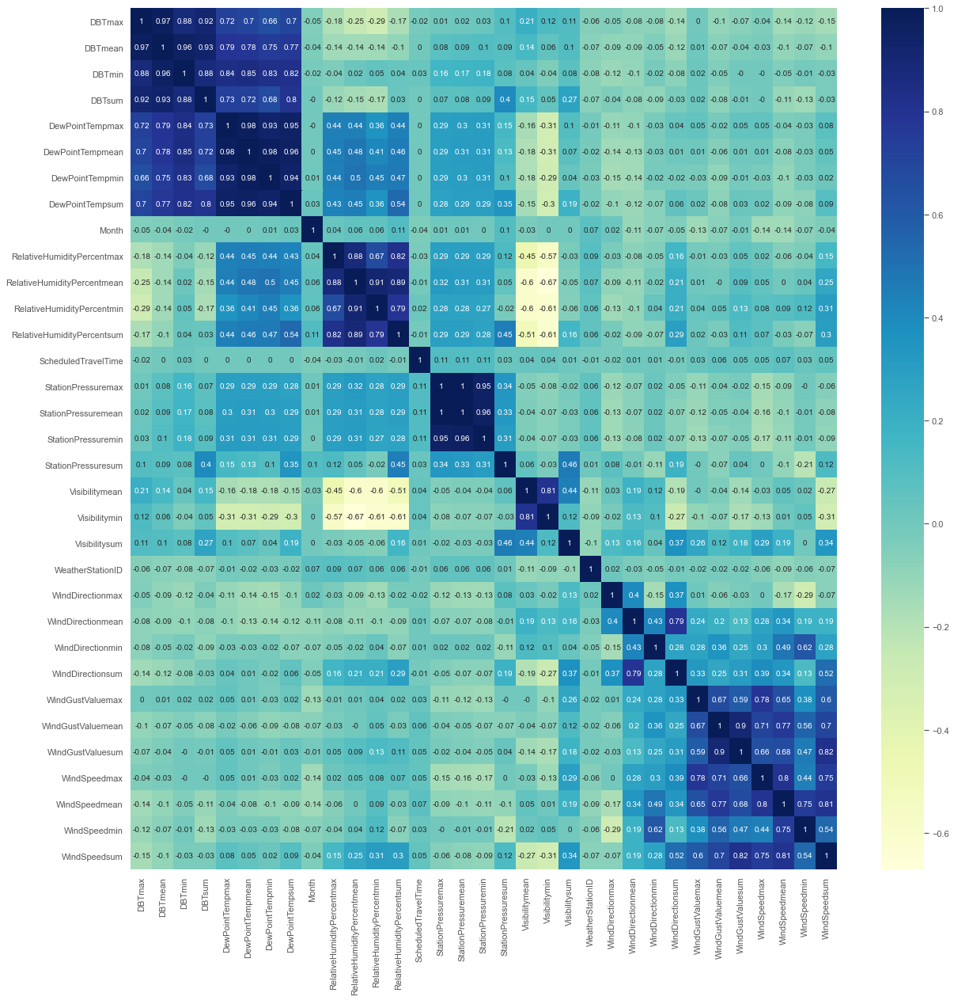

In [209]:
plt.figure(figsize=(20, 20))
plt.style.use("ggplot")
sns.heatmap(corr_num_attr_pca, cmap="YlGnBu", annot=True)
plt.show()

observation: Many attributes are highly multicollinear. so numeric attributes are then standerdesied and PCA us applied

In [210]:
pca_scalar = StandardScaler()
pca_scalar.fit(X_train[num_attr_pca])
std_train_data_pca  = pca_scalar.transform(X_train[num_attr_pca])
std_val_data_pca  = pca_scalar.transform(X_val[num_attr_pca])

In [211]:
pca = PCA()
X_train_pca = pca.fit_transform(std_train_data_pca)
pca.explained_variance_ratio_


array([2.37145767e-01, 1.81231525e-01, 1.47080076e-01, 8.12048938e-02,
       6.83513502e-02, 4.73447646e-02, 3.68673641e-02, 3.18612954e-02,
       2.90359543e-02, 2.75290851e-02, 2.38689435e-02, 1.54124059e-02,
       1.49245293e-02, 1.23486630e-02, 1.10168855e-02, 8.97648370e-03,
       6.70335381e-03, 4.72846990e-03, 3.03882841e-03, 2.32067986e-03,
       1.86576852e-03, 1.64045014e-03, 1.25702551e-03, 1.18791879e-03,
       8.45088778e-04, 7.75278690e-04, 6.29451589e-04, 3.32248615e-04,
       1.96109280e-04, 1.43456260e-04, 1.12867814e-04, 1.21159410e-05,
       1.09020573e-05])

In [212]:
cumsum = np.cumsum(pca.explained_variance_ratio_)
dim = np.argmax(cumsum >= 0.95) + 1
print('The number of dimensions required to preserve 95% of variance is',dim)


The number of dimensions required to preserve 95% of variance is 14


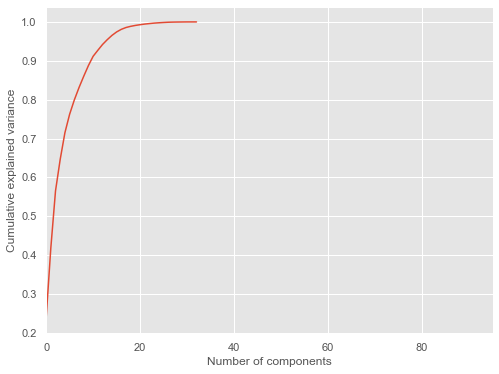

In [213]:
plt.figure(figsize=(8,6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlim(0,95,1)
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
plt.show()



In [214]:
X_train_pca_data=X_train_pca[: ,0:13]
X_val_pca_data=pca.transform(X_val[num_attr_pca])[:,0:13]
print(X_train_pca_data.shape)
print(X_train_pca_data.shape)

(6288, 13)
(6288, 13)


In [215]:
X_train_pca_data = pd.DataFrame(X_train_pca_data, columns=["comp1", "comp2", "com3", "com4",
                                                           "com5", "comp6", "comp7", "comp8",
                                                           "com9", "com10", "com11", "comp12", "com13"]).reset_index(drop = True)
X_val_pca_data = pd.DataFrame(X_val_pca_data, columns=["comp1", "comp2", "com3", "com4",
                                                       "com5", "comp6", "comp7", "comp8",
                                                       "com9", "com10", "com11", "comp12", "com13"]).reset_index(drop = True)

In [216]:
X_train_PCA_final = pd.concat([X_train_pca_data, X_train_less_cat, X_train_more_cat], axis=1).reset_index(drop = True)
X_val_PCA_final = pd.concat([X_val_pca_data, X_val_less_cat,  X_val_more_cat], axis=1).reset_index(drop = True)

### Modelling for PCA Data along with other columns

In [217]:
# Defining the model
log_mod = LogisticRegression(random_state=123)
# fitting it on train data
log_mod.fit(X_train_PCA_final, y_train)

# predicting it on train and validation data
y_pred_train = log_mod.predict(X_train_PCA_final)
y_pred_val = log_mod.predict(X_val_PCA_final)
# Used a customised function for getting reports
pca_modelled = get_metrics(y_train,y_pred_train,y_val,y_pred_val,"PCA_LogisticRegression",scores)
pca_modelled


           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     0.6994    0.4519    0.5490      1215
           2     0.8790    0.9535    0.9147      5073

    accuracy                         0.8566      6288
   macro avg     0.7892    0.7027    0.7319      6288
weighted avg     0.8443    0.8566    0.8440      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.1933    1.0000    0.3239       304
           2     0.0000    0.0000    0.0000      1269

    accuracy                         0.1933      1573
   macro avg     0.0966    0.5000    0.1620      1573
weighted avg     0.0373    0.1933    0.0626      1573


               Confusion Matrix FOR TRAIN DATA
            
[[ 549  666]
 [ 236 4837]]

               Confusion matrix FOR VALIDATION DATA
            
[[ 304    0]
 [1269    0]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314
2,LogisticRegression_liblinear,0.854962,0.453498,0.689612,0.547170,0.841704,0.401316,0.645503,0.494929
3,LogisticRegression_PCA,0.771788,0.764609,0.447064,0.564227,0.755245,0.710526,0.421053,0.528764
4,GaussianNB,0.554707,0.912757,0.291612,0.442009,0.546090,0.921053,0.288660,0.439560
5,ridgereg,0.853212,0.442798,0.686224,0.538269,0.842339,0.384868,0.657303,0.485477
6,ridgereg_classweight,0.819179,0.777778,0.521523,0.624381,0.842339,0.384868,0.657303,0.485477
7,DecisionTree,1.000000,1.000000,1.000000,1.000000,0.785760,0.463816,0.447619,0.455574
8,DecisionTree_BestParameters,0.770356,0.880658,0.451667,0.597098,0.714558,0.776316,0.382496,0.512486
9,DecisionTree_best_parameter_ccpalpha,0.811069,0.767901,0.507341,0.611002,0.771774,0.697368,0.442589,0.541507


## Ridge for PCA data

In [218]:
ridgereg = RidgeClassifier()
ridgereg.fit(X_train_PCA_final,y_train)

y_pred_train=ridgereg.predict(X_train_PCA_final)
y_pred_val = ridgereg.predict(X_val_PCA_final)


# Used a customised function for getting reports
scores = get_metrics(y_train,y_pred_train,y_val,y_pred_val,"PCA_ridgereg",scores)
scores



           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     0.6967    0.4461    0.5439      1215
           2     0.8779    0.9535    0.9141      5073

    accuracy                         0.8554      6288
   macro avg     0.7873    0.6998    0.7290      6288
weighted avg     0.8428    0.8554    0.8426      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.1934    1.0000    0.3241       304
           2     1.0000    0.0008    0.0016      1269

    accuracy                         0.1939      1573
   macro avg     0.5967    0.5004    0.1628      1573
weighted avg     0.8441    0.1939    0.0639      1573


               Confusion Matrix FOR TRAIN DATA
            
[[ 542  673]
 [ 236 4837]]

               Confusion matrix FOR VALIDATION DATA
            
[[ 304    0]
 [1268    1]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314
2,LogisticRegression_liblinear,0.854962,0.453498,0.689612,0.547170,0.841704,0.401316,0.645503,0.494929
3,LogisticRegression_PCA,0.771788,0.764609,0.447064,0.564227,0.755245,0.710526,0.421053,0.528764
4,GaussianNB,0.554707,0.912757,0.291612,0.442009,0.546090,0.921053,0.288660,0.439560
5,ridgereg,0.853212,0.442798,0.686224,0.538269,0.842339,0.384868,0.657303,0.485477
6,ridgereg_classweight,0.819179,0.777778,0.521523,0.624381,0.842339,0.384868,0.657303,0.485477
7,DecisionTree,1.000000,1.000000,1.000000,1.000000,0.785760,0.463816,0.447619,0.455574
8,DecisionTree_BestParameters,0.770356,0.880658,0.451667,0.597098,0.714558,0.776316,0.382496,0.512486
9,DecisionTree_best_parameter_ccpalpha,0.811069,0.767901,0.507341,0.611002,0.771774,0.697368,0.442589,0.541507


### Ridge class weight balanced

In [219]:
ridgereg = RidgeClassifier( class_weight='balanced')
ridgereg.fit(X_train_PCA_final,y_train)

y_pred_train=ridgereg.predict(X_train_PCA_final)
y_pred_test = ridgereg.predict(X_val_PCA_final)


# Used a customised function for getting reports
scores = get_metrics(y_train,y_pred_train,y_val,y_pred_val,"ridgereg_classweight",scores)
scores


           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     0.5355    0.7572    0.6273      1215
           2     0.9354    0.8427    0.8867      5073

    accuracy                         0.8262      6288
   macro avg     0.7355    0.7999    0.7570      6288
weighted avg     0.8582    0.8262    0.8365      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.1934    1.0000    0.3241       304
           2     1.0000    0.0008    0.0016      1269

    accuracy                         0.1939      1573
   macro avg     0.5967    0.5004    0.1628      1573
weighted avg     0.8441    0.1939    0.0639      1573


               Confusion Matrix FOR TRAIN DATA
            
[[ 920  295]
 [ 798 4275]]

               Confusion matrix FOR VALIDATION DATA
            
[[ 304    0]
 [1268    1]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314
2,LogisticRegression_liblinear,0.854962,0.453498,0.689612,0.547170,0.841704,0.401316,0.645503,0.494929
3,LogisticRegression_PCA,0.771788,0.764609,0.447064,0.564227,0.755245,0.710526,0.421053,0.528764
4,GaussianNB,0.554707,0.912757,0.291612,0.442009,0.546090,0.921053,0.288660,0.439560
5,ridgereg,0.853212,0.442798,0.686224,0.538269,0.842339,0.384868,0.657303,0.485477
6,ridgereg_classweight,0.819179,0.777778,0.521523,0.624381,0.842339,0.384868,0.657303,0.485477
7,DecisionTree,1.000000,1.000000,1.000000,1.000000,0.785760,0.463816,0.447619,0.455574
8,DecisionTree_BestParameters,0.770356,0.880658,0.451667,0.597098,0.714558,0.776316,0.382496,0.512486
9,DecisionTree_best_parameter_ccpalpha,0.811069,0.767901,0.507341,0.611002,0.771774,0.697368,0.442589,0.541507


# DecisionTree_BestParameters with ccp-alpha

In [220]:
class_weight = {1:1, 2:0.4}

# params = {'criterion': 'entropy','max_depth': 5,'max_leaf_nodes': 10,'min_samples_leaf': 2}
dtc_imb = DecisionTreeClassifier(class_weight =class_weight,max_depth= 5, ccp_alpha = 0.008, criterion = 'entropy',
                                max_leaf_nodes =10, min_samples_leaf = 2)

# clf_dt_grid = GridSearchCV(dtc_imb, param_grid,cv=5)
dtc_imb.fit(X_train_PCA_final, y_train)
y_pred_train = dtc_imb.predict(X_train_PCA_final)
y_pred_val = dtc_imb.predict(X_val_PCA_final)
scores = get_metrics(y_train,y_pred_train,y_val,y_pred_val,"PCA_DecisionTree_BestParameters",scores)
scores


           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     0.4348    0.7959    0.5624      1215
           2     0.9390    0.7522    0.8353      5073

    accuracy                         0.7607      6288
   macro avg     0.6869    0.7741    0.6988      6288
weighted avg     0.8416    0.7607    0.7826      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.2849    0.7862    0.4182       304
           2     0.9114    0.5272    0.6680      1269

    accuracy                         0.5772      1573
   macro avg     0.5982    0.6567    0.5431      1573
weighted avg     0.7904    0.5772    0.6197      1573


               Confusion Matrix FOR TRAIN DATA
            
[[ 967  248]
 [1257 3816]]

               Confusion matrix FOR VALIDATION DATA
            
[[239  65]
 [600 669]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314
2,LogisticRegression_liblinear,0.854962,0.453498,0.689612,0.547170,0.841704,0.401316,0.645503,0.494929
3,LogisticRegression_PCA,0.771788,0.764609,0.447064,0.564227,0.755245,0.710526,0.421053,0.528764
4,GaussianNB,0.554707,0.912757,0.291612,0.442009,0.546090,0.921053,0.288660,0.439560
5,ridgereg,0.853212,0.442798,0.686224,0.538269,0.842339,0.384868,0.657303,0.485477
6,ridgereg_classweight,0.819179,0.777778,0.521523,0.624381,0.842339,0.384868,0.657303,0.485477
7,DecisionTree,1.000000,1.000000,1.000000,1.000000,0.785760,0.463816,0.447619,0.455574
8,DecisionTree_BestParameters,0.770356,0.880658,0.451667,0.597098,0.714558,0.776316,0.382496,0.512486
9,DecisionTree_best_parameter_ccpalpha,0.811069,0.767901,0.507341,0.611002,0.771774,0.697368,0.442589,0.541507


# Decision_tree with gridsearch and CV on PCA data

In [221]:
# set of parameters to test
param_grid = {"class_weight":['balanced', None],
              "criterion": ["gini", "entropy"],
              "max_depth": [3, 5, 6],
              "min_samples_leaf": [2, 5, 10],
               "max_leaf_nodes": [None, 5, 10, 20]
              }


dt = DecisionTreeClassifier(random_state=123)
clf_dt_grid = GridSearchCV(dt, param_grid,cv=5)
clf_dt_grid.fit(X_train_PCA_final, y_train)

clf_dt_grid.best_params_

y_pred_train = clf_dt_grid.predict(X_train_PCA_final)
y_pred_val = clf_dt_grid.predict(X_val_PCA_final)
scores = get_metrics(y_train,y_pred_train,y_val,y_pred_val,"PCA_DecisionTree_CV_BestParameters",scores)
scores


           CLASSIFICATION REPORT FOR TRAIN DATA
        
              precision    recall  f1-score   support

           1     0.6453    0.3984    0.4926      1215
           2     0.8680    0.9476    0.9060      5073

    accuracy                         0.8414      6288
   macro avg     0.7567    0.6730    0.6993      6288
weighted avg     0.8250    0.8414    0.8262      6288


               CLASSIFICATION REPORT FOR VALIDATION DATA
            
              precision    recall  f1-score   support

           1     0.5244    0.2829    0.3675       304
           2     0.8453    0.9385    0.8895      1269

    accuracy                         0.8118      1573
   macro avg     0.6848    0.6107    0.6285      1573
weighted avg     0.7833    0.8118    0.7886      1573


               Confusion Matrix FOR TRAIN DATA
            
[[ 484  731]
 [ 266 4807]]

               Confusion matrix FOR VALIDATION DATA
            
[[  86  218]
 [  78 1191]]


,Model,Train_Accuracy,Train_Recall,Train_Precision,Train_F1_Score,Test_Accuracy,Test_Recall,Test_Precision,Test_F1_Score
0,LogisticRegression,0.855439,0.456790,0.690299,0.549777,0.839161,0.391447,0.636364,0.484725
1,LogisticRegression_roc_AUC,0.849873,0.609053,0.612076,0.610561,0.834711,0.536184,0.578014,0.556314
2,LogisticRegression_liblinear,0.854962,0.453498,0.689612,0.547170,0.841704,0.401316,0.645503,0.494929
3,LogisticRegression_PCA,0.771788,0.764609,0.447064,0.564227,0.755245,0.710526,0.421053,0.528764
4,GaussianNB,0.554707,0.912757,0.291612,0.442009,0.546090,0.921053,0.288660,0.439560
5,ridgereg,0.853212,0.442798,0.686224,0.538269,0.842339,0.384868,0.657303,0.485477
6,ridgereg_classweight,0.819179,0.777778,0.521523,0.624381,0.842339,0.384868,0.657303,0.485477
7,DecisionTree,1.000000,1.000000,1.000000,1.000000,0.785760,0.463816,0.447619,0.455574
8,DecisionTree_BestParameters,0.770356,0.880658,0.451667,0.597098,0.714558,0.776316,0.382496,0.512486
9,DecisionTree_best_parameter_ccpalpha,0.811069,0.767901,0.507341,0.611002,0.771774,0.697368,0.442589,0.541507


## Analysis and modelling for test data

In [222]:
# Reading the test data
test_data_path = "20210328_Testdata/Test.csv"
test_data = pd.read_csv(test_data_path)
test_data.head()

,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,Distance
0,DEN_XNA_62349,2005,9,12,1,1516,1756,100,DEN,XNA,616
1,RIC_EWR_87213,2005,11,14,1,1300,1415,75,RIC,EWR,278
2,IAD_GSO_86576,2005,9,28,3,1040,1144,64,IAD,GSO,239
3,SAV_CVG_87264,2005,11,18,5,1120,1302,102,SAV,CVG,515
4,SBP_LAX_68158,2005,7,5,2,630,733,63,SBP,LAX,155


In [223]:
# Checking counts and value counts for the data
print("************Checking counts and values counts for the test data**********")
counts_and_value_counts(test_data)

************Checking counts and values counts for the test data**********
shape of df  (6566, 11)
no_of_rows in df 6566
colname: FlightNumber , their value count in 6566
% unique at  FlightNumber 100.0 %
---------------------------------------
shape of df  (6566, 11)
no_of_rows in df 6566
colname: Year , their value count in 1
% unique at  Year 0.015229972586049346 %
---------------------------------------
shape of df  (6566, 11)
no_of_rows in df 6566
colname: Month , their value count in 4
% unique at  Month 0.06091989034419738 %
---------------------------------------
shape of df  (6566, 11)
no_of_rows in df 6566
colname: DayofMonth , their value count in 31
% unique at  DayofMonth 0.47212915016752965 %
---------------------------------------
shape of df  (6566, 11)
no_of_rows in df 6566
colname: DayOfWeek , their value count in 7
% unique at  DayOfWeek 0.10660980810234541 %
---------------------------------------
shape of df  (6566, 11)
no_of_rows in df 6566
colname: ScheduledDepTim

## Reading and mering the different hourly weather data file and hourly ppt data file. These file are contacted 

In [224]:
hourly_200403hourly = pd.read_csv(r"20210322_weatherdatatoconsider/2005/200503hourly.txt", low_memory=False)
hourly_200407hourly = pd.read_csv(r"20210322_weatherdatatoconsider/2005/200507hourly.txt", low_memory=False)
hourly_200409hourly = pd.read_csv(r"20210322_weatherdatatoconsider/2005/200509hourly.txt", low_memory=False)
hourly_2004011hourly = pd.read_csv(r"20210322_weatherdatatoconsider/2005/200511hourly.txt", low_memory=False)


In [225]:
hourly_200403hpd = pd.read_csv(r"20210322_weatherdatatoconsider/2005/200503hpd.txt")
hourly_200407hpd = pd.read_csv(r"20210322_weatherdatatoconsider/2005/200507hpd.txt")
hourly_200409hpd = pd.read_csv(r"20210322_weatherdatatoconsider/2005/200509hpd.txt")
hourly_2004011hpd = pd.read_csv(r"20210322_weatherdatatoconsider/2005/200511hpd.txt")


In [226]:
# Concatinating the recors of hourly and phd records for test data
test_total_hourly_records = pd.concat([hourly_200403hourly, hourly_200407hourly, hourly_200409hourly,hourly_2004011hourly], 
                                      axis=0)

test_total_hpd_records = pd.concat([hourly_200403hpd, hourly_200407hpd, hourly_200409hpd,hourly_2004011hpd], 
                                   axis=0)

In [227]:
print("*********** total hourly records *************")
print("Shape of test total hourly records ", test_total_hourly_records.shape)

test_total_hourly_records.head()

*********** total hourly records *************
Shape of test total hourly records  (5031729, 12)


,WeatherStationID,YearMonthDay,Time,SkyConditions,Visibility,DBT,DewPointTemp,RelativeHumidityPercent,WindSpeed,WindDirection,WindGustValue,StationPressure
0,4843,20050301,10,FEW008 SCT012 OVC026,1.75SM,NaN,NaN,NaN,6,VRB,0.0,NaN
1,13874,20050301,10,SCT023 BKN030,10SM,NaN,NaN,NaN,14,310,0.0,NaN
2,14765,20050301,10,FEW007 SCT010 OVC015,2SM,NaN,NaN,NaN,19,030,26.0,NaN
3,14777,20050301,10,OVC011,2.5SM,NaN,NaN,NaN,5,040,0.0,NaN
4,14819,20050301,10,FEW015 OVC060,2SM,NaN,NaN,NaN,9,310,0.0,NaN


In [228]:
print("*********** total hpd records *************")
print("shape of total hpd records ", test_total_hpd_records.shape)
test_total_hpd_records.head()

*********** total hpd records *************
shape of total hpd records  (4410021, 4)


,WeatherStationID,YearMonthDay,Time,HourlyPrecip
0,27401,20050301,15,0.0
1,24201,20050301,17,0.0
2,13944,20050301,30,0.0
3,14704,20050301,34,0.0
4,27401,20050301,35,0.0


## Explorator data analysis on the test weather data and tes hpd data files
* Since Weather is playing cruicial role in delay of flight. EDA on Weather data is important 
- 1) Checking valuecounts, and counts and uniqueness in the datasets

In [229]:
print("****************Name of the dataframe : ", "total_hourly_records***********************")
print()
counts_and_value_counts(test_total_hourly_records)
print()
print("=" * 80)
print()
print("=" * 80)
print()
print("***************Name of the dataframe : ", "total_hpd_records**************************")
print()
counts_and_value_counts(test_total_hpd_records)

****************Name of the dataframe :  total_hourly_records***********************

shape of df  (5031729, 12)
no_of_rows in df 5031729
colname: WeatherStationID , their value count in 1690
% unique at  WeatherStationID 0.03358686447541193 %
---------------------------------------
shape of df  (5031729, 12)
no_of_rows in df 5031729
colname: YearMonthDay , their value count in 122
% unique at  YearMonthDay 0.0024246138852072516 %
---------------------------------------
shape of df  (5031729, 12)
no_of_rows in df 5031729
colname: Time , their value count in 1423
% unique at  Time 0.028280537365982943 %
---------------------------------------
shape of df  (5031729, 12)
no_of_rows in df 5031729
colname: SkyConditions , their value count in 215910
% unique at  SkyConditions 4.2909703602876865 %
---------------------------------------
shape of df  (5031729, 12)
no_of_rows in df 5031729
colname: Visibility , their value count in 81
% unique at  Visibility 0.0016097846287031754 %
-----------

In [230]:
# Resetting index
test_total_hourly_records = test_total_hourly_records.reset_index(drop=True)
test_total_hpd_records = test_total_hpd_records.reset_index(drop=True)

In [231]:
print("*********** pattrents checking in total_hourly_records ****************")
symbols(test_total_hourly_records)

*********** pattrents checking in total_hourly_records ****************


{'WeatherStationID': [],
 'YearMonthDay': [],
 'Time': [],
 'SkyConditions': [],
 'Visibility': [],
 'DBT': ['.'],
 'DewPointTemp': ['.'],
 'RelativeHumidityPercent': ['.'],
 'WindSpeed': [],
 'WindDirection': [],
 'WindGustValue': ['.'],
 'StationPressure': ['.']}

In [232]:
print("*********** pattrents checking in test_total_hpd_records ****************")
symbols(test_total_hpd_records)

*********** pattrents checking in test_total_hpd_records ****************


{'WeatherStationID': [], 'YearMonthDay': [], 'Time': [], 'HourlyPrecip': ['.']}

In [233]:
# Extracting the Year Month Day for test data
test_total_hourly_records["YearMonthDay"] = pd.to_datetime(test_total_hourly_records["YearMonthDay"], format='%Y%m%d')

Year = pd.DatetimeIndex(test_total_hourly_records["YearMonthDay"]).year
Month = pd.DatetimeIndex(test_total_hourly_records["YearMonthDay"]).month
DayOfMonth = pd.DatetimeIndex(test_total_hourly_records["YearMonthDay"]).day
DayOfWeek = pd.DatetimeIndex(test_total_hourly_records["YearMonthDay"]).weekday

test_total_hourly_records["Year"] = Year
test_total_hourly_records["Month"] = Month
test_total_hourly_records["DayofMonth"] = DayOfMonth
test_total_hourly_records["DayOfWeek"] = DayOfWeek
test_total_hourly_records["DayOfWeek"] = test_total_hourly_records["DayOfWeek"] + 1  # since iso format of weekdays


test_total_hpd_records["YearMonthDay"] = pd.to_datetime(test_total_hpd_records["YearMonthDay"], format='%Y%m%d')
Year = pd.DatetimeIndex(test_total_hpd_records["YearMonthDay"]).year
Month = pd.DatetimeIndex(test_total_hpd_records["YearMonthDay"]).month
DayOfMonth = pd.DatetimeIndex(test_total_hpd_records["YearMonthDay"]).day
DayOfWeek = pd.DatetimeIndex(test_total_hpd_records["YearMonthDay"]).weekday

test_total_hpd_records["Year"] = Year
test_total_hpd_records["Month"] = Month
test_total_hpd_records["DayofMonth"] = DayOfMonth
test_total_hpd_records["DayOfWeek"] = DayOfWeek
test_total_hpd_records["DayOfWeek"] = test_total_hpd_records["DayOfWeek"] + 1 # since iso format of weekdays

In [234]:
#checking top5 recods horuly data
test_total_hourly_records.head()

,WeatherStationID,YearMonthDay,Time,SkyConditions,Visibility,DBT,DewPointTemp,RelativeHumidityPercent,WindSpeed,WindDirection,WindGustValue,StationPressure,Year,Month,DayofMonth,DayOfWeek
0,4843,2005-03-01,10,FEW008 SCT012 OVC026,1.75SM,NaN,NaN,NaN,6,VRB,0.0,NaN,2005,3,1,2
1,13874,2005-03-01,10,SCT023 BKN030,10SM,NaN,NaN,NaN,14,310,0.0,NaN,2005,3,1,2
2,14765,2005-03-01,10,FEW007 SCT010 OVC015,2SM,NaN,NaN,NaN,19,030,26.0,NaN,2005,3,1,2
3,14777,2005-03-01,10,OVC011,2.5SM,NaN,NaN,NaN,5,040,0.0,NaN,2005,3,1,2
4,14819,2005-03-01,10,FEW015 OVC060,2SM,NaN,NaN,NaN,9,310,0.0,NaN,2005,3,1,2


In [235]:
# checking top 5 records of hpd data
test_total_hpd_records.head()

,WeatherStationID,YearMonthDay,Time,HourlyPrecip,Year,Month,DayofMonth,DayOfWeek
0,27401,2005-03-01,15,0.0,2005,3,1,2
1,24201,2005-03-01,17,0.0,2005,3,1,2
2,13944,2005-03-01,30,0.0,2005,3,1,2
3,14704,2005-03-01,34,0.0,2005,3,1,2
4,27401,2005-03-01,35,0.0,2005,3,1,2


In [236]:
# Since we have already extracted the information so yearMonthday, Time and year column is not needed
# and grouping the records w.r.t Weatherstationid, and so on and aggregating the remaing columns
test_total_hpd_records = test_total_hpd_records.drop(["YearMonthDay", "Time", "Year"], axis=1)
agg_test_total_hpd_records = test_total_hpd_records.groupby(["WeatherStationID","Month", "DayofMonth", "DayOfWeek"], as_index = False).aggregate({"HourlyPrecip" : ["min", "max", "sum", "mean"]})
agg_test_total_hpd_records.columns = ["".join(col) for col in agg_test_total_hpd_records.columns]
agg_test_total_hpd_records.head()

,WeatherStationID,Month,DayofMonth,DayOfWeek,HourlyPrecipmin,HourlyPrecipmax,HourlyPrecipsum,HourlyPrecipmean
0,3011,3,1,2,0.0,0.0,0.0,0.0
1,3011,3,2,3,0.0,0.0,0.0,0.0
2,3011,3,3,4,0.0,0.0,0.0,0.0
3,3011,3,4,5,0.0,0.0,0.0,0.0
4,3011,3,5,6,0.0,0.0,0.0,0.0


In [237]:
# Many variable are having some other pattrens such as / and - and v etc. Removing those with the null
# values. and converting there dtypes to numeric float value 
test_total_hourly_records["Visibility"] = test_total_hourly_records["Visibility"].apply(lambda x : str(x).replace("SM", ""))
test_total_hourly_records["Visibility"] = test_total_hourly_records["Visibility"].apply(lambda x : str(x).replace("/", ""))
test_total_hourly_records["Visibility"] = test_total_hourly_records["Visibility"].apply(lambda x : str(x).replace("V", ""))
test_total_hourly_records["WindDirection"] = test_total_hourly_records["WindDirection"].replace(to_replace = "VRB", value = "000")

test_total_hourly_records["WindSpeed"] = test_total_hourly_records["WindSpeed"].apply(lambda x : str(x).replace("/", ""))
test_total_hourly_records["WindSpeed"] = test_total_hourly_records["WindSpeed"].apply(lambda x : str(x).replace("-", ""))
test_total_hourly_records["WindSpeed"] = test_total_hourly_records["WindSpeed"].apply(lambda x : str(x).replace(".", ""))
test_total_hourly_records["WindSpeed"] = test_total_hourly_records["WindSpeed"].apply(lambda x : str(x))
test_total_hourly_records["WindSpeed"] = test_total_hourly_records["WindSpeed"].replace(to_replace = "", value = "0.0")


test_total_hourly_records["Visibility"] = test_total_hourly_records["Visibility"].astype("float64")
test_total_hourly_records["WindSpeed"] = test_total_hourly_records["WindSpeed"].astype("float64")
test_total_hourly_records["WindDirection"] = test_total_hourly_records["WindDirection"].astype("float64")

In [238]:
test_total_hourly_records.head()

,WeatherStationID,YearMonthDay,Time,SkyConditions,Visibility,DBT,DewPointTemp,RelativeHumidityPercent,WindSpeed,WindDirection,WindGustValue,StationPressure,Year,Month,DayofMonth,DayOfWeek
0,4843,2005-03-01,10,FEW008 SCT012 OVC026,1.75,NaN,NaN,NaN,6.0,0.0,0.0,NaN,2005,3,1,2
1,13874,2005-03-01,10,SCT023 BKN030,10.00,NaN,NaN,NaN,14.0,310.0,0.0,NaN,2005,3,1,2
2,14765,2005-03-01,10,FEW007 SCT010 OVC015,2.00,NaN,NaN,NaN,19.0,30.0,26.0,NaN,2005,3,1,2
3,14777,2005-03-01,10,OVC011,2.50,NaN,NaN,NaN,5.0,40.0,0.0,NaN,2005,3,1,2
4,14819,2005-03-01,10,FEW015 OVC060,2.00,NaN,NaN,NaN,9.0,310.0,0.0,NaN,2005,3,1,2


In [239]:
# after the preprocessing are droping the coulmns YearMonthDay, Time and Year column as the data is already extracted
# and data is grouped w.r.t to WeatherstationID and so on and aggregating it on remaing columns
test_total_hourly_records = test_total_hourly_records.drop(["YearMonthDay", "Time", "Year"], axis=1)
agg_test_total_hourly_records = test_total_hourly_records.groupby(["WeatherStationID","Month", "DayofMonth", "DayOfWeek"], as_index = False).aggregate({"SkyConditions":[get_max],
                                                                                                             "Visibility":["min", "max", "sum", "mean"],
                                                                                                             "DBT" : ["min", "max", "sum", "mean"],
                                                                                                            "DewPointTemp" : ["min", "max", "sum", "mean"],
                                                                                                            "RelativeHumidityPercent" : ["min", "max", "sum", "mean"],
                                                                                                            "WindSpeed":["min", "max", "sum", "mean"],
                                                                                                            "WindDirection" : ["min", "max", "sum", "mean"],
                                                                                                            "WindGustValue" : ["min", "max", "sum", "mean"],
                                                                                                            "StationPressure" :["min", "max", "sum", "mean"]})
# joining the multilevel columns 
agg_test_total_hourly_records.columns = ["".join(col) for col in agg_test_total_hourly_records.columns]
# getting to know the top5 records after aggregating
agg_test_total_hourly_records.head()

,WeatherStationID,Month,DayofMonth,DayOfWeek,SkyConditionsmost frequent,Visibilitymin,Visibilitymax,Visibilitysum,Visibilitymean,DBTmin,...,WindDirectionsum,WindDirectionmean,WindGustValuemin,WindGustValuemax,WindGustValuesum,WindGustValuemean,StationPressuremin,StationPressuremax,StationPressuresum,StationPressuremean
0,3011,3,1,2,BKN028 OVC037,0.5,10.0,246.75,7.710938,9.0,...,2660.0,91.724138,0.0,0.0,0.0,0.0,30.01,30.07,961.00,30.031250
1,3011,3,2,3,CLR,10.0,10.0,220.00,10.000000,14.0,...,2510.0,114.090909,0.0,0.0,0.0,0.0,30.03,30.12,661.61,30.073182
2,3011,3,3,4,CLR,8.0,10.0,258.00,9.923077,19.0,...,2880.0,110.769231,0.0,0.0,0.0,0.0,30.02,30.13,781.63,30.062692
3,3011,3,4,5,CLR,10.0,10.0,240.00,10.000000,16.0,...,3060.0,127.500000,0.0,0.0,0.0,0.0,30.10,30.18,723.34,30.139167
4,3011,3,5,6,CLR,2.5,10.0,255.50,9.462963,27.0,...,2750.0,105.769231,0.0,0.0,0.0,0.0,30.16,30.22,815.02,30.185926


In [240]:
# after aggregating the hourly records and hpd records are merged w.r.t WeatherstationID using inner join operations
test_merged_agg_record_hpd_hourly = pd.merge(left = agg_test_total_hpd_records, right=agg_test_total_hourly_records, on = ["WeatherStationID", "Month", "DayOfWeek", "DayofMonth"], how = "inner")

# For all station records analysis

In [241]:
# reading the data
all_station_records = pd.read_csv(r"20210322_weatherdatatoconsider/AllStationsData_PHD.txt", sep = "|")

# checking top 5 records of the data
all_station_records.head()

,WeatherStationID,AirportID,GroundHeight,StationHeight,BarometerHeight,Latitude,Longitude,TimeZone
0,3011,TEX,0,0,0,37.57,-107.55,+7
1,3012,SKX,0,0,0,36.28,-105.40,+7
2,3013,LAA,3683,3703,3675,38.04,-102.41,+7
3,3014,4SL,0,6909,0,35.47,-107.14,+7
4,3016,RIL,5503,5544,5506,39.32,-107.44,+7


In [242]:
# Common columns are there for inner_merged and all station records are Weather station id. so inner merge operation
# are used
test_inner_merged_asd = pd.merge(left = test_merged_agg_record_hpd_hourly, right=all_station_records, left_on= "WeatherStationID", right_on="WeatherStationID", how = "inner")

In [243]:
# checking top5 records
test_inner_merged_asd.head()

,WeatherStationID,Month,DayofMonth,DayOfWeek,HourlyPrecipmin,HourlyPrecipmax,HourlyPrecipsum,HourlyPrecipmean,SkyConditionsmost frequent,Visibilitymin,...,StationPressuremax,StationPressuresum,StationPressuremean,AirportID,GroundHeight,StationHeight,BarometerHeight,Latitude,Longitude,TimeZone
0,3011,3,1,2,0.0,0.0,0.0,0.0,BKN028 OVC037,0.5,...,30.07,961.00,30.031250,TEX,0,0,0,37.57,-107.55,+7
1,3011,3,2,3,0.0,0.0,0.0,0.0,CLR,10.0,...,30.12,661.61,30.073182,TEX,0,0,0,37.57,-107.55,+7
2,3011,3,3,4,0.0,0.0,0.0,0.0,CLR,8.0,...,30.13,781.63,30.062692,TEX,0,0,0,37.57,-107.55,+7
3,3011,3,4,5,0.0,0.0,0.0,0.0,CLR,10.0,...,30.18,723.34,30.139167,TEX,0,0,0,37.57,-107.55,+7
4,3011,3,5,6,0.0,0.0,0.0,0.0,CLR,2.5,...,30.22,815.02,30.185926,TEX,0,0,0,37.57,-107.55,+7


# Test data Analysis

In [244]:
# Reading test_data
test_data_path = "20210328_Testdata/Test.csv"
test_data = pd.read_csv(test_data_path)
test_data.head()

,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,Distance
0,DEN_XNA_62349,2005,9,12,1,1516,1756,100,DEN,XNA,616
1,RIC_EWR_87213,2005,11,14,1,1300,1415,75,RIC,EWR,278
2,IAD_GSO_86576,2005,9,28,3,1040,1144,64,IAD,GSO,239
3,SAV_CVG_87264,2005,11,18,5,1120,1302,102,SAV,CVG,515
4,SBP_LAX_68158,2005,7,5,2,630,733,63,SBP,LAX,155


In [245]:
print("************ Checking train data records**************")
counts_and_value_counts(test_data)

************ Checking train data records**************
shape of df  (6566, 11)
no_of_rows in df 6566
colname: FlightNumber , their value count in 6566
% unique at  FlightNumber 100.0 %
---------------------------------------
shape of df  (6566, 11)
no_of_rows in df 6566
colname: Year , their value count in 1
% unique at  Year 0.015229972586049346 %
---------------------------------------
shape of df  (6566, 11)
no_of_rows in df 6566
colname: Month , their value count in 4
% unique at  Month 0.06091989034419738 %
---------------------------------------
shape of df  (6566, 11)
no_of_rows in df 6566
colname: DayofMonth , their value count in 31
% unique at  DayofMonth 0.47212915016752965 %
---------------------------------------
shape of df  (6566, 11)
no_of_rows in df 6566
colname: DayOfWeek , their value count in 7
% unique at  DayOfWeek 0.10660980810234541 %
---------------------------------------
shape of df  (6566, 11)
no_of_rows in df 6566
colname: ScheduledDepTime , their value cou

In [246]:
print("***********Checking any pattrens in the data*****************")
symbols(test_data)

***********Checking any pattrens in the data*****************


{'FlightNumber': ['_', '_'],
 'Year': [],
 'Month': [],
 'DayofMonth': [],
 'DayOfWeek': [],
 'ScheduledDepTime': [],
 'ScheduledArrTime': [],
 'ScheduledTravelTime': [],
 'Origin': [],
 'Destination': [],
 'Distance': []}

In [247]:
# Describing test data
test_data.describe()

,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Distance
count,6566.0,6566.000000,6566.000000,6566.000000,6566.000000,6566.000000,6566.000000,6566.000000
mean,2005.0,7.261956,15.856381,3.916844,1206.076150,1422.606458,133.033506,766.722662
std,0.0,2.931392,8.864432,1.935778,357.850338,374.715953,64.333398,528.835476
min,2005.0,3.000000,1.000000,1.000000,239.000000,518.000000,61.000000,81.000000
25%,2005.0,3.000000,8.000000,2.000000,906.000000,1117.000000,85.000000,383.000000
50%,2005.0,7.000000,16.000000,4.000000,1227.000000,1441.000000,115.000000,612.000000
75%,2005.0,9.000000,23.000000,6.000000,1525.000000,1737.000000,160.000000,988.000000
max,2005.0,11.000000,31.000000,7.000000,1800.000000,2300.000000,557.000000,4502.000000


In [248]:
# test data is merged to aggregated files
test_origin_data = pd.merge(left = test_data, right=test_inner_merged_asd, left_on= ["Month","DayofMonth","DayOfWeek","Origin"], right_on=["Month","DayofMonth","DayOfWeek","AirportID"], how = "inner")

In [249]:
print("***********printing shape of the data***************")
test_origin_data.shape

***********printing shape of the data***************


(6566, 56)

In [250]:
# meriging the files with respect to destination
test_destination_data = pd.merge(left = test_data, right=test_inner_merged_asd, left_on= ["Month","DayofMonth","DayOfWeek","Destination"], right_on=["Month","DayofMonth","DayOfWeek","AirportID"], how = "inner")

In [251]:
print("*************printing shape of the destination file*************")
test_destination_data.shape

*************printing shape of the destination file*************


(6566, 56)

In [252]:
# Checking head for the top 5 records for origin data
test_origin_data.head()

,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,...,StationPressuremax,StationPressuresum,StationPressuremean,AirportID,GroundHeight,StationHeight,BarometerHeight,Latitude,Longitude,TimeZone
0,DEN_XNA_62349,2005,9,12,1,1516,1756,100,DEN,XNA,...,24.64,589.46,24.560833,DEN,5379,5431,5382,39.50,-104.40,+7
1,DEN_PDX_102547,2005,9,12,1,1423,1553,150,DEN,PDX,...,24.64,589.46,24.560833,DEN,5379,5431,5382,39.50,-104.40,+7
2,RIC_EWR_87213,2005,11,14,1,1300,1415,75,RIC,EWR,...,30.12,722.11,30.087917,RIC,164,163,167,37.31,-77.19,+5
3,IAD_GSO_86576,2005,9,28,3,1040,1144,64,IAD,GSO,...,29.88,715.00,29.791667,IAD,306,323,309,38.56,-77.27,+5
4,IAD_GSP_89545,2005,9,28,3,1230,1353,83,IAD,GSP,...,29.88,715.00,29.791667,IAD,306,323,309,38.56,-77.27,+5


In [253]:
# Checking head for the top 5 records for destination data
test_destination_data.head()

,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,...,StationPressuremax,StationPressuresum,StationPressuremean,AirportID,GroundHeight,StationHeight,BarometerHeight,Latitude,Longitude,TimeZone
0,DEN_XNA_62349,2005,9,12,1,1516,1756,100,DEN,XNA,...,28.78,689.00,28.708333,XNA,1269,1319,1272,36.17,-94.19,+6
1,DFW_XNA_69743,2005,9,12,1,1107,1212,65,DFW,XNA,...,28.78,689.00,28.708333,XNA,1269,1319,1272,36.17,-94.19,+6
2,RIC_EWR_87213,2005,11,14,1,1300,1415,75,RIC,EWR,...,30.37,725.55,30.231250,EWR,25,30,28,40.43,-74.10,+5
3,PBI_EWR_82251,2005,11,14,1,1245,1532,167,PBI,EWR,...,30.37,725.55,30.231250,EWR,25,30,28,40.43,-74.10,+5
4,IAD_EWR_59966,2005,11,14,1,1300,1414,74,IAD,EWR,...,30.37,725.55,30.231250,EWR,25,30,28,40.43,-74.10,+5


# Exploratory analysis on both origin test data and destination test data

In [254]:
print("******** checking details on origin_train_data *********")
print()
counts_and_value_counts(test_origin_data)

******** checking details on origin_train_data *********

shape of df  (6566, 56)
no_of_rows in df 6566
colname: FlightNumber , their value count in 6566
% unique at  FlightNumber 100.0 %
---------------------------------------
shape of df  (6566, 56)
no_of_rows in df 6566
colname: Year , their value count in 1
% unique at  Year 0.015229972586049346 %
---------------------------------------
shape of df  (6566, 56)
no_of_rows in df 6566
colname: Month , their value count in 4
% unique at  Month 0.06091989034419738 %
---------------------------------------
shape of df  (6566, 56)
no_of_rows in df 6566
colname: DayofMonth , their value count in 31
% unique at  DayofMonth 0.47212915016752965 %
---------------------------------------
shape of df  (6566, 56)
no_of_rows in df 6566
colname: DayOfWeek , their value count in 7
% unique at  DayOfWeek 0.10660980810234541 %
---------------------------------------
shape of df  (6566, 56)
no_of_rows in df 6566
colname: ScheduledDepTime , their value 

In [255]:
print("*********Checking column and dtypes of the data frame*************")
print()
test_origin_data.info()

*********Checking column and dtypes of the data frame*************

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6566 entries, 0 to 6565
Data columns (total 56 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   FlightNumber                 6566 non-null   object 
 1   Year                         6566 non-null   int64  
 2   Month                        6566 non-null   int64  
 3   DayofMonth                   6566 non-null   int64  
 4   DayOfWeek                    6566 non-null   int64  
 5   ScheduledDepTime             6566 non-null   int64  
 6   ScheduledArrTime             6566 non-null   int64  
 7   ScheduledTravelTime          6566 non-null   int64  
 8   Origin                       6566 non-null   object 
 9   Destination                  6566 non-null   object 
 10  Distance                     6566 non-null   int64  
 11  WeatherStationID             6566 non-null   int64  
 12  HourlyPr

In [256]:
# statics of origin_train_data
test_origin_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,6566.0,2005.000000,0.000000,2005.000000,2005.000000,2005.000000,2005.000000,2005.000000
Month,6566.0,7.261956,2.931392,3.000000,3.000000,7.000000,9.000000,11.000000
DayofMonth,6566.0,15.856381,8.864432,1.000000,8.000000,16.000000,23.000000,31.000000
DayOfWeek,6566.0,3.916844,1.935778,1.000000,2.000000,4.000000,6.000000,7.000000
ScheduledDepTime,6566.0,1206.076150,357.850338,239.000000,906.000000,1227.000000,1525.000000,1800.000000
ScheduledArrTime,6566.0,1422.606458,374.715953,518.000000,1117.000000,1441.000000,1737.000000,2300.000000
ScheduledTravelTime,6566.0,133.033506,64.333398,61.000000,85.000000,115.000000,160.000000,557.000000
Distance,6566.0,766.722662,528.835476,81.000000,383.000000,612.000000,988.000000,4502.000000
WeatherStationID,6566.0,31147.688699,32466.961784,3017.000000,13739.000000,14739.000000,24127.000000,94870.000000
HourlyPrecipmin,6566.0,0.000030,0.000551,0.000000,0.000000,0.000000,0.000000,0.010000


In [257]:
print("******** checking details on test_destination_data *********")
print()
counts_and_value_counts(test_destination_data)


******** checking details on test_destination_data *********

shape of df  (6566, 56)
no_of_rows in df 6566
colname: FlightNumber , their value count in 6566
% unique at  FlightNumber 100.0 %
---------------------------------------
shape of df  (6566, 56)
no_of_rows in df 6566
colname: Year , their value count in 1
% unique at  Year 0.015229972586049346 %
---------------------------------------
shape of df  (6566, 56)
no_of_rows in df 6566
colname: Month , their value count in 4
% unique at  Month 0.06091989034419738 %
---------------------------------------
shape of df  (6566, 56)
no_of_rows in df 6566
colname: DayofMonth , their value count in 31
% unique at  DayofMonth 0.47212915016752965 %
---------------------------------------
shape of df  (6566, 56)
no_of_rows in df 6566
colname: DayOfWeek , their value count in 7
% unique at  DayOfWeek 0.10660980810234541 %
---------------------------------------
shape of df  (6566, 56)
no_of_rows in df 6566
colname: ScheduledDepTime , their va

In [258]:
# Created new column such for scheduledDepTime and scheduledArrTime . converting no to hr and minutes format 
# using customised function
test_origin_data["newScheduledDepTime"] = date_time(test_origin_data["ScheduledDepTime"])
test_origin_data["newScheduledArrTime"] = date_time(test_origin_data["ScheduledArrTime"])
test_origin_data.head()

,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,...,StationPressuremean,AirportID,GroundHeight,StationHeight,BarometerHeight,Latitude,Longitude,TimeZone,newScheduledDepTime,newScheduledArrTime
0,DEN_XNA_62349,2005,9,12,1,1516,1756,100,DEN,XNA,...,24.560833,DEN,5379,5431,5382,39.50,-104.40,+7,15:16,17:56
1,DEN_PDX_102547,2005,9,12,1,1423,1553,150,DEN,PDX,...,24.560833,DEN,5379,5431,5382,39.50,-104.40,+7,14:23,15:53
2,RIC_EWR_87213,2005,11,14,1,1300,1415,75,RIC,EWR,...,30.087917,RIC,164,163,167,37.31,-77.19,+5,13:00,14:15
3,IAD_GSO_86576,2005,9,28,3,1040,1144,64,IAD,GSO,...,29.791667,IAD,306,323,309,38.56,-77.27,+5,10:40,11:44
4,IAD_GSP_89545,2005,9,28,3,1230,1353,83,IAD,GSP,...,29.791667,IAD,306,323,309,38.56,-77.27,+5,12:30,13:53


In [259]:
# Splitting the Time column to hour and min for newscheduledArrTime , newScheduledDepTime and newActualArrivalTimeStamp
test_origin_data[["newScheduledArrTime_hour", "newScheduledArrTime_min"]] = test_origin_data["newScheduledArrTime"].str.split(":", expand = True)
test_origin_data[["newScheduledDepTime_hour", "newScheduledDepTime_min"]] = test_origin_data["newScheduledDepTime"].str.split(":", expand = True)


In [260]:
# Checking top 5 records for origin data
test_origin_data.head()

,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,...,BarometerHeight,Latitude,Longitude,TimeZone,newScheduledDepTime,newScheduledArrTime,newScheduledArrTime_hour,newScheduledArrTime_min,newScheduledDepTime_hour,newScheduledDepTime_min
0,DEN_XNA_62349,2005,9,12,1,1516,1756,100,DEN,XNA,...,5382,39.50,-104.40,+7,15:16,17:56,17,56,15,16
1,DEN_PDX_102547,2005,9,12,1,1423,1553,150,DEN,PDX,...,5382,39.50,-104.40,+7,14:23,15:53,15,53,14,23
2,RIC_EWR_87213,2005,11,14,1,1300,1415,75,RIC,EWR,...,167,37.31,-77.19,+5,13:00,14:15,14,15,13,00
3,IAD_GSO_86576,2005,9,28,3,1040,1144,64,IAD,GSO,...,309,38.56,-77.27,+5,10:40,11:44,11,44,10,40
4,IAD_GSP_89545,2005,9,28,3,1230,1353,83,IAD,GSP,...,309,38.56,-77.27,+5,12:30,13:53,13,53,12,30


In [261]:
# Converting hour min dtype str to integer for minutes calculation for derived columns
test_origin_data["newScheduledArrTime_hour"] = test_origin_data["newScheduledArrTime_hour"].astype("int64")
test_origin_data["newScheduledArrTime_min"] = test_origin_data["newScheduledArrTime_min"].astype("int64")

test_origin_data["newScheduledDepTime_hour"] = test_origin_data["newScheduledDepTime_hour"].astype("int64")
test_origin_data["newScheduledDepTime_min"] = test_origin_data["newScheduledDepTime_min"].astype("int64")



In [262]:
# Calculating Total time minutes for derived column and assigning to new variable totalActualTimeMinute, 
# totalScheduledArrTimeMinute totalScheduledDepTimeMinute
test_origin_data["totalScheduledArrTimeMinute"] = test_origin_data["newScheduledArrTime_hour"] * 60 + test_origin_data["newScheduledArrTime_min"]
test_origin_data["totalScheduledDepTimeMinute"] = test_origin_data["newScheduledDepTime_hour"] * 60 + test_origin_data["newScheduledDepTime_min"]

In [263]:
# Exporting to csv format
test_origin_data.to_csv("test_origin_data.csv")
print("******Checking the shape of the columns after removing actual time stamps and related columns ********")
print()
print(test_origin_data.shape)
print()
print("*****************Checking coulumns in the destination_train_data******************")
print()
print(test_origin_data.columns)
print()
print("********Checking the head top 5 records of the data****************")
print()
test_origin_data.head()

******Checking the shape of the columns after removing actual time stamps and related columns ********

(6566, 64)

*****************Checking coulumns in the destination_train_data******************

Index(['FlightNumber', 'Year', 'Month', 'DayofMonth', 'DayOfWeek',
       'ScheduledDepTime', 'ScheduledArrTime', 'ScheduledTravelTime', 'Origin',
       'Destination', 'Distance', 'WeatherStationID', 'HourlyPrecipmin',
       'HourlyPrecipmax', 'HourlyPrecipsum', 'HourlyPrecipmean',
       'SkyConditionsmost frequent', 'Visibilitymin', 'Visibilitymax',
       'Visibilitysum', 'Visibilitymean', 'DBTmin', 'DBTmax', 'DBTsum',
       'DBTmean', 'DewPointTempmin', 'DewPointTempmax', 'DewPointTempsum',
       'DewPointTempmean', 'RelativeHumidityPercentmin',
       'RelativeHumidityPercentmax', 'RelativeHumidityPercentsum',
       'RelativeHumidityPercentmean', 'WindSpeedmin', 'WindSpeedmax',
       'WindSpeedsum', 'WindSpeedmean', 'WindDirectionmin', 'WindDirectionmax',
       'WindDirectionsu

,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,...,Longitude,TimeZone,newScheduledDepTime,newScheduledArrTime,newScheduledArrTime_hour,newScheduledArrTime_min,newScheduledDepTime_hour,newScheduledDepTime_min,totalScheduledArrTimeMinute,totalScheduledDepTimeMinute
0,DEN_XNA_62349,2005,9,12,1,1516,1756,100,DEN,XNA,...,-104.40,+7,15:16,17:56,17,56,15,16,1076,916
1,DEN_PDX_102547,2005,9,12,1,1423,1553,150,DEN,PDX,...,-104.40,+7,14:23,15:53,15,53,14,23,953,863
2,RIC_EWR_87213,2005,11,14,1,1300,1415,75,RIC,EWR,...,-77.19,+5,13:00,14:15,14,15,13,0,855,780
3,IAD_GSO_86576,2005,9,28,3,1040,1144,64,IAD,GSO,...,-77.27,+5,10:40,11:44,11,44,10,40,704,640
4,IAD_GSP_89545,2005,9,28,3,1230,1353,83,IAD,GSP,...,-77.27,+5,12:30,13:53,13,53,12,30,833,750


In [264]:
# Created new column such for scheduledDepTime and scheduledArrTime . converting no to hr and minutes format 
# using customised function
test_destination_data["newScheduledDepTime"] = date_time(test_destination_data["ScheduledDepTime"])
test_destination_data["newScheduledArrTime"] = date_time(test_destination_data["ScheduledArrTime"])
test_destination_data.head()

,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,...,StationPressuremean,AirportID,GroundHeight,StationHeight,BarometerHeight,Latitude,Longitude,TimeZone,newScheduledDepTime,newScheduledArrTime
0,DEN_XNA_62349,2005,9,12,1,1516,1756,100,DEN,XNA,...,28.708333,XNA,1269,1319,1272,36.17,-94.19,+6,15:16,17:56
1,DFW_XNA_69743,2005,9,12,1,1107,1212,65,DFW,XNA,...,28.708333,XNA,1269,1319,1272,36.17,-94.19,+6,11:07,12:12
2,RIC_EWR_87213,2005,11,14,1,1300,1415,75,RIC,EWR,...,30.231250,EWR,25,30,28,40.43,-74.10,+5,13:00,14:15
3,PBI_EWR_82251,2005,11,14,1,1245,1532,167,PBI,EWR,...,30.231250,EWR,25,30,28,40.43,-74.10,+5,12:45,15:32
4,IAD_EWR_59966,2005,11,14,1,1300,1414,74,IAD,EWR,...,30.231250,EWR,25,30,28,40.43,-74.10,+5,13:00,14:14


In [265]:
test_destination_data[["newScheduledArrTime_hour", "newScheduledArrTime_min"]] = test_destination_data["newScheduledArrTime"].str.split(":", expand = True)
test_destination_data[["newScheduledDepTime_hour", "newScheduledDepTime_min"]] = test_destination_data["newScheduledDepTime"].str.split(":", expand = True)

In [266]:
# Converting hour min dtype str to integer for minutes calculation
test_destination_data["newScheduledArrTime_hour"] = test_destination_data["newScheduledArrTime_hour"].astype("int64")
test_destination_data["newScheduledArrTime_min"] = test_destination_data["newScheduledArrTime_min"].astype("int64")

test_destination_data["newScheduledDepTime_hour"] = test_destination_data["newScheduledDepTime_hour"].astype("int64")
test_destination_data["newScheduledDepTime_min"] = test_destination_data["newScheduledDepTime_min"].astype("int64")


In [267]:

test_destination_data["totalScheduledArrTimeMinute"] = test_destination_data["newScheduledArrTime_hour"] * 60 + test_destination_data["newScheduledArrTime_min"]

test_destination_data["totalScheduledDepTimeMinute"] = test_destination_data["newScheduledDepTime_hour"] * 60 + test_destination_data["newScheduledDepTime_min"]

In [268]:
# Checking top 5 records
test_destination_data.head()

,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,...,Longitude,TimeZone,newScheduledDepTime,newScheduledArrTime,newScheduledArrTime_hour,newScheduledArrTime_min,newScheduledDepTime_hour,newScheduledDepTime_min,totalScheduledArrTimeMinute,totalScheduledDepTimeMinute
0,DEN_XNA_62349,2005,9,12,1,1516,1756,100,DEN,XNA,...,-94.19,+6,15:16,17:56,17,56,15,16,1076,916
1,DFW_XNA_69743,2005,9,12,1,1107,1212,65,DFW,XNA,...,-94.19,+6,11:07,12:12,12,12,11,7,732,667
2,RIC_EWR_87213,2005,11,14,1,1300,1415,75,RIC,EWR,...,-74.10,+5,13:00,14:15,14,15,13,0,855,780
3,PBI_EWR_82251,2005,11,14,1,1245,1532,167,PBI,EWR,...,-74.10,+5,12:45,15:32,15,32,12,45,932,765
4,IAD_EWR_59966,2005,11,14,1,1300,1414,74,IAD,EWR,...,-74.10,+5,13:00,14:14,14,14,13,0,854,780


In [269]:
# Exporting to csv format
test_destination_data.to_csv("test_destination_data.csv")
print("******Checking the shape of the columns after removing actual time stamps and related columns ********")
print()
print(test_destination_data.shape)
print()
print("*****************Checking coulumns in the destination_train_data******************")
print()
print(test_destination_data.columns)
print()
print("********Checking the head top 5 records of the data****************")
print()
test_destination_data.head()

******Checking the shape of the columns after removing actual time stamps and related columns ********

(6566, 64)

*****************Checking coulumns in the destination_train_data******************

Index(['FlightNumber', 'Year', 'Month', 'DayofMonth', 'DayOfWeek',
       'ScheduledDepTime', 'ScheduledArrTime', 'ScheduledTravelTime', 'Origin',
       'Destination', 'Distance', 'WeatherStationID', 'HourlyPrecipmin',
       'HourlyPrecipmax', 'HourlyPrecipsum', 'HourlyPrecipmean',
       'SkyConditionsmost frequent', 'Visibilitymin', 'Visibilitymax',
       'Visibilitysum', 'Visibilitymean', 'DBTmin', 'DBTmax', 'DBTsum',
       'DBTmean', 'DewPointTempmin', 'DewPointTempmax', 'DewPointTempsum',
       'DewPointTempmean', 'RelativeHumidityPercentmin',
       'RelativeHumidityPercentmax', 'RelativeHumidityPercentsum',
       'RelativeHumidityPercentmean', 'WindSpeedmin', 'WindSpeedmax',
       'WindSpeedsum', 'WindSpeedmean', 'WindDirectionmin', 'WindDirectionmax',
       'WindDirectionsu

,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,...,Longitude,TimeZone,newScheduledDepTime,newScheduledArrTime,newScheduledArrTime_hour,newScheduledArrTime_min,newScheduledDepTime_hour,newScheduledDepTime_min,totalScheduledArrTimeMinute,totalScheduledDepTimeMinute
0,DEN_XNA_62349,2005,9,12,1,1516,1756,100,DEN,XNA,...,-94.19,+6,15:16,17:56,17,56,15,16,1076,916
1,DFW_XNA_69743,2005,9,12,1,1107,1212,65,DFW,XNA,...,-94.19,+6,11:07,12:12,12,12,11,7,732,667
2,RIC_EWR_87213,2005,11,14,1,1300,1415,75,RIC,EWR,...,-74.10,+5,13:00,14:15,14,15,13,0,855,780
3,PBI_EWR_82251,2005,11,14,1,1245,1532,167,PBI,EWR,...,-74.10,+5,12:45,15:32,15,32,12,45,932,765
4,IAD_EWR_59966,2005,11,14,1,1300,1414,74,IAD,EWR,...,-74.10,+5,13:00,14:14,14,14,13,0,854,780


In [270]:
test_comined_origin_destination_data = pd.concat([test_origin_data, test_destination_data], axis= 0)
# Exporting to csv format
test_comined_origin_destination_data.to_csv("test_comined_origin_destination_data.csv")
print("******Checking the shape of the columns after removing actual time stamps and related columns ********")
print()
print(test_comined_origin_destination_data.shape)
print()
print("*****************Checking coulumns in the destination_train_data******************")
print()
print(test_comined_origin_destination_data.columns)
print()
print("********Checking the head top 5 records of the data****************")
print()
test_comined_origin_destination_data.head()

******Checking the shape of the columns after removing actual time stamps and related columns ********

(13132, 64)

*****************Checking coulumns in the destination_train_data******************

Index(['FlightNumber', 'Year', 'Month', 'DayofMonth', 'DayOfWeek',
       'ScheduledDepTime', 'ScheduledArrTime', 'ScheduledTravelTime', 'Origin',
       'Destination', 'Distance', 'WeatherStationID', 'HourlyPrecipmin',
       'HourlyPrecipmax', 'HourlyPrecipsum', 'HourlyPrecipmean',
       'SkyConditionsmost frequent', 'Visibilitymin', 'Visibilitymax',
       'Visibilitysum', 'Visibilitymean', 'DBTmin', 'DBTmax', 'DBTsum',
       'DBTmean', 'DewPointTempmin', 'DewPointTempmax', 'DewPointTempsum',
       'DewPointTempmean', 'RelativeHumidityPercentmin',
       'RelativeHumidityPercentmax', 'RelativeHumidityPercentsum',
       'RelativeHumidityPercentmean', 'WindSpeedmin', 'WindSpeedmax',
       'WindSpeedsum', 'WindSpeedmean', 'WindDirectionmin', 'WindDirectionmax',
       'WindDirections

,FlightNumber,Year,Month,DayofMonth,DayOfWeek,ScheduledDepTime,ScheduledArrTime,ScheduledTravelTime,Origin,Destination,...,Longitude,TimeZone,newScheduledDepTime,newScheduledArrTime,newScheduledArrTime_hour,newScheduledArrTime_min,newScheduledDepTime_hour,newScheduledDepTime_min,totalScheduledArrTimeMinute,totalScheduledDepTimeMinute
0,DEN_XNA_62349,2005,9,12,1,1516,1756,100,DEN,XNA,...,-104.40,+7,15:16,17:56,17,56,15,16,1076,916
1,DEN_PDX_102547,2005,9,12,1,1423,1553,150,DEN,PDX,...,-104.40,+7,14:23,15:53,15,53,14,23,953,863
2,RIC_EWR_87213,2005,11,14,1,1300,1415,75,RIC,EWR,...,-77.19,+5,13:00,14:15,14,15,13,0,855,780
3,IAD_GSO_86576,2005,9,28,3,1040,1144,64,IAD,GSO,...,-77.27,+5,10:40,11:44,11,44,10,40,704,640
4,IAD_GSP_89545,2005,9,28,3,1230,1353,83,IAD,GSP,...,-77.27,+5,12:30,13:53,13,53,12,30,833,750


In [271]:
# Since we have already derived the data These feature are dropping
list_of_dropping_column = ["FlightNumber", "Year", "ScheduledDepTime", "ScheduledArrTime", "newScheduledDepTime", "newScheduledArrTime"]
test_origin_data = test_origin_data.drop(list_of_dropping_column, axis=1)

In [272]:
test_origin_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6566 entries, 0 to 6565
Data columns (total 58 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Month                        6566 non-null   int64  
 1   DayofMonth                   6566 non-null   int64  
 2   DayOfWeek                    6566 non-null   int64  
 3   ScheduledTravelTime          6566 non-null   int64  
 4   Origin                       6566 non-null   object 
 5   Destination                  6566 non-null   object 
 6   Distance                     6566 non-null   int64  
 7   WeatherStationID             6566 non-null   int64  
 8   HourlyPrecipmin              6566 non-null   float64
 9   HourlyPrecipmax              6566 non-null   float64
 10  HourlyPrecipsum              6566 non-null   float64
 11  HourlyPrecipmean             6566 non-null   float64
 12  SkyConditionsmost frequent   6563 non-null   object 
 13  Visibilitymin     

In [273]:
print("************Changing the weather station id as obejct*****************")
test_origin_data["WeatherStationID"] = test_origin_data["WeatherStationID"].astype("object")

************Changing the weather station id as obejct*****************


In [274]:
# Get columns that are of non numeric types
non_numeric_column = test_origin_data.dtypes.loc[(test_origin_data.dtypes != "int64") & (test_origin_data.dtypes != "float64") ].index.tolist()
# Get all column names that are numeric
numeric_column = test_origin_data.dtypes.loc[(test_origin_data.dtypes == "int64") | (test_origin_data.dtypes == "float64")].index.tolist()

print("*************non numeric columns***************")
print(non_numeric_column)
print()
print("*************numeric columns***************")
print(numeric_column)
# Changing datatypes of the columns of object to category
for col in non_numeric_column:
    test_origin_data[col] = test_origin_data[col].astype("category")

*************non numeric columns***************
['Origin', 'Destination', 'WeatherStationID', 'SkyConditionsmost frequent', 'AirportID', 'TimeZone']

*************numeric columns***************
['Month', 'DayofMonth', 'DayOfWeek', 'ScheduledTravelTime', 'Distance', 'HourlyPrecipmin', 'HourlyPrecipmax', 'HourlyPrecipsum', 'HourlyPrecipmean', 'Visibilitymin', 'Visibilitymax', 'Visibilitysum', 'Visibilitymean', 'DBTmin', 'DBTmax', 'DBTsum', 'DBTmean', 'DewPointTempmin', 'DewPointTempmax', 'DewPointTempsum', 'DewPointTempmean', 'RelativeHumidityPercentmin', 'RelativeHumidityPercentmax', 'RelativeHumidityPercentsum', 'RelativeHumidityPercentmean', 'WindSpeedmin', 'WindSpeedmax', 'WindSpeedsum', 'WindSpeedmean', 'WindDirectionmin', 'WindDirectionmax', 'WindDirectionsum', 'WindDirectionmean', 'WindGustValuemin', 'WindGustValuemax', 'WindGustValuesum', 'WindGustValuemean', 'StationPressuremin', 'StationPressuremax', 'StationPressuresum', 'StationPressuremean', 'GroundHeight', 'StationHeight', 

In [275]:
# Applying variance threshold to the test_origin_data and threshold is given 1
test_numeric_origin_data_nzv = variance_threshold_selector(test_origin_data[numeric_column], threshold=1)

In [276]:
# Concating non zero variance(nzv) colmn alogo with all categorical important column
test_origin_train_data_nzv = pd.concat([test_numeric_origin_data_nzv, test_origin_data[non_numeric_column]], axis=1)
# Resetting the index
test_origin_train_data_nzv = test_origin_train_data_nzv.reset_index(drop = True)

In [277]:
test_origin_train_data_nzv.head()

,Month,DayofMonth,DayOfWeek,ScheduledTravelTime,Distance,Visibilitymin,Visibilitysum,Visibilitymean,DBTmin,DBTmax,...,newScheduledDepTime_hour,newScheduledDepTime_min,totalScheduledArrTimeMinute,totalScheduledDepTimeMinute,Origin,Destination,WeatherStationID,SkyConditionsmost frequent,AirportID,TimeZone
0,9,12,1,100,616,10.0,240.0,10.0,51.0,87.0,...,15,16,1076,916,DEN,XNA,3017,FEW080 SCT200,DEN,+7
1,9,12,1,150,992,10.0,240.0,10.0,51.0,87.0,...,14,23,953,863,DEN,PDX,3017,FEW080 SCT200,DEN,+7
2,11,14,1,75,278,10.0,240.0,10.0,56.0,75.0,...,13,0,855,780,RIC,EWR,13740,SCT100 BKN250,RIC,+5
3,9,28,3,64,239,10.0,250.0,10.0,47.0,79.0,...,10,40,704,640,IAD,GSO,93738,CLR,IAD,+5
4,9,28,3,83,383,10.0,250.0,10.0,47.0,79.0,...,12,30,833,750,IAD,GSP,93738,CLR,IAD,+5


In [278]:
list_of_coumn = ["Month" , "DayofMonth" , "DayOfWeek" , "newScheduledArrTime_hour", "newScheduledArrTime_min", 
"newScheduledDepTime_hour", "newScheduledDepTime_min", "totalScheduledArrTimeMinute", "totalScheduledDepTimeMinute"]

# DayofMonth is binned using customised function
test_origin_train_data_nzv["DayofMonth_bin"] = test_origin_train_data_nzv["DayofMonth"].apply(get_week)
test_origin_train_data_nzv = test_origin_train_data_nzv.drop("DayofMonth", axis=1)

# Day of week numbers are replaced with Intitutive days, Since ISO format of the date is give, 1 becomes Monday and so on 
test_origin_train_data_nzv["DayOfWeek"] = test_origin_train_data_nzv["DayOfWeek"].replace(to_replace = [1,2,3,4,5,6,7], 
                                           value = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"])

# Similary newScheduledArrTime_hour_bin are binneed using customised function
test_origin_train_data_nzv["newScheduledArrTime_hour_bin"] = test_origin_train_data_nzv["newScheduledArrTime_hour"].apply(get_hr)
test_origin_train_data_nzv = test_origin_train_data_nzv.drop("newScheduledArrTime_hour", axis=1)
test_origin_train_data_nzv["newScheduledArrTime_min_bin"] = test_origin_train_data_nzv["newScheduledArrTime_min"].apply(get_min)
test_origin_train_data_nzv = test_origin_train_data_nzv.drop("newScheduledArrTime_min", axis=1)

# newScheduledDepTime_hour_bin are binned using customised function
test_origin_train_data_nzv["newScheduledDepTime_hour_bin"] = test_origin_train_data_nzv["newScheduledDepTime_hour"].apply(get_hr)
test_origin_train_data_nzv = test_origin_train_data_nzv.drop("newScheduledDepTime_hour", axis=1)
test_origin_train_data_nzv["newScheduledDepTime_min_bin"] = test_origin_train_data_nzv["newScheduledDepTime_min"].apply(get_min)
test_origin_train_data_nzv = test_origin_train_data_nzv.drop("newScheduledDepTime_min", axis=1)


# # newActualArrivalTimeStamp_hour_bin are binned using customised function
# origin_train_data_nzv["newActualArrivalTimeStamp_hour_bin"] = origin_train_data_nzv["newActualArrivalTimeStamp_hour"].apply(get_hr)
# origin_train_data_nzv = origin_train_data_nzv.drop("newActualArrivalTimeStamp_hour", axis=1)
# origin_train_data_nzv["newActualArrivalTimeStamp_min_bin"] = origin_train_data_nzv["newActualArrivalTimeStamp_min"].apply(get_min)
# origin_train_data_nzv = origin_train_data_nzv.drop("newActualArrivalTimeStamp_min", axis=1)

# totalActualTimeMinute_bin are binned using customised function
# test_origin_train_data_nzv["totalActualTimeMinute_bin"] = test_origin_train_data_nzv["totalActualTimeMinute"].apply(get_Totaltimemin)
# test_origin_train_data_nzv = test_origin_train_data_nzv.drop("totalActualTimeMinute", axis=1)

# totalScheduledArrTimeMinute_bin binned using customised data
test_origin_train_data_nzv["totalScheduledArrTimeMinute_bin"] = test_origin_train_data_nzv["totalScheduledArrTimeMinute"].apply(get_Totaltimemin)
test_origin_train_data_nzv = test_origin_train_data_nzv.drop("totalScheduledArrTimeMinute", axis=1)

# totalScheduledDepTimeMinute_bin binned using customised data
test_origin_train_data_nzv["totalScheduledDepTimeMinute_bin"] = test_origin_train_data_nzv["totalScheduledDepTimeMinute"].apply(get_Totaltimemin)
test_origin_train_data_nzv = test_origin_train_data_nzv.drop("totalScheduledDepTimeMinute", axis=1)


In [279]:
test_origin_train_data_nzv.shape

(6566, 52)

In [280]:
test_origin_train_data_nzv["Month"] = test_origin_train_data_nzv["Month"].astype("category")

test_origin_train_data_nzv["DayofMonth_bin"] = test_origin_train_data_nzv["DayofMonth_bin"].astype("category")
test_origin_train_data_nzv["DayOfWeek"] = test_origin_train_data_nzv["DayOfWeek"].astype("category")

test_origin_train_data_nzv["newScheduledArrTime_hour_bin"] = test_origin_train_data_nzv["newScheduledArrTime_hour_bin"].astype("category")
test_origin_train_data_nzv["newScheduledArrTime_min_bin"] = test_origin_train_data_nzv["newScheduledArrTime_min_bin"].astype("category")

test_origin_train_data_nzv["newScheduledDepTime_hour_bin"] =test_origin_train_data_nzv["newScheduledDepTime_hour_bin"].astype("category")
test_origin_train_data_nzv["newScheduledDepTime_min_bin"] = test_origin_train_data_nzv["newScheduledDepTime_min_bin"].astype("category")

# origin_train_data_nzv["newActualArrivalTimeStamp_hour_bin"] = origin_train_data_nzv["newActualArrivalTimeStamp_hour_bin"].astype("category")
# origin_train_data_nzv["newActualArrivalTimeStamp_min_bin"] = origin_train_data_nzv["newActualArrivalTimeStamp_min_bin"].astype("category")

# origin_train_data_nzv["totalActualTimeMinute_bin"] = origin_train_data_nzv["totalActualTimeMinute_bin"].astype("category")
test_origin_train_data_nzv["totalScheduledArrTimeMinute_bin"] = test_origin_train_data_nzv["totalScheduledArrTimeMinute_bin"].astype("category")
test_origin_train_data_nzv["totalScheduledDepTimeMinute_bin"] = test_origin_train_data_nzv["totalScheduledDepTimeMinute_bin"].astype("category")

In [281]:
# droping the attributes with respect to train data as these variables are not important
test_origin_train_data_nzv = test_origin_train_data_nzv.drop(["newScheduledArrTime_min_bin", "newScheduledDepTime_min_bin"], axis=1)

In [282]:
print("*************shape of the dataframe********************")
print()
print(test_origin_train_data_nzv.shape)
print()
test_origin_train_data_nzv.head()

*************shape of the dataframe********************

(6566, 50)



,Month,DayOfWeek,ScheduledTravelTime,Distance,Visibilitymin,Visibilitysum,Visibilitymean,DBTmin,DBTmax,DBTsum,...,Destination,WeatherStationID,SkyConditionsmost frequent,AirportID,TimeZone,DayofMonth_bin,newScheduledArrTime_hour_bin,newScheduledDepTime_hour_bin,totalScheduledArrTimeMinute_bin,totalScheduledDepTimeMinute_bin
0,9,Monday,100,616,10.0,240.0,10.0,51.0,87.0,1675.0,...,XNA,3017,FEW080 SCT200,DEN,+7,2nd_week,Eve,Noon,Eve,Noon
1,9,Monday,150,992,10.0,240.0,10.0,51.0,87.0,1675.0,...,PDX,3017,FEW080 SCT200,DEN,+7,2nd_week,Noon,Noon,Noon,Noon
2,11,Monday,75,278,10.0,240.0,10.0,56.0,75.0,1550.0,...,EWR,13740,SCT100 BKN250,RIC,+5,2nd_week,Noon,Noon,Noon,Noon
3,9,Wednesday,64,239,10.0,250.0,10.0,47.0,79.0,1554.0,...,GSO,93738,CLR,IAD,+5,4th_week,Morning,Morning,Morning,Morning
4,9,Wednesday,83,383,10.0,250.0,10.0,47.0,79.0,1554.0,...,GSP,93738,CLR,IAD,+5,4th_week,Noon,Noon,Noon,Noon


In [283]:
# # More categorical levels are dropped here
# test_more_cardinal_columns = ["WeatherStationID", "AirportID", "Origin", "Destination"]  
# test_more_cardinal_df = test_origin_train_data_nzv[test_more_cardinal_columns]
# test_more_cardinal_df.head()

In [284]:
# # keeping less categorical level for our model
# test_less_cardinal_columns = test_origin_train_data_nzv.columns.difference(more_cardinal_columns)
# test_less_cardinal_df = test_origin_train_data_nzv[test_less_cardinal_columns]
# test_less_cardinal_df.head()

In [285]:
# Taking copy of test_less_cardinal_df and assigning to new variable
X_test = test_origin_train_data_nzv

In [286]:
print("***********Checking the shape of the data **************")
X_test.shape

***********Checking the shape of the data **************


(6566, 50)

In [287]:
X_test.select_dtypes("category").columns

Index(['Month', 'DayOfWeek', 'Origin', 'Destination', 'WeatherStationID',
       'SkyConditionsmost frequent', 'AirportID', 'TimeZone', 'DayofMonth_bin',
       'newScheduledArrTime_hour_bin', 'newScheduledDepTime_hour_bin',
       'totalScheduledArrTimeMinute_bin', 'totalScheduledDepTimeMinute_bin'],
      dtype='object')

In [288]:
# getting both categorical and numberical features for X_test
test_num_attr=X_test.select_dtypes(['int64' , 'float64']).columns
print("printing the shape of X_test numerical")
print()
print(X_test[test_num_attr].shape)
print(test_num_attr)

#Selecting catogorical attributes using select_dtypes function
cat_less_cardinal_columns = ['Month', 'DayOfWeek','TimeZone', 'DayofMonth_bin',
                               'newScheduledArrTime_hour_bin', 'newScheduledDepTime_hour_bin',
                               'totalScheduledArrTimeMinute_bin', 'totalScheduledDepTimeMinute_bin']

cat_more_cardinal_columns = ['AirportID', 'Origin', 'Destination', 'WeatherStationID', 'SkyConditionsmost frequent']

print("printing the shape of X_test categorical")
print()
print(X_test[cat_less_cardinal_columns].shape)
print(cat_less_cardinal_columns)

print("******************************************")

print(X_test[cat_more_cardinal_columns].shape)
print(cat_more_cardinal_columns)

printing the shape of X_test numerical

(6566, 37)
Index(['ScheduledTravelTime', 'Distance', 'Visibilitymin', 'Visibilitysum',
       'Visibilitymean', 'DBTmin', 'DBTmax', 'DBTsum', 'DBTmean',
       'DewPointTempmin', 'DewPointTempmax', 'DewPointTempsum',
       'DewPointTempmean', 'RelativeHumidityPercentmin',
       'RelativeHumidityPercentmax', 'RelativeHumidityPercentsum',
       'RelativeHumidityPercentmean', 'WindSpeedmin', 'WindSpeedmax',
       'WindSpeedsum', 'WindSpeedmean', 'WindDirectionmin', 'WindDirectionmax',
       'WindDirectionsum', 'WindDirectionmean', 'WindGustValuemax',
       'WindGustValuesum', 'WindGustValuemean', 'StationPressuremin',
       'StationPressuremax', 'StationPressuresum', 'StationPressuremean',
       'GroundHeight', 'StationHeight', 'BarometerHeight', 'Latitude',
       'Longitude'],
      dtype='object')
printing the shape of X_test categorical

(6566, 8)
['Month', 'DayOfWeek', 'TimeZone', 'DayofMonth_bin', 'newScheduledArrTime_hour_bin', 'newSc

In [289]:
print("*******Checking null values in test data***************")
print()
print(X_test.isnull().sum())


*******Checking null values in test data***************

Month                              0
DayOfWeek                          0
ScheduledTravelTime                0
Distance                           0
Visibilitymin                      0
Visibilitysum                      0
Visibilitymean                     0
DBTmin                             1
DBTmax                             1
DBTsum                             0
DBTmean                            1
DewPointTempmin                    2
DewPointTempmax                    2
DewPointTempsum                    0
DewPointTempmean                   2
RelativeHumidityPercentmin         3
RelativeHumidityPercentmax         3
RelativeHumidityPercentsum         0
RelativeHumidityPercentmean        3
WindSpeedmin                       0
WindSpeedmax                       0
WindSpeedsum                       0
WindSpeedmean                      0
WindDirectionmin                   0
WindDirectionmax                   0
WindDirectionsum  

In [290]:
# apply impute transformation on test data
X_test[test_num_attr] = imputer_num.transform(X_test[test_num_attr])

In [291]:
# print("*******Checking null values in train data***************")
# print()
print(X_test[test_num_attr].isnull().sum())


ScheduledTravelTime            0
Distance                       0
Visibilitymin                  0
Visibilitysum                  0
Visibilitymean                 0
DBTmin                         0
DBTmax                         0
DBTsum                         0
DBTmean                        0
DewPointTempmin                0
DewPointTempmax                0
DewPointTempsum                0
DewPointTempmean               0
RelativeHumidityPercentmin     0
RelativeHumidityPercentmax     0
RelativeHumidityPercentsum     0
RelativeHumidityPercentmean    0
WindSpeedmin                   0
WindSpeedmax                   0
WindSpeedsum                   0
WindSpeedmean                  0
WindDirectionmin               0
WindDirectionmax               0
WindDirectionsum               0
WindDirectionmean              0
WindGustValuemax               0
WindGustValuesum               0
WindGustValuemean              0
StationPressuremin             0
StationPressuremax             0
StationPre

In [292]:
print("*******Checking null values in train data***************")
print()
print(X_test[cat_less_cardinal_columns].isnull().sum())

print("*****************************************")
print()
print(X_test[cat_more_cardinal_columns].isnull().sum())


*******Checking null values in train data***************

Month                              0
DayOfWeek                          0
TimeZone                           0
DayofMonth_bin                     0
newScheduledArrTime_hour_bin       0
newScheduledDepTime_hour_bin       0
totalScheduledArrTimeMinute_bin    0
totalScheduledDepTimeMinute_bin    0
dtype: int64
*****************************************

AirportID                     0
Origin                        0
Destination                   0
WeatherStationID              0
SkyConditionsmost frequent    3
dtype: int64


In [293]:
# apply impute transformation on test data
X_test[cat_less_cardinal_columns] = imputer_less_cat.transform(X_test[cat_less_cardinal_columns])
X_test[cat_more_cardinal_columns] = imputer_more_cat.transform(X_test[cat_more_cardinal_columns])

In [294]:
print("*******Checking null values in train data***************")
print()
print(X_test[cat_less_cardinal_columns].isnull().sum())

print("*****************************************")
print()
print(X_test[cat_more_cardinal_columns].isnull().sum())


*******Checking null values in train data***************

Month                              0
DayOfWeek                          0
TimeZone                           0
DayofMonth_bin                     0
newScheduledArrTime_hour_bin       0
newScheduledDepTime_hour_bin       0
totalScheduledArrTimeMinute_bin    0
totalScheduledDepTimeMinute_bin    0
dtype: int64
*****************************************

AirportID                     0
Origin                        0
Destination                   0
WeatherStationID              0
SkyConditionsmost frequent    0
dtype: int64


In [295]:
# X_test_final = mapper.transform(X_test)
# print("*****Checking the shape of train data***********")
# print(X_test_final.shape)
# print("*****Checking the columns of train data***********")
# X_test_final.columns

# print("cheking top 5 records of train data")
# X_test_final.head()

# X_test_final[]

### Test data of numeical and categorical data is is transformed w.r.t to train and concatinated att categoricaland numeric data

In [296]:
# numeric data is standerdised
X_test_std_num = pd.DataFrame(scalar.transform(X_test[test_num_attr]), columns=test_num_attr).reset_index(drop=True)

#less categorical levels are one hot encoded
X_test_less_cat  = one_hot_encoder.transform(X_test[cat_less_cardinal_columns]).toarray()
X_test_less_cat = pd.DataFrame(X_test_less_cat, columns=columns_ohe).reset_index(drop = True)

#more categorical levels are target encoded
X_test_more_cat = tar_encoder.transform(X_test[cat_more_cardinal_columns]).reset_index(drop = True)

#Finally concatinated all numeric and categorical dataa
X_test_final = pd.concat([X_test_std_num, X_test_more_cat, X_test_less_cat], axis=1).reset_index(drop=True)

In [297]:
X_test_final.shape

(6566, 85)

In [300]:
y_pred_test = dtc_imb.predict_proba(X_test_final)
y_pred_test = pd.Series(y_pred_test[:,0]).apply(lambda x : 1 if x > 0.35 else 2)

In [301]:
y_pred_test = pd.Series(y_pred_test).reset_index(drop = True)

In [302]:
# Reading the test data and submission file format
f = "20210328_Testdata/Test.csv"
submission_file = pd.read_csv(f)
submission_file = submission_file.reset_index(drop = True)
submission_file["FlightDelayStatus"] = y_pred_test
submission_file = submission_file.loc[:,["FlightNumber", "FlightDelayStatus"]]
submission_file.to_csv("samplesubmission.csv", index = False)

In [303]:
submission_file["FlightDelayStatus"].value_counts()

2    4424
1    2142
Name: FlightDelayStatus, dtype: int64